In [20]:
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import PIL.Image

In [34]:
data_root = '../../data/'
def filtered_labels(path, columns = ['skin_tone','gender','age']):
    df = pd.read_csv(data_root + path)
    if columns is not None and len(columns) > 0:
        df = df.dropna(how='any',subset=columns)
        
    df['skin_tone'] = df.skin_tone.apply(lambda x: int(x.replace('monk_','')))
    df['gender'] = df.gender.apply(lambda x: int(x == 'male'))
    age_map = {
        '0_17': 0,
        '18_30': 1,
        '31_60': 2,
        '61_100': 3,
    }
    df['age'] = df.age.apply(lambda x: age_map[x])
    return df
train_labels = filtered_labels('train_labels.csv')
test_labels = filtered_labels('labels.csv')

train_labels

,name,skin_tone,gender,age
1,TRAIN0001.png,1,0,1
2,TRAIN0002.png,6,1,0
4,TRAIN0004.png,3,1,0
5,TRAIN0005.png,2,1,0
6,TRAIN0006.png,2,0,1
...,...,...,...,...
12276,TRAIN9993.png,2,1,1
12278,TRAIN9995.png,9,0,1
12279,TRAIN9996.png,4,0,1
12281,TRAIN9998.png,5,1,1


In [326]:
class FaceGenerator(keras.preprocessing.image.ImageDataGenerator):
    
    def __init__(self,df,root,filter=True,batch_size=500,labels=None,regularize_labels=True,shuffle=True,**kwargs):
        super(FaceGenerator,self).__init__(**kwargs)
        self.df = df.copy()
        self.batch_size = batch_size
        self.current_step = 0
        self.root=root
        self.shuffle=shuffle
        self.labels = labels if (labels is not None) else ['skin_tone','gender','age']
        if regularize_labels:
            self.df[self.labels] = self.df[self.labels].values/self.df[self.labels].max().values
        self.n_images = self.df.shape[0]
        self.n_batches = self.n_images/self.batch_size
        if self.n_batches != int(self.n_batches):
            self.n_batches = int(self.n_batches) + 1
        else:
            self.n_batches = int(self.n_batches)
        self.reset()
            
    def batch_subset(self):
        start = (self.current_step)*self.batch_size
        stop = start + self.batch_size
        subset = self.df.iloc[start:stop,:]
        self.current_step += 1
        if self.current_step >= self.n_batches:
            self.reset()
        return subset
    
    def reset(self):
        self.current_step = 0
        if self.shuffle:
            self.df = self.df.sample(frac=1)
    
    def process_image_file(self,i):
        image = keras.preprocessing.image.load_img(self.root+i)
        return image#tf.convert_to_tensor(image)
    
    def get_images(self,files):
        images = [self.process_image_file(f) for f in files]
        images = np.stack(images)
        return images
#         return (images - images.mean(axis=0))/images.std()
    
    def get_batch(self):
        subdf = self.batch_subset()
        return self.process_files(subdf)
    
    def get_dataset(self):
        return self.process_files(self.df)
    
    def process_files(self,subdf):
        #will return a list of arrays [images, label1, label2, label3, etc]
        images = self.get_images(subdf.name.values)
#         labels = [tf.convert_to_tensor(i,dtype=tf.float16) for i in subdf[self.labels].values.T]
        labels = [i.astype(np.float16) for i in subdf[self.labels].values.T]
        output = [images, labels]
        return output
    
train_dataset = FaceGenerator(train_labels,data_root)
[train_x, train_y] = train_dataset.get_dataset()

In [343]:

skin_tones = train_y[0]
histograms = [np.histogram(x, bins = 256, range=(0,255))[0] for x in train_x]
histograms = np.stack(histograms)
hist = histograms.astype(float)
hist = (hist - hist.mean(axis=0))/hist.std(axis=0)

array([[    7,     7,     9, ...,   221,   233,   331],
       [    0,     0,     0, ...,  7633,   783,   444],
       [15583,  5204,  2805, ...,     0,     0,     0],
       ...,
       [ 8868,  8961,  9012, ...,     0,     0,     0],
       [  293,    82,    51, ...,   414,   452,  1650],
       [ 5938,  2958,  1561, ...,  1566,  5549, 12887]])

(array([ 296.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        8257.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <BarContainer object of 10 artists>)

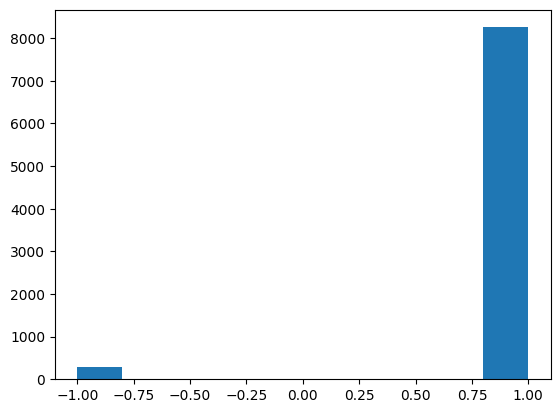

In [394]:
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor
# detector = LocalOutlierFactor(n_neighbors=5)
# detector = OneClassSVM()
detector = IsolationForest(n_estimators=300)
scores = np.zeros(len(skin_tones))
for tone in np.unique(skin_tones):
    subset = np.where(skin_tones == tone)[0]
    h = hist[subset]
#     detector = detector.fit(h)
#     tempscores = detector.score_samples(h).ravel()
#     tempscores = (tempscores - tempscores.mean())/tempscores.std()
#     tempscores =  detector.negative_outlier_factor_[:]
    
    tempscores = detector.fit_predict(h)
    scores[subset] = tempscores
plt.hist(scores)

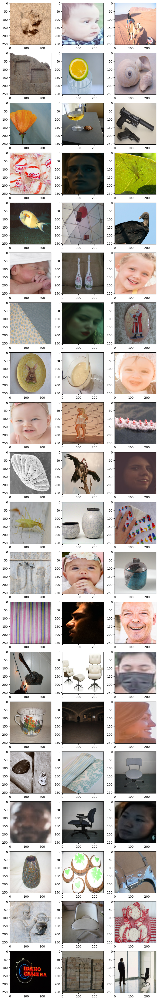

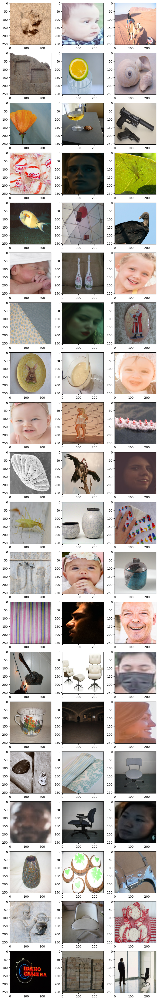

In [405]:
def plot_selection(images,rows=6,columns=3):
    fig = plt.figure(figsize=(3*columns, 3*rows))

    # setting values to rows and column variables
    for i in range(rows*columns):
        image = images[i]
        fig.add_subplot(rows, columns, i+1)
        plt.imshow(image)
        
    return fig

outliers = np.where(scores  <= -1)[0]
plot_selection(train_x[outliers],20)

In [396]:
from scipy.ndimage import rotate

class Augmentor():
    
    def __init__(self,noise_sigma=.03):
        self.noise_sigma = noise_sigma
        
    def random_range(self,min_ratio = .25, max_ratio = .9):
        return max(min(max_ratio,1.5*np.random.random()), min_ratio)
    
    def random_crop(self,img):
        ratio = self.random_range()
        crop_size = [int(img.shape[0]*ratio), int(img.shape[1]*ratio)]
        assert crop_size[0] <= img.shape[0] and crop_size[1] <= img.shape[1], "Crop size should be less than image size"
        img = img.copy()
        w, h = img.shape[:2]
        x, y = np.random.randint(h-crop_size[0]), np.random.randint(w-crop_size[1])
        img = img[y:y+crop_size[0], x:x+crop_size[1]]
        return img
    
    def random_rotation(self,img, bg_patch=(5,5)):
        assert len(img.shape) <= 3, "Incorrect image shape"
        angle = (self.random_range(.25,.75)*360 - 180)
        rgb = len(img.shape) == 3
        if rgb:
            bg_color = np.mean(img[:bg_patch[0], :bg_patch[1], :], axis=(0,1))
        else:
            bg_color = np.mean(img[:bg_patch[0], :bg_patch[1]])
        img = rotate(img, angle,reshape=False)
        mask = [img <= 0, np.any(img <= 0, axis=-1)][rgb]
        img[mask] = bg_color
        return img
    
    def gaussian_noise(self,img, mean=0):
        img = img.copy()
        noise = (np.random.normal(mean, self.noise_sigma, img.shape)*255).astype(np.uint8)
        mask_overflow_upper = img+noise >= 255
        mask_overflow_lower = img+noise < 0
        noise[mask_overflow_upper] = 255
        noise[mask_overflow_lower] = 0

        img += noise
        return img
    
    
    def color_shift(self,img):
        img = img.copy().astype(np.float32)
        for channel in [0,1,2]:
            img[channel] *= .5 + self.random_range(.1,.9)
        img = img.astype(np.uint8)
        return img
    
    def augment_image(self,img,crop=True,rotate=True,noise=True,color_shift=False):
        if crop:
            img = self.random_crop(img)
        if rotate:
            img = self.random_rotation(img)
        if noise:
            img = self.gaussian_noise(img)
        if color_shift:
            img = self.color_shift(img)
        return img
    

    def augment_images(self,images):
        return [self.augment_image(i) for i in images]
    
augmentor = Augmentor()
temp_images = augmentor.augment_images(temp_i)

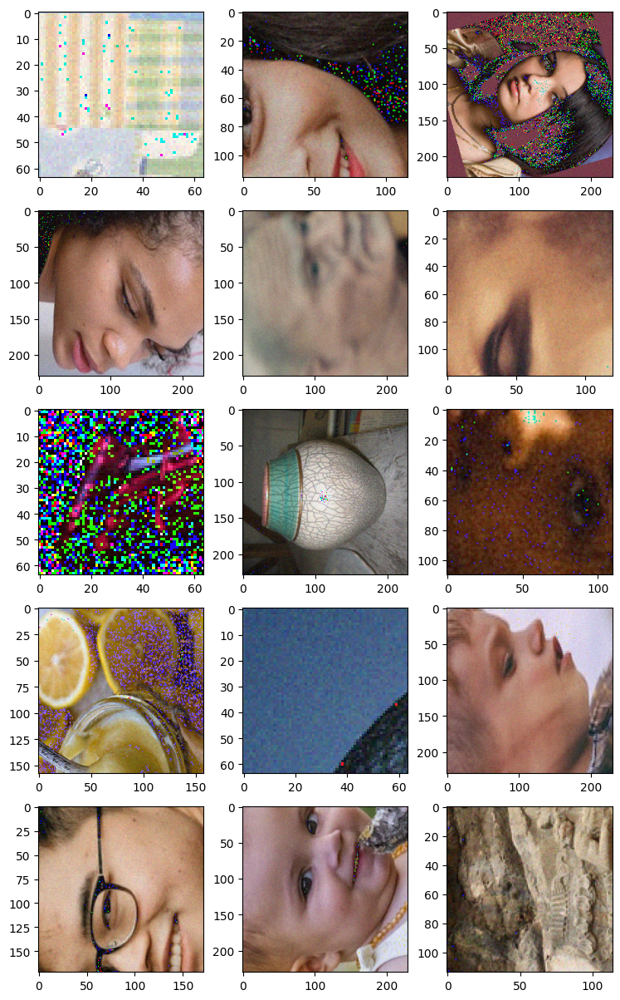

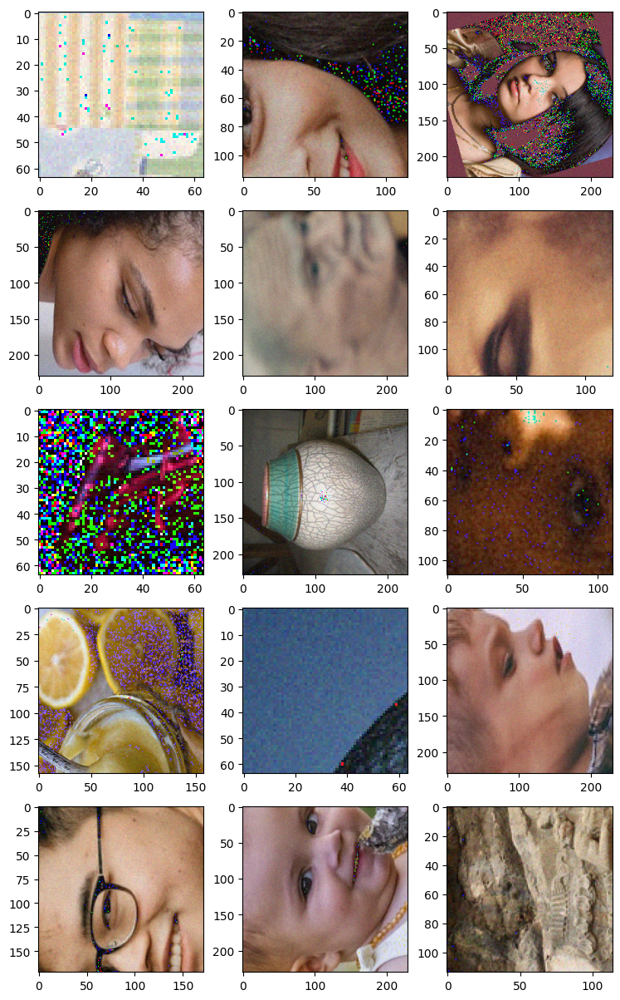

In [406]:
plot_selection(temp_images,5,3)

In [402]:
from inception_resnet_v1 import inception_resnet_v1

facenet, _ = inception_resnet_v1(temp_images)
_

TypeError: Failed to convert object of type <class 'list'> to Tensor. Contents: [array([[[159, 188, 213],
        [152, 195, 223],
        [150, 173, 228],
        ...,
        [152, 194, 228],
        [164, 183, 223],
        [158, 191, 221]],

       [[245, 225, 218],
        [246, 244, 216],
        [240, 230, 205],
        ...,
        [162, 187, 228],
        [163, 191, 217],
        [159, 196, 231]],

       [[240, 232, 219],
        [235, 227, 231],
        [241, 228, 213],
        ...,
        [150, 197, 227],
        [154, 189, 230],
        [157, 197, 230]],

       ...,

       [[159, 184, 216],
        [206, 222, 227],
        [206, 225, 216],
        ...,
        [198, 212, 168],
        [191, 207, 172],
        [182, 221, 181]],

       [[169, 197, 231],
        [195, 214, 217],
        [197, 210, 217],
        ...,
        [180, 199, 167],
        [195, 199, 163],
        [173, 199, 171]],

       [[162, 203, 202],
        [211, 210, 230],
        [202, 199, 223],
        ...,
        [198, 209, 171],
        [176, 195, 171],
        [165, 200, 167]]], dtype=uint8), array([[[ 55,  42,  23],
        [ 46,  57,  36],
        [ 53,  70,  48],
        ...,
        [ 55,  40,  31],
        [ 64,  62,  41],
        [ 55,  50,  37]],

       [[ 47,  33,  30],
        [ 50,  42,  41],
        [ 57,  40,  53],
        ...,
        [ 50,  46,  45],
        [ 42,  37,  23],
        [ 52,  48,  49]],

       [[ 41,  26,  22],
        [ 33,  31,  23],
        [ 34,  23,  34],
        ...,
        [ 37,  27,  45],
        [ 41,  36,  25],
        [ 37,  30,  29]],

       ...,

       [[169, 156, 133],
        [171, 150, 119],
        [180, 140, 130],
        ...,
        [121,  91,  69],
        [125,  73,  53],
        [103,  67,  49]],

       [[182, 167, 148],
        [183, 158, 143],
        [190, 163, 159],
        ...,
        [132,  94,  95],
        [126,  93,  58],
        [ 95,  69,  37]],

       [[195, 168, 148],
        [180, 164, 152],
        [199, 168, 165],
        ...,
        [142, 100,  75],
        [117,  82,  61],
        [111,  80,  39]]], dtype=uint8), array([[[138,  56,  75],
        [117,  58,  65],
        [115,  69,  72],
        ...,
        [129,  30,  62],
        [114,  69,  81],
        [114,  61,  71]],

       [[130,  70,  82],
        [114,  66,  69],
        [125,  62,  68],
        ...,
        [109,  53,  74],
        [121,  70,  74],
        [112,  59,  77]],

       [[124,  61,  66],
        [131,  58,  80],
        [114,  67,  75],
        ...,
        [116,  63,  60],
        [109,  62,  80],
        [129,  59,  81]],

       ...,

       [[120,  62,  74],
        [124,  78,  74],
        [124,  60,  65],
        ...,
        [117,  68,  86],
        [121,  74,  75],
        [115,  60,  74]],

       [[119,  52,  84],
        [120,  71,  70],
        [129,  56,  66],
        ...,
        [130,  71,  67],
        [112,  62,  62],
        [121,  60,  73]],

       [[127,  70,  75],
        [126,  67,  78],
        [114,  61,  79],
        ...,
        [122,  56,  75],
        [128,  60,  74],
        [125,  51,  73]]], dtype=uint8), array([[[ 14,  16,  21],
        [ 15,   2,   3],
        [ 26,  12,  29],
        ...,
        [ 55,  57,  68],
        [ 96,  84,  87],
        [104,  90,  94]],

       [[ 25,  15,  23],
        [ 26,  13,  19],
        [ 23,  26,  15],
        ...,
        [ 79,  57,  63],
        [104,  99, 106],
        [ 92,  86,  85]],

       [[ 12,  16,  10],
        [ 26,  15,  12],
        [ 12,  26,  25],
        ...,
        [ 65,  70,  55],
        [111, 100,  93],
        [116,  70,  88]],

       ...,

       [[156, 158, 168],
        [156, 158, 186],
        [162, 156, 184],
        ...,
        [205, 195, 230],
        [205, 215, 208],
        [188, 209, 210]],

       [[151, 158, 175],
        [172, 159, 174],
        [156, 152, 173],
        ...,
        [180, 206, 225],
        [196, 207, 228],
        [188, 213, 218]],

       [[155, 157, 187],
        [140, 154, 178],
        [154, 164, 174],
        ...,
        [195, 203, 218],
        [203, 204, 219],
        [212, 205, 223]]], dtype=uint8), array([[[161, 145, 123],
        [166, 128, 129],
        [155, 155, 122],
        ...,
        [163, 127,  84],
        [158, 139,  98],
        [167, 135,  99]],

       [[144, 144, 118],
        [155, 150, 133],
        [154, 135, 130],
        ...,
        [150, 132,  93],
        [162, 126,  85],
        [166, 125, 107]],

       [[152, 143, 124],
        [149, 127, 131],
        [159, 155, 135],
        ...,
        [156, 146,  87],
        [163, 128,  95],
        [173, 121,  78]],

       ...,

       [[188, 190, 160],
        [175, 191, 166],
        [165, 172, 165],
        ...,
        [168, 153, 122],
        [159, 154, 131],
        [169, 133, 133]],

       [[172, 173, 164],
        [192, 187, 169],
        [176, 185, 165],
        ...,
        [167, 146, 122],
        [157, 155, 129],
        [170, 138, 137]],

       [[173, 173, 161],
        [173, 187, 166],
        [186, 183, 164],
        ...,
        [153, 153, 130],
        [165, 150, 119],
        [173, 145, 129]]], dtype=uint8), array([[[ 91,  70,  62],
        [ 87,  73,  58],
        [ 77,  89,  54],
        ...,
        [ 90,  44,  42],
        [ 77,  53,  56],
        [ 68,  61,  42]],

       [[109,  84,  79],
        [108,  72,  61],
        [ 98,  65,  57],
        ...,
        [ 93,  69,  41],
        [ 71,  46,  54],
        [ 90,  58,  57]],

       [[108,  80,  72],
        [110,  64,  69],
        [116,  66,  67],
        ...,
        [ 89,  46,  57],
        [ 87,  57,  68],
        [ 87,  59,  63]],

       ...,

       [[ 95,  69,  57],
        [161, 111,  87],
        [193, 129,  96],
        ...,
        [240, 200, 154],
        [218, 180, 149],
        [226, 199, 166]],

       [[ 82,  58,  51],
        [174, 119,  75],
        [190, 119, 103],
        ...,
        [223, 202, 155],
        [232, 185, 159],
        [216, 191, 164]],

       [[103,  73,  63],
        [173, 104,  75],
        [180, 114,  87],
        ...,
        [214, 194, 145],
        [235, 192, 157],
        [211, 200, 160]]], dtype=uint8), array([[[246, 252,   1],
        [  9,   1,   7],
        [  3, 238,   1],
        ...,
        [ 13, 247, 241],
        [  1, 253,   3],
        [ 10,   8,   5]],

       [[  4,   9, 251],
        [ 15, 248, 255],
        [  2, 254, 253],
        ...,
        [251,   3,   2],
        [  2, 246, 251],
        [252,   6,   3]],

       [[  1,   5,   0],
        [  7,  19,   0],
        [  5,   9,   7],
        ...,
        [247, 248,   0],
        [  3,   1,   4],
        [ 21,   0, 253]],

       ...,

       [[254, 253, 255],
        [  0,   4,   3],
        [  8,  11,   0],
        ...,
        [ 12,   1,  12],
        [ 15,  15,   1],
        [252, 250, 254]],

       [[254, 248, 255],
        [250,   6, 243],
        [  2, 247,  12],
        ...,
        [  6,   3, 253],
        [  3,   7,   7],
        [  2,   6,   9]],

       [[  2, 252,   5],
        [252, 238,   6],
        [252, 245, 254],
        ...,
        [ 20,   6,   3],
        [ 11, 253,   1],
        [  6,   0,   8]]], dtype=uint8), array([[[ 51,  46,  34],
        [ 40,  58,  39],
        [ 39,  41,  51],
        ...,
        [ 72,  65,  55],
        [ 67,  70,  43],
        [ 66,  51,  56]],

       [[ 48,  53,  41],
        [ 54,  46,  51],
        [ 44,  56,  58],
        ...,
        [ 77,  67,  56],
        [ 66,  66,  62],
        [ 90,  73,  74]],

       [[ 48,  46,  47],
        [ 58,  52,  54],
        [ 47,  42,  40],
        ...,
        [104,  86,  88],
        [102,  94,  93],
        [109,  96,  80]],

       ...,

       [[ 22,  24,  34],
        [ 26,  33,  21],
        [ 22,  12,  19],
        ...,
        [ 83,  91,  83],
        [ 99,  89,  88],
        [ 82,  93,  78]],

       [[253,  24,  23],
        [ 28,  13,  32],
        [ 25,  24,  36],
        ...,
        [105, 101, 102],
        [ 97,  97,  77],
        [ 85,  77,  69]],

       [[ 13,   6,  21],
        [ 14,  12,   7],
        [ 14,  10,  13],
        ...,
        [106, 117,  93],
        [106,  99,  85],
        [ 98,  88,  88]]], dtype=uint8), array([[[ 80,  46,  10],
        [ 95,  46,  14],
        [124,  61,  19],
        ...,
        [101,  48,  19],
        [114,  52,  21],
        [ 88,  44, 254]],

       [[ 78,  34,  34],
        [ 91,  30,  10],
        [117,  59,  22],
        ...,
        [100,  47,  13],
        [ 85,  48,  15],
        [101,  45,  19]],

       [[ 86,  43,  16],
        [ 95,  45,  28],
        [ 99,  58,  37],
        ...,
        [114,  56,  27],
        [107,  49,  21],
        [104,  51,  25]],

       ...,

       [[ 57,  33,  26],
        [ 64,  32,  22],
        [ 65,  44,  37],
        ...,
        [ 60,  12,   8],
        [ 64,  51,  18],
        [ 70,  38,  12]],

       [[ 50,  20,  12],
        [ 51,  27,  12],
        [ 43,  29,  37],
        ...,
        [ 83,  42,  14],
        [ 85,  36,  14],
        [ 79,  49,  25]],

       [[ 29,   4,   7],
        [ 44,  21,  11],
        [ 39,  31,  24],
        ...,
        [ 76,  50,  39],
        [ 64,  29,  10],
        [ 57,  46,  12]]], dtype=uint8), array([[[189, 195, 230],
        [178, 187, 235],
        [197, 196, 226],
        ...,
        [150, 124,  10],
        [141, 115,   0],
        [150, 123,   4]],

       [[186, 200, 225],
        [188, 196, 222],
        [191, 186, 230],
        ...,
        [141, 112,   2],
        [161, 126, 249],
        [168, 129, 250]],

       [[183, 207, 227],
        [180, 193, 236],
        [182, 204, 234],
        ...,
        [166, 119,   8],
        [156, 137, 254],
        [163, 139, 251]],

       ...,

       [[175, 121, 252],
        [162,  95, 253],
        [160, 107,   3],
        ...,
        [144,  99,  11],
        [140,  93,  15],
        [137,  96,   5]],

       [[160, 125,   1],
        [149, 108,   8],
        [157, 104, 253],
        ...,
        [142,  98,  16],
        [147, 101,  11],
        [138, 101,  16]],

       [[156, 120,  11],
        [158, 102,  11],
        [163, 127, 253],
        ...,
        [142,  81,   4],
        [134, 102, 250],
        [131, 109,  14]]], dtype=uint8), array([[[ 65,  86, 131],
        [ 63,  81, 126],
        [ 76,  81, 118],
        ...,
        [ 75,  87, 138],
        [ 51, 105, 136],
        [ 63, 114, 129]],

       [[ 65, 112, 137],
        [ 52,  86, 115],
        [ 48,  80, 114],
        ...,
        [ 64, 106, 133],
        [ 63,  97, 129],
        [ 60,  97, 121]],

       [[ 63,  92, 126],
        [ 42, 105, 123],
        [ 60,  75, 121],
        ...,
        [ 59,  96, 147],
        [ 71,  92, 139],
        [ 66,  92, 133]],

       ...,

       [[ 55,  87, 126],
        [ 66,  97, 148],
        [ 64, 103, 128],
        ...,
        [ 53,  72,  68],
        [ 36,  44,  57],
        [ 50,  58,  83]],

       [[ 50,  87, 139],
        [ 63,  85, 133],
        [ 57,  85, 134],
        ...,
        [ 43,  72,  88],
        [ 54,  60,  93],
        [ 60,  81,  87]],

       [[ 68,  92, 142],
        [ 60,  95, 133],
        [ 71, 105, 138],
        ...,
        [ 35,  67,  90],
        [ 70,  96, 117],
        [ 31,  54,  75]]], dtype=uint8), array([[[182, 167, 178],
        [177, 175, 181],
        [172, 171, 166],
        ...,
        [178, 177, 185],
        [182, 170, 186],
        [181, 170, 181]],

       [[155, 151, 144],
        [164, 158, 151],
        [157, 149, 151],
        ...,
        [170, 185, 187],
        [192, 172, 178],
        [193, 175, 171]],

       [[176, 147, 152],
        [174, 151, 162],
        [180, 148, 154],
        ...,
        [180, 176, 189],
        [180, 166, 191],
        [192, 181, 171]],

       ...,

       [[123, 104,  83],
        [129,  90,  84],
        [133,  88,  89],
        ...,
        [ 35,  45,  41],
        [ 44,  48,  40],
        [ 22,  38,  44]],

       [[131, 111,  88],
        [140,  95,  91],
        [130,  94, 103],
        ...,
        [ 33,  51,  50],
        [ 29,  53,  68],
        [ 29,  48,  53]],

       [[130, 105, 102],
        [131, 106, 104],
        [136,  98,  81],
        ...,
        [ 36,  48,  63],
        [ 21,  44,  45],
        [ 36,  44,  42]]], dtype=uint8), array([[[ 32,  46,  19],
        [ 29,  30,  25],
        [ 34,  35,  20],
        ...,
        [201, 165, 112],
        [199, 156, 116],
        [167, 134, 116]],

       [[ 29,  26,  27],
        [ 27,  29,  25],
        [ 25,  24,  27],
        ...,
        [194, 170, 122],
        [193, 163, 115],
        [192, 147, 112]],

       [[ 25,  14,   5],
        [ 21,  38,  11],
        [ 18,  26,  18],
        ...,
        [195, 163, 120],
        [196, 156, 127],
        [193, 155, 124]],

       ...,

       [[ 59,  27,  34],
        [ 68,  40,  20],
        [ 52,  34,  26],
        ...,
        [175, 144, 110],
        [179, 158, 106],
        [202, 140, 118]],

       [[ 49,  44,  22],
        [ 67,  49,  20],
        [ 56,  42,  28],
        ...,
        [174, 129,  88],
        [185, 131, 110],
        [188, 144, 115]],

       [[ 46,  52,  22],
        [ 58,  51,  27],
        [ 63,  48,  40],
        ...,
        [170, 126, 102],
        [178, 136, 115],
        [180, 150, 111]]], dtype=uint8), array([[[188, 154, 187],
        [171, 168, 170],
        [175, 144, 157],
        ...,
        [121,  91, 112],
        [118,  75, 101],
        [121,  72,  99]],

       [[179, 154, 150],
        [175, 144, 156],
        [177, 156, 154],
        ...,
        [149, 110, 111],
        [135,  93,  99],
        [105,  82,  89]],

       [[161, 147, 163],
        [169, 153, 153],
        [182, 143, 154],
        ...,
        [172, 136, 154],
        [154, 121, 123],
        [115,  71,  92]],

       ...,

       [[127,  96,  68],
        [131,  88,  53],
        [133,  78,  66],
        ...,
        [195, 181, 184],
        [188, 180, 198],
        [186, 170, 176]],

       [[135,  83,  48],
        [120,  94,  68],
        [130,  94,  56],
        ...,
        [198, 187, 195],
        [201, 177, 195],
        [184, 175, 186]],

       [[135,  87,  56],
        [123,  83,  59],
        [139,  99,  68],
        ...,
        [198, 176, 189],
        [194, 178, 182],
        [196, 177, 193]]], dtype=uint8), array([[[ 70,  56,  22],
        [ 52,  34,  11],
        [ 40,  17,  21],
        ...,
        [137, 133, 106],
        [170, 144, 133],
        [159, 131, 119]],

       [[ 61,  62,  22],
        [ 65,  45,  46],
        [ 68,  31,  23],
        ...,
        [145, 128,  81],
        [181, 173, 135],
        [176, 150, 129]],

       [[ 60,  55,  35],
        [ 64,  63,  22],
        [ 46,  36,   7],
        ...,
        [156, 126,  96],
        [192, 172, 128],
        [176, 153, 114]],

       ...,

       [[ 26,  20,  28],
        [ 52,  11,  14],
        [ 41,  37,  26],
        ...,
        [143, 108, 102],
        [133, 136, 110],
        [145, 128, 121]],

       [[ 19,  16,  10],
        [ 39,  24,  21],
        [ 36,  16,  16],
        ...,
        [143, 117, 121],
        [136, 122, 116],
        [139, 132, 119]],

       [[ 16,  13,  16],
        [ 27,   8, 253],
        [ 46,  32,  16],
        ...,
        [138, 138, 118],
        [125, 116, 106],
        [142, 128, 122]]], dtype=uint8), array([[[ 46,  39,  10],
        [ 26,  44,  26],
        [ 32,  31,  20],
        ...,
        [ 61,  43,  30],
        [ 64,  58,  30],
        [ 60,  45,  37]],

       [[ 35,  46,  26],
        [ 31,  33,  37],
        [ 54,  41,  11],
        ...,
        [ 64,  51,  45],
        [ 62,  53,  43],
        [ 65,  58,  49]],

       [[ 40,  35,  14],
        [ 49,  29,  26],
        [ 32,  36,   9],
        ...,
        [ 67,  47,  44],
        [ 50,  69,  39],
        [ 54,  56,  32]],

       ...,

       [[ 72,  45,  29],
        [ 58,  35,  40],
        [ 49,  46,  28],
        ...,
        [110, 125,  99],
        [ 96, 127, 106],
        [ 95, 112, 105]],

       [[ 65,  34,  20],
        [ 62,  31,  21],
        [ 62,  46,  22],
        ...,
        [ 96, 124, 101],
        [ 96, 110, 108],
        [ 85, 119, 110]],

       [[ 50,  36,  16],
        [ 61,  49,  29],
        [ 52,  41,  18],
        ...,
        [ 83, 124,  87],
        [113, 110, 108],
        [103, 107,  97]]], dtype=uint8), array([[[227, 105,  11],
        [218,  86,  18],
        [215,  86,  31],
        ...,
        [209, 101,  22],
        [216, 103,  17],
        [219,  95,  14]],

       [[229,  98,  20],
        [213,  83,  28],
        [227,  86,  21],
        ...,
        [217, 105,  23],
        [217,  83,  10],
        [230,  94,  36]],

       [[207,  96,  31],
        [219,  96,  13],
        [214,  96,  18],
        ...,
        [231,  99,  18],
        [210,  92,  26],
        [216,  95,  21]],

       ...,

       [[217, 101,  22],
        [212,  90,  20],
        [217,  95,  18],
        ...,
        [217,  92,  31],
        [227,  99,  20],
        [217,  92,  22]],

       [[212,  90,  13],
        [211,  86,  14],
        [214,  97,   8],
        ...,
        [214,  91,  21],
        [233, 103,  18],
        [217, 101,  13]],

       [[229, 100,  23],
        [223, 110,  21],
        [226, 102,  21],
        ...,
        [205, 102,  30],
        [210, 102,  20],
        [216, 101,  21]]], dtype=uint8), array([[[ 84,  61,  50],
        [ 91,  73,  57],
        [ 81,  67,  39],
        ...,
        [ 87,  65,  51],
        [ 94,  66,  45],
        [ 93,  73,  37]],

       [[ 87,  63,  46],
        [ 98,  70,  47],
        [ 85,  53,  42],
        ...,
        [ 77,  75,  61],
        [ 98,  81,  54],
        [ 94,  65,  51]],

       [[ 87,  69,  51],
        [ 87,  62,  45],
        [ 89,  67,  44],
        ...,
        [ 86,  73,  54],
        [ 93,  65,  44],
        [ 99,  72,  53]],

       ...,

       [[102,  63,  27],
        [ 77,  64,  40],
        [ 86,  63,  48],
        ...,
        [ 86,  76,  46],
        [ 85,  66,  42],
        [ 91,  69,  63]],

       [[ 89,  62,  41],
        [ 88,  64,  45],
        [ 82,  62,  57],
        ...,
        [ 82,  68,  31],
        [ 80,  82,  45],
        [ 80,  62,  50]],

       [[106,  64,  50],
        [ 94,  79,  46],
        [ 92,  64,  55],
        ...,
        [ 82,  64,  51],
        [ 96,  81,  48],
        [ 97,  64,  41]]], dtype=uint8), array([[[108, 106, 219],
        [136, 107, 214],
        [186, 143, 188],
        ...,
        [119, 102, 210],
        [112, 114, 206],
        [122, 105, 209]],

       [[109, 105, 226],
        [136, 125, 216],
        [209, 158, 192],
        ...,
        [184, 126, 167],
        [175, 129, 149],
        [177, 132, 158]],

       [[114, 103, 201],
        [144, 132, 211],
        [208, 147, 181],
        ...,
        [170, 131, 144],
        [184, 132, 156],
        [174, 123, 139]],

       ...,

       [[113, 108, 216],
        [129,  95, 224],
        [128, 100, 214],
        ...,
        [164, 113, 125],
        [164, 123, 137],
        [167, 121, 126]],

       [[104, 120, 207],
        [112,  99, 214],
        [105, 103, 210],
        ...,
        [153, 121, 122],
        [167, 109, 127],
        [163, 110, 146]],

       [[116, 112, 213],
        [124, 106, 214],
        [108, 102, 213],
        ...,
        [165, 121, 138],
        [150, 124, 134],
        [167, 112, 139]]], dtype=uint8), array([[[  2, 232, 204],
        [  1, 237, 218],
        [246, 234, 214],
        ...,
        [244, 222, 215],
        [251, 236, 211],
        [252, 239, 226]],

       [[  9, 244, 216],
        [ 12, 234, 212],
        [  2, 235, 209],
        ...,
        [  1, 229, 219],
        [237, 232, 210],
        [252, 229, 225]],

       [[253, 252, 215],
        [254, 238, 209],
        [250, 245, 219],
        ...,
        [250, 232, 207],
        [246, 228, 223],
        [  0, 240, 234]],

       ...,

       [[235, 205, 177],
        [242, 185, 174],
        [236, 205, 181],
        ...,
        [222, 203, 195],
        [225, 200, 187],
        [237, 214, 205]],

       [[243, 213, 180],
        [220, 202, 182],
        [237, 210, 180],
        ...,
        [226, 203, 204],
        [228, 209, 218],
        [228, 195, 212]],

       [[232, 215, 163],
        [239, 199, 176],
        [219, 218, 180],
        ...,
        [237, 222, 207],
        [249, 224, 219],
        [247, 220, 209]]], dtype=uint8), array([[[ 46,  35,  13],
        [106,  71,  61],
        [ 93,  66,  57],
        ...,
        [ 42,  23,  12],
        [ 37,  22,  29],
        [ 40,  31,  25]],

       [[ 40,  35,  33],
        [ 85,  78,  58],
        [ 94,  74,  68],
        ...,
        [192, 176, 165],
        [183, 157, 160],
        [191, 171, 146]],

       [[ 37,  29,  27],
        [ 87,  75,  62],
        [ 81,  69,  63],
        ...,
        [205, 192, 169],
        [202, 184, 161],
        [201, 175, 160]],

       ...,

       [[ 32,  44,  31],
        [ 44,  46,  26],
        [ 46,  28,  15],
        ...,
        [107,  84,  46],
        [121,  71,  56],
        [110,  56,  61]],

       [[ 57,  47,  36],
        [ 34,  40,  35],
        [ 44,  17,  32],
        ...,
        [108,  74,  57],
        [123,  72,  52],
        [126,  58,  52]],

       [[ 43,  37,  61],
        [ 39,  41,  44],
        [ 60,  39,  41],
        ...,
        [120,  67,  54],
        [117,  79,  46],
        [112,  76,  54]]], dtype=uint8), array([[[50, 22, 25],
        [54, 24, 36],
        [50, 45, 28],
        ...,
        [60, 36, 27],
        [30, 37, 37],
        [54, 19, 26]],

       [[44, 41, 32],
        [55, 33, 21],
        [49, 44, 35],
        ...,
        [52, 43, 35],
        [58, 43, 32],
        [58, 29, 33]],

       [[51, 25, 29],
        [57, 40, 33],
        [49, 41, 14],
        ...,
        [42, 41, 36],
        [69, 47, 25],
        [51, 37, 32]],

       ...,

       [[41, 43, 30],
        [44, 30, 36],
        [70, 34, 27],
        ...,
        [52, 37, 42],
        [59, 30, 38],
        [60, 34, 26]],

       [[57, 33, 37],
        [53, 37, 42],
        [63, 40, 32],
        ...,
        [53, 41, 38],
        [68, 37, 17],
        [54, 25, 33]],

       [[72, 36, 25],
        [54, 23, 40],
        [56, 44, 36],
        ...,
        [47, 42, 22],
        [63, 43, 54],
        [60, 51, 45]]], dtype=uint8), array([[[181, 147,  88],
        [187, 160, 104],
        [197, 161, 100],
        ...,
        [148,  85,  17],
        [133,  68,  19],
        [152, 123,  65]],

       [[176, 150,  88],
        [184, 160, 121],
        [191, 159, 112],
        ...,
        [169,  95,  49],
        [127,  91,  31],
        [157, 132,  71]],

       [[172, 142, 105],
        [175, 153, 108],
        [173, 164, 113],
        ...,
        [154,  99,  46],
        [149, 102,  57],
        [183, 136,  82]],

       ...,

       [[210, 210, 213],
        [215, 212, 202],
        [204, 211, 202],
        ...,
        [ 89,  55,  34],
        [ 92,  49,  19],
        [ 89,  40,  17]],

       [[188, 205, 208],
        [197, 208, 225],
        [198, 205, 216],
        ...,
        [ 77,  42,  20],
        [ 97,  57,  33],
        [110,  52,  18]],

       [[203, 217, 229],
        [199, 200, 210],
        [192, 206, 214],
        ...,
        [132,  57,  38],
        [120,  69,  50],
        [125,  75,  62]]], dtype=uint8), array([[[252, 217, 199],
        [249, 239, 220],
        [252, 235, 231],
        ...,
        [249, 214, 197],
        [249, 219, 202],
        [242, 222, 201]],

       [[248, 238, 198],
        [239, 235, 210],
        [240, 226, 201],
        ...,
        [196, 151, 139],
        [223, 183, 151],
        [210, 181, 152]],

       [[251, 218, 210],
        [  5, 236, 230],
        [  3, 236, 214],
        ...,
        [207, 168, 134],
        [215, 180, 134],
        [213, 171, 139]],

       ...,

       [[250, 222, 197],
        [238, 232, 192],
        [238, 215, 202],
        ...,
        [226, 182, 155],
        [226, 190, 134],
        [233, 174, 142]],

       [[253, 215, 196],
        [250, 223, 207],
        [235, 218, 204],
        ...,
        [219, 162, 138],
        [237, 177, 143],
        [228, 172, 140]],

       [[  2, 235, 199],
        [  0, 230, 200],
        [232, 222, 198],
        ...,
        [223, 171, 147],
        [215, 176, 138],
        [233, 163, 142]]], dtype=uint8), array([[[175, 185, 179],
        [178, 179, 191],
        [182, 180, 187],
        ...,
        [182, 185, 191],
        [185, 188, 192],
        [179, 187, 182]],

       [[166, 180, 187],
        [202, 183, 189],
        [176, 185, 178],
        ...,
        [177, 182, 188],
        [179, 169, 195],
        [177, 187, 186]],

       [[177, 185, 181],
        [174, 186, 181],
        [172, 186, 196],
        ...,
        [171, 181, 175],
        [182, 182, 182],
        [181, 182, 192]],

       ...,

       [[182, 189, 197],
        [170, 177, 192],
        [184, 168, 179],
        ...,
        [183, 182, 195],
        [173, 183, 173],
        [175, 184, 201]],

       [[169, 178, 174],
        [186, 190, 185],
        [170, 190, 193],
        ...,
        [178, 187, 183],
        [180, 179, 195],
        [185, 179, 189]],

       [[181, 186, 188],
        [188, 191, 190],
        [181, 192, 202],
        ...,
        [175, 185, 200],
        [172, 177, 195],
        [189, 189, 188]]], dtype=uint8), array([[[ 32,  32,  35],
        [ 45,  41,  58],
        [ 50,  49,  44],
        ...,
        [ 94,  64,  76],
        [ 99,  83,  66],
        [117,  77,  58]],

       [[ 32,  26,  28],
        [ 32,  35,  40],
        [ 54,  56,  34],
        ...,
        [ 99,  64,  49],
        [106,  69,  44],
        [100,  74,  57]],

       [[ 51,  58,  43],
        [ 58,  42,  44],
        [ 54,  48,  50],
        ...,
        [100,  69,  47],
        [ 91,  76,  54],
        [ 99,  64,  54]],

       ...,

       [[ 13,  22,   9],
        [ 19,   9,   3],
        [  9,   0,  14],
        ...,
        [ 51,  37,  29],
        [ 61,  25,  33],
        [ 70,  57,  60]],

       [[ 17,  21,  35],
        [ 19,  13,  24],
        [  4,   9,   0],
        ...,
        [ 66,  48,  55],
        [ 62,  60,  56],
        [ 78,  72,  55]],

       [[ 29,  21,  28],
        [ 17,  20,  14],
        [ 12,   8,   9],
        ...,
        [ 66,  46,  49],
        [100,  76,  74],
        [ 84,  59,  60]]], dtype=uint8), array([[[ 88,  90,  92],
        [ 83,  89,  77],
        [ 70,  71,  79],
        ...,
        [ 86,  84,  91],
        [ 93,  82,  78],
        [ 81,  88,  83]],

       [[ 63,  84,  77],
        [ 69,  87,  74],
        [ 83,  78,  80],
        ...,
        [ 72,  87,  84],
        [ 90,  84,  78],
        [ 76,  89,  76]],

       [[ 89,  91,  77],
        [ 71,  73,  83],
        [ 74,  90,  75],
        ...,
        [ 78,  79,  79],
        [ 71,  80,  85],
        [ 77,  83,  82]],

       ...,

       [[ 83,  90,  75],
        [ 82,  85,  82],
        [ 71,  76,  77],
        ...,
        [ 83,  73,  86],
        [ 79,  77,  80],
        [ 84,  91,  83]],

       [[ 82,  87,  68],
        [ 88,  81,  89],
        [ 83,  82,  76],
        ...,
        [ 86, 103,  78],
        [ 75,  87,  91],
        [ 78,  75,  89]],

       [[ 61,  82,  79],
        [ 76,  80,  82],
        [ 88,  78,  90],
        ...,
        [ 76,  90,  83],
        [ 82,  95,  81],
        [ 90,  92,  80]]], dtype=uint8), array([[[ 83,  92, 108],
        [ 85,  92, 115],
        [ 85,  88, 131],
        ...,
        [ 80,  88, 110],
        [ 93,  92, 105],
        [ 78,  85, 107]],

       [[ 84, 109, 108],
        [ 77,  90, 115],
        [ 74,  97, 124],
        ...,
        [ 88,  96, 107],
        [ 81, 112, 117],
        [ 80, 105, 126]],

       [[ 70,  99, 121],
        [ 90,  99, 110],
        [ 90, 112, 111],
        ...,
        [ 88, 101, 109],
        [ 81,  84, 102],
        [ 79, 107, 122]],

       ...,

       [[ 84, 100, 114],
        [ 88,  91, 122],
        [ 73,  99, 112],
        ...,
        [ 84,  90, 115],
        [ 87,  97, 126],
        [ 93,  94, 124]],

       [[ 81, 104, 115],
        [ 74,  99, 113],
        [ 83, 105, 118],
        ...,
        [ 81, 107, 108],
        [ 77, 104, 115],
        [ 72,  98, 107]],

       [[ 70,  89, 105],
        [ 80, 101, 106],
        [ 77,  93, 115],
        ...,
        [ 93, 112, 119],
        [ 78,  83, 111],
        [ 84, 113, 108]]], dtype=uint8), array([[[223, 192, 176],
        [209, 175, 175],
        [209, 187, 184],
        ...,
        [205, 178, 184],
        [193, 180, 181],
        [212, 194, 189]],

       [[203, 192, 178],
        [208, 188, 180],
        [216, 183, 177],
        ...,
        [218, 190, 181],
        [202, 187, 178],
        [205, 194, 190]],

       [[219, 194, 188],
        [194, 184, 187],
        [218, 182, 183],
        ...,
        [208, 185, 185],
        [208, 184, 179],
        [222, 190, 183]],

       ...,

       [[217, 181, 184],
        [207, 174, 176],
        [211, 186, 190],
        ...,
        [201, 174, 185],
        [210, 182, 185],
        [215, 190, 182]],

       [[220, 173, 183],
        [209, 172, 180],
        [223, 173, 180],
        ...,
        [220, 187, 181],
        [202, 195, 187],
        [225, 176, 183]],

       [[209, 189, 180],
        [211, 190, 183],
        [205, 182, 185],
        ...,
        [217, 186, 165],
        [214, 177, 180],
        [220, 192, 170]]], dtype=uint8), array([[[182, 184, 191],
        [192, 208, 186],
        [198, 197, 195],
        ...,
        [191, 194, 181],
        [183, 186, 191],
        [197, 195, 205]],

       [[188, 179, 198],
        [188, 191, 199],
        [188, 197, 190],
        ...,
        [194, 193, 191],
        [198, 196, 186],
        [193, 195, 197]],

       [[186, 203, 198],
        [188, 187, 190],
        [189, 194, 198],
        ...,
        [185, 189, 180],
        [191, 202, 188],
        [190, 187, 198]],

       ...,

       [[194, 195, 194],
        [190, 192, 207],
        [194, 194, 210],
        ...,
        [183, 191, 184],
        [201, 194, 185],
        [201, 182, 191]],

       [[182, 190, 194],
        [186, 190, 191],
        [199, 192, 198],
        ...,
        [192, 192, 199],
        [194, 204, 182],
        [193, 207, 193]],

       [[194, 189, 194],
        [189, 186, 183],
        [194, 199, 190],
        ...,
        [194, 191, 192],
        [200, 180, 196],
        [194, 200, 205]]], dtype=uint8), array([[[  6, 253,  34],
        [  5,  15,  39],
        [ 12,   2,  42],
        ...,
        [254, 223, 201],
        [246, 212, 201],
        [  7, 221, 192]],

       [[ 17,   9,  46],
        [250, 254,  40],
        [ 10,  11,  49],
        ...,
        [  0, 224, 199],
        [254, 217, 177],
        [  0, 229, 184]],

       [[ 17, 248,  53],
        [ 15,   5,  50],
        [ 18,   4,  35],
        ...,
        [242, 224, 194],
        [  4, 215, 188],
        [246, 218, 195]],

       ...,

       [[  3,   6,  35],
        [  6, 243,  30],
        [  6,   3,  38],
        ...,
        [  7,  12,  31],
        [  9,  14,  32],
        [251, 243,  40]],

       [[ 10, 240,  32],
        [  1, 255,  40],
        [  7,   9,  42],
        ...,
        [  7,   5,   6],
        [248,  13, 253],
        [  0, 246,  22]],

       [[  8,   7,  31],
        [252,   0,  29],
        [245,  16,  34],
        ...,
        [  1,  15, 240],
        [249,  14, 254],
        [252,   8, 252]]], dtype=uint8), array([[[ 10,  12,  11],
        [ 34,  35,  25],
        [ 24,  20,  23],
        ...,
        [ 10,   5,  17],
        [ 23,  15,  21],
        [ 15,  11,   0]],

       [[  5,   7,  10],
        [ 24,   5,  32],
        [ 18,   3,  21],
        ...,
        [ 11,  17,  13],
        [ 25,   8,  13],
        [  7,  15,  14]],

       [[  2,   3, 252],
        [  8,   5,   9],
        [  6,  22,  17],
        ...,
        [ 19,  12,  21],
        [ 13,  21,  24],
        [  9,   2,  18]],

       ...,

       [[131, 106,  92],
        [117,  86,  84],
        [118,  80,  58],
        ...,
        [ 67,  54,  41],
        [ 76,  44,  38],
        [ 59,  45,  22]],

       [[113,  93,  78],
        [121,  83,  78],
        [129,  82,  72],
        ...,
        [ 57,  36,  33],
        [ 67,  50,  43],
        [ 55,  30,  37]],

       [[127,  89,  76],
        [129,  77,  78],
        [131,  94,  71],
        ...,
        [ 65,  47,  37],
        [ 60,  39,  54],
        [ 63,  43,  34]]], dtype=uint8), array([[[171, 164, 161],
        [165, 152, 136],
        [166, 155, 146],
        ...,
        [108, 112,  91],
        [112, 110,  80],
        [126, 109,  91]],

       [[183, 145, 148],
        [165, 171, 147],
        [185, 158, 145],
        ...,
        [118, 103,  87],
        [ 99, 102,  92],
        [113, 111,  98]],

       [[156, 169, 140],
        [163, 148, 155],
        [165, 158, 132],
        ...,
        [110, 107,  98],
        [127, 106,  91],
        [115, 117,  95]],

       ...,

       [[159, 149, 140],
        [164, 150, 143],
        [160, 181, 159],
        ...,
        [122, 120, 101],
        [105, 120, 109],
        [121, 116,  93]],

       [[167, 165, 161],
        [158, 155, 154],
        [158, 153, 157],
        ...,
        [106, 117, 100],
        [116, 112,  96],
        [124, 122, 107]],

       [[171, 171, 156],
        [165, 170, 145],
        [159, 153, 146],
        ...,
        [115, 116,  98],
        [107, 110, 108],
        [122, 116,  86]]], dtype=uint8), array([[[168, 135, 123],
        [107,  98,  56],
        [121, 100,  37],
        ...,
        [161, 137, 112],
        [159, 132, 121],
        [172, 132, 113]],

       [[165, 131, 123],
        [179, 169, 132],
        [162, 165, 139],
        ...,
        [155, 133, 102],
        [161, 125, 115],
        [  3,   7,   5]],

       [[174, 135, 107],
        [130, 114,  91],
        [130, 113,  95],
        ...,
        [158, 136, 110],
        [250,   0,   3],
        [  1,   7,   3]],

       ...,

       [[172, 119,  92],
        [196, 185, 154],
        [211, 219, 194],
        ...,
        [ 26,   4,   6],
        [ 13,   2,   5],
        [ 16,  21,   6]],

       [[119,  69,  53],
        [221, 207, 194],
        [195, 187, 179],
        ...,
        [ 25,   3,   1],
        [ 20,   8, 254],
        [252,   3,  11]],

       [[ 99,  37,  22],
        [ 92,  66,  49],
        [239, 212, 198],
        ...,
        [ 18,  13, 252],
        [ 12,   6,   1],
        [  4,   4,   1]]], dtype=uint8), array([[[  7,   8,   6],
        [ 17,  29,  11],
        [  9,  13,   3],
        ...,
        [238, 101, 127],
        [228,  88, 142],
        [232,  91, 132]],

       [[  6,  21, 245],
        [ 15,   1, 253],
        [  8,   6,   0],
        ...,
        [247,  83, 142],
        [252,  72, 142],
        [243,  92, 148]],

       [[  3,  14,   1],
        [ 20,   9,   6],
        [ 31,   6,   7],
        ...,
        [226,  80, 160],
        [254,  74, 140],
        [235,  66, 138]],

       ...,

       [[ 74, 104,  51],
        [ 83, 107,  73],
        [107, 105,  91],
        ...,
        [  3, 144, 192],
        [252, 134, 188],
        [  0, 107, 178]],

       [[ 83, 122,  50],
        [101, 110,  53],
        [120, 113,  82],
        ...,
        [251, 129, 196],
        [  4, 111, 185],
        [231, 128, 179]],

       [[ 62, 105,  51],
        [ 81, 101,  52],
        [100,  99,  86],
        ...,
        [ 11, 143, 219],
        [228, 122, 167],
        [  0, 176, 222]]], dtype=uint8), array([[[35, 24, 40],
        [37, 41, 31],
        [50, 37, 33],
        ...,
        [42, 37, 20],
        [58, 37, 45],
        [45, 30, 28]],

       [[43, 31, 21],
        [43, 11, 28],
        [48, 37, 30],
        ...,
        [48, 27, 23],
        [50, 43, 38],
        [46, 30, 33]],

       [[40, 31, 51],
        [38, 38, 47],
        [40, 39, 43],
        ...,
        [44, 31, 50],
        [55, 24, 35],
        [40, 45, 29]],

       ...,

       [[32, 28, 30],
        [19, 12, 32],
        [19, 34, 38],
        ...,
        [22, 28, 38],
        [44, 44, 44],
        [27, 31, 39]],

       [[24, 31, 35],
        [32, 24, 50],
        [19, 28, 30],
        ...,
        [42, 39, 32],
        [30, 30, 43],
        [34, 30, 35]],

       [[11, 17, 23],
        [26, 24, 40],
        [35, 29, 30],
        ...,
        [36, 37, 33],
        [19, 31, 25],
        [46, 20, 40]]], dtype=uint8), array([[[45, 48, 33],
        [55, 40, 31],
        [60, 49, 35],
        ...,
        [53, 39, 42],
        [55, 41, 42],
        [67, 47, 39]],

       [[52, 37, 54],
        [71, 43, 39],
        [60, 50, 43],
        ...,
        [46, 39, 32],
        [68, 52, 37],
        [52, 43, 37]],

       [[51, 48, 34],
        [54, 33, 32],
        [59, 46, 42],
        ...,
        [57, 33, 51],
        [46, 46, 39],
        [51, 49, 28]],

       ...,

       [[53, 47, 37],
        [65, 43, 54],
        [60, 47, 43],
        ...,
        [58, 44, 47],
        [52, 31, 49],
        [46, 46, 42]],

       [[42, 38, 39],
        [64, 43, 42],
        [53, 40, 32],
        ...,
        [60, 43, 40],
        [63, 35, 39],
        [45, 39, 32]],

       [[55, 45, 33],
        [56, 50, 43],
        [51, 47, 47],
        ...,
        [42, 43, 38],
        [45, 38, 45],
        [46, 43, 39]]], dtype=uint8), array([[[ 80,  73,  82],
        [ 69,  73,  95],
        [ 56,  62,  87],
        ...,
        [ 71,  63,  93],
        [ 72,  69,  94],
        [ 75,  70,  84]],

       [[ 61,  78, 101],
        [ 69,  71,  93],
        [ 72,  83,  88],
        ...,
        [ 78,  71,  86],
        [ 58,  75,  85],
        [ 63,  63,  91]],

       [[ 84,  73,  93],
        [ 62,  72, 105],
        [ 61,  65,  95],
        ...,
        [ 68,  67, 100],
        [ 64,  80,  98],
        [ 73,  71,  97]],

       ...,

       [[ 73,  78,  78],
        [ 70,  69,  91],
        [ 74,  77,  94],
        ...,
        [ 76,  71,  83],
        [ 71,  71,  83],
        [ 78,  71, 106]],

       [[ 86,  72,  90],
        [ 70,  74,  88],
        [ 82,  73,  95],
        ...,
        [ 70,  62,  81],
        [ 63,  78, 102],
        [ 73,  63,  82]],

       [[ 56,  66,  81],
        [ 62,  71,  92],
        [ 71,  75,  97],
        ...,
        [ 57,  71,  92],
        [ 68,  83,  88],
        [ 68,  76,  84]]], dtype=uint8), array([[[43, 31, 26],
        [51, 22,  5],
        [43, 37, 14],
        ...,
        [40, 29, 31],
        [44, 35, 21],
        [41, 21, 29]],

       [[18, 20, 23],
        [23, 41, 27],
        [38, 16, 14],
        ...,
        [37, 10, 18],
        [44, 35, 30],
        [20, 16, 37]],

       [[52, 27, 19],
        [38, 32,  9],
        [36, 36, 28],
        ...,
        [29, 31, 23],
        [41, 36, 22],
        [32, 43, 15]],

       ...,

       [[40, 27, 31],
        [47, 21, 20],
        [47, 35, 16],
        ...,
        [29, 31, 13],
        [29, 37, 20],
        [32, 30, 14]],

       [[59, 26, 14],
        [58, 21, 27],
        [32, 22, 12],
        ...,
        [35, 31, 11],
        [36, 27, 11],
        [43, 24, 26]],

       [[38, 31, 27],
        [31, 22, 31],
        [34, 20, 21],
        ...,
        [34, 34, 29],
        [30, 40, 28],
        [38, 24, 22]]], dtype=uint8), array([[[175, 133, 135],
        [182, 144, 136],
        [187, 143, 133],
        ...,
        [188, 151, 135],
        [182, 157, 125],
        [182, 151, 134]],

       [[174, 145, 137],
        [180, 138, 136],
        [185, 143, 140],
        ...,
        [190, 133, 131],
        [179, 140, 136],
        [173, 152, 128]],

       [[177, 134, 156],
        [183, 153, 127],
        [182, 127, 129],
        ...,
        [182, 143, 127],
        [176, 149, 139],
        [170, 133, 147]],

       ...,

       [[181, 162, 134],
        [192, 144, 134],
        [187, 141, 134],
        ...,
        [189, 156, 137],
        [181, 157, 145],
        [187, 144, 132]],

       [[190, 147, 129],
        [178, 141, 125],
        [173, 133, 126],
        ...,
        [189, 144, 135],
        [176, 152, 140],
        [187, 133, 135]],

       [[174, 126, 127],
        [184, 140, 140],
        [183, 133, 137],
        ...,
        [181, 131, 147],
        [182, 156, 144],
        [182, 147, 119]]], dtype=uint8), array([[[21, 26, 11],
        [36, 24, 19],
        [11,  5, 19],
        ...,
        [12, 15, 12],
        [17, 15, 16],
        [23,  9, 12]],

       [[ 5, 13, 18],
        [ 3, 17,  9],
        [20, 30, 24],
        ...,
        [23, 20, 14],
        [ 6,  8,  0],
        [27, 26, 21]],

       [[17, 22, 17],
        [ 6, 25,  2],
        [17, 29, 15],
        ...,
        [21, 22, 10],
        [19, 20, 21],
        [26, 15, 26]],

       ...,

       [[17, 25, 13],
        [25,  0, 14],
        [10, 26,  8],
        ...,
        [15, 18,  8],
        [19, 18, 13],
        [12, 18,  7]],

       [[14, 16, 22],
        [22, 13, 16],
        [44, 21, 24],
        ...,
        [10, 38, 21],
        [ 0, 26, 16],
        [28,  1,  8]],

       [[41, 10, 10],
        [30, 14, 20],
        [13, 16, 12],
        ...,
        [12,  0, 17],
        [20, 16, 11],
        [17, 15,  4]]], dtype=uint8), array([[[154, 172, 149],
        [163, 159, 167],
        [180, 170, 175],
        ...,
        [156, 164, 168],
        [166, 146, 164],
        [157, 157, 142]],

       [[139, 148, 154],
        [162, 168, 153],
        [ 83,  96,  94],
        ...,
        [171, 182, 184],
        [157, 171, 152],
        [102, 112, 112]],

       [[143, 155, 136],
        [103, 105, 123],
        [137, 161, 156],
        ...,
        [103,  92, 115],
        [159, 182, 154],
        [172, 157, 191]],

       ...,

       [[121, 125, 131],
        [156, 162, 176],
        [143, 143, 138],
        ...,
        [142, 155, 146],
        [105,  95, 105],
        [109, 116, 131]],

       [[132, 136, 137],
        [129, 140, 143],
        [ 97, 101, 105],
        ...,
        [138, 146, 164],
        [115, 120, 115],
        [132, 132, 163]],

       [[125, 122, 115],
        [121, 126, 115],
        [ 95, 114, 106],
        ...,
        [107, 119, 146],
        [194, 206, 169],
        [ 95, 104, 102]]], dtype=uint8), array([[[ 83,  67,   9],
        [ 54,  27,  23],
        [ 43,  39,  27],
        ...,
        [129,  65,  44],
        [142,  64,  46],
        [127,  73,  65]],

       [[ 56,  36,   9],
        [ 47,  29,  43],
        [ 36,  30,  11],
        ...,
        [117,  72,  60],
        [133,  65,  50],
        [139,  70,  65]],

       [[ 47,  30,  14],
        [ 36,  37,  31],
        [ 30,  17,  24],
        ...,
        [131,  67,  49],
        [116,  68,  47],
        [140,  78,  66]],

       ...,

       [[100,  72, 252],
        [ 93,  75,  13],
        [103,  66,   7],
        ...,
        [131,  97, 247],
        [107,  95,   0],
        [127, 100,   9]],

       [[ 86,  74,   2],
        [104,  99, 247],
        [ 92,  73,   2],
        ...,
        [143,  91,   5],
        [140,  82,   8],
        [125,  90, 247]],

       [[108,  69,   4],
        [111,  82,   1],
        [102,  68,  10],
        ...,
        [132, 100,   0],
        [110,  81, 254],
        [126,  77, 247]]], dtype=uint8), array([[[213, 223, 230],
        [199, 224, 215],
        [214, 236, 236],
        ...,
        [229, 239, 234],
        [217, 240, 238],
        [228,   0, 235]],

       [[202, 224, 225],
        [199, 221, 226],
        [204, 244, 232],
        ...,
        [233, 252, 238],
        [217, 230, 242],
        [225, 233, 234]],

       [[215, 235, 234],
        [204, 222, 234],
        [204, 236, 229],
        ...,
        [234, 248, 229],
        [233, 247, 241],
        [212, 245, 248]],

       ...,

       [[  6,  12,  13],
        [253,   7, 248],
        [ 24,  13, 251],
        ...,
        [ 34,  44,  56],
        [ 52,  43,  58],
        [ 45,  37,  62]],

       [[ 10,  21,   3],
        [  6, 249, 253],
        [  0,  10,  21],
        ...,
        [ 41,  41,  59],
        [ 47,  43,  44],
        [ 20,  48,  54]],

       [[  6, 248,  28],
        [  0,   7,  11],
        [  9,  10,  14],
        ...,
        [ 46,  38,  52],
        [ 40,  37,  61],
        [ 43,  42,  51]]], dtype=uint8), array([[[241, 248, 243],
        [233, 240, 239],
        [226, 245, 246],
        ...,
        [222, 213, 215],
        [228, 228, 234],
        [219, 231, 216]],

       [[244, 236, 236],
        [245, 244, 235],
        [247,   5, 241],
        ...,
        [214, 212, 217],
        [217, 223, 227],
        [228, 221, 235]],

       [[248, 222, 246],
        [241, 232, 245],
        [254, 248, 239],
        ...,
        [217, 226, 218],
        [227, 223, 215],
        [219, 225, 224]],

       ...,

       [[241, 233, 230],
        [246, 241, 233],
        [235, 243, 223],
        ...,
        [161, 149, 143],
        [182, 145, 138],
        [156, 138, 125]],

       [[227, 245, 230],
        [243, 232, 238],
        [237, 241, 235],
        ...,
        [160, 158, 147],
        [162, 147, 150],
        [165, 144, 135]],

       [[237, 240, 236],
        [231, 229, 231],
        [247, 231, 235],
        ...,
        [181, 173, 156],
        [172, 155, 150],
        [168, 163, 139]]], dtype=uint8), array([[[107, 131,  35],
        [111, 131,  41],
        [130, 125,  52],
        ...,
        [ 71,  83,  36],
        [ 55,  71,  29],
        [ 82,  86,  50]],

       [[108, 119,  42],
        [ 98, 121,  35],
        [ 90, 131,  38],
        ...,
        [ 67,  72,  32],
        [ 60,  75,  41],
        [ 59,  89,  39]],

       [[ 92, 125,  41],
        [ 87, 109,  39],
        [113, 116,  36],
        ...,
        [ 63,  81,  38],
        [ 61,  71,  29],
        [ 53,  84,  37]],

       ...,

       [[ 65,  85,  34],
        [ 57,  64,  18],
        [ 59,  62,  24],
        ...,
        [ 27,  20,  23],
        [ 20,   9,  19],
        [ 22,  22,  15]],

       [[ 63,  65,  36],
        [ 60,  51,  17],
        [ 59,  64,  32],
        ...,
        [ 24,  25,  21],
        [ 31,  22,  17],
        [ 21,  16,   7]],

       [[ 70,  75,   9],
        [ 46,  75,  12],
        [ 58,  66,  33],
        ...,
        [ 22,  14,  26],
        [ 40,   8,  17],
        [ 28,  23,  29]]], dtype=uint8), array([[[ 33,  67, 248],
        [178, 192, 159],
        [151, 191, 158],
        ...,
        [ 42,  67,   7],
        [ 41,  61,  12],
        [ 46,  47,   7]],

       [[ 31,  56,  12],
        [163, 171, 163],
        [171, 193, 197],
        ...,
        [204, 207, 156],
        [226, 219, 149],
        [215, 201, 131]],

       [[ 38,  61,   6],
        [184, 174, 164],
        [175, 191, 195],
        ...,
        [228, 231, 168],
        [212, 220, 163],
        [237, 236, 156]],

       ...,

       [[ 46,  68,   7],
        [ 50,  69,  18],
        [ 39,  61,  16],
        ...,
        [119,  99,  96],
        [129, 115, 104],
        [125,  95,  84]],

       [[ 50,  73,  19],
        [ 47,  76,  15],
        [ 60,  66,  25],
        ...,
        [124, 114,  95],
        [132, 122, 107],
        [113,  96,  83]],

       [[ 44,  79,   9],
        [ 46,  59,   7],
        [ 46,  58,  14],
        ...,
        [144, 119, 142],
        [129, 106, 101],
        [115,  79,  79]]], dtype=uint8), array([[[  2, 157, 108],
        [245, 163, 115],
        [248, 177, 134],
        ...,
        [212, 159, 117],
        [195, 145, 109],
        [202, 149, 119]],

       [[  5, 140, 109],
        [253, 158, 118],
        [248, 178, 136],
        ...,
        [198, 152, 118],
        [196, 142, 114],
        [193, 142, 109]],

       [[249, 156, 104],
        [250, 164, 129],
        [253, 169, 147],
        ...,
        [209, 144, 126],
        [200, 140, 100],
        [191, 126,  90]],

       ...,

       [[  4, 108,  21],
        [254, 103,  46],
        [253, 116,  41],
        ...,
        [ 51,  55,  59],
        [ 64,  32,  56],
        [ 67,  42,  65]],

       [[239, 104,  19],
        [246, 102,  44],
        [235, 103,  44],
        ...,
        [ 70,  47,  46],
        [ 55,  41,  52],
        [ 38,  52,  63]],

       [[232,  89,  26],
        [239, 110,  20],
        [236,  98,  44],
        ...,
        [ 48,  39,  69],
        [ 52,  31,  55],
        [ 43,  53,  45]]], dtype=uint8), array([[[222, 197, 216],
        [242, 214, 208],
        [221, 206, 229],
        ...,
        [236, 220, 208],
        [233, 209, 225],
        [242, 223, 216]],

       [[236, 219, 230],
        [228, 219, 206],
        [236, 211, 216],
        ...,
        [230, 220, 215],
        [233, 207, 231],
        [237, 221, 209]],

       [[230, 212, 225],
        [242, 220, 235],
        [239, 214, 204],
        ...,
        [236, 206, 216],
        [241, 211, 227],
        [233, 213, 213]],

       ...,

       [[233, 209, 204],
        [233, 207, 224],
        [245, 219, 212],
        ...,
        [242, 207, 219],
        [243, 209, 220],
        [237, 218, 217]],

       [[246, 210, 210],
        [236, 222, 218],
        [222, 223, 207],
        ...,
        [246, 212, 222],
        [227, 210, 226],
        [243, 207, 224]],

       [[228, 208, 237],
        [248, 203, 221],
        [240, 221, 212],
        ...,
        [235, 219, 203],
        [234, 222, 222],
        [236, 213, 216]]], dtype=uint8), array([[[125,  12,  32],
        [119,  20,  38],
        [105, 243,  19],
        ...,
        [193, 146, 139],
        [215, 180, 152],
        [206, 190, 174]],

       [[128,   8,  22],
        [118,   6,  37],
        [109, 254,  18],
        ...,
        [208, 168, 154],
        [187, 163, 139],
        [200, 163, 143]],

       [[114,  17,  30],
        [108,   9,  19],
        [122,   0,  25],
        ...,
        [210, 181, 148],
        [212, 170, 153],
        [215, 161, 152]],

       ...,

       [[193, 173, 144],
        [197, 170, 149],
        [192, 181, 155],
        ...,
        [ 66,  38,  24],
        [ 70,  16,  35],
        [ 68,  44,  29]],

       [[184, 169, 139],
        [195, 166, 150],
        [187, 187, 153],
        ...,
        [ 76,  12,  24],
        [ 62,   5,  21],
        [ 66,  26,  39]],

       [[195, 166, 137],
        [185, 171, 139],
        [190, 161, 139],
        ...,
        [ 72,  18,   5],
        [ 59,  19,  17],
        [ 52,  20,  16]]], dtype=uint8), array([[[171, 126, 104],
        [174, 132,  96],
        [174, 136,  93],
        ...,
        [178, 120,  91],
        [179, 130, 105],
        [168, 124, 102]],

       [[172, 126,  84],
        [186, 132, 100],
        [179, 139,  90],
        ...,
        [162, 140,  97],
        [176, 116,  87],
        [168, 129, 108]],

       [[174, 134,  87],
        [172, 136,  99],
        [165, 118,  88],
        ...,
        [189, 131,  98],
        [171, 122, 114],
        [177, 134, 102]],

       ...,

       [[160, 133,  98],
        [187, 135, 103],
        [195, 127,  80],
        ...,
        [170, 134,  92],
        [182, 129,  96],
        [184, 134,  86]],

       [[174, 125,  93],
        [177, 127,  88],
        [157, 120,  93],
        ...,
        [177, 128,  88],
        [183, 149,  94],
        [175, 148,  94]],

       [[159, 124,  74],
        [181, 128,  87],
        [181, 134,  88],
        ...,
        [183, 143, 102],
        [187, 142,  92],
        [177, 144,  92]]], dtype=uint8), array([[[41, 57, 28],
        [59, 43, 55],
        [63, 52, 47],
        ...,
        [53, 49, 30],
        [61, 43, 33],
        [59, 45, 25]],

       [[56, 55, 53],
        [56, 47, 66],
        [47, 45, 43],
        ...,
        [62, 44, 25],
        [57, 30, 33],
        [56, 37, 17]],

       [[61, 53, 40],
        [59, 57, 59],
        [56, 54, 44],
        ...,
        [30, 40, 20],
        [56, 30, 34],
        [60, 38, 31]],

       ...,

       [[18, 12, 25],
        [33, 29, 28],
        [28, 16, 37],
        ...,
        [11, 23, 21],
        [24, 24, 10],
        [ 7,  8, 29]],

       [[26, 23, 29],
        [25, 24, 24],
        [27, 26, 31],
        ...,
        [17, 22, 18],
        [20,  7, 19],
        [ 8, 11, 13]],

       [[10, 20, 17],
        [21, 26, 28],
        [32, 35, 23],
        ...,
        [ 5, 17, 38],
        [16, 14, 24],
        [13, 15, 13]]], dtype=uint8), array([[[204, 220, 199],
        [211, 198, 208],
        [206, 214, 212],
        ...,
        [196, 200, 221],
        [208, 213, 219],
        [214, 209, 204]],

       [[206, 218, 207],
        [196, 213, 224],
        [204, 216, 215],
        ...,
        [208, 221, 204],
        [204, 203, 215],
        [194, 209, 217]],

       [[205, 194, 217],
        [212, 214, 208],
        [215, 202, 200],
        ...,
        [206, 225, 204],
        [208, 198, 203],
        [201, 215, 214]],

       ...,

       [[205, 198, 205],
        [207, 208, 195],
        [212, 209, 199],
        ...,
        [202, 205, 208],
        [220, 202, 220],
        [211, 210, 214]],

       [[208, 211, 203],
        [218, 205, 220],
        [220, 216, 201],
        ...,
        [208, 210, 203],
        [208, 216, 203],
        [220, 201, 224]],

       [[204, 219, 198],
        [212, 207, 210],
        [211, 208, 194],
        ...,
        [198, 209, 210],
        [209, 212, 202],
        [205, 213, 218]]], dtype=uint8), array([[[ 25,  15,  10],
        [ 14,  16,  14],
        [ 16,  13,   5],
        ...,
        [ 14,  17,   8],
        [ 20,  14,  14],
        [ 20,  14,  12]],

       [[ 12,  24,  13],
        [ 16,  26,  14],
        [ 18,  22,  15],
        ...,
        [ 12,   7,   9],
        [ 14,   9,   9],
        [  7,  11,   8]],

       [[ 28,   7,   9],
        [ 17,  28,  11],
        [ 28,  10,   2],
        ...,
        [ 11,  13,  15],
        [  6,  28,  15],
        [253,  18,  14]],

       ...,

       [[ 24,  12,  34],
        [ 16,   1,  15],
        [ 15,  27,   3],
        ...,
        [ 25,  37,  37],
        [ 42,  39,  43],
        [ 35,  23,  30]],

       [[ 24,  14,  13],
        [ 16,  13,   9],
        [ 16,  22,  11],
        ...,
        [ 31,  27,  23],
        [ 24,   0,  16],
        [ 44,  40,  28]],

       [[ 35,  18,  29],
        [ 10,   0,   6],
        [ 25,   5,  17],
        ...,
        [ 37,  40,  41],
        [ 28,  49,  21],
        [ 23,  20,  21]]], dtype=uint8), array([[[  6,  10,  12],
        [ 40,  16,  10],
        [ 22,  13,  14],
        ...,
        [ 12,   0,   7],
        [ 22,   2,  10],
        [  3,  24,  13]],

       [[ 25,  14,  27],
        [ 17,   8,  14],
        [ 21,  15,  15],
        ...,
        [ 18,   6,  18],
        [  8,  12,  13],
        [ 22,  17,   2]],

       [[ 21,   1,   9],
        [ 23,  16,  13],
        [ 16,  12,   5],
        ...,
        [ 20,  11,  18],
        [  9,  11,  21],
        [ 22, 252,  15]],

       ...,

       [[ 18,  24,  16],
        [ 28,   9,   5],
        [ 24,   7,   6],
        ...,
        [ 28,  21,   9],
        [ 25,  12,  21],
        [ 19,  20,   2]],

       [[ 15,   7,   4],
        [ 19,   5,  14],
        [ 17,  13,  33],
        ...,
        [ 21,  11,  13],
        [ 27,  15,   9],
        [ 26,  21,  21]],

       [[ 23,   9,   3],
        [ 27,  15,  10],
        [ 32,  15,  14],
        ...,
        [ 21,   8,   7],
        [ 19,  13,  12],
        [ 25,  20,  11]]], dtype=uint8), array([[[119,  84,  68],
        [120,  92,  65],
        [126,  81,  63],
        ...,
        [ 55,  49,  38],
        [ 67,  53,  35],
        [105,  89,  63]],

       [[121,  84,  69],
        [127,  91,  69],
        [131,  91,  76],
        ...,
        [ 32,  41,  29],
        [ 62,  40,  34],
        [ 94,  74,  59]],

       [[127,  98,  61],
        [107,  96,  64],
        [126, 103,  66],
        ...,
        [ 44,  52,  21],
        [ 67,  46,  14],
        [ 78,  72,  54]],

       ...,

       [[130, 158, 189],
        [112, 172, 178],
        [118, 160, 164],
        ...,
        [ 71,  35,  13],
        [ 52,  33,  26],
        [ 81,  58,  28]],

       [[119, 163, 177],
        [131, 166, 186],
        [140, 159, 185],
        ...,
        [ 60,  45,  19],
        [ 60,  26,  21],
        [ 56,  37,  29]],

       [[112, 147, 167],
        [146, 182, 193],
        [143, 188, 190],
        ...,
        [ 61,  27,  25],
        [ 61,  34,  17],
        [ 51,  32,  17]]], dtype=uint8), array([[[140, 108,  79],
        [139,  94,  85],
        [133,  97,  91],
        ...,
        [153, 102,  83],
        [141, 101,  77],
        [143, 104,  67]],

       [[142, 110,  88],
        [146, 118,  65],
        [141, 101,  89],
        ...,
        [165, 102,  87],
        [144,  89,  77],
        [133, 104,  85]],

       [[137, 106,  68],
        [144, 116,  92],
        [158, 111,  86],
        ...,
        [148, 120,  95],
        [138, 105,  93],
        [132, 103,  78]],

       ...,

       [[141,  96,  88],
        [120, 111,  95],
        [147, 110,  85],
        ...,
        [145,  98,  79],
        [147, 112,  76],
        [138, 114,  77]],

       [[132, 107,  75],
        [138,  96,  88],
        [134, 100,  80],
        ...,
        [153, 104,  91],
        [139,  92,  76],
        [156, 114,  88]],

       [[132,  98,  90],
        [143, 107,  69],
        [143,  89,  77],
        ...,
        [149,  99, 101],
        [136,  86,  74],
        [138, 107,  97]]], dtype=uint8), array([[[ 29,  30,  32],
        [ 34,  25,  30],
        [ 41,  31,  50],
        ...,
        [167, 162, 170],
        [175, 174, 172],
        [164, 179, 172]],

       [[ 35,  24,  25],
        [ 43,  42,  39],
        [ 16,  23,  12],
        ...,
        [166, 161, 158],
        [172, 172, 156],
        [163, 158, 177]],

       [[ 28,   7,  25],
        [ 42,  37,  43],
        [ 11,  14,   3],
        ...,
        [174, 175, 172],
        [165, 179, 171],
        [167, 171, 163]],

       ...,

       [[239, 236, 227],
        [229, 225, 244],
        [224, 219, 235],
        ...,
        [203, 210, 206],
        [172, 175, 178],
        [129, 119, 126]],

       [[235, 235, 234],
        [227, 224, 236],
        [236, 232, 233],
        ...,
        [194, 202, 196],
        [160, 170, 166],
        [128, 121, 145]],

       [[238, 221, 236],
        [229, 230, 237],
        [249, 237, 240],
        ...,
        [192, 198, 200],
        [175, 172, 162],
        [138, 145, 137]]], dtype=uint8), array([[[ 44,  38,  29],
        [ 54,  40,  49],
        [ 68,  54,  44],
        ...,
        [224, 150, 124],
        [  6,   2, 253],
        [ 31,  13,   2]],

       [[ 50,  51,  40],
        [ 59,  46,  45],
        [ 65,  55,  48],
        ...,
        [ 52,  49,  32],
        [ 46,  48,  37],
        [ 41,  46,   3]],

       [[ 55,  36,  45],
        [ 59,  37,  47],
        [ 67,  28,  42],
        ...,
        [105, 104, 109],
        [107,  91,  79],
        [ 53,  63,  17]],

       ...,

       [[224, 147, 126],
        [253, 177, 128],
        [  2, 176, 126],
        ...,
        [250,  41,  41],
        [  5,  41,  52],
        [  3,  39,  60]],

       [[214, 130, 102],
        [217, 153, 117],
        [244, 177, 144],
        ...,
        [ 11,  27,  48],
        [253,  52,  59],
        [ 10,  40,  56]],

       [[223, 153, 109],
        [235, 137, 102],
        [208, 146, 110],
        ...,
        [  9,  42,  44],
        [247,  39,  30],
        [  5,  48,  49]]], dtype=uint8), array([[[184, 180, 173],
        [177, 177, 188],
        [175, 173, 183],
        ...,
        [172, 157, 214],
        [156, 133, 212],
        [129, 119, 193]],

       [[176, 148, 175],
        [171, 169, 169],
        [187, 171, 192],
        ...,
        [246, 252,   4],
        [  3, 250, 254],
        [245, 242,  16]],

       [[160, 155, 172],
        [188, 169, 198],
        [191, 171, 178],
        ...,
        [161, 178, 177],
        [164, 151, 171],
        [143, 156, 166]],

       ...,

       [[178, 172, 194],
        [174, 171, 180],
        [175, 175, 183],
        ...,
        [236, 242, 253],
        [234,   1, 245],
        [237, 249, 254]],

       [[171, 163, 190],
        [197, 153, 183],
        [178, 173, 166],
        ...,
        [239,   0, 249],
        [220, 245,   2],
        [242, 250, 254]],

       [[161, 158, 175],
        [182, 168, 179],
        [184, 170, 180],
        ...,
        [228,   0, 244],
        [237, 247, 251],
        [242, 250, 248]]], dtype=uint8), array([[[ 17,   1,  15],
        [ 14,   3,  16],
        [ 14,   6,  27],
        ...,
        [ 17, 254,  41],
        [ 21,   0,  28],
        [ 19, 252,  20]],

       [[ 21, 251,  23],
        [  5, 254,  12],
        [  4,   8,  20],
        ...,
        [ 97,  70,  66],
        [101,  64,  68],
        [ 97,  69,  67]],

       [[ 16,  12,  24],
        [  4,   5,  20],
        [  4,   2,  34],
        ...,
        [ 89,  69,  68],
        [118,  63,  81],
        [ 98,  75,  65]],

       ...,

       [[ 39,   6,  36],
        [ 24, 246,  22],
        [ 29, 246,  31],
        ...,
        [ 43,  26,  45],
        [ 59,  28,  49],
        [ 89,  41,  73]],

       [[ 18,   8,  26],
        [ 23,   0,  28],
        [  8, 246,  47],
        ...,
        [ 51,  37,  50],
        [ 68,  35,  54],
        [ 64,  39,  66]],

       [[ 29,   3,  27],
        [ 12, 249,  40],
        [ 18,  17,  33],
        ...,
        [ 57,  22,  39],
        [ 51,  30,  60],
        [ 76,  34,  53]]], dtype=uint8), array([[[32, 36, 28],
        [26, 25, 15],
        [32, 18,  2],
        ...,
        [40, 33, 16],
        [27, 21, 26],
        [31, 27, 20]],

       [[40, 19,  9],
        [15, 16,  5],
        [40, 24, 21],
        ...,
        [27, 19, 16],
        [25, 13, 17],
        [20, 19,  6]],

       [[38, 12, 23],
        [34,  7, 23],
        [33, 27, 12],
        ...,
        [30, 35, 16],
        [36, 27, 13],
        [29, 26, 24]],

       ...,

       [[44, 19,  5],
        [34, 16, 19],
        [33, 16, 31],
        ...,
        [27,  6, 25],
        [28, 18, 17],
        [31, 27, 11]],

       [[28, 20, 14],
        [43, 25, 17],
        [33, 28, 29],
        ...,
        [33, 14, 18],
        [33, 24, 11],
        [25, 16, 20]],

       [[31, 27, 26],
        [34, 24, 22],
        [25, 25, 15],
        ...,
        [35, 21, 20],
        [39, 19, 25],
        [27, 29, 12]]], dtype=uint8), array([[[55, 46, 32],
        [48, 43, 25],
        [48, 34, 34],
        ...,
        [49, 41, 25],
        [48, 39, 27],
        [43, 41, 36]],

       [[58, 27, 27],
        [55, 41, 27],
        [31, 37, 22],
        ...,
        [48, 47, 43],
        [48, 33, 23],
        [48, 45, 22]],

       [[46, 37, 25],
        [46, 35, 22],
        [56, 41, 32],
        ...,
        [48, 37, 31],
        [53, 47, 28],
        [41, 37, 14]],

       ...,

       [[51, 35, 27],
        [44, 32, 18],
        [56, 38, 34],
        ...,
        [52, 35, 38],
        [44, 25, 33],
        [57, 33, 18]],

       [[46, 33, 31],
        [55, 37, 34],
        [43, 33, 31],
        ...,
        [40, 24, 20],
        [46, 31, 40],
        [44, 47, 23]],

       [[53, 37, 28],
        [44, 39, 15],
        [52, 52, 34],
        ...,
        [45, 45, 24],
        [48, 46, 23],
        [44, 41, 25]]], dtype=uint8), array([[[150, 120, 110],
        [151, 121, 118],
        [143, 110, 110],
        ...,
        [165, 114, 114],
        [208, 159, 162],
        [214, 176, 166]],

       [[208, 171, 168],
        [214, 180, 169],
        [235, 175, 176],
        ...,
        [173, 145, 131],
        [210, 157, 154],
        [219, 163, 166]],

       [[221, 176, 157],
        [225, 186, 169],
        [221, 180, 174],
        ...,
        [198, 146, 143],
        [215, 176, 161],
        [243, 185, 164]],

       ...,

       [[142, 114, 111],
        [120,  64,  61],
        [118,  76,  52],
        ...,
        [189, 160, 145],
        [195, 147, 147],
        [194, 133, 142]],

       [[152, 116,  98],
        [111,  75,  61],
        [106,  68,  60],
        ...,
        [204, 162, 141],
        [176, 153, 141],
        [195, 132, 156]],

       [[151, 120, 117],
        [104,  56,  64],
        [113,  64,  68],
        ...,
        [190, 147, 136],
        [194, 138, 144],
        [184, 138, 135]]], dtype=uint8), array([[[109, 107, 115],
        [117, 107, 113],
        [100, 109, 126],
        ...,
        [108,  88, 112],
        [111, 114, 125],
        [106, 114, 114]],

       [[105, 120, 113],
        [103, 113, 101],
        [106, 120, 109],
        ...,
        [104, 114, 116],
        [111, 114, 131],
        [123, 116, 104]],

       [[110, 103, 110],
        [102, 103, 127],
        [ 99, 100, 114],
        ...,
        [114, 106, 106],
        [116, 109, 112],
        [118, 113, 117]],

       ...,

       [[109, 112, 111],
        [113, 125, 115],
        [107, 119, 116],
        ...,
        [ 85, 124, 108],
        [106,  92, 126],
        [113, 115, 118]],

       [[101, 105, 115],
        [107, 112, 113],
        [118, 119, 115],
        ...,
        [107, 103, 114],
        [119, 114, 114],
        [107, 110, 122]],

       [[119, 107, 117],
        [ 99, 114, 132],
        [111, 111, 114],
        ...,
        [107, 100, 114],
        [111, 113, 116],
        [110, 112, 123]]], dtype=uint8), array([[[160, 155, 186],
        [108, 114, 140],
        [155, 173, 177],
        ...,
        [ 91,  63,  20],
        [163,  98,  42],
        [161, 121,  42]],

       [[148, 153, 165],
        [157, 148, 181],
        [162, 170, 184],
        ...,
        [ 78,  64, 250],
        [168, 111,  31],
        [172, 109,  25]],

       [[118, 108,  97],
        [158, 165, 195],
        [158, 150, 186],
        ...,
        [ 82,  70,  12],
        [130,  85,   4],
        [152,  85,  32]],

       ...,

       [[104,  95, 105],
        [184, 193, 202],
        [153, 153, 169],
        ...,
        [104,  94,   6],
        [111,  71,   8],
        [101,  53,  32]],

       [[ 93,  64,  77],
        [165, 163, 177],
        [128, 132, 140],
        ...,
        [104,  82,   3],
        [ 87,  46,  39],
        [ 49,  44,  25]],

       [[101,  81,  82],
        [139, 120, 108],
        [119,  94,  79],
        ...,
        [ 95,  55,   9],
        [ 65,  48,  16],
        [ 68,  62,  26]]], dtype=uint8), array([[[  0,   9,   4],
        [  5, 242, 255],
        [  5, 253,   7],
        ...,
        [253,  11, 244],
        [ 10, 249,   2],
        [255,   9, 253]],

       [[241,   1,   1],
        [  2,   9, 254],
        [247, 249, 254],
        ...,
        [255,   3, 255],
        [  4,  16, 249],
        [  8,   0,   3]],

       [[253,   6,   0],
        [244,   5,   1],
        [  1, 255, 252],
        ...,
        [  8, 251, 242],
        [253,  20,   2],
        [248,   0,   5]],

       ...,

       [[  0,   4,   0],
        [  6, 255,  10],
        [  0, 251, 255],
        ...,
        [  8, 252, 244],
        [249, 236,   7],
        [  2, 251,   0]],

       [[  2,   1,   2],
        [253,   8,   0],
        [252, 250, 250],
        ...,
        [  2, 247,   4],
        [  6, 253,   1],
        [  2, 250,   8]],

       [[251, 253, 245],
        [239,  21, 242],
        [253,   5,   0],
        ...,
        [  1, 247,   2],
        [251, 253,   0],
        [  7, 242, 253]]], dtype=uint8), array([[[  7, 252, 246],
        [ 10, 249, 253],
        [  6, 254,   1],
        ...,
        [ 86,  69,  70],
        [ 80,  85,  50],
        [ 77,  84,  43]],

       [[  0,   4, 249],
        [249,  11, 249],
        [242,   7, 252],
        ...,
        [ 85,  76,  44],
        [ 84,  89,  50],
        [ 67,  89,  40]],

       [[253, 244, 254],
        [  6,   3, 250],
        [242, 247, 253],
        ...,
        [ 73,  78,  39],
        [ 75,  82,  24],
        [ 78,  80,  23]],

       ...,

       [[249, 243,   4],
        [253, 251, 254],
        [243,  11,   0],
        ...,
        [164, 154,  85],
        [173, 142, 109],
        [186, 162, 126]],

       [[  3,  10, 246],
        [249, 252, 252],
        [245, 250, 251],
        ...,
        [147, 131,  96],
        [174, 121,  99],
        [173, 143, 112]],

       [[248, 239, 245],
        [248, 244, 246],
        [251,   4, 251],
        ...,
        [161, 143, 107],
        [173, 157, 111],
        [163, 153,  99]]], dtype=uint8), array([[[ 84,  53,  42],
        [ 88,  54,  46],
        [ 96,  58,  24],
        ...,
        [ 81,  50,  35],
        [ 93,  63,  37],
        [ 91,  59,  48]],

       [[ 86,  53,  43],
        [100,  62,  43],
        [ 88,  54,  42],
        ...,
        [ 86,  43,  37],
        [ 88,  60,  45],
        [ 93,  63,  55]],

       [[ 85,  62,  45],
        [ 99,  49,  40],
        [100,  52,  32],
        ...,
        [ 91,  53,  37],
        [ 87,  49,  39],
        [ 90,  53,  53]],

       ...,

       [[ 91,  48,  47],
        [105,  43,  52],
        [ 90,  54,  49],
        ...,
        [ 93,  41,  46],
        [ 89,  53,  43],
        [ 88,  54,  44]],

       [[ 94,  61,  46],
        [ 83,  52,  51],
        [ 92,  47,  49],
        ...,
        [ 98,  39,  67],
        [ 90,  57,  38],
        [107,  63,  40]],

       [[ 93,  57,  42],
        [102,  52,  28],
        [ 97,  50,  42],
        ...,
        [ 97,  61,  39],
        [ 75,  50,  46],
        [ 85,  41,  55]]], dtype=uint8), array([[[ 57,  71,  46],
        [ 76,  78,  58],
        [ 79,  89,  52],
        ...,
        [  0,   0,  10],
        [ 12,   4,   8],
        [  5,   6,  16]],

       [[ 57,  46,  21],
        [ 84,  63,  51],
        [ 63,  80,  33],
        ...,
        [  8,   7,  15],
        [252,   0,   3],
        [ 33,  48,  12]],

       [[ 66,  60,  30],
        [ 99,  89,  62],
        [ 90,  95,  76],
        ...,
        [ 16,  24,  23],
        [ 19,  26,  38],
        [ 61,  52,  52]],

       ...,

       [[ 50,  63,  30],
        [ 38,  63,   3],
        [ 39,  49,  25],
        ...,
        [113, 122,  89],
        [116, 123,  96],
        [ 93, 100,  80]],

       [[ 53,  58,   9],
        [ 58,  51,   9],
        [ 51,  52,  24],
        ...,
        [106,  98,  91],
        [107, 106,  92],
        [100, 120, 100]],

       [[ 48,  46,   9],
        [ 41,  53,  15],
        [ 41,  47,  21],
        ...,
        [ 86, 103,  91],
        [ 75, 104,  84],
        [ 97, 110,  89]]], dtype=uint8), array([[[140, 129, 133],
        [135, 130, 131],
        [136, 117, 127],
        ...,
        [141, 124, 128],
        [143, 108, 122],
        [129, 127, 123]],

       [[139, 135, 138],
        [134, 123, 147],
        [139, 112, 129],
        ...,
        [139, 126, 109],
        [143, 107, 143],
        [139, 118, 139]],

       [[142, 124, 138],
        [154, 121, 143],
        [147, 120, 141],
        ...,
        [142, 106, 139],
        [143, 115, 135],
        [133, 130, 135]],

       ...,

       [[122, 120, 127],
        [143, 122, 128],
        [140, 123, 129],
        ...,
        [145, 125, 140],
        [144, 113, 125],
        [142, 111, 135]],

       [[142, 124, 119],
        [139, 125, 134],
        [157, 122, 139],
        ...,
        [147, 121, 141],
        [122, 132, 133],
        [142, 123, 135]],

       [[140, 116, 123],
        [152, 127, 137],
        [144, 117, 131],
        ...,
        [135, 113, 134],
        [140, 134, 140],
        [136, 125, 141]]], dtype=uint8), array([[[ 98,  89,  89],
        [107,  90,  99],
        [113, 105, 105],
        ...,
        [ 83,  83,  81],
        [ 94, 100,  82],
        [103,  97,  90]],

       [[ 99,  99,  97],
        [ 83,  91,  89],
        [ 96,  97,  83],
        ...,
        [ 99,  85,  93],
        [106,  94,  91],
        [ 79,  87,  81]],

       [[ 96,  82,  83],
        [ 90,  91,  83],
        [105,  95,  78],
        ...,
        [ 99,  91,  88],
        [ 95,  94,  94],
        [ 94,  95,  90]],

       ...,

       [[ 98,  91,  90],
        [ 86,  86,  85],
        [ 87,  91,  97],
        ...,
        [ 86,  84,  90],
        [ 85,  95,  83],
        [ 93,  95,  81]],

       [[ 95, 103,  83],
        [ 98,  89,  93],
        [ 94,  77,  89],
        ...,
        [ 86,  96,  87],
        [ 91,  80,  90],
        [104,  97,  72]],

       [[ 91,  91,  92],
        [ 96,  96,  81],
        [ 89,  99,  84],
        ...,
        [ 95,  78, 100],
        [104,  91,  81],
        [ 88,  93,  90]]], dtype=uint8), array([[[140, 197, 154],
        [155, 200, 160],
        [152, 205, 164],
        ...,
        [ 64, 105,  52],
        [ 72, 105,  67],
        [ 98, 118,  61]],

       [[139, 213, 166],
        [150, 211, 172],
        [150, 198, 156],
        ...,
        [ 77, 104,  57],
        [ 83, 100,  74],
        [106, 118,  60]],

       [[147, 202, 153],
        [153, 215, 163],
        [151, 205, 154],
        ...,
        [ 63,  97,  53],
        [ 71,  97,  58],
        [115, 107,  60]],

       ...,

       [[220, 181, 158],
        [216, 174, 176],
        [214, 175, 185],
        ...,
        [209, 172, 186],
        [222, 179, 172],
        [227, 183, 175]],

       [[203, 173, 164],
        [221, 182, 165],
        [215, 167, 181],
        ...,
        [212, 184, 174],
        [226, 187, 185],
        [222, 190, 183]],

       [[226, 185, 189],
        [221, 169, 177],
        [219, 184, 161],
        ...,
        [223, 182, 171],
        [213, 180, 178],
        [237, 191, 193]]], dtype=uint8), array([[[191, 158,  51],
        [190, 156, 165],
        [211, 168, 160],
        ...,
        [173, 145,  52],
        [173, 135,  50],
        [182, 136,  48]],

       [[169, 140,  53],
        [198, 165, 149],
        [198, 162, 159],
        ...,
        [178,  63,  48],
        [183,  49,  35],
        [179,  40,  39]],

       [[170, 149,  55],
        [203, 150, 138],
        [190, 155, 137],
        ...,
        [180,  37,  23],
        [170,  35,  36],
        [177,  36,  36]],

       ...,

       [[198, 159,  69],
        [182, 163,  48],
        [194, 156,  64],
        ...,
        [183,  41,  20],
        [169,  44,  13],
        [165,  44,   6]],

       [[205, 173,  70],
        [195, 150,  55],
        [190, 167,  58],
        ...,
        [194,  47, 253],
        [167,  40,  15],
        [171,  37,   7]],

       [[195, 161,  72],
        [198, 163,  66],
        [196, 157,  69],
        ...,
        [166,  33,  17],
        [163,  57,  18],
        [180,  42,  20]]], dtype=uint8), array([[[197, 170, 164],
        [216, 216, 185],
        [209, 193, 163],
        ...,
        [210, 183, 161],
        [197, 177, 161],
        [201, 169, 164]],

       [[193, 172, 165],
        [227, 198, 198],
        [213, 191, 177],
        ...,
        [189, 145, 144],
        [201, 150, 162],
        [200, 164, 152]],

       [[193, 176, 169],
        [249, 184, 194],
        [215, 209, 187],
        ...,
        [174, 134, 133],
        [200, 143, 141],
        [174, 153, 145]],

       ...,

       [[189, 172, 153],
        [190, 166, 156],
        [207, 172, 173],
        ...,
        [154, 111,  95],
        [127,  92,  72],
        [136,  99,  72]],

       [[185, 153, 152],
        [193, 153, 157],
        [197, 178, 165],
        ...,
        [183, 156, 140],
        [160, 136, 115],
        [153, 113, 123]],

       [[184, 178, 148],
        [187, 165, 156],
        [206, 183, 155],
        ...,
        [182, 136, 131],
        [177, 130, 124],
        [158, 121, 112]]], dtype=uint8), array([[[186, 139, 131],
        [172, 140, 125],
        [194, 150, 138],
        ...,
        [180, 147, 128],
        [199, 152, 129],
        [194, 149, 124]],

       [[196, 156, 139],
        [197, 131, 133],
        [192, 157, 148],
        ...,
        [123,  81,  52],
        [116,  82,  45],
        [124,  96,  44]],

       [[184, 156, 134],
        [188, 143, 128],
        [203, 161, 138],
        ...,
        [137,  93,  46],
        [123,  86,  54],
        [123,  88,  52]],

       ...,

       [[180, 151, 115],
        [191, 146, 127],
        [198, 164, 135],
        ...,
        [215, 138, 114],
        [192, 135, 106],
        [197, 150, 106]],

       [[176, 132, 116],
        [180, 158, 142],
        [184, 165, 136],
        ...,
        [203, 153, 111],
        [178, 144, 109],
        [201, 159, 125]],

       [[196, 152, 114],
        [197, 156, 143],
        [195, 156, 136],
        ...,
        [189, 146, 112],
        [194, 135, 104],
        [188, 155, 128]]], dtype=uint8), array([[[155, 179, 161],
        [151, 156, 156],
        [170, 185, 148],
        ...,
        [153, 158, 151],
        [142, 171, 166],
        [149, 161, 154]],

       [[162, 164, 159],
        [159, 164, 155],
        [152, 178, 151],
        ...,
        [154, 174, 154],
        [151, 168, 157],
        [151, 172, 162]],

       [[154, 170, 157],
        [152, 176, 151],
        [153, 164, 150],
        ...,
        [151, 181, 159],
        [156, 176, 156],
        [158, 181, 149]],

       ...,

       [[154, 174, 142],
        [153, 157, 151],
        [153, 168, 160],
        ...,
        [168, 168, 146],
        [153, 168, 141],
        [153, 157, 152]],

       [[150, 175, 150],
        [167, 163, 144],
        [148, 178, 144],
        ...,
        [167, 161, 159],
        [157, 171, 150],
        [153, 164, 151]],

       [[149, 170, 155],
        [156, 165, 145],
        [147, 172, 156],
        ...,
        [149, 164, 140],
        [153, 163, 140],
        [166, 168, 157]]], dtype=uint8), array([[[175, 179, 188],
        [184, 174, 182],
        [184, 176, 177],
        ...,
        [178, 193, 181],
        [168, 161, 169],
        [181, 189, 181]],

       [[179, 186, 179],
        [187, 187, 179],
        [186, 184, 171],
        ...,
        [179, 181, 181],
        [180, 188, 182],
        [177, 180, 186]],

       [[172, 180, 176],
        [184, 181, 180],
        [188, 186, 172],
        ...,
        [173, 180, 183],
        [184, 181, 188],
        [184, 185, 177]],

       ...,

       [[180, 167, 173],
        [175, 185, 187],
        [176, 178, 181],
        ...,
        [185, 175, 174],
        [178, 188, 182],
        [177, 194, 192]],

       [[197, 181, 172],
        [187, 192, 170],
        [181, 167, 177],
        ...,
        [182, 193, 176],
        [181, 181, 184],
        [172, 181, 170]],

       [[177, 174, 183],
        [165, 190, 179],
        [177, 173, 181],
        ...,
        [176, 175, 183],
        [181, 181, 187],
        [186, 176, 185]]], dtype=uint8), array([[[221, 233, 235],
        [  8,  17, 249],
        [  9, 254,  10],
        ...,
        [181, 109,  62],
        [165, 128,  66],
        [170, 125,  59]],

       [[228, 219, 225],
        [223, 223, 231],
        [ 12,   2,   0],
        ...,
        [173, 118,  57],
        [178, 116,  64],
        [180, 132,  73]],

       [[226, 230, 236],
        [236, 243, 230],
        [223, 230, 222],
        ...,
        [174, 108,  61],
        [174, 131,  52],
        [177, 118,  63]],

       ...,

       [[230, 230, 210],
        [226, 234, 220],
        [230, 229, 237],
        ...,
        [210, 186, 159],
        [201, 182, 145],
        [220, 181, 142]],

       [[206, 235, 238],
        [223, 221, 234],
        [226, 242, 245],
        ...,
        [194, 170, 161],
        [218, 181, 170],
        [216, 178, 145]],

       [[226, 225, 249],
        [225, 233, 238],
        [229, 219, 241],
        ...,
        [219, 183, 159],
        [216, 198, 156],
        [207, 181, 165]]], dtype=uint8), array([[[121, 102,  93],
        [102,  70,  47],
        [ 88,  74,  45],
        ...,
        [155, 145, 142],
        [164, 148, 131],
        [171, 133, 125]],

       [[ 86,  68,  55],
        [ 86,  72,  57],
        [ 38,  21,   4],
        ...,
        [165, 158, 128],
        [170, 145, 130],
        [160, 140, 117]],

       [[ 73,  49,  37],
        [ 93,  83,  71],
        [ 35,  34,  30],
        ...,
        [170, 151, 133],
        [164, 157, 133],
        [163, 155, 133]],

       ...,

       [[ 18,   5, 254],
        [ 14,  11,  12],
        [  8,   3,  14],
        ...,
        [139, 140, 134],
        [132, 138, 104],
        [145, 132, 119]],

       [[ 13,   7,   6],
        [  3,   3,  15],
        [252,   8,   0],
        ...,
        [148, 138, 132],
        [140, 133, 102],
        [132, 137, 124]],

       [[  5,  12,  12],
        [ 10,   1, 253],
        [  5, 247, 254],
        ...,
        [141, 143, 128],
        [127, 138, 121],
        [144, 138, 118]]], dtype=uint8), array([[[191, 176,  54],
        [183, 189,  62],
        [189, 180,  48],
        ...,
        [190, 175,  65],
        [186, 171,  51],
        [192, 169,  49]],

       [[175, 177,  46],
        [181, 188,  43],
        [187, 179,  57],
        ...,
        [193, 172,  52],
        [189, 155,  61],
        [193, 174,  58]],

       [[188, 177,  40],
        [187, 172,  52],
        [197, 171,  55],
        ...,
        [191, 188,  52],
        [187, 165,  39],
        [198, 178,  44]],

       ...,

       [[196, 180,  59],
        [190, 162,  65],
        [183, 172,  53],
        ...,
        [181, 172,  54],
        [191, 168,  58],
        [183, 173,  53]],

       [[185, 168,  44],
        [187, 178,  34],
        [187, 170,  61],
        ...,
        [200, 183,  55],
        [183, 176,  56],
        [177, 181,  52]],

       [[196, 183,  62],
        [183, 170,  49],
        [194, 170,  48],
        ...,
        [199, 184,  49],
        [202, 175,  44],
        [184, 185,  63]]], dtype=uint8), array([[[107,  88,  59],
        [117,  63,  50],
        [111,  98,  61],
        ...,
        [110,  69,  48],
        [107,  86,  49],
        [115,  74,  69]],

       [[113,  81,  50],
        [112,  92,  58],
        [114,  76,  51],
        ...,
        [129,  76,  62],
        [115,  90,  70],
        [108,  65,  60]],

       [[113,  71,  57],
        [120,  74,  51],
        [114,  68,  53],
        ...,
        [135, 101,  66],
        [109,  78,  45],
        [108,  63,  65]],

       ...,

       [[111,  67,  57],
        [104,  75,  57],
        [116,  74,  70],
        ...,
        [ 73,  65,  52],
        [ 68,  41,  58],
        [ 73,  52,  58]],

       [[113,  73,  55],
        [120,  73,  71],
        [126,  71,  58],
        ...,
        [ 66,  59,  58],
        [ 68,  61,  43],
        [ 60,  55,  49]],

       [[ 93,  74,  64],
        [116,  68,  48],
        [105,  81,  56],
        ...,
        [ 69,  51,  48],
        [ 66,  58,  50],
        [ 50,  60,  62]]], dtype=uint8), array([[[165, 177, 202],
        [184, 162, 208],
        [183, 168, 202],
        ...,
        [184, 166, 190],
        [192, 170, 177],
        [198, 170, 178]],

       [[168, 172, 208],
        [186, 165, 207],
        [181, 175, 216],
        ...,
        [196, 152, 171],
        [183, 166, 169],
        [184, 166, 169]],

       [[191, 166, 203],
        [181, 180, 200],
        [189, 169, 189],
        ...,
        [199, 170, 185],
        [185, 160, 181],
        [191, 162, 177]],

       ...,

       [[183, 167, 209],
        [179, 179, 206],
        [176, 177, 210],
        ...,
        [196, 200, 247],
        [197, 210, 253],
        [193, 207, 230]],

       [[185, 181, 199],
        [186, 184, 219],
        [187, 179, 204],
        ...,
        [187, 206, 238],
        [193, 211, 244],
        [203, 211, 236]],

       [[178, 190, 210],
        [185, 171, 217],
        [180, 172, 206],
        ...,
        [191, 200, 234],
        [190, 203, 249],
        [186, 204, 236]]], dtype=uint8), array([[[234, 239, 245],
        [223, 202, 223],
        [209, 210, 232],
        ...,
        [245, 248, 235],
        [245, 254, 245],
        [246, 239, 246]],

       [[243, 241,  10],
        [218, 222, 225],
        [207, 208, 224],
        ...,
        [224, 116, 122],
        [233, 101, 111],
        [203,  94,  96]],

       [[253, 254, 245],
        [208, 211, 225],
        [209, 207, 207],
        ...,
        [236, 122, 110],
        [203, 120, 104],
        [207, 120, 106]],

       ...,

       [[241, 248, 250],
        [244, 239, 234],
        [244, 247, 250],
        ...,
        [ 57,  28,  39],
        [ 63,  39,  38],
        [ 73,  40,  48]],

       [[242, 253, 244],
        [236, 246, 247],
        [  3, 248, 250],
        ...,
        [ 39,  34,  28],
        [ 43,  32,  48],
        [ 54,  33,  37]],

       [[247, 239, 254],
        [238, 241, 244],
        [252, 243, 241],
        ...,
        [ 37,  39,  37],
        [ 28,  44,  35],
        [ 52,  35,  42]]], dtype=uint8), array([[[ 23,  20,  23],
        [ 10,  10,  16],
        [ 10,   7,  25],
        ...,
        [210, 205, 218],
        [200, 195, 223],
        [204, 226, 218]],

       [[ 11,  14,  23],
        [ 35,  18,  27],
        [ 34,  21,  35],
        ...,
        [205, 211, 214],
        [215, 215, 232],
        [207, 215, 221]],

       [[ 17,   9,  26],
        [  0,  11,   5],
        [ 27,  11,  32],
        ...,
        [196, 221, 224],
        [211, 218, 234],
        [207, 209, 232]],

       ...,

       [[ 40,  28,  46],
        [ 48,  61,  37],
        [ 71,  38,  51],
        ...,
        [184, 178, 199],
        [183, 202, 207],
        [177, 184, 186]],

       [[ 45,  53,  49],
        [ 38,  56,  48],
        [ 34,  62,  47],
        ...,
        [184, 190, 212],
        [171, 195, 198],
        [188, 206, 214]],

       [[ 43,  40,  40],
        [ 49,  39,  47],
        [ 43,  26,  51],
        ...,
        [191, 190, 211],
        [183, 200, 206],
        [183, 201, 211]]], dtype=uint8), array([[[ 80,  40,   5],
        [ 98,  69,   9],
        [ 95,  72,   1],
        ...,
        [133, 112, 244],
        [142, 116, 242],
        [140, 101, 250]],

       [[ 81,  30,  12],
        [ 65,  42,   1],
        [107,  75,   7],
        ...,
        [153, 103,  12],
        [145, 108, 247],
        [136, 122,   1]],

       [[ 71,  27,  25],
        [140, 100,   0],
        [ 93,  66,  11],
        ...,
        [137, 108, 251],
        [151,  91,  10],
        [133, 107,   6]],

       ...,

       [[ 12,   3,   8],
        [  4, 253,   4],
        [ 16,  13,  17],
        ...,
        [ 28,   2,  26],
        [ 41,  23,  22],
        [ 33,   7,  10]],

       [[ 10,   3,  14],
        [ 21,   7,   0],
        [ 13,  12,   9],
        ...,
        [ 33,  13,  23],
        [ 28,   8,  13],
        [ 36,  15,  23]],

       [[  4,   1, 254],
        [  7,   6,   8],
        [ 21,   3,  12],
        ...,
        [ 29,  17,  23],
        [ 43,  15,  24],
        [ 40,  18,   7]]], dtype=uint8), array([[[ 42,  52,  58],
        [ 53,  62,  52],
        [ 56,  56,  74],
        ...,
        [144, 149, 146],
        [139, 151, 165],
        [133, 157, 165]],

       [[ 45,  36,  40],
        [ 64,  61,  64],
        [ 51,  56,  64],
        ...,
        [142, 148, 139],
        [138, 152, 146],
        [149, 151, 142]],

       [[ 54,  49,  58],
        [ 70,  60,  63],
        [ 64,  58,  80],
        ...,
        [138, 144, 140],
        [148, 160, 146],
        [129, 145, 141]],

       ...,

       [[254,   0, 251],
        [254, 252, 254],
        [  1,   3, 248],
        ...,
        [133, 138, 129],
        [142, 148, 151],
        [139, 144, 140]],

       [[  7, 251,   6],
        [  2,   5, 254],
        [253, 253, 253],
        ...,
        [133, 143, 152],
        [146, 132, 137],
        [140, 144, 127]],

       [[252, 244, 244],
        [252, 250,   3],
        [  6, 254, 254],
        ...,
        [134, 149, 142],
        [138, 143, 139],
        [140, 141, 139]]], dtype=uint8), array([[[ 83, 172,   1],
        [ 89, 165,  25],
        [ 92, 162,  37],
        ...,
        [ 55, 130,  35],
        [ 84, 154,  22],
        [ 80, 154,  24]],

       [[ 88, 162,  20],
        [ 70, 146,  13],
        [ 66, 143,  17],
        ...,
        [100, 146,  42],
        [ 65, 105,  23],
        [102, 123,  40]],

       [[ 73, 179,  22],
        [ 81, 157,  11],
        [ 81, 160,  18],
        ...,
        [150, 160, 102],
        [171, 164, 118],
        [202, 201, 144]],

       ...,

       [[ 89, 171,  18],
        [ 92, 160,  24],
        [ 79, 157,  20],
        ...,
        [112, 181,  34],
        [129, 180,  33],
        [137, 183,  41]],

       [[ 82, 151,  20],
        [ 90, 165,  20],
        [ 83, 160,  35],
        ...,
        [139, 192,  47],
        [131, 179,  47],
        [134, 196,  57]],

       [[103, 174,  37],
        [100, 183,  46],
        [117, 177,  43],
        ...,
        [142, 194,  63],
        [154, 199,  69],
        [149, 199,  58]]], dtype=uint8), array([[[172, 171, 156],
        [185, 183, 163],
        [180, 178, 161],
        ...,
        [135,  96, 100],
        [141, 103, 102],
        [141, 119, 119]],

       [[173, 158, 176],
        [178, 171, 175],
        [183, 178, 169],
        ...,
        [129,  83,  91],
        [124, 111, 105],
        [139, 102, 104]],

       [[184, 179, 158],
        [177, 192, 168],
        [187, 171, 158],
        ...,
        [134, 106,  65],
        [138, 116, 102],
        [133, 108,  99]],

       ...,

       [[171, 148, 132],
        [186, 169, 155],
        [199, 159, 148],
        ...,
        [199, 186, 186],
        [204, 194, 197],
        [198, 200, 179]],

       [[186, 159, 142],
        [177, 155, 141],
        [189, 159, 134],
        ...,
        [196, 200, 188],
        [206, 218, 180],
        [208, 199, 195]],

       [[193, 152, 138],
        [187, 162, 150],
        [198, 163, 140],
        ...,
        [194, 189, 185],
        [214, 200, 185],
        [212, 195, 175]]], dtype=uint8), array([[[ 42,  32,  31],
        [134,  77,  47],
        [152,  89,  68],
        ...,
        [ 23,  36,  21],
        [ 30,  15,  32],
        [ 23,  23,  21]],

       [[ 26,  21,  29],
        [113,  34,  25],
        [132,  73,  47],
        ...,
        [185,  85,  45],
        [193,  90,  53],
        [188,  83,  57]],

       [[ 23,  23,  29],
        [ 82,  31,  26],
        [ 87,  27,  15],
        ...,
        [175,  68,  36],
        [176,  62,  61],
        [181,  62,  54]],

       ...,

       [[ 13,   3,  25],
        [ 11,   9,  13],
        [  3,   2,  16],
        ...,
        [201, 104,  63],
        [222, 115,  91],
        [233, 122,  89]],

       [[  7, 254,  24],
        [  6,  24,  19],
        [ 11,  14,  25],
        ...,
        [210, 104,  65],
        [205,  89,  70],
        [221, 124,  92]],

       [[  6,  10,   2],
        [  6,   9,  23],
        [ 21,  16,  29],
        ...,
        [189, 109,  52],
        [192, 102,  66],
        [218, 119,  77]]], dtype=uint8), array([[[ 21, 252,   2],
        [ 13,  15,   0],
        [ 12,   0,  14],
        ...,
        [ 18,   2,   9],
        [ 16, 250,   1],
        [ 10,   6,   1]],

       [[ 10,   8,   0],
        [ 21,  10,   4],
        [ 38,   7,  12],
        ...,
        [  6, 254,   5],
        [ 15, 254,   0],
        [253, 251,   6]],

       [[254,  11, 249],
        [ 19, 254,  10],
        [ 21,   5,   3],
        ...,
        [ 21,   6, 254],
        [ 17,  18,  11],
        [  9,   1, 252]],

       ...,

       [[ 19,   0,   2],
        [ 13,  14,   1],
        [ 10,   5,   8],
        ...,
        [  8,   2, 247],
        [ 20,   6,   1],
        [ 20,   7,  13]],

       [[  7,   4, 254],
        [  8,   3, 249],
        [  7,  10, 250],
        ...,
        [ 16, 252,   2],
        [ 13,   7,   9],
        [ 10,   1,   9]],

       [[ 17, 251, 251],
        [  1,   5, 254],
        [  8, 253, 249],
        ...,
        [ 28,   8, 251],
        [ 21,   3,   2],
        [ 15,   9,   2]]], dtype=uint8), array([[[169, 171, 180],
        [187, 173, 184],
        [168, 156, 161],
        ...,
        [174, 178, 164],
        [173, 168, 183],
        [178, 156, 172]],

       [[172, 167, 170],
        [188, 173, 162],
        [162, 145, 142],
        ...,
        [165, 173, 177],
        [172, 168, 173],
        [160, 172, 197]],

       [[157, 171, 170],
        [152, 156, 160],
        [164, 145, 157],
        ...,
        [163, 166, 163],
        [168, 169, 184],
        [191, 176, 180]],

       ...,

       [[175, 168, 166],
        [172, 168, 174],
        [166, 176, 170],
        ...,
        [136, 114, 118],
        [114,  89, 100],
        [119,  96,  95]],

       [[169, 169, 163],
        [182, 167, 174],
        [173, 186, 177],
        ...,
        [162, 176, 203],
        [175, 185, 199],
        [181, 188, 184]],

       [[179, 171, 180],
        [157, 158, 165],
        [170, 164, 178],
        ...,
        [145, 186, 193],
        [172, 170, 198],
        [155, 177, 186]]], dtype=uint8), array([[[ 12,  38, 252],
        [  5,  30, 252],
        [245,  40, 247],
        ...,
        [  1,  33, 251],
        [ 21,  45,   0],
        [  5,  14, 244]],

       [[250,  28,   1],
        [  1,  39, 250],
        [  8,  40,   2],
        ...,
        [  9,  49, 252],
        [  1,  44, 252],
        [  9,  33, 248]],

       [[ 10,  28, 252],
        [  4,  53,   2],
        [  5,  32,   1],
        ...,
        [252,  34, 254],
        [  0,  39,   3],
        [  6,  38,  11]],

       ...,

       [[ 20,  41,   2],
        [  5,  45, 242],
        [253,  38,   5],
        ...,
        [ 18,  40,   4],
        [  5,  38,  12],
        [  0,  32,   0]],

       [[  4,  46, 248],
        [ 16,  35,   3],
        [ 11,  35, 251],
        ...,
        [  1,  42, 250],
        [253,  43, 254],
        [  8,  55,   0]],

       [[252,  41,  13],
        [  1,  33,   0],
        [252,  33,   9],
        ...,
        [  1,  44,   2],
        [246,  41,   3],
        [  7,  32,   0]]], dtype=uint8), array([[[211, 223, 118],
        [254, 244, 182],
        [243,   1, 170],
        ...,
        [211, 193, 111],
        [211, 210, 111],
        [219, 214, 113]],

       [[208, 220, 109],
        [  0, 254, 169],
        [248, 247, 158],
        ...,
        [117, 120, 111],
        [135, 156, 109],
        [182, 176, 133]],

       [[205, 196, 114],
        [253, 243, 151],
        [241, 249, 141],
        ...,
        [113, 128, 109],
        [155, 147, 117],
        [212, 212, 142]],

       ...,

       [[173, 169, 100],
        [180, 162,  93],
        [187, 193,  92],
        ...,
        [252, 248, 252],
        [252, 249, 250],
        [245, 253, 254]],

       [[182, 167,  98],
        [187, 192,  83],
        [206, 209, 101],
        ...,
        [ 11,   0, 253],
        [  3, 248, 249],
        [ 17, 252, 254]],

       [[192, 173,  94],
        [211, 196,  96],
        [210, 217, 110],
        ...,
        [254, 254,   8],
        [  4, 249, 234],
        [240,   3, 244]]], dtype=uint8), array([[[ 32,  15,   5],
        [ 31,  15, 252],
        [  6,  12,  21],
        ...,
        [  3,  15,  18],
        [ 17,  21,  20],
        [ 17,  12,  12]],

       [[  6,  18,   3],
        [ 17,  14, 252],
        [ 22,  23,  10],
        ...,
        [ 28,   8,   6],
        [  4, 254,   3],
        [  4,   3,  15]],

       [[ 41,  22,  10],
        [ 14,  14,  14],
        [ 28,  15,  16],
        ...,
        [ 35,  13,  19],
        [ 16, 252,   5],
        [  7,  16,  21]],

       ...,

       [[ 11,  20,  14],
        [ 20,  16,  10],
        [ 20,  24,  12],
        ...,
        [ 31,  19,   8],
        [ 22,  14,  19],
        [ 16,  17,  15]],

       [[ 21,  20,  23],
        [ 27,  22,  12],
        [ 29,   7,  21],
        ...,
        [ 10,  17,  14],
        [ 23,  17,  12],
        [ 24,  15,  20]],

       [[ 16,   0,  37],
        [ 25,  11,  15],
        [ 16,  13,   9],
        ...,
        [ 19,  15,  12],
        [ 31,  13,  19],
        [ 26,  14,   7]]], dtype=uint8), array([[[ 52,  49,  53],
        [ 53,  71,  81],
        [ 59,  69,  79],
        ...,
        [133, 105,  87],
        [121, 108,  74],
        [144,  93,  79]],

       [[ 57,  65,  62],
        [ 61,  64,  68],
        [ 58,  59,  62],
        ...,
        [127,  97,  73],
        [134,  97,  63],
        [132, 105,  69]],

       [[ 58,  68,  69],
        [ 70,  66,  71],
        [ 56,  76,  83],
        ...,
        [151, 107,  81],
        [132,  95,  89],
        [131, 101,  69]],

       ...,

       [[ 29,  33,  22],
        [ 30,  31,  24],
        [ 15,  26,  17],
        ...,
        [ 61,  59,  53],
        [ 75,  77,  56],
        [ 78,  69,  76]],

       [[ 23,  38,  22],
        [  8,  26,  21],
        [ 21,  16,  26],
        ...,
        [ 58,  60,  51],
        [ 62,  68,  57],
        [ 57,  57,  73]],

       [[ 25,  20,  13],
        [ 23,  23,  18],
        [ 19,  44,  25],
        ...,
        [ 50,  52,  30],
        [ 56,  49,  32],
        [ 48,  59,  48]]], dtype=uint8), array([[[ 82,  65,  42],
        [ 81,  69,  36],
        [ 75,  57,  25],
        ...,
        [138, 137, 117],
        [151, 133, 108],
        [153, 140,  99]],

       [[ 93,  78,  35],
        [ 85,  66,  37],
        [ 86,  73,  24],
        ...,
        [149, 140, 113],
        [149, 132, 103],
        [145, 122, 104]],

       [[102,  70,  45],
        [ 94,  74,  35],
        [ 93,  76,  57],
        ...,
        [166, 144, 106],
        [167, 130, 111],
        [154, 135, 107]],

       ...,

       [[116,  85,  55],
        [127,  87,  50],
        [113,  85,  63],
        ...,
        [249, 245, 202],
        [254, 254, 199],
        [241, 242, 208]],

       [[112,  80,  53],
        [117,  87,  46],
        [118,  75,  46],
        ...,
        [  0, 239, 203],
        [  2, 234, 208],
        [  5, 230, 210]],

       [[102,  79,  40],
        [108,  85,  50],
        [112,  68,  48],
        ...,
        [243, 254, 211],
        [254,   7, 211],
        [  9, 238, 207]]], dtype=uint8), array([[[ 70,  54,  57],
        [ 61,  56,  39],
        [ 77,  44,  30],
        ...,
        [ 17,  36,  18],
        [ 42,  36,  25],
        [ 41,  41,  44]],

       [[ 68,  41,  31],
        [ 67,  56,  37],
        [ 85,  58,  10],
        ...,
        [ 28,  34,  25],
        [ 30,  41,  21],
        [ 34,  29,  29]],

       [[ 59,  30,  15],
        [ 54,  33,  34],
        [ 67,  46,  24],
        ...,
        [ 50,  55,  20],
        [ 47,  55,  33],
        [ 50,  45,  27]],

       ...,

       [[ 76,  23,  18],
        [ 79,  29,  28],
        [ 69,  33,  17],
        ...,
        [ 12,   5,   5],
        [  3,   3, 245],
        [  8,  16,   5]],

       [[ 71,  36,  39],
        [ 70,  17,  32],
        [ 77,  24,  29],
        ...,
        [245, 252,   4],
        [  2, 254,   6],
        [252,   0,  10]],

       [[ 59,  29,  20],
        [ 86,  41,  35],
        [116,  49,  40],
        ...,
        [ 10,   0,  13],
        [  0,  15,   4],
        [  9,   0,   8]]], dtype=uint8), array([[[108, 143, 133],
        [103, 140, 124],
        [112, 155, 127],
        ...,
        [117, 170, 137],
        [123, 167, 132],
        [116, 137, 114]],

       [[ 59,  97, 106],
        [ 42, 115, 105],
        [ 38, 105, 104],
        ...,
        [116, 157, 132],
        [116, 153, 117],
        [107, 151, 138]],

       [[ 50, 106, 103],
        [ 47, 104, 111],
        [ 47,  98, 111],
        ...,
        [120, 165, 138],
        [120, 165, 125],
        [110, 135, 132]],

       ...,

       [[122, 150, 126],
        [ 50,  94, 106],
        [ 70, 125, 133],
        ...,
        [121, 143, 131],
        [124, 155, 153],
        [ 84, 153, 108]],

       [[100, 144, 120],
        [ 36,  89,  97],
        [ 82, 129, 106],
        ...,
        [130, 155, 143],
        [122, 154, 147],
        [103, 145, 119]],

       [[ 99, 146, 135],
        [ 56,  97,  92],
        [ 86, 134, 135],
        ...,
        [145, 162, 152],
        [112, 152, 136],
        [ 91, 144, 118]]], dtype=uint8), array([[[128,  84,  60],
        [124,  90,  61],
        [125,  90,  58],
        ...,
        [110,  59,  28],
        [ 84,  48,  30],
        [ 95,  66,  28]],

       [[120,  91,  67],
        [137,  99,  54],
        [120,  76,  70],
        ...,
        [102,  60,  15],
        [ 97,  58,  38],
        [ 89,  71,  39]],

       [[131, 107,  52],
        [126,  93,  60],
        [117,  94,  68],
        ...,
        [ 95,  47,  20],
        [102,  68,  43],
        [ 91,  69,  44]],

       ...,

       [[ 74,  46,  43],
        [ 71,  52,  58],
        [ 65,  70,  48],
        ...,
        [ 27,  29,  25],
        [ 37,  19,  29],
        [ 16,  20,  23]],

       [[ 69,  56,  45],
        [ 52,  54,  59],
        [ 75,  58,  67],
        ...,
        [ 31,  27,  21],
        [ 20,  26,  16],
        [ 31,  15,  16]],

       [[ 58,  59,  51],
        [ 66,  61,  47],
        [ 66,  61,  41],
        ...,
        [ 33,  23,  21],
        [ 35,  30,  10],
        [ 37,  39,  16]]], dtype=uint8), array([[[191, 119,  66],
        [198, 119,  71],
        [208, 110,  70],
        ...,
        [197, 126,  61],
        [200, 125,  68],
        [200, 118,  79]],

       [[191, 132,  84],
        [191, 123,  78],
        [196, 128,  77],
        ...,
        [186, 119,  74],
        [199, 123,  70],
        [196, 106,  62]],

       [[204, 137,  65],
        [198, 132,  77],
        [203, 123,  74],
        ...,
        [198, 126,  72],
        [197, 106,  76],
        [203, 119,  62]],

       ...,

       [[201, 114,  86],
        [193, 107,  66],
        [197, 128,  81],
        ...,
        [194, 131,  74],
        [205, 137,  70],
        [198, 119,  68]],

       [[198, 123,  69],
        [198, 123,  75],
        [195, 136,  80],
        ...,
        [197, 126,  79],
        [203, 128,  82],
        [198, 114,  72]],

       [[188, 133,  72],
        [205, 126,  76],
        [209, 113,  86],
        ...,
        [192, 118,  90],
        [181, 124,  61],
        [190, 123,  67]]], dtype=uint8), array([[[119,  68,  69],
        [ 17,  10, 254],
        [ 41,  34,  54],
        ...,
        [110,  75,  59],
        [120,  76,  52],
        [ 91,  72,  75]],

       [[111,  71,  64],
        [  9, 250,   7],
        [ 18,  27,  14],
        ...,
        [ 10,  11,  25],
        [ 17,  21,  11],
        [ 20,  14,  15]],

       [[112,  61,  64],
        [  9,   8,  15],
        [  1,   2,   3],
        ...,
        [  4,   9,  18],
        [ 29,  18,   0],
        [ 10,   1,  15]],

       ...,

       [[109,  64,  52],
        [111,  68,  57],
        [111,  71,  61],
        ...,
        [111,  55,  64],
        [121,  65,  84],
        [ 99,  64,  73]],

       [[112,  59,  49],
        [104,  62,  41],
        [ 95,  65,  46],
        ...,
        [107,  57,  67],
        [111,  70,  77],
        [ 99,  76,  56]],

       [[109,  70,  36],
        [101,  58,  46],
        [ 98,  51,  41],
        ...,
        [106,  55,  42],
        [120,  66,  71],
        [100,  59,  70]]], dtype=uint8), array([[[135,  22,   7],
        [141,  25, 252],
        [140,  22,   4],
        ...,
        [194, 105,  79],
        [193, 102,  74],
        [195,  85,  44]],

       [[138,  24,  20],
        [135,  29,  11],
        [128,  28,  16],
        ...,
        [210,  95,  85],
        [203, 115,  64],
        [179,  77,  48]],

       [[125,  36,   3],
        [133,  26,   2],
        [132,  26,  23],
        ...,
        [201,  94,  54],
        [184,  91,  67],
        [189,  81,  59]],

       ...,

       [[144, 108,  54],
        [157,  90,  72],
        [160,  96,  34],
        ...,
        [ 96,  42,  26],
        [103,  43,  44],
        [103,  29,  33]],

       [[157,  96,  46],
        [179,  96,  50],
        [139, 107,  55],
        ...,
        [ 96,  48,  43],
        [103,  29,  34],
        [113,  51,  29]],

       [[155, 104,  52],
        [142,  87,  53],
        [152, 106,  58],
        ...,
        [110,  44,  39],
        [ 96,  46,  27],
        [113,  54,   8]]], dtype=uint8), array([[[ 13,  24,  48],
        [ 20,  24,  56],
        [  4,  36,  60],
        ...,
        [203, 186, 177],
        [213, 190, 169],
        [213, 182, 191]],

       [[ 18,  28,  55],
        [ 11,  27,  59],
        [253,  33,  69],
        ...,
        [205, 183, 184],
        [222, 186, 178],
        [234, 184, 187]],

       [[ 19,  29,  58],
        [  1,  12,  66],
        [ 21,  33,  52],
        ...,
        [202, 181, 187],
        [213, 196, 180],
        [203, 185, 197]],

       ...,

       [[210, 192, 198],
        [215, 190, 208],
        [224, 181, 216],
        ...,
        [146,  92, 108],
        [125,  97, 108],
        [125, 107, 113]],

       [[225, 189, 206],
        [216, 187, 206],
        [232, 190, 184],
        ...,
        [150, 122, 107],
        [157, 102, 105],
        [156, 103, 101]],

       [[225, 179, 195],
        [223, 180, 204],
        [218, 187, 186],
        ...,
        [163, 120, 124],
        [140, 105, 117],
        [159,  99, 118]]], dtype=uint8), array([[[ 35,  33,  26],
        [ 36,  24,  24],
        [ 52,  39,  28],
        ...,
        [ 58,  28,  25],
        [ 62,  43,  30],
        [ 60,  34,  26]],

       [[ 48,  29,  29],
        [ 47,  30,  22],
        [ 49,  23,  25],
        ...,
        [ 65,  45,  23],
        [ 53,  43,  33],
        [ 69,  37,  41]],

       [[ 55,  41,  27],
        [ 45,  23,  26],
        [ 58,  45,  22],
        ...,
        [ 67,  25,  37],
        [ 49,  39,  38],
        [ 54,  35,  26]],

       ...,

       [[ 81,  34,  29],
        [ 75,  24,  20],
        [ 70,  24,  17],
        ...,
        [ 98,  54,  20],
        [ 98,  48,  28],
        [105,  43,  24]],

       [[ 74,  26,  25],
        [ 64,  34,   6],
        [ 64,  18,  23],
        ...,
        [116,  46,  25],
        [ 99,  40,  19],
        [110,  62,  24]],

       [[ 84,  38,   9],
        [ 56,  12,  12],
        [ 55,  15,  10],
        ...,
        [109,  55,  47],
        [ 90,  43,  27],
        [103,  50,  22]]], dtype=uint8), array([[[ 22,  21,  27],
        [ 12,  32,  40],
        [ 24,  34,  54],
        ...,
        [ 17,  23,  22],
        [ 44,  18,  34],
        [ 25,  19,  26]],

       [[ 44,  11,  42],
        [ 31,  22,  37],
        [ 27,  40,  54],
        ...,
        [ 43,  20,  24],
        [ 44,  24,  26],
        [ 41,  39,  18]],

       [[ 11,  30,  35],
        [ 39,  33,  76],
        [ 28,  13,  48],
        ...,
        [ 54,  35,  21],
        [ 62,  46,  25],
        [ 58,  22,  17]],

       ...,

       [[ 17,  17,  29],
        [ 11,  14,  34],
        [ 35,  15,  23],
        ...,
        [175, 119, 120],
        [160, 117, 121],
        [175, 114, 130]],

       [[ 16,  17,  24],
        [ 34,   8,  30],
        [ 33,  29,  51],
        ...,
        [165, 117, 117],
        [193, 117, 119],
        [176, 125, 121]],

       [[ 20,  22,  25],
        [ 28,  16,  30],
        [ 34,  24,  38],
        ...,
        [179, 129, 125],
        [184, 135, 128],
        [177, 120, 121]]], dtype=uint8), array([[[ 41,  44,  32],
        [ 36,  39,  23],
        [ 45,  40,  27],
        ...,
        [106, 144, 118],
        [ 81, 143, 130],
        [ 99, 138, 120]],

       [[ 54,  38,  38],
        [ 34,  41,  38],
        [ 34,  43,  27],
        ...,
        [ 85, 128, 126],
        [ 83, 139, 116],
        [ 83, 141, 118]],

       [[ 36,  44,  27],
        [ 43,  48,  25],
        [ 30,  35,  39],
        ...,
        [ 97, 145, 118],
        [ 95, 142, 117],
        [ 86, 143, 133]],

       ...,

       [[  9,  32,  23],
        [ 38,  36,  18],
        [ 22,  22,  10],
        ...,
        [146, 199, 159],
        [137, 174, 169],
        [138, 181, 168]],

       [[ 17,  24,  12],
        [ 10,  21,  20],
        [ 13,  25,  15],
        ...,
        [127, 196, 163],
        [126, 183, 155],
        [125, 177, 153]],

       [[  3,  20,  23],
        [ 11,  17,  12],
        [ 16,  17,  11],
        ...,
        [120, 172, 175],
        [ 92, 161, 151],
        [106, 140, 149]]], dtype=uint8), array([[[ 25,  12,  16],
        [ 12,   6,  17],
        [ 20,  10,  20],
        ...,
        [ 19,   0,  11],
        [  9, 251,   7],
        [  3,   3,  18]],

       [[132, 141, 113],
        [130, 157, 110],
        [119, 125,  95],
        ...,
        [ 29,  14,  30],
        [ 11,  18,   9],
        [ 36, 252,  25]],

       [[135, 161, 131],
        [167, 171, 124],
        [ 88, 126,  89],
        ...,
        [  8,   1,   1],
        [ 27,   5,  18],
        [ 21, 254,  12]],

       ...,

       [[ 27,   0,  14],
        [132, 168, 130],
        [146, 174, 140],
        ...,
        [100, 102,  38],
        [101,  91,  57],
        [ 99, 130,  62]],

       [[ 18,   8,  22],
        [149, 174, 150],
        [145, 180, 147],
        ...,
        [ 93,  88,  49],
        [104, 107,  57],
        [123, 103,  70]],

       [[ 19,   7,  12],
        [162, 186, 154],
        [152, 188, 150],
        ...,
        [107, 104,  70],
        [101,  86,  48],
        [128, 144,  87]]], dtype=uint8), array([[[  3,   4,  18],
        [  5, 250,   6],
        [  5,   6, 254],
        ...,
        [114, 137,  71],
        [121, 136,  67],
        [109, 151,  66]],

       [[  2,  16,   6],
        [ 15, 250,  20],
        [ 29,  15,  22],
        ...,
        [118, 131,  53],
        [106, 133,  64],
        [108, 144,  51]],

       [[  5,   9,   3],
        [  7,   7,  11],
        [  6,   8,   4],
        ...,
        [109, 143,  69],
        [115, 137,  62],
        [ 94, 135,  74]],

       ...,

       [[ 21,  23,  16],
        [ 23,  23,  13],
        [ 24,  13,   2],
        ...,
        [119, 150,  88],
        [133, 145,  88],
        [125, 156,  80]],

       [[  5,  23,   3],
        [ 15,  14,  11],
        [ 27,  39,  31],
        ...,
        [115, 143,  72],
        [125, 149,  88],
        [135, 139,  80]],

       [[ 41,  31,  10],
        [ 29,  44,   4],
        [ 24,  38,  17],
        ...,
        [130, 136,  73],
        [116, 142,  70],
        [131, 169,  95]]], dtype=uint8), array([[[80, 72, 55],
        [75, 80, 65],
        [75, 67, 64],
        ...,
        [83, 74, 35],
        [68, 65, 58],
        [84, 69, 49]],

       [[84, 79, 52],
        [85, 65, 51],
        [79, 69, 56],
        ...,
        [69, 66, 62],
        [80, 61, 46],
        [83, 80, 50]],

       [[73, 65, 54],
        [81, 67, 48],
        [81, 74, 48],
        ...,
        [72, 69, 48],
        [86, 58, 59],
        [79, 68, 53]],

       ...,

       [[68, 63, 62],
        [68, 72, 55],
        [79, 78, 56],
        ...,
        [80, 76, 43],
        [80, 49, 60],
        [69, 48, 34]],

       [[59, 53, 51],
        [78, 70, 64],
        [79, 68, 64],
        ...,
        [76, 68, 55],
        [78, 67, 61],
        [63, 70, 63]],

       [[78, 52, 64],
        [91, 66, 53],
        [67, 69, 47],
        ...,
        [65, 64, 63],
        [70, 69, 59],
        [72, 70, 50]]], dtype=uint8), array([[[222, 150, 102],
        [207, 151, 127],
        [203, 141, 125],
        ...,
        [208, 148, 109],
        [207, 138, 119],
        [225, 154, 107]],

       [[201, 156, 112],
        [212, 151, 117],
        [211, 155, 109],
        ...,
        [213, 143, 118],
        [219, 148, 119],
        [208, 128, 103]],

       [[210, 144, 113],
        [218, 158, 119],
        [198, 151, 113],
        ...,
        [221, 132, 109],
        [218, 135, 116],
        [224, 139, 111]],

       ...,

       [[218, 157, 135],
        [224, 157, 124],
        [198, 140, 107],
        ...,
        [235, 167, 152],
        [241, 176, 158],
        [247, 180, 166]],

       [[209, 157, 113],
        [235, 147, 118],
        [211, 132,  96],
        ...,
        [239, 170, 152],
        [247, 180, 163],
        [233, 180, 140]],

       [[217, 157, 124],
        [206, 156, 121],
        [206, 147, 101],
        ...,
        [244, 167, 147],
        [244, 186, 147],
        [240, 184, 146]]], dtype=uint8), array([[[127,  94,  81],
        [106,  81,  59],
        [ 91,  56,  63],
        ...,
        [140,  96,  68],
        [141,  95,  76],
        [130,  91,  80]],

       [[137,  78,  73],
        [100,  69,  63],
        [ 97,  62,  60],
        ...,
        [141,  93,  74],
        [144,  88,  72],
        [142, 106,  74]],

       [[ 96,  68,  78],
        [112,  66,  55],
        [ 99,  75,  65],
        ...,
        [125,  90,  72],
        [139,  90,  71],
        [146,  85,  85]],

       ...,

       [[ 81,  68,  49],
        [ 69,  54,  45],
        [ 43,  48,  33],
        ...,
        [ 98,  44,  54],
        [ 97,  40,  19],
        [ 78,  28,  26]],

       [[101,  73,  53],
        [ 88,  56,  41],
        [ 48,  56,  30],
        ...,
        [105,  55,  41],
        [ 82,  35,  34],
        [ 81,  31,  18]],

       [[ 81,  72,  54],
        [ 86,  64,  56],
        [ 78,  67,  46],
        ...,
        [109,  48,  47],
        [ 93,  28,  29],
        [ 60,  26,  28]]], dtype=uint8), array([[[243, 205, 173],
        [  7, 193, 170],
        [245, 211, 178],
        ...,
        [  2, 209, 169],
        [248, 202, 164],
        [242, 206, 174]],

       [[252, 204, 178],
        [  7, 212, 172],
        [ 13, 201, 184],
        ...,
        [251, 195, 170],
        [241, 206, 167],
        [253, 194, 164]],

       [[  7, 215, 181],
        [253, 205, 170],
        [248, 197, 156],
        ...,
        [  1, 215, 159],
        [  5, 203, 156],
        [  6, 200, 167]],

       ...,

       [[253, 197, 168],
        [252, 206, 168],
        [  5, 205, 169],
        ...,
        [242, 198, 167],
        [  0, 201, 159],
        [  8, 200, 174]],

       [[  6, 209, 167],
        [ 12, 201, 159],
        [237, 194, 164],
        ...,
        [254, 214, 160],
        [242, 205, 157],
        [  6, 199, 159]],

       [[  9, 202, 167],
        [252, 215, 154],
        [244, 201, 171],
        ...,
        [254, 204, 171],
        [242, 201, 160],
        [247, 205, 168]]], dtype=uint8), array([[[195, 163, 171],
        [189, 156, 156],
        [195, 157, 166],
        ...,
        [207, 155, 161],
        [185, 150, 163],
        [198, 146, 161]],

       [[195, 162, 164],
        [203, 164, 166],
        [196, 165, 162],
        ...,
        [198, 164, 151],
        [194, 158, 162],
        [202, 153, 146]],

       [[189, 159, 166],
        [200, 157, 151],
        [189, 148, 152],
        ...,
        [210, 157, 169],
        [201, 143, 161],
        [198, 152, 159]],

       ...,

       [[210, 161, 168],
        [196, 157, 172],
        [195, 159, 157],
        ...,
        [198, 157, 159],
        [195, 149, 170],
        [204, 152, 162]],

       [[179, 164, 159],
        [196, 169, 167],
        [197, 175, 153],
        ...,
        [184, 161, 162],
        [203, 168, 158],
        [198, 163, 150]],

       [[200, 172, 160],
        [194, 155, 147],
        [193, 160, 156],
        ...,
        [188, 167, 163],
        [193, 159, 162],
        [193, 157, 148]]], dtype=uint8), array([[[ 63,  60,  94],
        [ 65,  60,  82],
        [ 59,  63,  72],
        ...,
        [110,  68,  77],
        [100,  82,  83],
        [ 96,  59,  74]],

       [[ 82,  71,  88],
        [ 49,  59,  76],
        [ 57,  54,  60],
        ...,
        [ 94,  55,  52],
        [ 93,  54,  43],
        [ 90,  47,  57]],

       [[ 72,  61,  75],
        [ 65,  52,  68],
        [ 72,  64,  89],
        ...,
        [106,  70,  63],
        [ 94,  40,  50],
        [ 90,  50,  52]],

       ...,

       [[ 17,   6,  25],
        [ 19,   3,  27],
        [ 17,  14,  20],
        ...,
        [ 34,   6,  22],
        [ 40,  13,  28],
        [ 25,   7,  22]],

       [[  6,   2,  39],
        [  1,   2,  25],
        [ 16,   9,  30],
        ...,
        [ 26,   8,  27],
        [ 20,   3,  17],
        [ 22,   7,  28]],

       [[  7,   7,  19],
        [ 14,   7,  38],
        [ 19,  14,  34],
        ...,
        [ 23,  11,  29],
        [ 25,   1,  28],
        [ 31,   1,  38]]], dtype=uint8), array([[[155, 130,  85],
        [147, 122,  88],
        [126, 119,  92],
        ...,
        [171, 131,  41],
        [182, 124,  57],
        [167, 128,  69]],

       [[208, 179, 174],
        [207, 180, 165],
        [193, 166, 154],
        ...,
        [165, 122,  49],
        [173, 114,  29],
        [171, 131,  36]],

       [[224, 199, 204],
        [240, 210, 204],
        [211, 217, 174],
        ...,
        [186, 140,  38],
        [168, 123,  27],
        [171, 126,   8]],

       ...,

       [[203, 177, 143],
        [196, 204, 152],
        [194, 175, 152],
        ...,
        [139, 104,  14],
        [150, 119,  28],
        [139, 113,  36]],

       [[180, 177, 156],
        [188, 202, 171],
        [200, 208, 165],
        ...,
        [156, 104,  32],
        [153, 121,  31],
        [138, 107,  23]],

       [[211, 199, 189],
        [198, 209, 174],
        [204, 210, 175],
        ...,
        [149, 108,  45],
        [146, 110,  38],
        [139, 104,  24]]], dtype=uint8), array([[[ 82,  50,  26],
        [ 88,  68,  13],
        [119,  40,   6],
        ...,
        [ 82,  59,  20],
        [ 79,  63,   8],
        [104,  56,  20]],

       [[ 95,  58,  26],
        [ 76,  54,  16],
        [170,  76,  16],
        ...,
        [101,  57,  10],
        [ 74,  39,   2],
        [ 78,  45,  26]],

       [[ 79,  65,  14],
        [ 86,  53,  17],
        [143,  63,   6],
        ...,
        [  8,  14,  30],
        [ 16,  19,  37],
        [ 14,  21,  17]],

       ...,

       [[ 73,  50,  24],
        [ 74,  47,  20],
        [ 68,  54,  26],
        ...,
        [  9,  16,  26],
        [ 76,  58,   9],
        [ 76,  53,  22]],

       [[ 71,  56,   3],
        [ 86,  49,  19],
        [ 88,  54, 251],
        ...,
        [ 14,  11,  30],
        [ 82,  61,  19],
        [ 94,  57,  19]],

       [[ 89,  45,  10],
        [ 77,  42,   9],
        [ 71,  46,  16],
        ...,
        [  6,  13,  17],
        [ 88,  58,   0],
        [ 93,  54,  16]]], dtype=uint8), array([[[201, 130,  81],
        [193, 126,  96],
        [193, 132,  82],
        ...,
        [130, 101,  88],
        [151, 138, 145],
        [189, 173, 161]],

       [[207, 121,  83],
        [195, 128,  89],
        [199, 125,  88],
        ...,
        [138, 125,  91],
        [152, 140, 121],
        [133, 116, 101]],

       [[194, 120,  71],
        [192, 125,  79],
        [192, 123,  92],
        ...,
        [188, 167, 168],
        [156, 134, 127],
        [133, 105, 101]],

       ...,

       [[237, 199, 163],
        [247, 195, 171],
        [245, 191, 175],
        ...,
        [237, 194, 183],
        [252, 205, 174],
        [238, 209, 181]],

       [[231, 183, 174],
        [223, 190, 169],
        [242, 192, 166],
        ...,
        [229, 201, 173],
        [242, 221, 185],
        [244, 221, 180]],

       [[231, 189, 168],
        [237, 177, 162],
        [232, 187, 166],
        ...,
        [246, 201, 197],
        [237, 190, 182],
        [252, 204, 183]]], dtype=uint8), array([[[224, 206, 214],
        [212, 226, 212],
        [223, 197, 226],
        ...,
        [  6,  18, 247],
        [  3, 244,   3],
        [  3, 244, 242]],

       [[219, 200, 224],
        [201, 206, 220],
        [206, 219, 221],
        ...,
        [248, 254, 248],
        [251, 246, 252],
        [254, 253, 247]],

       [[215, 207, 215],
        [222, 201, 220],
        [192, 188, 228],
        ...,
        [254, 249,   1],
        [  2,   6, 250],
        [236,   0,   6]],

       ...,

       [[  4,   3,  10],
        [ 25,   2,   1],
        [  7, 252,  12],
        ...,
        [ 34,  30,  19],
        [ 24,  26,   6],
        [ 54,   9,  27]],

       [[ 12,  14,   3],
        [  8,   7,   3],
        [ 18,   5,  11],
        ...,
        [ 42,   3,  19],
        [ 35,  14,  16],
        [ 32,  14,  21]],

       [[  8,  13,  14],
        [ 11, 254,   8],
        [ 14, 245,   8],
        ...,
        [ 30,  18,  11],
        [ 19,  23,  18],
        [ 33,  23,  28]]], dtype=uint8), array([[[136, 130, 134],
        [133, 111, 115],
        [125, 125, 132],
        ...,
        [135, 122, 115],
        [150, 120, 117],
        [136, 115, 118]],

       [[141, 134, 127],
        [135, 124, 118],
        [133, 127, 118],
        ...,
        [122, 124, 122],
        [135, 121, 112],
        [130, 115, 116]],

       [[132, 119, 107],
        [135, 124, 126],
        [145, 125, 120],
        ...,
        [128, 128, 125],
        [126, 124, 122],
        [137, 129, 118]],

       ...,

       [[132, 128, 113],
        [140, 127, 120],
        [140, 128, 121],
        ...,
        [126, 123, 120],
        [149, 115, 118],
        [141, 117, 123]],

       [[135, 123, 117],
        [131, 127, 120],
        [135, 120, 107],
        ...,
        [133, 121, 134],
        [137, 132, 124],
        [135, 120, 123]],

       [[126, 122, 113],
        [144, 127, 115],
        [150, 122, 116],
        ...,
        [136, 137, 110],
        [136, 125, 118],
        [134, 113, 125]]], dtype=uint8), array([[[37, 21, 21],
        [36, 23, 25],
        [29, 18, 27],
        ...,
        [41, 27, 23],
        [48, 42, 22],
        [40, 59, 34]],

       [[21, 28, 13],
        [34, 33, 19],
        [23, 44, 20],
        ...,
        [22, 37, 29],
        [32, 35, 34],
        [33, 40, 27]],

       [[32, 26, 31],
        [27, 25, 22],
        [35, 27, 21],
        ...,
        [21, 46, 36],
        [35, 31, 34],
        [36, 24, 31]],

       ...,

       [[15, 11,  6],
        [15, 25, 14],
        [ 3, 26, 15],
        ...,
        [17, 24, 21],
        [34, 32, 10],
        [36, 43, 29]],

       [[11, 13, 10],
        [11, 19, 28],
        [19, 11, 16],
        ...,
        [35, 36, 17],
        [38, 37, 36],
        [29, 54, 40]],

       [[30, 17,  3],
        [21, 17,  5],
        [10, 17, 11],
        ...,
        [32, 17,  7],
        [32, 38, 39],
        [36, 41, 32]]], dtype=uint8), array([[[ 32,   6,  21],
        [ 33,   4,  13],
        [ 33,   5,  11],
        ...,
        [ 47,  24,  18],
        [ 38,  20,  27],
        [ 43,  17,   6]],

       [[ 32,  18,  16],
        [ 31,  11,  12],
        [ 24,  20,  21],
        ...,
        [ 38,  23,  11],
        [ 43,  19,  17],
        [ 45,  20,  33]],

       [[ 39,  19,  13],
        [ 44,   6,  22],
        [ 35,  13,  16],
        ...,
        [ 48,  13,  14],
        [ 44,  20,  19],
        [ 44,  33,  20]],

       ...,

       [[110,  52,  40],
        [105,  60,  41],
        [120,  46,  40],
        ...,
        [109,  39,   8],
        [ 97,  20,  18],
        [ 85,  41,  12]],

       [[100,  74,  29],
        [105,  63,  22],
        [105,  75,  14],
        ...,
        [108,  50,  26],
        [ 92,  21, 254],
        [101,  26,  26]],

       [[116,  64,  44],
        [ 93,  67,  50],
        [108,  59,  27],
        ...,
        [121,  48,  22],
        [ 92,  21,  17],
        [102,  21,  20]]], dtype=uint8), array([[[ 33,   8,  35],
        [ 82,  65,  55],
        [ 69,  59,  50],
        ...,
        [ 12,  19,  33],
        [ 34,  18,  29],
        [ 19,  24,  26]],

       [[ 31,  27,  24],
        [ 57,  57,  56],
        [ 66,  65,  46],
        ...,
        [ 65,  62,  56],
        [ 66,  49,  59],
        [ 81,  65,  55]],

       [[ 36,  30,  30],
        [ 75,  47,  57],
        [ 65,  57,  61],
        ...,
        [ 71,  60,  62],
        [ 78,  54,  58],
        [ 69,  66,  64]],

       ...,

       [[ 42,  35,  29],
        [ 21,  32,  32],
        [ 37,  21,  28],
        ...,
        [160, 150, 160],
        [162, 164, 159],
        [163, 151, 152]],

       [[ 53,  34,  22],
        [ 33,  39,  28],
        [ 14,  14,  40],
        ...,
        [163, 163, 149],
        [173, 145, 169],
        [152, 136, 148]],

       [[ 31,  40,  13],
        [ 38,  35,  46],
        [ 24,  30,  23],
        ...,
        [181, 164, 186],
        [162, 139, 141],
        [173, 147, 161]]], dtype=uint8), array([[[86, 79, 54],
        [79, 71, 41],
        [86, 66, 43],
        ...,
        [34, 32, 22],
        [35, 15, 14],
        [28, 34, 22]],

       [[92, 59, 52],
        [86, 70, 48],
        [78, 69, 47],
        ...,
        [29, 25, 21],
        [43, 23,  8],
        [26, 18,  9]],

       [[90, 75, 56],
        [90, 80, 60],
        [74, 73, 56],
        ...,
        [25, 17, 17],
        [12, 19, 21],
        [31, 21,  9]],

       ...,

       [[77, 60, 46],
        [82, 61, 46],
        [62, 72, 43],
        ...,
        [61, 38, 50],
        [54, 37, 31],
        [62, 64, 42]],

       [[88, 54, 42],
        [73, 66, 64],
        [63, 43, 53],
        ...,
        [61, 59, 42],
        [63, 46, 41],
        [77, 38, 41]],

       [[71, 52, 50],
        [75, 52, 45],
        [81, 45, 35],
        ...,
        [61, 57, 36],
        [66, 54, 38],
        [83, 47, 50]]], dtype=uint8), array([[[ 88,  53,  38],
        [ 85,  57,  46],
        [ 81,  55,  38],
        ...,
        [ 86,  51,  49],
        [ 76,  64,  47],
        [ 83,  50,  39]],

       [[208, 157, 128],
        [191, 140, 132],
        [197, 132, 129],
        ...,
        [ 77,  47,  54],
        [ 85,  71,  56],
        [ 68,  55,  64]],

       [[193, 159, 124],
        [192, 142, 137],
        [207, 149, 148],
        ...,
        [ 89,  56,  59],
        [ 93,  57,  49],
        [ 79,  56,  53]],

       ...,

       [[ 83,  59,  45],
        [207, 159, 132],
        [209, 159, 140],
        ...,
        [138, 101,  82],
        [141,  84,  81],
        [134,  92,  74]],

       [[ 95,  66,  50],
        [204, 159, 136],
        [209, 152, 139],
        ...,
        [124,  98,  83],
        [140,  86,  86],
        [141, 110,  83]],

       [[ 82,  79,  47],
        [204, 145, 146],
        [212, 160, 144],
        ...,
        [139,  91,  68],
        [144,  84,  73],
        [130, 112,  77]]], dtype=uint8), array([[[238, 244, 248],
        [238, 240,   1],
        [247, 232, 244],
        ...,
        [ 85,  51,  21],
        [ 83,  45,  27],
        [ 80,  39,  33]],

       [[244, 244, 252],
        [243, 241, 254],
        [239, 253, 251],
        ...,
        [ 84,  48,  26],
        [ 90,  43,  35],
        [ 84,  41,  28]],

       [[247,   4, 249],
        [246,   5, 254],
        [236, 248, 250],
        ...,
        [133,  90,  72],
        [143,  93,  63],
        [126,  88,  54]],

       ...,

       [[ 43,  32,  24],
        [ 42,  39,  34],
        [ 38,  35,  12],
        ...,
        [ 29,  15,  14],
        [ 24,  13,  17],
        [ 37,  23,  15]],

       [[ 29,  20,  34],
        [ 34,  42,  27],
        [ 21,  28,  29],
        ...,
        [ 49,  40,  28],
        [ 42,  31,   1],
        [ 36,  33,  25]],

       [[ 31,  34,  22],
        [ 23,  25,  32],
        [ 24,  34,  30],
        ...,
        [ 42,  25,  19],
        [ 37,  31,  37],
        [ 39,  17,  18]]], dtype=uint8), array([[[159, 170, 149],
        [174, 187, 160],
        [162, 179, 149],
        ...,
        [176, 162, 149],
        [178, 175, 147],
        [189, 170, 159]],

       [[173, 180, 162],
        [166, 160, 154],
        [169, 170, 147],
        ...,
        [176, 186, 161],
        [174, 161, 156],
        [176, 175, 138]],

       [[169, 171, 152],
        [163, 179, 159],
        [176, 182, 154],
        ...,
        [178, 183, 163],
        [167, 171, 152],
        [162, 192, 155]],

       ...,

       [[169, 185, 151],
        [168, 176, 158],
        [163, 174, 151],
        ...,
        [156, 170, 156],
        [173, 182, 154],
        [162, 176, 159]],

       [[175, 184, 153],
        [174, 191, 154],
        [170, 184, 149],
        ...,
        [171, 160, 161],
        [174, 179, 151],
        [177, 166, 158]],

       [[169, 175, 154],
        [169, 182, 163],
        [163, 169, 169],
        ...,
        [165, 175, 151],
        [166, 169, 146],
        [171, 179, 155]]], dtype=uint8), array([[[135,  99,  71],
        [136,  98,  55],
        [125,  87,  77],
        ...,
        [ 15,  38,  47],
        [ 23,  39,  39],
        [  8,  31,  36]],

       [[123,  98,  73],
        [132,  88,  77],
        [122,  82,  75],
        ...,
        [ 27,  36,  45],
        [ 29,  33,  58],
        [ 18,  28,  40]],

       [[114,  78,  68],
        [133,  92,  67],
        [133,  71,  65],
        ...,
        [  9,  24,  43],
        [ 26,  33,  38],
        [ 11,  20,  37]],

       ...,

       [[ 52,  79,  83],
        [ 36,  50,  39],
        [  4,  24,  31],
        ...,
        [ 23,  33,  38],
        [ 30,  23,  31],
        [ 24,  35,  43]],

       [[ 48,  59,  70],
        [  9,  24,  43],
        [250,  31,  32],
        ...,
        [ 16,  25,  40],
        [ 16,  40,  32],
        [  0,  39,  50]],

       [[ 46,  48,  50],
        [  7,  23,  38],
        [  5,  28,  36],
        ...,
        [ 13,  44,  40],
        [  4,  30,  59],
        [  1,  33,  47]]], dtype=uint8), array([[[ 17,  36,  44],
        [ 32,  27,  23],
        [ 20,  18,  38],
        ...,
        [111, 127, 108],
        [ 98, 122, 100],
        [ 97, 136, 100]],

       [[ 14,  46,  18],
        [ 21,  43,  26],
        [ 40,  32,  30],
        ...,
        [ 77, 101,  96],
        [ 79,  91,  98],
        [106, 122, 134]],

       [[ 22,  36,  30],
        [ 25,  26,  39],
        [  5,  23,  32],
        ...,
        [ 77,  91,  90],
        [ 85, 111, 121],
        [124, 132, 133]],

       ...,

       [[155, 155, 145],
        [178, 168, 160],
        [181, 184, 173],
        ...,
        [185, 190, 162],
        [176, 178, 169],
        [162, 151, 155]],

       [[159, 156, 153],
        [157, 163, 157],
        [189, 173, 179],
        ...,
        [169, 168, 161],
        [166, 153, 168],
        [162, 146, 149]],

       [[158, 149, 155],
        [161, 171, 168],
        [170, 162, 177],
        ...,
        [184, 154, 170],
        [150, 159, 158],
        [144, 130, 153]]], dtype=uint8), array([[[103,  91,  98],
        [ 99,  91,  88],
        [106, 105,  81],
        ...,
        [ 47,  46,  44],
        [ 59,  45,  31],
        [ 45,  31,  16]],

       [[115,  98,  85],
        [101, 102,  88],
        [106,  71, 102],
        ...,
        [ 49,  41,  38],
        [ 59,  16,  36],
        [ 53,  27,  17]],

       [[ 98,  95, 105],
        [107, 103, 103],
        [106, 102,  96],
        ...,
        [ 39,  45,  26],
        [ 58,  34,  30],
        [ 48,  28,  13]],

       ...,

       [[144, 132, 127],
        [163, 125, 115],
        [118,  86,  63],
        ...,
        [ 80,  44,  38],
        [ 70,  46,  36],
        [ 68,  53,  44]],

       [[196, 174, 167],
        [177, 166, 152],
        [158, 122, 118],
        ...,
        [ 87,  43,  62],
        [ 74,  52,  55],
        [105,  59,  56]],

       [[213, 186, 195],
        [208, 194, 202],
        [196, 169, 150],
        ...,
        [ 93,  55,  41],
        [ 86,  54,  37],
        [101,  61,  39]]], dtype=uint8), array([[[132,  99,  74],
        [134,  97,  79],
        [131, 106,  80],
        ...,
        [139,  97,  76],
        [124,  85,  87],
        [135,  95,  80]],

       [[139, 102,  88],
        [128,  93,  78],
        [136, 102,  89],
        ...,
        [134,  80,  78],
        [140,  99,  81],
        [137,  96,  80]],

       [[125, 105,  85],
        [130,  92,  82],
        [134,  99,  85],
        ...,
        [130, 101,  82],
        [130,  91,  79],
        [128,  96,  93]],

       ...,

       [[137,  93,  89],
        [135,  96,  84],
        [134, 101,  84],
        ...,
        [128,  92,  82],
        [148, 102,  90],
        [131, 101,  87]],

       [[136,  89,  88],
        [137, 104, 100],
        [132, 100,  93],
        ...,
        [136, 104,  89],
        [135,  98,  88],
        [125,  96,  79]],

       [[140, 106,  77],
        [135,  84,  84],
        [136, 105,  92],
        ...,
        [138, 102,  71],
        [142,  96,  84],
        [137, 106,  76]]], dtype=uint8), array([[[127, 161, 220],
        [126, 177, 219],
        [134, 178, 215],
        ...,
        [ 76,  53,  69],
        [ 82,  71,  77],
        [ 86,  69,  86]],

       [[128, 180, 220],
        [113, 173, 223],
        [130, 165, 211],
        ...,
        [ 80,  81,  81],
        [ 83,  66,  74],
        [ 67,  63,  65]],

       [[130, 171, 205],
        [120, 167, 214],
        [129, 166, 216],
        ...,
        [ 67,  68,  74],
        [ 82,  65,  61],
        [ 80,  83,  50]],

       ...,

       [[178, 215, 210],
        [182, 190, 245],
        [172, 201, 239],
        ...,
        [ 29,  22,  27],
        [ 15,  23,  34],
        [  8,  28,   8]],

       [[187, 201, 228],
        [167, 198, 230],
        [173, 196, 238],
        ...,
        [ 16,  35,  22],
        [ 12,  26,   2],
        [ 10,  13,   1]],

       [[191, 212, 231],
        [180, 201, 234],
        [182, 206, 229],
        ...,
        [  0,  16,   4],
        [ 19,  36,  21],
        [ 41,  32,  35]]], dtype=uint8), array([[[ 13,  98,  83],
        [  6,  94,  92],
        [  5, 100,  88],
        ...,
        [  9,  99,  69],
        [ 15, 117,  93],
        [ 36, 118, 114]],

       [[  8,  59,  28],
        [  5,  54,  37],
        [  2,  76,  49],
        ...,
        [ 10,  86,  69],
        [ 27,  91,  86],
        [ 28, 105, 112]],

       [[ 21,  82,  42],
        [ 13,  57,  53],
        [  4,  65,  26],
        ...,
        [ 29, 113,  83],
        [ 25, 101, 101],
        [ 20,  85, 105]],

       ...,

       [[ 25,  94,  98],
        [ 11,  67,  45],
        [ 19,  65,  36],
        ...,
        [ 44, 154,  83],
        [ 37, 153,  96],
        [ 56, 165,  96]],

       [[ 14,  91, 100],
        [ 19,  93,  44],
        [ 24,  85,  58],
        ...,
        [ 44, 147,  76],
        [ 47, 158, 107],
        [ 40, 155, 106]],

       [[ 32,  96, 102],
        [ 20,  88,  45],
        [ 20,  88,  48],
        ...,
        [ 11, 133,  70],
        [ 46, 153, 104],
        [ 58, 147, 115]]], dtype=uint8), array([[[ 55,  75,  18],
        [ 69,  85,  25],
        [ 58,  95,  12],
        ...,
        [ 51,  83,  25],
        [ 49,  77,  15],
        [ 59, 101,  17]],

       [[ 47,  86,  11],
        [ 50,  84,  31],
        [ 69,  89,  27],
        ...,
        [ 53,  92,  15],
        [ 55,  97,   7],
        [ 48, 100,  16]],

       [[ 53,  89,  13],
        [ 55,  95,  25],
        [ 72,  89,  17],
        ...,
        [ 69,  95,   9],
        [ 61,  98,  19],
        [ 51,  91,  19]],

       ...,

       [[ 54, 101,  27],
        [ 71,  91,   8],
        [ 56,  82,  21],
        ...,
        [ 55, 100,  25],
        [ 62, 106,  11],
        [ 57,  79,  28]],

       [[ 57, 102,  17],
        [ 52,  96,  17],
        [ 63,  87,  10],
        ...,
        [ 58,  96,  15],
        [ 55,  85,  17],
        [ 65,  85,  16]],

       [[ 48,  98,  17],
        [ 52,  89,  17],
        [ 56,  79,  17],
        ...,
        [ 47,  99,  32],
        [ 69,  90,  14],
        [ 51,  83,  16]]], dtype=uint8), array([[[208, 160, 138],
        [209, 162, 146],
        [213, 133, 132],
        ...,
        [ 84,  68,  55],
        [ 94,  82,  52],
        [107,  82,  69]],

       [[215, 151, 133],
        [195, 152, 130],
        [228, 153, 135],
        ...,
        [ 99,  78,  57],
        [103,  66,  65],
        [110,  89,  62]],

       [[206, 155, 132],
        [220, 149, 133],
        [208, 163, 136],
        ...,
        [ 87,  71,  63],
        [ 89,  77,  63],
        [110,  89,  72]],

       ...,

       [[130,  99, 102],
        [122, 106, 106],
        [128, 104, 105],
        ...,
        [225, 197, 204],
        [209, 201, 183],
        [206, 175, 184]],

       [[134,  97, 104],
        [132, 106, 107],
        [138, 109, 106],
        ...,
        [206, 195, 197],
        [224, 186, 188],
        [177, 178, 167]],

       [[126, 103, 114],
        [138, 105, 120],
        [136, 110,  91],
        ...,
        [203, 208, 192],
        [222, 190, 191],
        [201, 182, 194]]], dtype=uint8), array([[[22, 22, 26],
        [14, 15, 17],
        [23, 25, 22],
        ...,
        [16, 21, 17],
        [24, 24,  7],
        [19, 21, 16]],

       [[11, 12, 25],
        [ 7, 20, 30],
        [34, 23,  8],
        ...,
        [12, 20, 23],
        [27, 14, 10],
        [15, 26, 22]],

       [[22, 35,  6],
        [ 3, 26, 19],
        [27, 32,  6],
        ...,
        [18, 19, 29],
        [ 1, 28, 12],
        [19, 29, 26]],

       ...,

       [[30, 21,  5],
        [25, 25, 13],
        [12, 17, 34],
        ...,
        [27, 22, 11],
        [19, 31, 13],
        [17, 31, 17]],

       [[ 9, 30, 13],
        [ 3, 32, 17],
        [28, 14, 20],
        ...,
        [ 5, 17, 11],
        [22, 24, 18],
        [26, 21, 10]],

       [[21, 21,  8],
        [21, 16, 15],
        [ 6, 29, 16],
        ...,
        [23, 14, 26],
        [19, 21, 15],
        [20, 22, 12]]], dtype=uint8), array([[[ 30,  25,  27],
        [ 28,  29,  21],
        [ 17,  26,  23],
        ...,
        [161, 104,  79],
        [157, 113,  95],
        [146, 101,  86]],

       [[ 17,  25, 247],
        [ 39,  16,  12],
        [ 19,  12,   8],
        ...,
        [152, 121,  89],
        [156, 102, 103],
        [142, 105, 104]],

       [[ 19,   1,  17],
        [ 20,  20,  21],
        [ 18,  12,  18],
        ...,
        [153, 104, 103],
        [150, 124,  96],
        [141, 113, 101]],

       ...,

       [[ 21,  33,  18],
        [ 16,  15,  15],
        [ 31,  19,  14],
        ...,
        [192, 127, 107],
        [203, 125, 123],
        [189, 132, 109]],

       [[ 13,  26,   8],
        [ 36,  37,  18],
        [ 29,  19,   8],
        ...,
        [194, 144,  92],
        [197, 125, 105],
        [185, 134, 100]],

       [[ 19,  17,  12],
        [ 12,  16,  10],
        [ 17,  19,   5],
        ...,
        [199, 139, 100],
        [195, 126, 100],
        [196, 138,  97]]], dtype=uint8), array([[[ 39,  38,  11],
        [ 55,  58,  37],
        [ 51,  53,  37],
        ...,
        [ 37,  63,  39],
        [ 16,  54,  20],
        [ 29,  57,  30]],

       [[ 39,  63,  30],
        [ 55,  71,  48],
        [ 46,  57,  36],
        ...,
        [156, 144, 105],
        [182, 125, 102],
        [170, 131, 101]],

       [[ 20,  53,  28],
        [ 39,  52,  29],
        [ 50,  60,  36],
        ...,
        [183, 128, 116],
        [190, 129, 112],
        [173, 148,  99]],

       ...,

       [[ 42,  58,  24],
        [ 18,  32,  27],
        [ 30,  58,  24],
        ...,
        [ 62,  65,  39],
        [ 33,  56,  19],
        [ 36,  44,  17]],

       [[ 23,  39,   9],
        [ 11,  42,   3],
        [ 78,  79,  54],
        ...,
        [ 49,  59,  38],
        [ 44,  57,  29],
        [ 39,  56,  22]],

       [[ 20,  53,  37],
        [ 24,  37,  10],
        [ 85, 111,  73],
        ...,
        [ 75,  95,  61],
        [ 46,  55,  37],
        [ 37,  34,  25]]], dtype=uint8), array([[[ 30,  22,  39],
        [ 27,  31,  39],
        [ 25,  39,  21],
        ...,
        [ 99,  85,  53],
        [123, 106,  70],
        [124,  90,  59]],

       [[ 33,  36,  37],
        [ 26,  37,  33],
        [ 38,  20,  27],
        ...,
        [112,  91,  54],
        [119,  87,  44],
        [114,  90,  46]],

       [[ 34,  25,  36],
        [ 37,  46,  36],
        [ 14,  36,  41],
        ...,
        [121,  89,  58],
        [114,  83,  56],
        [125,  73,  77]],

       ...,

       [[168, 170, 130],
        [160, 169, 124],
        [163, 165, 140],
        ...,
        [161, 155, 132],
        [164, 170, 141],
        [163, 166, 138]],

       [[165, 193, 134],
        [177, 172, 134],
        [175, 176, 146],
        ...,
        [164, 172, 133],
        [180, 158, 143],
        [169, 166, 144]],

       [[165, 175, 139],
        [159, 186, 107],
        [165, 175, 134],
        ...,
        [156, 155, 138],
        [165, 151, 132],
        [169, 176, 126]]], dtype=uint8), array([[[160, 104,  83],
        [155, 110,  91],
        [150, 102,  83],
        ...,
        [156, 110,  94],
        [158, 105,  86],
        [147,  94,  85]],

       [[145,  94,  80],
        [150, 102,  83],
        [154, 114,  72],
        ...,
        [160,  98,  82],
        [146,  96,  90],
        [164, 104,  84]],

       [[156, 111,  92],
        [158, 100,  82],
        [163, 101,  84],
        ...,
        [155, 101,  86],
        [159, 103,  88],
        [158, 104,  89]],

       ...,

       [[142,  94,  83],
        [164, 101,  79],
        [155, 103,  75],
        ...,
        [150, 104,  76],
        [152, 104,  94],
        [157, 113,  87]],

       [[146, 106,  82],
        [156, 112,  87],
        [157, 106,  96],
        ...,
        [148,  98,  94],
        [154, 107,  76],
        [146, 110,  89]],

       [[156,  93,  95],
        [162, 118,  93],
        [158, 108,  84],
        ...,
        [152, 101,  98],
        [162, 101,  92],
        [170, 108,  87]]], dtype=uint8), array([[[105,  97, 114],
        [ 97,  83, 111],
        [107, 111, 109],
        ...,
        [ 32,  31,  28],
        [ 29,  23,  32],
        [ 35,  15,  23]],

       [[ 96,  93, 110],
        [103,  79, 120],
        [101,  93, 123],
        ...,
        [ 39,  29,  22],
        [ 24,  24,  18],
        [ 19,  20,  19]],

       [[ 96,  94, 100],
        [106,  88,  94],
        [ 94,  97, 121],
        ...,
        [ 38,  25,  27],
        [ 15,  20,  24],
        [ 29,  23,  17]],

       ...,

       [[ 67,  68,  62],
        [ 75,  87,  82],
        [ 84, 102,  93],
        ...,
        [ 33,  34,  38],
        [ 29,  32,  44],
        [ 47,  34,  59]],

       [[ 64,  77,  78],
        [ 94,  73,  85],
        [ 94,  85,  80],
        ...,
        [ 39,  51,  53],
        [ 51,  40,  63],
        [ 43,  45,  62]],

       [[ 70,  78,  84],
        [ 68,  81,  77],
        [ 73,  84,  75],
        ...,
        [ 51,  29,  60],
        [ 43,  42,  56],
        [ 51,  50,  59]]], dtype=uint8), array([[[161, 167, 170],
        [148, 153, 160],
        [161, 162, 158],
        ...,
        [162,  94,  70],
        [138, 101,  73],
        [ 66,  52,  25]],

       [[151, 174, 158],
        [173, 161, 179],
        [185, 167, 169],
        ...,
        [184,  94,  82],
        [130,  75,  64],
        [ 85,  72,  39]],

       [[163, 157, 152],
        [172, 161, 154],
        [162, 158, 160],
        ...,
        [156, 121, 120],
        [ 98,  84,  51],
        [ 96,  73,  48]],

       ...,

       [[190, 185, 169],
        [153, 147, 137],
        [167, 155, 174],
        ...,
        [120,  84,  76],
        [147, 117,  91],
        [188, 151, 127]],

       [[157, 156, 154],
        [181, 167, 166],
        [181, 201, 176],
        ...,
        [146, 134, 116],
        [130,  93,  74],
        [118, 102, 107]],

       [[148, 138, 145],
        [162, 173, 174],
        [180, 185, 181],
        ...,
        [155, 134, 108],
        [120, 116,  93],
        [ 91,  99,  66]]], dtype=uint8), array([[[ 62,  81,  94],
        [ 54,  67,  62],
        [ 65,  63,  83],
        ...,
        [ 26,  13,   7],
        [ 15,  16,  14],
        [ 17,  16,   5]],

       [[ 43,  66,  62],
        [ 64,  68,  72],
        [ 79,  79,  79],
        ...,
        [  6,  14,  10],
        [ 16,  23,  14],
        [ 21,  17,  14]],

       [[ 44,  70,  70],
        [ 66,  89,  86],
        [ 78,  92, 100],
        ...,
        [ 26,   5,  13],
        [ 20,   2,   8],
        [ 15,  10,  12]],

       ...,

       [[253, 140,  90],
        [  0, 144,  99],
        [  6, 151,  96],
        ...,
        [ 44,  55,  43],
        [ 44,  35,  38],
        [ 36,  44,  47]],

       [[  6, 126, 107],
        [  3, 145,  99],
        [252, 130,  91],
        ...,
        [ 40,  45,  54],
        [ 55,  44,  40],
        [ 37,  54,  47]],

       [[  0, 128,  93],
        [251, 136,  90],
        [  0, 128,  89],
        ...,
        [ 33,  33,  44],
        [ 37,  43,  50],
        [ 33,  41,  49]]], dtype=uint8), array([[[193, 166, 167],
        [201, 155, 159],
        [195, 166, 158],
        ...,
        [ 36,  33,  19],
        [ 49,  48,  44],
        [ 26,  26,  21]],

       [[193, 156, 159],
        [201, 164, 161],
        [187, 160, 137],
        ...,
        [ 47,  46,  39],
        [ 52,  53,  43],
        [ 33,  31,  24]],

       [[203, 157, 164],
        [198, 158, 159],
        [194, 161, 161],
        ...,
        [ 47,  37,  34],
        [ 47,  43,  12],
        [ 31,  27,  24]],

       ...,

       [[121, 103, 116],
        [111, 103, 112],
        [ 58,  55,  48],
        ...,
        [152, 152, 134],
        [156, 164, 154],
        [151, 153, 150]],

       [[132,  96, 107],
        [111,  89,  95],
        [ 45,  41,  44],
        ...,
        [151, 141, 147],
        [159, 161, 149],
        [143, 149, 144]],

       [[126,  99, 107],
        [ 88,  90, 109],
        [ 49,  31,  49],
        ...,
        [157, 142, 146],
        [156, 153, 148],
        [149, 166, 147]]], dtype=uint8), array([[[205, 177, 141],
        [231, 177, 126],
        [212, 171, 141],
        ...,
        [202, 180, 158],
        [215, 179, 155],
        [208, 170, 142]],

       [[214, 194, 146],
        [215, 169, 139],
        [211, 161, 128],
        ...,
        [197, 146, 131],
        [214, 170, 126],
        [212, 175, 128]],

       [[207, 179, 147],
        [212, 166, 146],
        [211, 182, 153],
        ...,
        [196, 174, 136],
        [213, 175, 143],
        [207, 170, 146]],

       ...,

       [[220, 178, 151],
        [207, 182, 140],
        [207, 184, 143],
        ...,
        [182, 138, 118],
        [188, 141, 117],
        [188, 140, 120]],

       [[217, 187, 151],
        [209, 172, 141],
        [198, 176, 145],
        ...,
        [208, 132, 111],
        [192, 141, 135],
        [205, 142, 116]],

       [[204, 176, 132],
        [225, 191, 142],
        [200, 176, 151],
        ...,
        [204, 134, 122],
        [209, 130, 124],
        [197, 135, 132]]], dtype=uint8), array([[[114, 129,  64],
        [160, 187, 140],
        [ 90, 106,  42],
        ...,
        [123, 138,  89],
        [125, 133,  88],
        [111, 129,  91]],

       [[119, 138,  88],
        [182, 195, 155],
        [124, 140, 123],
        ...,
        [160, 173, 126],
        [163, 190, 112],
        [233, 248,  96]],

       [[121, 156,  97],
        [252,   3, 254],
        [240, 249, 246],
        ...,
        [158, 146,  95],
        [151, 157, 109],
        [199, 206,  85]],

       ...,

       [[ 91, 115,  55],
        [108, 120,  74],
        [124, 136,  84],
        ...,
        [ 21,  19, 252],
        [ 21, 252, 254],
        [  6,  23,  11]],

       [[ 97,  86,  52],
        [112, 101,  72],
        [112, 116,  69],
        ...,
        [ 19,  18,  17],
        [ 10,  19,  11],
        [ 20,   4,   6]],

       [[ 99, 110,  62],
        [108, 114,  70],
        [100, 108,  79],
        ...,
        [ 20,  10,   6],
        [ 14,  24,  15],
        [ 19,  19,  14]]], dtype=uint8), array([[[102, 113,  43],
        [116, 110,  39],
        [118, 114,  41],
        ...,
        [  2, 204, 192],
        [  4, 191, 197],
        [236, 190, 176]],

       [[109, 103,  38],
        [113, 111,  52],
        [113, 106,  39],
        ...,
        [244, 181, 184],
        [251, 170, 174],
        [243, 194, 186]],

       [[108, 129,  21],
        [118, 113,  30],
        [110, 101,  37],
        ...,
        [248, 190, 196],
        [249, 192, 212],
        [239, 199, 211]],

       ...,

       [[171, 168, 161],
        [186, 188, 174],
        [204, 185, 186],
        ...,
        [220, 157, 134],
        [221, 164, 152],
        [221, 171, 143]],

       [[227, 208, 215],
        [207, 213, 206],
        [212, 211, 206],
        ...,
        [225, 162, 134],
        [229, 167, 139],
        [250, 178, 135]],

       [[200, 228, 212],
        [214, 223, 207],
        [219, 215, 212],
        ...,
        [225, 169, 140],
        [245, 173, 121],
        [232, 166, 145]]], dtype=uint8), array([[[231, 179, 149],
        [235, 170, 131],
        [242, 154, 122],
        ...,
        [172, 107,  84],
        [155, 102,  84],
        [166, 105,  88]],

       [[236, 177, 147],
        [250, 175, 131],
        [235, 167, 130],
        ...,
        [192, 130, 110],
        [184, 114, 103],
        [163, 119,  84]],

       [[235, 168, 133],
        [232, 173, 131],
        [251, 173, 132],
        ...,
        [182, 138, 118],
        [173, 122, 108],
        [167, 101,  89]],

       ...,

       [[229, 169, 145],
        [235, 160, 139],
        [233, 166, 133],
        ...,
        [ 97,  60,  44],
        [102,  78,  33],
        [102,  70,  57]],

       [[222, 165, 156],
        [215, 168, 151],
        [224, 165, 148],
        ...,
        [ 87,  63,  52],
        [ 98,  57,  41],
        [ 90,  79,  57]],

       [[168, 131, 120],
        [176, 137, 110],
        [174, 135, 117],
        ...,
        [ 87,  68,  56],
        [ 94,  70,  40],
        [ 99,  64,  52]]], dtype=uint8), array([[[  5,   9,  12],
        [172, 129, 108],
        [183, 126,  93],
        ...,
        [ 21,   5,  22],
        [ 19,  27,  11],
        [  6,  15,  17]],

       [[ 14,  19,  30],
        [176, 137, 107],
        [162, 120,  94],
        ...,
        [175, 175, 166],
        [200, 163, 152],
        [189, 165, 157]],

       [[ 10,  23,  32],
        [166, 124, 123],
        [153, 129, 100],
        ...,
        [198, 175, 167],
        [180, 166, 156],
        [186, 161, 158]],

       ...,

       [[ 25,  14,  17],
        [  6,  24,  34],
        [ 18,  25,  35],
        ...,
        [  7,  11,   9],
        [  4,   3,   3],
        [ 16,   5,   4]],

       [[  0,  16,  21],
        [  2,  11,  29],
        [249,  19,  33],
        ...,
        [ 14,   5,   2],
        [ 17,   7,  20],
        [ 15, 252, 251]],

       [[ 12,  12,  25],
        [ 14,  11,  17],
        [  9,  11,  15],
        ...,
        [ 18,  12,   6],
        [  8,   6,   4],
        [  5,  12,  22]]], dtype=uint8), array([[[ 90,  38,  45],
        [ 81,  69,  44],
        [ 87,  60,  47],
        ...,
        [ 40,  41,  35],
        [ 37,  35,  46],
        [ 39,  47,  43]],

       [[ 93,  51,  67],
        [ 92,  56,  60],
        [ 97,  54,  52],
        ...,
        [ 28,  45,  52],
        [ 30,  22,  40],
        [ 35,  40,  50]],

       [[101,  51,  55],
        [ 84,  63,  45],
        [ 94,  68,  54],
        ...,
        [ 33,  38,  45],
        [ 37,  52,  53],
        [ 38,  37,  44]],

       ...,

       [[ 49,  28,  57],
        [ 39,  24,  58],
        [ 40,  23,  56],
        ...,
        [142, 172, 194],
        [138, 189, 194],
        [142, 193, 196]],

       [[ 43,  26,  49],
        [ 54,  43,  58],
        [ 55,  46,  61],
        ...,
        [133, 185, 199],
        [154, 194, 203],
        [160, 207, 209]],

       [[ 35,  39,  47],
        [ 30,  45,  53],
        [ 28,  34,  57],
        ...,
        [142, 187, 200],
        [146, 184, 197],
        [152, 190, 197]]], dtype=uint8), array([[[210, 155,  69],
        [204, 148,  99],
        [213, 167,  84],
        ...,
        [209, 152,  95],
        [206, 151,  96],
        [208, 157,  81]],

       [[205, 168,  88],
        [217, 161,  79],
        [208, 155,  84],
        ...,
        [195, 148,  87],
        [212, 139, 100],
        [197, 157,  92]],

       [[198, 161,  85],
        [207, 138,  86],
        [206, 151,  83],
        ...,
        [207, 148,  90],
        [202, 153,  95],
        [208, 141,  88]],

       ...,

       [[196, 159,  98],
        [224, 151,  81],
        [213, 155,  81],
        ...,
        [205, 166,  75],
        [192, 149,  99],
        [199, 148,  86]],

       [[197, 158,  78],
        [192, 157,  81],
        [218, 153,  72],
        ...,
        [220, 140,  93],
        [203, 150,  85],
        [203, 153,  86]],

       [[212, 145,  90],
        [212, 149,  83],
        [208, 144,  85],
        ...,
        [207, 162,  84],
        [199, 141,  84],
        [221, 155,  76]]], dtype=uint8), array([[[119, 116, 138],
        [119, 118, 136],
        [106, 125, 124],
        ...,
        [103, 120, 129],
        [ 91, 114, 124],
        [ 95, 103, 107]],

       [[128, 130, 136],
        [124, 135, 129],
        [122, 132, 131],
        ...,
        [115, 106, 135],
        [ 85, 106, 119],
        [ 86, 108, 103]],

       [[118, 135, 147],
        [134, 122, 134],
        [127, 135, 124],
        ...,
        [103, 109, 123],
        [ 85, 104, 127],
        [110, 131, 118]],

       ...,

       [[110, 112,  96],
        [113, 104,  95],
        [113,  94,  94],
        ...,
        [158, 132, 127],
        [163, 133, 127],
        [150, 135, 129]],

       [[118,  94,  94],
        [104,  99, 105],
        [108,  94, 102],
        ...,
        [145, 131, 135],
        [162, 129, 139],
        [160, 152, 143]],

       [[115,  87,  89],
        [115, 106,  95],
        [120, 118, 107],
        ...,
        [159, 133, 123],
        [155, 141, 129],
        [157, 136, 124]]], dtype=uint8), array([[[225, 189, 161],
        [235, 211, 155],
        [240, 197, 162],
        ...,
        [243, 203, 184],
        [217, 215, 168],
        [236, 219, 164]],

       [[224, 201, 162],
        [231, 188, 168],
        [239, 192, 168],
        ...,
        [226, 204, 170],
        [233, 211, 162],
        [229, 200, 165]],

       [[236, 200, 149],
        [228, 212, 171],
        [227, 182, 153],
        ...,
        [225, 197, 176],
        [222, 213, 160],
        [235, 207, 170]],

       ...,

       [[232, 204, 157],
        [229, 192, 160],
        [215, 200, 163],
        ...,
        [229, 205, 154],
        [237, 202, 162],
        [233, 199, 159]],

       [[229, 204, 167],
        [222, 187, 162],
        [225, 200, 166],
        ...,
        [233, 195, 167],
        [235, 203, 158],
        [225, 196, 170]],

       [[232, 215, 158],
        [229, 212, 162],
        [236, 216, 156],
        ...,
        [215, 199, 165],
        [230, 206, 168],
        [223, 211, 161]]], dtype=uint8), array([[[ 36,  14,  19],
        [ 29,  24,  35],
        [ 47,  32,  17],
        ...,
        [133,  86,  70],
        [132,  65,  52],
        [144,  73,  43]],

       [[ 37,  21,  17],
        [ 24,   4,  31],
        [ 40,  21,  24],
        ...,
        [130,  79,  46],
        [114,  61,  47],
        [121,  69,  44]],

       [[ 27,  30,  35],
        [ 23,  17,  23],
        [ 26,  20,  36],
        ...,
        [135,  85,  57],
        [151,  96,  41],
        [146,  77,  49]],

       ...,

       [[226, 152, 127],
        [222, 159, 128],
        [221, 157, 122],
        ...,
        [110,  63,  49],
        [ 86,  47,  42],
        [ 55,  30,  13]],

       [[225, 154, 142],
        [209, 155, 129],
        [214, 151, 118],
        ...,
        [ 66,  24,  33],
        [ 46,   9,  17],
        [ 33,   5,  13]],

       [[219, 145, 128],
        [213, 145, 128],
        [217, 143, 116],
        ...,
        [ 37,  20,  12],
        [ 29,   4,   1],
        [ 13,  11,   1]]], dtype=uint8), array([[[60, 73, 58],
        [54, 64, 51],
        [75, 64, 66],
        ...,
        [79, 74, 76],
        [65, 79, 66],
        [68, 82, 63]],

       [[77, 61, 64],
        [63, 68, 76],
        [74, 70, 58],
        ...,
        [90, 73, 66],
        [53, 63, 60],
        [69, 58, 73]],

       [[73, 69, 60],
        [62, 63, 63],
        [69, 65, 71],
        ...,
        [61, 65, 74],
        [50, 67, 64],
        [59, 75, 65]],

       ...,

       [[68, 67, 72],
        [74, 69, 55],
        [85, 63, 67],
        ...,
        [67, 79, 61],
        [79, 69, 49],
        [79, 73, 57]],

       [[62, 79, 62],
        [62, 67, 70],
        [85, 78, 58],
        ...,
        [67, 75, 67],
        [58, 69, 64],
        [67, 66, 68]],

       [[51, 76, 57],
        [61, 75, 69],
        [76, 58, 79],
        ...,
        [62, 65, 65],
        [84, 72, 70],
        [74, 67, 53]]], dtype=uint8), array([[[ 72,  76,  52],
        [ 67,  74,  45],
        [ 88,  98,  69],
        ...,
        [ 66, 110,  18],
        [ 57,  98,  28],
        [ 79, 130,  47]],

       [[ 57,  78,  47],
        [ 67,  61,  50],
        [ 90,  88,  56],
        ...,
        [ 91, 138,  51],
        [ 90, 120,  48],
        [ 86, 113,  33]],

       [[ 70,  79,  47],
        [ 71,  79,  40],
        [ 93,  87,  72],
        ...,
        [108, 129,  53],
        [113, 131,  66],
        [122, 140,  76]],

       ...,

       [[234, 236, 233],
        [217, 224, 234],
        [231, 231, 232],
        ...,
        [103, 146,  86],
        [ 94, 111,  40],
        [119, 132,  67]],

       [[208, 207, 208],
        [228, 224, 222],
        [213, 203, 220],
        ...,
        [114, 117,  49],
        [ 92, 121,  53],
        [115, 158,  70]],

       [[202, 206, 218],
        [213, 218, 231],
        [206, 206, 221],
        ...,
        [ 64, 105,  22],
        [ 76, 112,  36],
        [118, 150,  90]]], dtype=uint8), array([[[ 83, 164, 196],
        [ 96, 170, 192],
        [ 91, 161, 196],
        ...,
        [ 96, 161, 217],
        [103, 161, 201],
        [100, 151, 201]],

       [[ 89, 172, 203],
        [ 93, 161, 212],
        [100, 164, 203],
        ...,
        [105, 149, 189],
        [114, 170, 206],
        [ 96, 152, 194]],

       [[ 91, 174, 204],
        [ 90, 156, 214],
        [ 98, 153, 196],
        ...,
        [ 96, 163, 205],
        [ 90, 153, 183],
        [ 86, 163, 205]],

       ...,

       [[ 92, 171, 196],
        [ 96, 171, 226],
        [ 92, 154, 204],
        ...,
        [115, 158, 195],
        [101, 159, 199],
        [ 93, 169, 193]],

       [[ 96, 165, 217],
        [ 96, 163, 199],
        [100, 158, 192],
        ...,
        [102, 160, 197],
        [ 95, 164, 203],
        [ 99, 156, 203]],

       [[107, 173, 206],
        [ 95, 163, 204],
        [ 94, 160, 200],
        ...,
        [ 87, 165, 213],
        [102, 159, 188],
        [ 88, 163, 204]]], dtype=uint8), array([[[250, 219, 215],
        [242, 237, 236],
        [219, 219, 228],
        ...,
        [253, 228, 234],
        [243, 233, 229],
        [242, 216, 227]],

       [[120,  66,  51],
        [114,  59,  60],
        [131,  73,  56],
        ...,
        [246, 236, 218],
        [246, 213, 222],
        [245, 221, 227]],

       [[103,  58,  44],
        [107,  51,  46],
        [124,  61,  42],
        ...,
        [242, 230, 222],
        [238, 219, 215],
        [251, 231, 243]],

       ...,

       [[232, 231, 212],
        [221, 220, 208],
        [226, 227, 208],
        ...,
        [210, 211, 235],
        [206, 216, 232],
        [227, 237, 243]],

       [[230, 224, 226],
        [240, 219, 195],
        [214, 222, 201],
        ...,
        [211, 223, 230],
        [187, 217, 224],
        [205, 208, 230]],

       [[245, 223, 223],
        [241, 233, 197],
        [221, 224, 198],
        ...,
        [204, 225, 220],
        [199, 219, 232],
        [210, 226, 220]]], dtype=uint8), array([[[249, 200, 181],
        [238, 185, 174],
        [246, 185, 174],
        ...,
        [242, 187, 181],
        [241, 203, 183],
        [  2, 186, 181]],

       [[237, 196, 158],
        [240, 194, 189],
        [246, 192, 181],
        ...,
        [  6, 189, 172],
        [245, 196, 177],
        [253, 197, 179]],

       [[240, 191, 172],
        [252, 185, 175],
        [246, 185, 166],
        ...,
        [248, 203, 191],
        [248, 200, 174],
        [240, 188, 171]],

       ...,

       [[242, 189, 176],
        [  3, 203, 197],
        [249, 192, 188],
        ...,
        [242, 202, 179],
        [238, 187, 180],
        [248, 181, 177]],

       [[247, 194, 170],
        [245, 193, 181],
        [249, 207, 177],
        ...,
        [225, 192, 176],
        [242, 189, 184],
        [237, 181, 183]],

       [[239, 208, 183],
        [239, 180, 187],
        [246, 191, 192],
        ...,
        [252, 192, 168],
        [243, 182, 176],
        [245, 186, 180]]], dtype=uint8), array([[[159, 157, 160],
        [135, 154, 177],
        [139, 151, 181],
        ...,
        [ 48,  37,  19],
        [ 54,  32,  19],
        [ 44,  39,  20]],

       [[139, 159, 176],
        [144, 141, 173],
        [140, 149, 163],
        ...,
        [ 22,  36,  23],
        [ 42,  40,  19],
        [ 37,  46,  15]],

       [[154, 164, 175],
        [124, 151, 176],
        [126, 148, 167],
        ...,
        [ 16,  21,  20],
        [ 38,  28,  25],
        [ 27,  22,  11]],

       ...,

       [[121, 113, 138],
        [114, 116, 121],
        [110, 130, 129],
        ...,
        [113,  76, 217],
        [121,  88, 205],
        [117,  84, 218]],

       [[104, 130, 112],
        [113, 126, 123],
        [111, 121, 113],
        ...,
        [132,  83, 227],
        [127,  88, 220],
        [137,  98, 207]],

       [[127, 116, 119],
        [106, 116, 122],
        [111, 124, 114],
        ...,
        [128,  89, 233],
        [123,  87, 220],
        [116,  93, 235]]], dtype=uint8), array([[[173, 189, 210],
        [179, 191, 209],
        [163, 190, 202],
        ...,
        [137, 121, 143],
        [124, 123, 143],
        [122, 137, 132]],

       [[188, 186, 202],
        [173, 196, 194],
        [179, 194, 198],
        ...,
        [121, 131, 135],
        [131, 132, 132],
        [127, 121, 134]],

       [[182, 195, 202],
        [175, 193, 215],
        [157, 191, 196],
        ...,
        [123, 141, 133],
        [108, 124, 137],
        [123, 130, 133]],

       ...,

       [[ 26,  20,  14],
        [ 15,  16,   8],
        [ 14,  25,  19],
        ...,
        [235, 245, 237],
        [252, 228, 240],
        [249, 252, 241]],

       [[ 17,  36,  10],
        [ 30,  23,  15],
        [  7,  13,  23],
        ...,
        [215, 238, 244],
        [232, 242, 244],
        [234, 244, 249]],

       [[ 18,  12,  10],
        [ 21,   6,  16],
        [ 10,  21,  13],
        ...,
        [212,   1, 252],
        [226, 236, 244],
        [222, 246, 246]]], dtype=uint8), array([[[ 55,  35,  19],
        [ 52,  31,  23],
        [ 51,  43,  16],
        ...,
        [101,  41,  10],
        [ 97,  37,   6],
        [ 73,  29,   2]],

       [[ 57,  38,  27],
        [ 49,  50,  24],
        [ 65,  50,  25],
        ...,
        [144, 134, 127],
        [106,  26,  25],
        [117,  51,  15]],

       [[ 41,  49,  23],
        [ 76,  47,  12],
        [ 59,  35,  17],
        ...,
        [126,  64,  18],
        [128,  57,  11],
        [147,  72, 247]],

       ...,

       [[142, 137, 142],
        [148, 154, 138],
        [151, 136, 122],
        ...,
        [233, 145,  29],
        [226, 162,  16],
        [236, 160,  53]],

       [[156, 138, 121],
        [139, 150, 126],
        [139, 138, 126],
        ...,
        [220, 160,  18],
        [226, 149,  22],
        [228, 162,  45]],

       [[135, 142, 136],
        [155, 142, 137],
        [160, 140, 119],
        ...,
        [227, 144,  13],
        [223, 145,   5],
        [232, 155,  26]]], dtype=uint8), array([[[215, 182, 171],
        [221, 187, 185],
        [221, 178, 190],
        ...,
        [218, 190, 173],
        [213, 186, 183],
        [228, 185, 180]],

       [[231, 184, 192],
        [232, 179, 184],
        [216, 181, 189],
        ...,
        [214, 173, 177],
        [214, 187, 175],
        [213, 170, 170]],

       [[211, 174, 182],
        [222, 172, 184],
        [222, 178, 189],
        ...,
        [222, 181, 179],
        [226, 186, 175],
        [233, 178, 178]],

       ...,

       [[221, 183, 178],
        [225, 178, 183],
        [225, 182, 191],
        ...,
        [225, 179, 161],
        [224, 179, 197],
        [210, 181, 198]],

       [[226, 187, 175],
        [205, 179, 182],
        [223, 197, 183],
        ...,
        [221, 177, 183],
        [213, 180, 172],
        [239, 186, 182]],

       [[221, 184, 173],
        [230, 179, 172],
        [222, 173, 173],
        ...,
        [215, 186, 179],
        [226, 180, 180],
        [228, 172, 188]]], dtype=uint8), array([[[ 92,  75,  77],
        [ 87,  90,  62],
        [ 73,  82,  71],
        ...,
        [ 10,   6,  11],
        [ 16,  21,   5],
        [ 52,  38,  35]],

       [[103,  89,  78],
        [103,  93,  82],
        [112,  95,  82],
        ...,
        [ 12,  10, 252],
        [  7,   4,   2],
        [  4,  13,   8]],

       [[111, 122,  99],
        [132, 102,  99],
        [118, 115, 101],
        ...,
        [254,  14,   2],
        [ 18, 254,   9],
        [253,   3,   6]],

       ...,

       [[201, 148, 136],
        [187, 146, 120],
        [167, 119, 121],
        ...,
        [181, 156, 148],
        [180, 149, 128],
        [184, 149, 115]],

       [[202, 158, 122],
        [178, 139, 121],
        [162, 129, 121],
        ...,
        [191, 156, 141],
        [181, 140, 126],
        [189, 136, 136]],

       [[182, 140, 120],
        [188, 137, 127],
        [183, 137, 127],
        ...,
        [181, 156, 131],
        [172, 145, 132],
        [188, 153, 132]]], dtype=uint8), array([[[103,  84,  67],
        [ 99,  88,  55],
        [104,  86,  50],
        ...,
        [189, 140, 110],
        [196, 145, 113],
        [195, 139, 101]],

       [[102,  85,  64],
        [ 87,  83,  53],
        [ 78,  68,  48],
        ...,
        [196, 133, 109],
        [194, 152, 104],
        [190, 117, 104]],

       [[ 77,  76,  61],
        [ 80,  69,  37],
        [ 90,  62,  40],
        ...,
        [198, 142,  94],
        [175, 136, 103],
        [178, 134, 107]],

       ...,

       [[ 10,  32,  45],
        [  9,  27,  51],
        [  2,  39,  47],
        ...,
        [116,  96,  77],
        [110,  83,  58],
        [ 95,  76,  56]],

       [[ 11,  37,  57],
        [ 13,  31,  53],
        [ 21,  46,  50],
        ...,
        [109, 100,  71],
        [107,  85,  59],
        [102,  76,  48]],

       [[ 16,  28,  52],
        [ 15,  34,  57],
        [ 22,  37,  51],
        ...,
        [105,  82,  56],
        [102,  73,  50],
        [ 82,  79,  56]]], dtype=uint8), array([[[143, 112,  96],
        [147, 115,  98],
        [143, 118,  90],
        ...,
        [ 66,  91,  87],
        [ 56,  62,  95],
        [ 54,  70,  95]],

       [[152, 120,  98],
        [134, 121,  96],
        [129, 103,  81],
        ...,
        [ 66,  66, 104],
        [ 56,  73,  88],
        [ 48,  74,  97]],

       [[143, 123,  98],
        [145, 122,  91],
        [136, 108,  92],
        ...,
        [ 48,  80,  72],
        [ 56,  65,  84],
        [ 49,  78,  73]],

       ...,

       [[218, 211, 184],
        [206, 213, 205],
        [212, 221, 192],
        ...,
        [ 23,  24,  24],
        [  8,  19,  34],
        [  7,  13,  30]],

       [[217, 209, 188],
        [223, 214, 195],
        [216, 209, 212],
        ...,
        [  3,  12,  18],
        [ 28,  27,  29],
        [ 18,  16,  24]],

       [[216, 197, 174],
        [212, 201, 191],
        [226, 215, 196],
        ...,
        [ 13,  19,  23],
        [  7,  18,  35],
        [ 22,  19,  25]]], dtype=uint8), array([[[135,   1,  55],
        [122, 250,  46],
        [128,   7,  51],
        ...,
        [208, 168, 158],
        [208, 178, 162],
        [217, 159, 154]],

       [[112,   7,  49],
        [124,   9,  55],
        [121, 251,  47],
        ...,
        [199, 165, 152],
        [213, 195, 161],
        [199, 173, 155]],

       [[ 44,  46,  29],
        [119, 253,  47],
        [111,   2,  40],
        ...,
        [194, 172, 151],
        [212, 173, 157],
        [219, 171, 138]],

       ...,

       [[ 39,  31,  18],
        [ 46,  45,  34],
        [ 35,  55,  38],
        ...,
        [ 69,  33,  53],
        [ 44,  33,  55],
        [ 40,  46,  51]],

       [[ 45,  42,  24],
        [ 47,  45,  24],
        [ 47,  36,  23],
        ...,
        [ 47,  32,  45],
        [ 44,  42,  48],
        [ 37,  41,  25]],

       [[ 39,  22,  18],
        [ 43,  22,  16],
        [ 46,  40,  33],
        ...,
        [ 46,  34,  48],
        [ 50,  40,  30],
        [ 39,  40,  39]]], dtype=uint8), array([[[206, 218, 206],
        [167, 171, 169],
        [188, 190, 176],
        ...,
        [132, 124, 103],
        [124, 117,  79],
        [133, 119, 105]],

       [[215, 202, 186],
        [164, 172, 174],
        [182, 189, 179],
        ...,
        [127, 133,  87],
        [137, 119,  91],
        [131, 126,  91]],

       [[182, 192, 176],
        [180, 186, 179],
        [172, 182, 173],
        ...,
        [120, 132,  90],
        [130, 129,  91],
        [123, 114,  86]],

       ...,

       [[176, 190, 178],
        [187, 197, 202],
        [178, 177, 161],
        ...,
        [173, 183, 191],
        [174, 167, 183],
        [169, 169, 174]],

       [[194, 187, 199],
        [194, 205, 199],
        [185, 190, 147],
        ...,
        [174, 173, 176],
        [172, 176, 183],
        [164, 172, 184]],

       [[173, 195, 200],
        [194, 193, 201],
        [176, 184, 154],
        ...,
        [165, 186, 174],
        [169, 173, 172],
        [171, 157, 179]]], dtype=uint8), array([[[  8,  23,  20],
        [ 16,  14,  15],
        [ 13,  19,  25],
        ...,
        [ 49,  19,  31],
        [ 37,  27,  23],
        [ 40,  22,  27]],

       [[  5,  16,  16],
        [ 11,  15,  22],
        [  2,  11,  16],
        ...,
        [ 43,  30,  27],
        [ 41,  37,  27],
        [ 36,  29,  19]],

       [[ 30,  19,  27],
        [ 13,   4,  15],
        [  6,  14,  23],
        ...,
        [ 51,  31,  20],
        [ 39,  13,  18],
        [ 34,  28,  18]],

       ...,

       [[190, 168, 169],
        [210, 178, 180],
        [198, 190, 171],
        ...,
        [ 11,   7,  10],
        [  3,  11,  22],
        [ 13,  15,  15]],

       [[184, 183, 182],
        [209, 185, 168],
        [192, 165, 185],
        ...,
        [254,  13,  20],
        [254,  14,  16],
        [  9,  18,  18]],

       [[200, 178, 171],
        [202, 173, 172],
        [200, 171, 176],
        ...,
        [ 12,  13,  15],
        [243,   4,  21],
        [254,  17,  18]]], dtype=uint8), array([[[155,  96,  84],
        [131, 128, 126],
        [119, 119, 121],
        ...,
        [152, 110,  94],
        [163,  95,  92],
        [163,  86,  88]],

       [[175,  97,  80],
        [138, 125, 123],
        [139, 112, 120],
        ...,
        [184, 178, 163],
        [181, 171, 165],
        [180, 169, 157]],

       [[167,  96,  75],
        [149, 127, 127],
        [131, 118, 123],
        ...,
        [189, 172, 169],
        [174, 168, 168],
        [182, 180, 170]],

       ...,

       [[158, 105,  96],
        [157,  99, 102],
        [154,  94,  90],
        ...,
        [126,  90,  73],
        [128,  80,  72],
        [141,  94,  66]],

       [[164,  97,  96],
        [150,  85,  70],
        [151,  94,  96],
        ...,
        [121,  84,  60],
        [130,  78,  79],
        [124,  76,  65]],

       [[138,  84,  86],
        [165,  96,  84],
        [163, 101,  94],
        ...,
        [127,  91,  74],
        [145, 109,  88],
        [129,  85,  80]]], dtype=uint8), array([[[ 77,  58,  32],
        [ 57,  31,  12],
        [ 32,  23,   5],
        ...,
        [177, 155, 146],
        [194, 179, 168],
        [211, 202, 185]],

       [[ 75,  49,  37],
        [ 48,  28,   6],
        [ 34,  19,   3],
        ...,
        [177, 161, 143],
        [203, 175, 156],
        [218, 194, 193]],

       [[ 52,  39,  23],
        [ 51,  50,  37],
        [ 57,  39,  30],
        ...,
        [168, 139, 145],
        [164, 157, 152],
        [200, 173, 156]],

       ...,

       [[198, 145, 113],
        [193, 146, 116],
        [196, 137, 131],
        ...,
        [189, 138, 122],
        [173, 124, 103],
        [163, 115,  82]],

       [[195, 147, 120],
        [192, 142, 117],
        [213, 150, 114],
        ...,
        [192, 148, 117],
        [185, 133,  99],
        [169, 127,  89]],

       [[199, 145, 120],
        [206, 144, 132],
        [204, 138, 115],
        ...,
        [194, 148, 125],
        [187, 130, 107],
        [161, 115,  99]]], dtype=uint8), array([[[200, 202, 207],
        [196, 205, 202],
        [208, 198, 202],
        ...,
        [197, 185, 200],
        [206, 192, 198],
        [200, 202, 207]],

       [[204, 197, 200],
        [184, 202, 215],
        [208, 195, 211],
        ...,
        [193, 198, 200],
        [208, 204, 188],
        [194, 197, 205]],

       [[198, 195, 207],
        [203, 190, 201],
        [206, 208, 203],
        ...,
        [193, 205, 200],
        [210, 205, 200],
        [195, 200, 195]],

       ...,

       [[180, 196, 207],
        [182, 204, 215],
        [201, 191, 206],
        ...,
        [203, 203, 202],
        [199, 194, 192],
        [195, 212, 193]],

       [[203, 190, 182],
        [198, 197, 196],
        [205, 204, 200],
        ...,
        [198, 183, 208],
        [196, 197, 198],
        [199, 213, 185]],

       [[199, 195, 208],
        [194, 217, 190],
        [206, 207, 209],
        ...,
        [210, 195, 212],
        [206, 198, 202],
        [193, 197, 202]]], dtype=uint8), array([[[141, 110,  75],
        [147, 122,  55],
        [135, 102,  74],
        ...,
        [ 81,  66,  33],
        [ 83,  63,  33],
        [ 87,  62,  35]],

       [[139, 116,  69],
        [153, 114,  76],
        [145, 105,  80],
        ...,
        [ 87,  70,  34],
        [ 73,  60,  39],
        [ 84,  63,  28]],

       [[147, 102,  74],
        [146, 112,  66],
        [156, 112,  76],
        ...,
        [ 75,  69,  37],
        [ 89,  71,  35],
        [ 77,  64,  34]],

       ...,

       [[188, 160, 103],
        [203, 159, 112],
        [196, 152, 107],
        ...,
        [ 92,  43,  49],
        [ 90,  61,  32],
        [ 83,  67,  42]],

       [[183, 154, 107],
        [196, 163,  85],
        [189, 162, 103],
        ...,
        [ 76,  58,  29],
        [ 83,  54,  32],
        [ 71,  63,  50]],

       [[201, 147, 100],
        [189, 150, 109],
        [191, 159, 115],
        ...,
        [ 92,  83,  62],
        [101,  90,  70],
        [ 93,  86,  65]]], dtype=uint8), array([[[169, 117, 134],
        [154, 110, 130],
        [167, 111, 137],
        ...,
        [160,  92, 133],
        [174, 113, 128],
        [172, 105, 145]],

       [[161,  95, 133],
        [163, 118, 133],
        [166, 101, 135],
        ...,
        [155, 101, 125],
        [163,  99, 133],
        [159, 100, 122]],

       [[159, 127, 110],
        [153, 100, 106],
        [157, 119, 119],
        ...,
        [162, 117, 121],
        [163, 107, 140],
        [163, 113, 139]],

       ...,

       [[154, 106, 134],
        [169, 115, 134],
        [131,  97, 239],
        ...,
        [ 47,  43, 116],
        [ 54,  31, 118],
        [ 42,  37, 115]],

       [[171, 106, 133],
        [158, 108, 139],
        [131,  98, 219],
        ...,
        [171, 116, 145],
        [162, 106, 133],
        [157, 113, 144]],

       [[171, 121, 135],
        [173, 104, 135],
        [134, 109, 225],
        ...,
        [152, 110, 141],
        [170, 106, 137],
        [163, 117, 116]]], dtype=uint8), array([[[221, 213, 176],
        [217, 197, 194],
        [220, 207, 192],
        ...,
        [220, 226, 196],
        [221, 200, 192],
        [219, 192, 183]],

       [[234, 205, 204],
        [218, 203, 180],
        [220, 201, 187],
        ...,
        [225, 203, 186],
        [210, 213, 190],
        [216, 196, 193]],

       [[230, 197, 184],
        [204, 194, 192],
        [218, 201, 190],
        ...,
        [222, 215, 182],
        [231, 190, 177],
        [213, 202, 199]],

       ...,

       [[216, 203, 180],
        [226, 206, 197],
        [207, 207, 196],
        ...,
        [202, 199, 195],
        [224, 204, 192],
        [220, 201, 191]],

       [[221, 199, 185],
        [229, 214, 200],
        [227, 198, 200],
        ...,
        [221, 198, 200],
        [217, 188, 184],
        [227, 203, 179]],

       [[219, 193, 200],
        [226, 193, 195],
        [222, 189, 188],
        ...,
        [222, 208, 193],
        [227, 203, 176],
        [221, 212, 190]]], dtype=uint8), array([[[112, 142,  58],
        [106, 125,  53],
        [105, 142,  53],
        ...,
        [143, 172,  87],
        [148, 175,  81],
        [144, 157,  92]],

       [[119, 142,  68],
        [102, 122,  50],
        [107, 139,  56],
        ...,
        [117, 135,  70],
        [151, 145,  82],
        [132, 158,  88]],

       [[103, 131,  56],
        [ 97, 130,  53],
        [124, 136,  55],
        ...,
        [153, 158,  87],
        [140, 159,  92],
        [146, 165,  83]],

       ...,

       [[111, 131,  67],
        [110, 138,  60],
        [129, 142,  68],
        ...,
        [154, 166,  63],
        [139, 160,  62],
        [126, 154,  48]],

       [[117, 146,  80],
        [120, 144,  52],
        [138, 148,  62],
        ...,
        [141, 171,  65],
        [126, 157,  64],
        [133, 158,  67]],

       [[132, 128,  63],
        [ 99, 144,  39],
        [128, 143,  64],
        ...,
        [146, 183,  88],
        [135, 173,  67],
        [156, 170,  68]]], dtype=uint8), array([[[192, 200, 203],
        [200, 200, 220],
        [196, 211, 216],
        ...,
        [176, 158, 172],
        [169, 174, 174],
        [179, 172, 178]],

       [[190, 197, 225],
        [191, 203, 204],
        [201, 204, 207],
        ...,
        [170, 176, 191],
        [173, 168, 169],
        [168, 184, 168]],

       [[201, 215, 212],
        [206, 208, 209],
        [194, 205, 207],
        ...,
        [167, 173, 185],
        [173, 175, 176],
        [165, 165, 178]],

       ...,

       [[244,   7,   3],
        [  2,   3, 254],
        [253, 251, 243],
        ...,
        [193, 202, 183],
        [196, 202, 198],
        [194, 213, 190]],

       [[ 12, 251, 252],
        [249,   6,  15],
        [248, 248, 249],
        ...,
        [189, 190, 201],
        [201, 196, 191],
        [196, 211, 197]],

       [[  6, 254, 247],
        [248, 250, 244],
        [  2, 253,   0],
        ...,
        [191, 185, 190],
        [202, 202, 196],
        [195, 188, 202]]], dtype=uint8), array([[[134, 116, 110],
        [156, 124, 110],
        [156, 120, 108],
        ...,
        [152, 124, 115],
        [147, 115, 109],
        [144, 109, 115]],

       [[154, 111, 105],
        [144, 123, 116],
        [133, 132, 108],
        ...,
        [155, 116, 109],
        [157, 122, 111],
        [157, 117,  96]],

       [[154, 134,  95],
        [151, 111, 105],
        [148, 113,  99],
        ...,
        [154, 124, 106],
        [160, 121, 111],
        [144, 122, 101]],

       ...,

       [[156, 135,  92],
        [133, 120, 104],
        [151, 127, 105],
        ...,
        [153, 111, 104],
        [155, 109, 108],
        [154, 127, 102]],

       [[149, 118, 109],
        [155, 109, 101],
        [146, 104,  92],
        ...,
        [148, 134, 107],
        [152, 120, 110],
        [148, 102, 106]],

       [[141, 116, 104],
        [155, 124, 115],
        [165, 120,  96],
        ...,
        [160, 121, 108],
        [132, 129, 126],
        [159, 126, 110]]], dtype=uint8), array([[[182,  74,  66],
        [186,  81,  69],
        [181,  82,  64],
        ...,
        [106,  49,  55],
        [ 75,  42,  46],
        [ 97,  55,  47]],

       [[194,  92,  59],
        [204,  82,  74],
        [202,  98,  73],
        ...,
        [ 97,  44,  48],
        [ 87,  64,  64],
        [108,  46,  42]],

       [[191, 100,  66],
        [189,  95,  71],
        [187,  92,  77],
        ...,
        [101,  56,  54],
        [102,  48,  43],
        [ 91,  59,  62]],

       ...,

       [[158,  91,  76],
        [149,  74,  66],
        [155,  80,  62],
        ...,
        [201, 134, 118],
        [211, 124, 133],
        [195, 116, 112]],

       [[141,  85,  77],
        [160,  89,  63],
        [160,  80,  77],
        ...,
        [212, 136, 137],
        [213, 136, 124],
        [197, 115, 125]],

       [[125,  80,  66],
        [159,  71,  69],
        [153,  81,  75],
        ...,
        [216, 148, 141],
        [213, 124, 121],
        [201, 121, 120]]], dtype=uint8), array([[[ 26,  46,  38],
        [ 25,  36,  51],
        [ 19,  35,  38],
        ...,
        [ 46,  39,  54],
        [ 27,  24,  39],
        [ 35,  32,  41]],

       [[139,  88,  46],
        [135,  68,  73],
        [133,  81,  73],
        ...,
        [ 22,  32,  44],
        [ 19,  18,  45],
        [ 27,  20,  30]],

       [[139,  83,  76],
        [144,  92,  57],
        [139,  94,  66],
        ...,
        [ 14,  25,  49],
        [ 34,  25,  35],
        [ 39,  43,  53]],

       ...,

       [[ 27,  42,  38],
        [  8,  17,  20],
        [ 21,  16,   4],
        ...,
        [ 25,  30,  31],
        [ 14,  27,  24],
        [ 35,  27,  29]],

       [[ 28,  32,  51],
        [ 25,  12,  22],
        [ 14,  19,  13],
        ...,
        [ 32,  27,  20],
        [  6,  22,  33],
        [ 33,  28,  29]],

       [[ 22,  27,  39],
        [ 16,  26,  30],
        [ 12,  12,  18],
        ...,
        [ 26,  39,  39],
        [ 17,  25,  20],
        [ 12,  39,  26]]], dtype=uint8), array([[[121,  77,  16],
        [118,  48,  32],
        [129,  60,  16],
        ...,
        [ 52,  36,  11],
        [ 60,  51,  30],
        [ 87,  45,  30]],

       [[125,  48,  14],
        [122,  57,  20],
        [121,  46,  16],
        ...,
        [ 54,  42,  22],
        [ 67,  46,  24],
        [106,  58,  45]],

       [[120,  64,  22],
        [123,  57,  12],
        [115,  50,  15],
        ...,
        [ 72,  71,  32],
        [ 43,  19,  11],
        [ 84,  54,  28]],

       ...,

       [[140,  83,  11],
        [126,  86,  25],
        [135,  88,  30],
        ...,
        [ 81,  83,  73],
        [ 93,  75,  51],
        [ 86,  54,  37]],

       [[120,  89,  39],
        [124,  84,  18],
        [130,  82,  22],
        ...,
        [ 78,  93,  72],
        [ 92,  92,  44],
        [ 82,  65,  34]],

       [[121,  83,  23],
        [127,  86,  20],
        [127,  83,  25],
        ...,
        [ 99,  94,  83],
        [ 86,  77,  41],
        [ 73,  57,  26]]], dtype=uint8), array([[[246,  55,  78],
        [244,  12,  59],
        [227,   3,   4],
        ...,
        [242, 251, 241],
        [247, 253, 253],
        [244, 251,   6]],

       [[250,  79, 109],
        [237,  23,  57],
        [253,   2,   4],
        ...,
        [ 22, 246,   0],
        [254,   0,  11],
        [254,   9,   2]],

       [[  0,  74, 129],
        [240,  20,  53],
        [223,   1,  18],
        ...,
        [  8, 232,   8],
        [253, 246, 246],
        [  6,   0,   1]],

       ...,

       [[244, 251, 247],
        [251,  12, 250],
        [250, 254,  13],
        ...,
        [249,   2, 252],
        [251,   5,   6],
        [251, 249, 253]],

       [[  6, 253,   5],
        [  4, 253,   9],
        [  0,   6, 253],
        ...,
        [254, 253, 252],
        [246, 253,  14],
        [245, 254, 250]],

       [[  1, 254,  10],
        [251,  16, 254],
        [  0, 252,   6],
        ...,
        [246,   2, 249],
        [  9,   0, 254],
        [  6, 253,   2]]], dtype=uint8), array([[[34, 45, 21],
        [59, 43, 47],
        [36, 41, 32],
        ...,
        [30, 21,  7],
        [14, 20, 19],
        [ 7,  6,  4]],

       [[28, 27, 25],
        [59, 50, 40],
        [19, 43, 21],
        ...,
        [17, 19, 21],
        [11,  1,  7],
        [25, 19, 17]],

       [[18, 26, 21],
        [41, 32, 35],
        [35, 30,  8],
        ...,
        [12,  6, 28],
        [ 8, 11, 17],
        [15,  8, 12]],

       ...,

       [[ 9, 26, 16],
        [27,  7,  7],
        [21, 21, 15],
        ...,
        [ 9, 19, 13],
        [13, 31, 13],
        [21, 19, 17]],

       [[23, 18, 16],
        [12, 29, 21],
        [22, 15, 24],
        ...,
        [18, 16,  7],
        [13, 36,  4],
        [11, 13, 11]],

       [[11, 21, 18],
        [ 9, 22, 15],
        [21, 13, 11],
        ...,
        [15, 13,  9],
        [12, 26,  9],
        [10, 10, 25]]], dtype=uint8), array([[[ 85, 101, 105],
        [ 88,  88,  99],
        [ 79,  98,  99],
        ...,
        [151, 182, 194],
        [163, 184, 190],
        [160, 193, 187]],

       [[ 84, 113, 127],
        [ 63,  92,  98],
        [ 72,  91, 102],
        ...,
        [145, 183, 195],
        [164, 177, 193],
        [161, 174, 195]],

       [[ 94, 109, 111],
        [ 77,  92,  98],
        [ 67, 101,  92],
        ...,
        [162, 178, 209],
        [160, 197, 190],
        [149, 186, 205]],

       ...,

       [[ 98, 104, 101],
        [102, 108, 107],
        [ 97, 101, 102],
        ...,
        [ 46,  58,  52],
        [ 56,  50,  49],
        [ 57,  51,  66]],

       [[104, 107, 100],
        [104,  97,  86],
        [103, 101,  98],
        ...,
        [ 53,  70,  50],
        [ 53,  42,  57],
        [ 55,  56,  47]],

       [[ 96, 101,  94],
        [ 97, 104,  81],
        [ 87,  90,  90],
        ...,
        [ 64,  83,  81],
        [ 76,  83,  89],
        [ 78,  92,  77]]], dtype=uint8), array([[[ 63,  41,  44],
        [ 80,  40,  40],
        [ 77,  47,  39],
        ...,
        [ 94,  54,  55],
        [105,  68,  59],
        [107,  68,  60]],

       [[ 58,  37,  35],
        [ 72,  45,  33],
        [ 83,  41,  41],
        ...,
        [110,  63,  51],
        [102,  53,  50],
        [112,  65,  61]],

       [[ 78,  51,  41],
        [ 71,  50,  43],
        [ 70,  56,  43],
        ...,
        [122,  59,  55],
        [130,  67,  50],
        [ 89,  69,  40]],

       ...,

       [[112,  65,  46],
        [108,  66,  54],
        [110,  77,  58],
        ...,
        [205, 155, 149],
        [193, 163, 154],
        [197, 166, 141]],

       [[103,  74,  50],
        [ 97,  67,  38],
        [116,  66,  43],
        ...,
        [182, 156, 126],
        [188, 158, 143],
        [186, 147, 138]],

       [[ 99,  65,  51],
        [103,  61,  51],
        [107,  71,  53],
        ...,
        [198, 155, 140],
        [208, 158, 136],
        [206, 136, 125]]], dtype=uint8), array([[[105,  88,  71],
        [111, 106,  84],
        [109, 123, 109],
        ...,
        [226, 246, 204],
        [221, 241, 204],
        [240, 231, 223]],

       [[ 90,  71,  67],
        [ 98,  90,  73],
        [ 96,  98, 105],
        ...,
        [224, 238, 214],
        [234, 238, 204],
        [241, 228, 216]],

       [[ 96,  88,  59],
        [ 92,  53,  45],
        [ 74,  77,  58],
        ...,
        [235, 234, 203],
        [225, 235, 193],
        [225, 227, 199]],

       ...,

       [[ 94,  95,  58],
        [ 90,  70,  47],
        [ 99,  73,  75],
        ...,
        [184, 194, 119],
        [189, 189, 114],
        [169, 170, 118]],

       [[ 63,  55,  41],
        [105,  79,  71],
        [ 85,  86,  55],
        ...,
        [187, 181, 117],
        [186, 191, 101],
        [182, 178, 133]],

       [[ 54,  45,  40],
        [ 92,  90,  76],
        [ 97,  91,  75],
        ...,
        [181, 186, 112],
        [183, 209, 135],
        [189, 199, 124]]], dtype=uint8), array([[[ 48,  48,  55],
        [ 26,  46,  33],
        [ 26,  18,  35],
        ...,
        [ 72,  89,  59],
        [ 75,  59,  79],
        [ 79,  73,  59]],

       [[ 58,  47,  53],
        [ 64,  72,  49],
        [ 53,  61,  36],
        ...,
        [ 63,  78,  64],
        [ 58,  76,  70],
        [ 78,  67,  67]],

       [[ 59,  42,  46],
        [ 64,  74,  63],
        [ 66,  53,  68],
        ...,
        [ 64,  56,  66],
        [ 69,  64,  55],
        [ 76,  61,  64]],

       ...,

       [[ 95,  92,  81],
        [ 87,  81,  66],
        [ 84,  89,  92],
        ...,
        [135, 151, 162],
        [128, 128, 124],
        [116, 121, 126]],

       [[ 98,  95,  83],
        [ 94,  90,  90],
        [ 99, 100, 103],
        ...,
        [154, 165, 168],
        [147, 146, 166],
        [148, 156, 137]],

       [[112, 110,  99],
        [ 97, 105,  97],
        [103, 100, 101],
        ...,
        [156, 140, 153],
        [167, 169, 155],
        [188, 179, 184]]], dtype=uint8), array([[[117, 128, 126],
        [190, 199, 191],
        [193, 185, 185],
        ...,
        [123, 132, 129],
        [125, 130, 125],
        [122, 134, 127]],

       [[124, 122, 131],
        [191, 202, 181],
        [190, 200, 190],
        ...,
        [191, 146, 159],
        [197, 163, 160],
        [184, 179, 159]],

       [[128, 132, 133],
        [202, 208, 198],
        [194, 202, 196],
        ...,
        [186, 161, 158],
        [182, 183, 164],
        [184, 172, 163]],

       ...,

       [[163, 164, 158],
        [136, 139, 152],
        [140, 129, 119],
        ...,
        [135, 108,  88],
        [ 97,  60,  69],
        [ 88,  70,  41]],

       [[166, 180, 172],
        [132, 148, 142],
        [124, 145, 119],
        ...,
        [119,  96,  75],
        [ 77,  52,  37],
        [ 71,  54,  33]],

       [[158, 173, 176],
        [138, 145, 139],
        [120, 152, 148],
        ...,
        [127,  87,  77],
        [ 77,  63,  49],
        [ 63,  57,  33]]], dtype=uint8), array([[[254, 243,   8],
        [235, 254,   2],
        [  2, 254, 253],
        ...,
        [237, 248, 248],
        [  7,   1, 250],
        [  4, 253,   0]],

       [[242,   1, 253],
        [  5,   2,  10],
        [251, 241, 238],
        ...,
        [252,   1, 242],
        [254,  15,   3],
        [252, 253, 242]],

       [[249, 250, 246],
        [254, 254, 250],
        [254, 251,   3],
        ...,
        [  2, 254, 254],
        [ 12, 249,  15],
        [  7, 251, 254]],

       ...,

       [[249, 250,   8],
        [248, 251, 253],
        [254,   3, 245],
        ...,
        [244, 233, 241],
        [243, 243, 234],
        [245, 252, 225]],

       [[242, 254, 254],
        [ 10,   0, 252],
        [  8, 241, 252],
        ...,
        [227, 223, 236],
        [237, 224, 238],
        [245, 241, 235]],

       [[254,   5, 252],
        [ 12, 244, 251],
        [  9, 254,   5],
        ...,
        [237, 245, 234],
        [235, 237, 226],
        [238, 222, 230]]], dtype=uint8), array([[[182, 136, 108],
        [188, 155, 126],
        [175, 148, 131],
        ...,
        [178, 129, 102],
        [182, 142, 105],
        [184, 141, 109]],

       [[175, 121, 114],
        [179, 147, 146],
        [185, 152, 141],
        ...,
        [182, 132, 121],
        [184, 146, 126],
        [191, 130, 105]],

       [[182, 133, 101],
        [196, 144, 118],
        [191, 146, 129],
        ...,
        [189, 138, 129],
        [175, 143, 115],
        [187, 138, 102]],

       ...,

       [[196, 136, 114],
        [180, 141, 104],
        [180, 122, 110],
        ...,
        [207, 166, 150],
        [209, 173, 142],
        [201, 150, 138]],

       [[189, 123, 108],
        [188, 122, 116],
        [182, 131, 122],
        ...,
        [202, 164, 141],
        [203, 163, 150],
        [199, 159, 152]],

       [[191, 135,  92],
        [175, 124, 115],
        [168, 136, 101],
        ...,
        [208, 176, 145],
        [209, 153, 156],
        [208, 158, 159]]], dtype=uint8), array([[[ 51,  55,  94],
        [ 52,  59,  85],
        [ 58,  44,  83],
        ...,
        [ 91,  52,  63],
        [ 80,  67,  66],
        [ 85,  61,  63]],

       [[ 31,  43,  85],
        [ 44,  42,  76],
        [ 35,  39,  45],
        ...,
        [ 93,  39,  59],
        [ 93,  62,  68],
        [ 84,  51,  48]],

       [[ 23,  37,  65],
        [ 30,  48,  65],
        [ 24,  23,  61],
        ...,
        [ 97,  70,  53],
        [ 96,  55,  51],
        [109,  57,  59]],

       ...,

       [[168, 183, 184],
        [167, 197, 193],
        [181, 183, 203],
        ...,
        [199, 190, 196],
        [206, 173, 196],
        [207, 203, 186]],

       [[184, 189, 193],
        [173, 191, 194],
        [173, 188, 198],
        ...,
        [207, 181, 195],
        [183, 185, 190],
        [199, 189, 187]],

       [[179, 190, 195],
        [169, 188, 184],
        [187, 186, 196],
        ...,
        [192, 181, 182],
        [191, 192, 190],
        [199, 203, 186]]], dtype=uint8), array([[[195, 149,  81],
        [187, 132,  87],
        [184, 130,  97],
        ...,
        [128,  78,  50],
        [127,  75,  41],
        [133,  82,  49]],

       [[186, 146,  85],
        [188, 133,  88],
        [177, 124,  78],
        ...,
        [120,  79,  44],
        [126,  55,  49],
        [123,  71,  40]],

       [[178, 127,  75],
        [196, 124,  69],
        [165, 119,  75],
        ...,
        [109,  67,  53],
        [124,  68,  33],
        [100,  55,  34]],

       ...,

       [[174, 157, 130],
        [172, 160, 146],
        [193, 159, 146],
        ...,
        [171, 151, 139],
        [151, 153, 141],
        [151, 151, 133]],

       [[185, 165, 151],
        [177, 159, 129],
        [174, 179, 129],
        ...,
        [183, 151, 147],
        [146, 168, 127],
        [150, 156, 149]],

       [[183, 171, 137],
        [194, 184, 146],
        [179, 184, 120],
        ...,
        [163, 158, 145],
        [165, 146, 134],
        [160, 141, 138]]], dtype=uint8), array([[[118,  73,  49],
        [118,  73,  56],
        [110,  54,  86],
        ...,
        [130,  73,  51],
        [103,  87,  58],
        [108,  79,  53]],

       [[107,  71,  53],
        [111,  61,  57],
        [118,  71,  72],
        ...,
        [113,  73,  60],
        [104,  70,  63],
        [114,  73,  65]],

       [[120,  72,  70],
        [108,  87,  60],
        [110,  85,  52],
        ...,
        [106,  77,  57],
        [114,  71,  58],
        [108,  57,  56]],

       ...,

       [[116,  70,  49],
        [104,  74,  54],
        [ 98,  85,  55],
        ...,
        [113,  80,  52],
        [107,  60,  69],
        [115,  72,  63]],

       [[111,  67,  56],
        [126,  66,  80],
        [105,  76,  56],
        ...,
        [108,  86,  61],
        [106,  68,  74],
        [122,  78,  52]],

       [[109,  71,  52],
        [120,  79,  60],
        [107,  67,  63],
        ...,
        [112,  79,  63],
        [117,  72,  64],
        [104,  81,  66]]], dtype=uint8), array([[[ 61,  47,  48],
        [ 57,  53,  47],
        [ 40,  34,  46],
        ...,
        [ 34,  22,  71],
        [ 27,  33,  74],
        [ 20,  36,  81]],

       [[ 56,  60,  50],
        [ 49,  46,  54],
        [ 52,  30,  33],
        ...,
        [ 30,  23,  77],
        [ 21,  22,  72],
        [ 21,  29,  76]],

       [[ 26,  30,  46],
        [ 45,  46,  35],
        [ 51,  40,  40],
        ...,
        [ 22,  21,  54],
        [ 27,  31,  71],
        [ 27,  40,  65]],

       ...,

       [[190, 179, 109],
        [210, 196, 103],
        [203, 200, 114],
        ...,
        [  9,  33,  75],
        [ 18,  39,  60],
        [ 19,  23,  73]],

       [[190, 190, 124],
        [192, 200, 111],
        [210, 192, 104],
        ...,
        [ 25,  34,  59],
        [ 13,  23,  75],
        [ 24,  35,  70]],

       [[203, 185,  91],
        [200, 193,  93],
        [190, 185,  96],
        ...,
        [ 19,  35,  59],
        [ 20,  25,  63],
        [ 28,  18,  60]]], dtype=uint8), array([[[ 83,  85,  74],
        [ 87,  89,  83],
        [ 88,  87,  70],
        ...,
        [ 92,  76,  89],
        [ 94,  85,  80],
        [ 88,  88,  67]],

       [[ 87,  83,  78],
        [ 93,  84,  92],
        [ 91,  91,  81],
        ...,
        [ 97,  66,  83],
        [ 94,  88,  86],
        [ 89,  86,  73]],

       [[102,  97,  81],
        [ 95,  92,  81],
        [ 80,  82,  75],
        ...,
        [ 97,  83,  93],
        [100,  84,  85],
        [ 98, 101,  88]],

       ...,

       [[ 92,  80,  90],
        [105,  85,  65],
        [ 98,  86,  80],
        ...,
        [ 87,  80,  87],
        [ 84,  99,  86],
        [ 94,  87,  74]],

       [[ 95,  89,  83],
        [103,  87,  82],
        [103,  74,  80],
        ...,
        [ 88,  95,  68],
        [ 91, 101,  80],
        [ 95,  88,  89]],

       [[105,  87,  76],
        [ 96,  78,  78],
        [ 81,  91,  88],
        ...,
        [ 92,  88,  75],
        [ 97,  79,  82],
        [ 98,  87,  74]]], dtype=uint8), array([[[42, 38, 11],
        [42, 40, 13],
        [45, 21, 28],
        ...,
        [38, 39, 23],
        [47, 26, 28],
        [42, 10, 16]],

       [[40, 35, 12],
        [37, 27,  7],
        [44, 21, 19],
        ...,
        [33, 36, 22],
        [54, 41, 17],
        [45, 22, 19]],

       [[39, 34, 17],
        [47, 37, 18],
        [38, 31, 21],
        ...,
        [47, 36, 18],
        [40, 26, 22],
        [49, 38, 26]],

       ...,

       [[49, 31, 18],
        [48, 24, 17],
        [38, 28,  2],
        ...,
        [65, 24, 12],
        [44, 38, 10],
        [49, 24, 15]],

       [[49, 38, 18],
        [29, 24, 20],
        [46, 25, 13],
        ...,
        [40, 24, 25],
        [51, 39, 27],
        [41, 35, 18]],

       [[47, 38, 20],
        [50, 19, 19],
        [46, 29, 16],
        ...,
        [62, 29,  9],
        [46, 18, 17],
        [38, 32, 18]]], dtype=uint8), array([[[108,  85,  70],
        [135,  96,  69],
        [127, 108,  66],
        ...,
        [124,  99,  72],
        [113, 106,  66],
        [124, 102,  60]],

       [[110,  96,  58],
        [131, 108,  61],
        [124,  98,  68],
        ...,
        [108,  98,  52],
        [128,  91,  61],
        [132, 103,  79]],

       [[119,  90,  70],
        [127,  88,  56],
        [132,  98,  65],
        ...,
        [116, 108,  63],
        [125,  86,  62],
        [122,  83,  66]],

       ...,

       [[127,  92,  73],
        [115,  94,  77],
        [118, 101,  65],
        ...,
        [124,  94,  61],
        [119,  99,  62],
        [119, 105,  69]],

       [[119, 115,  63],
        [119, 106,  77],
        [114,  91,  67],
        ...,
        [122,  93,  57],
        [130,  99,  55],
        [121, 110,  60]],

       [[122,  98,  73],
        [116,  93,  65],
        [126,  98,  73],
        ...,
        [125, 112,  65],
        [114,  93,  61],
        [126, 104,  63]]], dtype=uint8), array([[[149,  82,  54],
        [149,  84,  47],
        [153,  87,  41],
        ...,
        [193, 127,  85],
        [176, 144,  89],
        [178, 120, 100]],

       [[135,  76,  46],
        [145,  73,  52],
        [148,  86,  41],
        ...,
        [166, 139,  93],
        [181, 108,  89],
        [188, 122,  98]],

       [[137,  72,  40],
        [145,  87,  59],
        [152,  84,  61],
        ...,
        [189, 111,  78],
        [177, 109,  84],
        [185, 113,  85]],

       ...,

       [[ 57,  25,  18],
        [ 58,  34,  28],
        [ 47,  31,  25],
        ...,
        [201, 196, 175],
        [204, 169, 176],
        [205, 193, 192]],

       [[ 56,  42,  27],
        [ 69,  54,  23],
        [ 61,  50,  30],
        ...,
        [218, 197, 187],
        [213, 206, 207],
        [212, 206, 200]],

       [[ 71,  45,  15],
        [ 76,  44,  25],
        [ 78,  50,  16],
        ...,
        [212, 208, 206],
        [216, 208, 221],
        [209, 214, 215]]], dtype=uint8), array([[[ 13,  21,  26],
        [ 18,  17,  26],
        [  9,  10,  23],
        ...,
        [189, 188, 190],
        [195, 206, 189],
        [185, 191, 177]],

       [[ 14,  12,   8],
        [ 21,  14,  19],
        [ 18,   7, 251],
        ...,
        [161, 158, 147],
        [161, 154, 152],
        [155, 161, 155]],

       [[ 18,  17,  22],
        [ 20,  22,   7],
        [ 30,  15,   8],
        ...,
        [156, 160, 139],
        [155, 146, 139],
        [160, 152, 147]],

       ...,

       [[ 85,  43,  55],
        [ 69,  59,  54],
        [ 71,  61,  59],
        ...,
        [ 86,  68,  56],
        [ 85,  59,  48],
        [ 90,  60,  59]],

       [[ 74,  54,  47],
        [ 74,  62,  60],
        [ 79,  59,  53],
        ...,
        [ 80,  47,  39],
        [103,  55,  37],
        [ 94,  64,  57]],

       [[ 56,  58,  17],
        [ 75,  49,  55],
        [ 76,  38,  38],
        ...,
        [ 76,  64,  41],
        [ 86,  53,  47],
        [ 76,  64,  60]]], dtype=uint8), array([[[ 76,  69,  50],
        [112,  93,  75],
        [126,  91,  59],
        ...,
        [233, 233, 248],
        [232, 245, 241],
        [230, 253, 244]],

       [[102,  79,  87],
        [118,  88,  66],
        [102,  93,  79],
        ...,
        [226, 245, 247],
        [232, 251, 243],
        [254, 242, 245]],

       [[110,  89,  75],
        [101,  92,  66],
        [114,  88,  63],
        ...,
        [243, 229, 245],
        [235, 228, 248],
        [238, 244, 232]],

       ...,

       [[249, 243, 240],
        [245, 224, 251],
        [238, 249,   3],
        ...,
        [240, 238, 246],
        [230, 230, 237],
        [210, 242, 237]],

       [[225, 247, 248],
        [220, 246, 252],
        [254, 234, 238],
        ...,
        [228, 231, 235],
        [227, 225, 228],
        [228, 238, 231]],

       [[237,   1,   3],
        [245, 235, 238],
        [244, 243, 253],
        ...,
        [217, 227, 244],
        [228, 248, 254],
        [216, 235, 229]]], dtype=uint8), array([[[229, 166, 149],
        [189, 135, 103],
        [178, 139, 103],
        ...,
        [221, 164, 149],
        [220, 170, 142],
        [220, 163, 153]],

       [[229, 173, 149],
        [192, 146, 108],
        [190, 135, 106],
        ...,
        [ 19,  33,  18],
        [ 29,  42,  23],
        [ 45,  42,  36]],

       [[212, 180, 149],
        [204, 132,  97],
        [187, 131, 111],
        ...,
        [ 28,  16,  16],
        [ 32,  15,  21],
        [ 33,  31,  41]],

       ...,

       [[227, 172, 158],
        [221, 168, 148],
        [228, 180, 150],
        ...,
        [196, 152, 122],
        [188, 145, 111],
        [194, 144, 102]],

       [[215, 171, 146],
        [211, 170, 151],
        [220, 178, 162],
        ...,
        [184, 148, 107],
        [204, 143, 116],
        [182, 150, 120]],

       [[217, 176, 148],
        [222, 181, 149],
        [221, 174, 151],
        ...,
        [188, 132, 107],
        [193, 135, 109],
        [197, 150, 126]]], dtype=uint8), array([[[ 23,  30,  36],
        [168,  99,  82],
        [164,  93,  79],
        ...,
        [ 17,  35,  52],
        [ 31,   6,  51],
        [ 16,  30,  47]],

       [[ 21,  32,  61],
        [165, 107,  79],
        [159,  91,  60],
        ...,
        [122,  83,  62],
        [119,  79,  74],
        [124,  70,  56]],

       [[ 25,  31,  48],
        [167, 104,  58],
        [156, 107,  72],
        ...,
        [113,  80,  57],
        [125,  71,  65],
        [112,  69,  73]],

       ...,

       [[ 10,  12,  27],
        [ 27,  32,  48],
        [ 36,  50,  51],
        ...,
        [  6,  31,  41],
        [ 21,  20,  41],
        [  5,  14,  37]],

       [[ 16,  22,  50],
        [ 16,  29,  48],
        [ 15,  28,  60],
        ...,
        [  3,  19,  34],
        [ 17,  28,  45],
        [ 24,  32,  26]],

       [[ 21,  41,  60],
        [ 14,  31,  36],
        [252,  33,  35],
        ...,
        [ 22,   4,  42],
        [ 16,  11,  36],
        [ 25,  33,  35]]], dtype=uint8), array([[[231, 210, 221],
        [230, 227, 211],
        [227, 208, 205],
        ...,
        [235, 208, 211],
        [219, 216, 212],
        [216, 223, 195]],

       [[234, 218, 191],
        [223, 221, 215],
        [215, 219, 216],
        ...,
        [230, 213, 195],
        [218, 220, 206],
        [225, 220, 211]],

       [[210, 213, 195],
        [235, 227, 208],
        [232, 219, 209],
        ...,
        [239, 221, 208],
        [230, 214, 208],
        [225, 214, 218]],

       ...,

       [[216, 210, 208],
        [226, 215, 210],
        [236, 239, 219],
        ...,
        [235, 216, 201],
        [237, 225, 208],
        [233, 220, 213]],

       [[232, 216, 210],
        [233, 224, 211],
        [232, 224, 201],
        ...,
        [230, 216, 215],
        [229, 232, 214],
        [250, 229, 193]],

       [[224, 207, 208],
        [218, 225, 198],
        [234, 223, 201],
        ...,
        [235, 222, 212],
        [223, 221, 197],
        [205, 228, 212]]], dtype=uint8), array([[[240,  23,  19],
        [254,   5,  15],
        [  4,  15,  23],
        ...,
        [  8,  15,  12],
        [ 13,  31,   8],
        [ 20,  23,  19]],

       [[  5,   9,  16],
        [  1,  13,  19],
        [249,  11,  20],
        ...,
        [  9,  23,  25],
        [ 12,   7,  23],
        [ 13,  15,  25]],

       [[  8,  34,  16],
        [  2,  20,   9],
        [249,   8,  14],
        ...,
        [  8,  24,  14],
        [ 13,   9,  18],
        [ 17,  12,   6]],

       ...,

       [[  4,  21,  33],
        [250,  18,  14],
        [  3,   9,  12],
        ...,
        [124,  76,  63],
        [104,  74,  51],
        [ 92,  81,  67]],

       [[ 15, 253,  17],
        [251,   9,  13],
        [  6,  26,  15],
        ...,
        [ 78,  47,  38],
        [ 72,  50,  14],
        [ 78,  51,  32]],

       [[  4,   5,  16],
        [ 10,  11,   8],
        [  7,  11,  16],
        ...,
        [ 26,  14,  15],
        [ 23,  20,   6],
        [ 37,  20,  13]]], dtype=uint8), array([[[ 81,  70,  50],
        [110,  73,  63],
        [148, 122, 120],
        ...,
        [ 35,  63,  79],
        [ 54,  77,  91],
        [ 40,  84,  84]],

       [[126, 114, 118],
        [ 81,  57,  55],
        [111,  74,  55],
        ...,
        [ 50,  88, 101],
        [ 51,  57,  89],
        [ 34,  62,  88]],

       [[148, 118, 100],
        [ 82,  75,  69],
        [ 92,  67,  37],
        ...,
        [ 13,  62,  78],
        [ 28,  62,  92],
        [ 28,  68,  83]],

       ...,

       [[141, 134, 116],
        [ 81,  75,  71],
        [112,  99,  62],
        ...,
        [ 82,  86,  91],
        [ 31,  51,  16],
        [ 54, 105,  57]],

       [[ 98,  87,  93],
        [ 40,  29,  31],
        [108,  99,  89],
        ...,
        [ 71,  91,  56],
        [ 84, 135,  85],
        [ 96, 151,  67]],

       [[ 89,  87,  74],
        [ 43,  25,  10],
        [100,  81,  78],
        ...,
        [ 43, 118,  39],
        [ 53,  96,  41],
        [ 88, 109,  71]]], dtype=uint8), array([[[ 68,  31,  45],
        [ 24,  25,  21],
        [ 12, 249,  12],
        ...,
        [ 31,  13,  16],
        [ 10, 251, 250],
        [ 43,  42, 103]],

       [[ 42,  18,  32],
        [ 39,   2,  14],
        [ 28,   5,   3],
        ...,
        [ 32,  42, 104],
        [ 48,  43,  92],
        [  4, 248,  15]],

       [[ 22,   3,   1],
        [ 27,   6,   8],
        [ 22, 249,  15],
        ...,
        [ 44,  40,  96],
        [  8,  15,  55],
        [ 51,  30, 100]],

       ...,

       [[ 92,  86, 152],
        [ 60,  76, 139],
        [ 66,  83, 159],
        ...,
        [101, 121, 232],
        [104, 127, 208],
        [113, 125, 188]],

       [[ 77,  85, 150],
        [ 67,  84, 159],
        [ 86,  90, 148],
        ...,
        [115, 140, 213],
        [ 97, 111, 221],
        [102, 129, 213]],

       [[ 81,  80, 153],
        [ 73,  84, 151],
        [ 57,  82, 154],
        ...,
        [113, 134, 214],
        [ 98, 134, 216],
        [112, 129, 208]]], dtype=uint8), array([[[210, 164,  99],
        [194, 150, 101],
        [203, 147, 100],
        ...,
        [233, 195, 158],
        [231, 188, 155],
        [230, 187, 152]],

       [[209, 146, 101],
        [214, 131,  76],
        [228, 134,  83],
        ...,
        [241, 198, 165],
        [234, 210, 164],
        [229, 193, 151]],

       [[205, 138,  94],
        [208, 121,  93],
        [205, 137, 100],
        ...,
        [231, 198, 151],
        [238, 199, 155],
        [234, 192, 164]],

       ...,

       [[102, 115,  90],
        [109, 107, 103],
        [119, 110, 105],
        ...,
        [120, 146, 148],
        [126, 149, 137],
        [134, 158, 155]],

       [[109, 117,  87],
        [107, 125,  89],
        [111, 121, 121],
        ...,
        [120, 143, 142],
        [120, 129, 155],
        [123, 151, 158]],

       [[117, 104,  93],
        [110, 116, 101],
        [129, 127, 123],
        ...,
        [128, 140, 144],
        [116, 156, 150],
        [122, 152, 154]]], dtype=uint8), array([[[ 80, 114,  66],
        [ 65,  97,  61],
        [ 43, 101, 117],
        ...,
        [110, 102,  42],
        [162, 149,  86],
        [118, 101,  57]],

       [[ 83, 102,  68],
        [ 68,  89,  63],
        [ 55,  86, 114],
        ...,
        [160, 168, 104],
        [196, 178, 120],
        [164, 176, 104]],

       [[ 94, 129,  98],
        [ 48,  73,  70],
        [ 69, 107, 109],
        ...,
        [205, 186, 104],
        [169, 175,  96],
        [207, 190, 125]],

       ...,

       [[ 42,  47,  39],
        [ 38,  46,  46],
        [ 41,  55,  54],
        ...,
        [ 10,  27,  27],
        [ 29,  26,  19],
        [ 20,  19,  33]],

       [[ 30,  52,  45],
        [ 53,  49,  40],
        [ 48,  45,  46],
        ...,
        [ 32,  18,  17],
        [ 27,  14,  11],
        [ 23,  27,  20]],

       [[ 40,  45,  37],
        [ 39,  46,  45],
        [ 38,  43,  36],
        ...,
        [ 19,  26,   4],
        [ 16,  24,  20],
        [ 29,  34,  14]]], dtype=uint8), array([[[33, 13, 17],
        [20,  3, 15],
        [11, 18, 13],
        ...,
        [25, 17, 10],
        [23, 21, 18],
        [28, 15, 18]],

       [[18,  9, 13],
        [26, 11, 18],
        [30, 18,  9],
        ...,
        [12,  4,  6],
        [ 8,  6, 14],
        [25, 16, 27]],

       [[26, 18, 15],
        [15, 21, 22],
        [13, 21, 12],
        ...,
        [20, 26, 23],
        [28, 14, 16],
        [15, 22,  1]],

       ...,

       [[24, 19, 29],
        [22, 12, 16],
        [16, 10, 12],
        ...,
        [33, 25, 26],
        [24, 18, 31],
        [18, 23, 15]],

       [[26, 15,  2],
        [18, 15, 10],
        [20, 24, 19],
        ...,
        [29, 16, 13],
        [12, 18, 16],
        [20, 18, 20]],

       [[16, 25, 15],
        [27, 21, 17],
        [36, 14,  9],
        ...,
        [23, 16, 11],
        [18, 10, 15],
        [12, 17, 29]]], dtype=uint8), array([[[232, 195, 189],
        [219, 183, 150],
        [203, 163, 174],
        ...,
        [226, 194, 192],
        [230, 209, 200],
        [216, 189, 207]],

       [[231, 200, 188],
        [199, 174, 176],
        [221, 170, 173],
        ...,
        [250, 229, 218],
        [252, 221, 230],
        [249, 211, 220]],

       [[233, 207, 175],
        [220, 187, 170],
        [214, 177, 171],
        ...,
        [249, 224, 224],
        [241, 233, 222],
        [244, 225, 221]],

       ...,

       [[237, 204, 201],
        [240, 188, 185],
        [224, 191, 181],
        ...,
        [222, 179, 162],
        [215, 159, 167],
        [222, 165, 160]],

       [[239, 187, 202],
        [217, 195, 186],
        [244, 203, 185],
        ...,
        [225, 180, 169],
        [214, 169, 164],
        [211, 167, 164]],

       [[237, 207, 192],
        [228, 190, 193],
        [239, 184, 176],
        ...,
        [218, 171, 168],
        [226, 171, 167],
        [225, 166, 162]]], dtype=uint8), array([[[148, 101,  92],
        [144,  94, 104],
        [148, 103,  83],
        ...,
        [123,  74,  62],
        [ 95,  37,  20],
        [ 81,  75,  39]],

       [[156, 115,  87],
        [137, 109,  87],
        [150, 117,  99],
        ...,
        [200, 144, 170],
        [170, 151, 126],
        [126,  85,  79]],

       [[150, 135, 115],
        [172, 132, 122],
        [162, 137, 104],
        ...,
        [180, 162, 146],
        [187, 162, 154],
        [182, 156, 144]],

       ...,

       [[214, 172, 154],
        [200, 171, 160],
        [215, 202, 171],
        ...,
        [189, 141, 103],
        [198, 161, 112],
        [191, 159, 118]],

       [[201, 168, 147],
        [204, 181, 148],
        [230, 199, 153],
        ...,
        [142,  91,  44],
        [156, 112,  70],
        [207, 164, 119]],

       [[205, 162, 144],
        [209, 178, 160],
        [226, 179, 157],
        ...,
        [188, 137,  73],
        [193, 154,  99],
        [207, 167, 145]]], dtype=uint8), array([[[ 89,  72,  53],
        [ 95,  73,  57],
        [107,  67,  41],
        ...,
        [108,  77,  47],
        [ 98,  70,  56],
        [ 98,  72,  48]],

       [[105,  94,  52],
        [109,  75,  55],
        [103,  71,  48],
        ...,
        [105,  69,  58],
        [ 95,  74,  45],
        [ 93,  69,  62]],

       [[ 93,  69,  46],
        [ 93,  76,  34],
        [ 98,  72,  43],
        ...,
        [114,  74,  48],
        [ 81,  79,  47],
        [100,  68,  38]],

       ...,

       [[ 88,  75,  50],
        [ 91,  80,  51],
        [ 91,  80,  46],
        ...,
        [ 97,  71,  32],
        [108,  66,  55],
        [ 91,  70,  57]],

       [[ 98,  72,  50],
        [110,  73,  52],
        [ 95,  70,  46],
        ...,
        [101,  95,  56],
        [ 95,  68,  48],
        [ 96,  77,  36]],

       [[ 97,  63,  48],
        [ 98,  65,  43],
        [ 89,  66,  56],
        ...,
        [100,  66,  52],
        [ 84,  69,  52],
        [ 86,  69,  58]]], dtype=uint8), array([[[ 57,  52,  64],
        [ 57,  49,  63],
        [ 55,  59,  60],
        ...,
        [ 66,  58,  57],
        [ 55,  56,  57],
        [ 63,  62,  76]],

       [[ 45,  69,  50],
        [ 54,  54,  65],
        [ 51,  65,  57],
        ...,
        [ 59,  43,  57],
        [ 62,  52,  60],
        [ 70,  69,  55]],

       [[ 35,  58,  63],
        [ 48,  46,  61],
        [ 58,  34,  45],
        ...,
        [ 62,  65,  59],
        [ 65,  50,  60],
        [ 64,  71,  47]],

       ...,

       [[165, 130, 133],
        [170, 145, 130],
        [155, 143, 144],
        ...,
        [223, 216, 225],
        [219, 214, 207],
        [220, 209, 198]],

       [[190, 140, 142],
        [172, 149, 156],
        [176, 132, 160],
        ...,
        [228, 206, 221],
        [234, 199, 207],
        [212, 211, 191]],

       [[163, 144, 145],
        [165, 140, 136],
        [172, 143, 134],
        ...,
        [213, 220, 211],
        [218, 207, 200],
        [231, 211, 214]]], dtype=uint8), array([[[ 28,  29,  22],
        [112,  43,   1],
        [112,  49,   5],
        ...,
        [130,  99,  41],
        [123,  82,  28],
        [130,  88,  30]],

       [[114,  61,  12],
        [114,  50, 254],
        [112,  47,   1],
        ...,
        [127,  71,  30],
        [130,  65,  24],
        [146,  97,  45]],

       [[102,  57,  10],
        [119,  56,   7],
        [121,  58, 250],
        ...,
        [136,  80,  39],
        [151,  91,  34],
        [135,  80,  50]],

       ...,

       [[ 42,  33,  30],
        [ 37,  20,  25],
        [ 40,  24,  15],
        ...,
        [198, 165, 102],
        [188, 160, 102],
        [203, 168, 102]],

       [[ 26,  19,  17],
        [ 20,  28,  12],
        [ 22,  22,  24],
        ...,
        [199, 154, 111],
        [200, 148,  90],
        [203, 152, 107]],

       [[ 38,  12,  13],
        [ 37,  18,  20],
        [ 32,  37,   9],
        ...,
        [209, 162, 106],
        [192, 144, 115],
        [192, 153, 111]]], dtype=uint8), array([[[ 59,  40,  45],
        [ 59,  43,  34],
        [ 51,  62,  48],
        ...,
        [ 13,  19,  22],
        [ 22,  25,  25],
        [ 39,  53,  38]],

       [[111, 109,  99],
        [ 81,  72,  59],
        [ 58,  52,  39],
        ...,
        [ 16,  21,  15],
        [ 19,  35,  28],
        [ 62,  50,  46]],

       [[ 37,  27,  28],
        [ 29,  23,  23],
        [ 42,  29,  26],
        ...,
        [ 17,  20,  21],
        [  2,   8,  12],
        [ 63,  51,  37]],

       ...,

       [[ 67,  46,  37],
        [ 58,  61,  36],
        [ 71,  59,  62],
        ...,
        [109,  80,  64],
        [111,  79,  77],
        [125,  99,  64]],

       [[ 64,  48,  40],
        [125, 101,  99],
        [166, 146, 131],
        ...,
        [106,  83,  68],
        [113,  73,  75],
        [108,  89,  77]],

       [[ 70,  43,  47],
        [180, 158, 169],
        [169, 145, 139],
        ...,
        [ 64,  47,  45],
        [ 57,  54,  36],
        [ 64,  44,  46]]], dtype=uint8), array([[[216, 204, 198],
        [230, 204, 196],
        [217, 197, 190],
        ...,
        [217, 199, 200],
        [215, 192, 195],
        [214, 208, 180]],

       [[208, 205, 206],
        [219, 213, 201],
        [217, 206, 192],
        ...,
        [236, 188, 189],
        [230, 201, 196],
        [213, 217, 200]],

       [[217, 204, 200],
        [214, 204, 195],
        [213, 201, 192],
        ...,
        [229, 220, 198],
        [218, 212, 192],
        [225, 190, 194]],

       ...,

       [[208, 204, 222],
        [220, 196, 190],
        [217, 210, 207],
        ...,
        [219, 192, 187],
        [224, 228, 197],
        [224, 207, 194]],

       [[205, 212, 195],
        [232, 201, 189],
        [214, 201, 179],
        ...,
        [236, 199, 207],
        [231, 209, 197],
        [230, 200, 198]],

       [[231, 203, 199],
        [234, 198, 191],
        [222, 216, 199],
        ...,
        [209, 189, 196],
        [219, 199, 214],
        [224, 202, 198]]], dtype=uint8), array([[[187, 193, 204],
        [236, 217, 191],
        [221, 204, 189],
        ...,
        [192, 203, 206],
        [200, 197, 208],
        [197, 194, 202]],

       [[191, 195, 199],
        [243, 196, 171],
        [227, 205, 184],
        ...,
        [239, 167, 128],
        [219, 176, 130],
        [214, 161, 119]],

       [[188, 204, 205],
        [236, 204, 207],
        [253, 186, 171],
        ...,
        [220, 166, 133],
        [203, 163, 128],
        [220, 169, 119]],

       ...,

       [[200, 201, 211],
        [192, 185, 205],
        [196, 209, 206],
        ...,
        [236,  69,  10],
        [247,  96,  29],
        [251, 117,  38]],

       [[184, 205, 189],
        [208, 206, 203],
        [192, 201, 209],
        ...,
        [217,  66,  12],
        [236,  86,  27],
        [245, 106,  28]],

       [[193, 194, 213],
        [190, 204, 207],
        [189, 202, 207],
        ...,
        [235,  78,  13],
        [244, 107,  30],
        [252, 109,  54]]], dtype=uint8), array([[[153, 160, 148],
        [136, 146, 141],
        [139, 167, 139],
        ...,
        [145, 153, 146],
        [150, 157, 143],
        [148, 154, 145]],

       [[146, 155, 133],
        [148, 142, 132],
        [136, 162, 131],
        ...,
        [128, 158, 138],
        [143, 145, 134],
        [131, 149, 134]],

       [[140, 156, 134],
        [150, 158, 149],
        [136, 151, 141],
        ...,
        [150, 158, 128],
        [139, 134, 122],
        [140, 149, 139]],

       ...,

       [[141, 153, 132],
        [125, 152, 138],
        [152, 155, 138],
        ...,
        [156, 154, 138],
        [138, 148, 145],
        [145, 146, 126]],

       [[148, 145, 128],
        [148, 156, 138],
        [139, 149, 143],
        ...,
        [148, 153, 129],
        [133, 150, 137],
        [142, 161, 146]],

       [[143, 149, 131],
        [148, 159, 143],
        [141, 146, 133],
        ...,
        [155, 156, 133],
        [140, 162, 144],
        [127, 150, 133]]], dtype=uint8), array([[[ 38,   7,  22],
        [ 39,  11,  24],
        [ 44,  34,  33],
        ...,
        [ 79, 101, 137],
        [ 66, 103, 136],
        [ 66,  79, 135]],

       [[ 38,   7,  14],
        [ 44,   9,   6],
        [ 33,  13,   8],
        ...,
        [ 79, 108, 152],
        [ 79,  95, 143],
        [ 59,  91, 142]],

       [[ 56,  17,  21],
        [ 40,  14, 253],
        [ 42,  17,  11],
        ...,
        [ 87, 112, 137],
        [ 61,  95, 138],
        [ 51,  94, 141]],

       ...,

       [[ 53,   3,  12],
        [ 59,  18,  15],
        [ 70,  20,  23],
        ...,
        [ 61,  98, 137],
        [ 61,  94, 139],
        [ 87, 103, 156]],

       [[ 59,  38,  13],
        [ 50,  25,   7],
        [ 58,  39,  28],
        ...,
        [ 65,  94, 151],
        [ 71,  97, 148],
        [ 68, 108, 139]],

       [[ 57,  16,  18],
        [ 55,  35,  23],
        [ 60,  46,  32],
        ...,
        [ 62, 100, 153],
        [ 73, 119, 152],
        [ 74,  93, 161]]], dtype=uint8), array([[[115,  94,  64],
        [111,  69,  53],
        [103,  65,  62],
        ...,
        [ 94,  54,  24],
        [ 92,  66,  33],
        [ 77,  48,  28]],

       [[ 93,  64,  40],
        [108,  69,  39],
        [100,  74,  54],
        ...,
        [109,  72,  44],
        [ 84,  54,  34],
        [100,  57,  46]],

       [[107,  69,  48],
        [ 93,  64,  40],
        [103,  78,  52],
        ...,
        [116,  60,  48],
        [103,  58,  43],
        [ 85,  47,  27]],

       ...,

       [[ 88,  63,  36],
        [ 66,  59,  39],
        [ 83,  58,  45],
        ...,
        [ 89,  56,  28],
        [103,  76,  41],
        [107,  58,  38]],

       [[ 84,  57,  39],
        [ 86,  61,  53],
        [ 87,  58,  41],
        ...,
        [ 78,  52,  33],
        [105,  70,  38],
        [102,  72,  38]],

       [[ 89,  60,  34],
        [ 96,  66,  36],
        [ 88,  49,  23],
        ...,
        [101,  39,  44],
        [109,  69,  48],
        [ 95,  53,  31]]], dtype=uint8), array([[[180, 144, 162],
        [203, 154, 133],
        [189, 154, 130],
        ...,
        [204, 159, 164],
        [195, 173, 161],
        [191, 155, 150]],

       [[190, 158, 147],
        [176, 161, 124],
        [179, 145, 136],
        ...,
        [200, 181, 166],
        [192, 174, 170],
        [200, 173, 157]],

       [[193, 143, 142],
        [181, 152, 148],
        [181, 150, 134],
        ...,
        [176, 175, 162],
        [196, 160, 170],
        [190, 166, 154]],

       ...,

       [[ 86,  77,  77],
        [ 68,  77,  85],
        [ 93,  70,  76],
        ...,
        [ 59,  61,  68],
        [ 34,  60,  65],
        [ 49,  77,  58]],

       [[ 66,  77,  89],
        [ 76,  71,  96],
        [ 73,  74,  93],
        ...,
        [ 49,  55,  63],
        [ 31,  60,  63],
        [ 34,  57,  64]],

       [[ 99,  79,  93],
        [ 80,  81,  83],
        [ 67,  68,  84],
        ...,
        [ 53,  45,  86],
        [ 34,  57,  67],
        [ 32,  50,  72]]], dtype=uint8), array([[[152, 143, 112],
        [156, 138, 102],
        [154, 145,  95],
        ...,
        [ 15,  19,  15],
        [  8,  21,  21],
        [ 25,  29,   6]],

       [[143, 127, 102],
        [146, 133,  95],
        [151, 123, 100],
        ...,
        [ 37,  16,  18],
        [ 25,  10,  28],
        [ 11,  14,  19]],

       [[162, 143,  93],
        [152, 133, 101],
        [155, 133,  96],
        ...,
        [ 31,  22,  19],
        [  9,  29,  20],
        [ 23,  17,  14]],

       ...,

       [[ 96,  63,  72],
        [112,  72,  75],
        [ 81,  73,  52],
        ...,
        [ 26,  16,  21],
        [ 21,  20,   4],
        [ 31,  21,  23]],

       [[ 85,  74,  88],
        [ 96,  68,  73],
        [ 91,  89,  56],
        ...,
        [254,  28,  18],
        [ 12,  12,  15],
        [ 15,  12,   5]],

       [[ 96,  81,  75],
        [ 94,  63,  63],
        [105,  72,  72],
        ...,
        [ 16,  30,  16],
        [ 32,  20,  34],
        [ 26,  34,  29]]], dtype=uint8), array([[[234, 179, 138],
        [248, 189, 141],
        [235, 185, 159],
        ...,
        [206, 163, 113],
        [205, 155, 110],
        [242, 187, 152]],

       [[239, 192, 160],
        [229, 199, 138],
        [236, 200, 151],
        ...,
        [214, 152, 103],
        [211, 160, 103],
        [234, 178, 142]],

       [[221, 188, 145],
        [238, 180, 144],
        [244, 195, 139],
        ...,
        [226, 147, 112],
        [219, 155, 106],
        [232, 181, 142]],

       ...,

       [[226, 198, 135],
        [182, 128,  91],
        [177, 126,  84],
        ...,
        [158, 128,  82],
        [169, 113,  81],
        [175, 127,  92]],

       [[231, 204, 147],
        [204, 120,  88],
        [190, 137,  83],
        ...,
        [168, 121,  85],
        [177, 138,  81],
        [169, 132,  84]],

       [[218, 193, 146],
        [179, 116,  92],
        [186, 126,  92],
        ...,
        [236, 194, 140],
        [236, 178, 146],
        [235, 198, 139]]], dtype=uint8), array([[[142, 103,  51],
        [109,  68,   3],
        [122,  54,  16],
        ...,
        [154, 101,  62],
        [139,  94,  58],
        [135,  96,  57]],

       [[134, 106,  64],
        [112,  47,  27],
        [119,  49,   5],
        ...,
        [127,  88,  44],
        [121,  96,  45],
        [141,  88,  29]],

       [[138,  84,  58],
        [112,  37,  15],
        [111,  38,   2],
        ...,
        [111,  91,  38],
        [130,  96,  41],
        [133, 101,  51]],

       ...,

       [[140, 105,  59],
        [134, 102,  58],
        [139, 115,  62],
        ...,
        [141, 112,  64],
        [139, 120,  81],
        [145, 110,  77]],

       [[150,  95,  65],
        [144, 114,  61],
        [148, 109,  69],
        ...,
        [145, 113,  70],
        [153, 112,  65],
        [130, 107,  62]],

       [[145, 106,  68],
        [137, 104,  60],
        [142, 100,  68],
        ...,
        [133, 116,  75],
        [144, 109,  64],
        [145, 108,  65]]], dtype=uint8), array([[[120, 103,  67],
        [134,  94,  75],
        [145,  92,  74],
        ...,
        [226, 176, 183],
        [225, 190, 156],
        [239, 200, 162]],

       [[143,  97,  64],
        [134,  84,  69],
        [125,  98,  62],
        ...,
        [231, 183, 164],
        [239, 181, 172],
        [231, 201, 173]],

       [[131, 109,  84],
        [144,  93,  77],
        [139,  88,  76],
        ...,
        [222, 186, 174],
        [230, 198, 158],
        [227, 187, 166]],

       ...,

       [[182, 130, 105],
        [168, 124,  90],
        [179, 128, 103],
        ...,
        [187, 118,  96],
        [187, 124,  99],
        [183, 144,  96]],

       [[175, 117, 107],
        [182, 115, 102],
        [174, 131,  99],
        ...,
        [171, 123, 122],
        [180, 121, 118],
        [182, 130,  96]],

       [[183, 139, 103],
        [182, 131, 106],
        [181, 129, 103],
        ...,
        [173, 127, 101],
        [173, 129, 112],
        [178, 129, 101]]], dtype=uint8), array([[[ 26,   9,  27],
        [ 20,  16,  19],
        [ 23,  35,  22],
        ...,
        [ 10,   9,  32],
        [ 29,  19,   5],
        [ 21,  17,  26]],

       [[ 22,  17,   8],
        [ 19,  23,  16],
        [ 13,  22,  31],
        ...,
        [ 23,  12,  19],
        [ 35,  11,  26],
        [ 12,  20,  26]],

       [[ 17,  10,  26],
        [ 17,  24,  33],
        [ 20,  28,  35],
        ...,
        [ 70, 144, 193],
        [ 97, 141, 184],
        [ 66, 136, 193]],

       ...,

       [[194, 136, 111],
        [192, 141, 103],
        [208, 125,  89],
        ...,
        [173, 182, 189],
        [ 20,  28,   6],
        [ 16,  28,  19]],

       [[ 10,  26,  27],
        [ 12,  22,  26],
        [ 16,  21,  24],
        ...,
        [188, 190, 192],
        [ 26,  14,  24],
        [ 15,  21,  32]],

       [[ 18,  22,  24],
        [  4,  19,  10],
        [ 10,  19,  29],
        ...,
        [177, 210, 186],
        [ 15,  17,  38],
        [ 18,  12,  30]]], dtype=uint8), array([[[  0,   4,  25],
        [ 11,   4,   8],
        [  4,   6,   7],
        ...,
        [254,   3,   6],
        [  1,   7,   8],
        [  2,  13,   4]],

       [[  8,  17,   0],
        [251,   5,  18],
        [ 15,   8,  12],
        ...,
        [248,   3,   5],
        [  1,  10,   3],
        [  3,  25,  13]],

       [[245,  19,  16],
        [ 15,  24,   9],
        [  5,   4,  15],
        ...,
        [  7,  20,  11],
        [  0,   6,   6],
        [  6,   1,   6]],

       ...,

       [[  9,  23,  28],
        [  3,  15,  18],
        [ 14,   7,  29],
        ...,
        [ 36,  34,  47],
        [ 40,  35,  42],
        [ 27,  30,  35]],

       [[ 21,  11,  19],
        [  4,  25,  25],
        [  9,   4,   9],
        ...,
        [ 25,  31,  44],
        [ 14,  26,  29],
        [ 10,  20,  19]],

       [[  0,  14,  21],
        [248, 246,  25],
        [  2,  15,  16],
        ...,
        [ 11,  16,  26],
        [ 14,  23,  10],
        [  9,  12,  14]]], dtype=uint8), array([[[19, 26, 35],
        [25, 13, 21],
        [21, 30, 29],
        ...,
        [24, 29, 23],
        [24, 24, 31],
        [22, 18, 31]],

       [[20, 31, 39],
        [27, 28, 28],
        [13, 15, 19],
        ...,
        [30, 22, 40],
        [36, 24, 36],
        [30, 12, 25]],

       [[13, 20, 17],
        [25, 19, 34],
        [21, 27, 23],
        ...,
        [20, 24, 31],
        [12, 33, 23],
        [34, 18, 28]],

       ...,

       [[25, 24, 21],
        [35, 33, 31],
        [15, 24, 27],
        ...,
        [31, 22, 32],
        [19, 13, 30],
        [28, 10, 31]],

       [[ 7, 17, 29],
        [28, 32, 26],
        [15, 35, 34],
        ...,
        [25, 20, 40],
        [16, 16, 29],
        [17, 33, 30]],

       [[13, 18, 30],
        [14, 11, 34],
        [30, 28, 33],
        ...,
        [21, 20, 34],
        [20, 29, 34],
        [ 8, 30, 26]]], dtype=uint8), array([[[ 86,  73,  84],
        [ 92,  85,  86],
        [ 69, 101,  80],
        ...,
        [ 78,  77,  55],
        [ 75,  67,  42],
        [ 73,  92,  50]],

       [[ 80,  68,  75],
        [ 81,  88,  57],
        [103,  98,  65],
        ...,
        [107, 100,  74],
        [ 89,  98,  41],
        [ 60,  73,  30]],

       [[ 86,  86,  71],
        [ 63,  74,  61],
        [ 73,  89,  64],
        ...,
        [105, 109,  76],
        [ 94, 110,  54],
        [ 87,  84,  42]],

       ...,

       [[ 66,  87,  57],
        [ 59,  71,  41],
        [ 50,  53,  47],
        ...,
        [109,  85,  86],
        [ 97, 103,  92],
        [105,  97,  83]],

       [[ 81,  74,  56],
        [ 69,  74,  69],
        [ 64,  70,  71],
        ...,
        [ 93,  86,  91],
        [ 64,  75,  79],
        [ 95, 106,  78]],

       [[ 85,  76,  62],
        [ 68,  83,  57],
        [ 65,  75,  71],
        ...,
        [ 79,  80,  58],
        [ 87,  91,  63],
        [ 97, 119,  84]]], dtype=uint8), array([[[57, 31, 16],
        [63, 33, 17],
        [68, 31, 23],
        ...,
        [51, 28, 22],
        [54, 38, 13],
        [52, 47, 15]],

       [[69, 34, 22],
        [53, 21, 29],
        [51, 31, 16],
        ...,
        [63, 39, 14],
        [77, 40, 26],
        [59, 41, 20]],

       [[58, 34,  3],
        [57, 35, 31],
        [55, 37, 17],
        ...,
        [66, 47, 13],
        [52, 41, 15],
        [47, 36,  7]],

       ...,

       [[57, 25, 23],
        [46, 36, 17],
        [75, 30, 34],
        ...,
        [58, 38, 22],
        [53, 19, 22],
        [58, 33, 23]],

       [[62, 31, 23],
        [57, 39, 15],
        [48, 15, 29],
        ...,
        [61, 43, 21],
        [63, 28, 27],
        [63, 45, 19]],

       [[45, 32, 21],
        [59, 38, 17],
        [53, 29, 10],
        ...,
        [44, 26, 19],
        [52, 31, 19],
        [65, 33, 24]]], dtype=uint8), array([[[127,  90,  89],
        [136,  71,  88],
        [128,  93,  80],
        ...,
        [134,  84,  89],
        [141,  84,  87],
        [139,  82,  74]],

       [[134,  89,  82],
        [127,  84,  92],
        [128,  86,  88],
        ...,
        [121,  89,  97],
        [136,  78,  84],
        [136,  82,  79]],

       [[141,  85,  88],
        [143,  80,  78],
        [133,  74,  90],
        ...,
        [136,  74,  78],
        [135,  78,  82],
        [131,  81,  91]],

       ...,

       [[146,  71, 102],
        [138,  83,  84],
        [125,  83,  77],
        ...,
        [139,  80,  72],
        [125,  98,  84],
        [135,  72,  88]],

       [[137,  91,  83],
        [127,  74,  83],
        [136,  79,  86],
        ...,
        [139,  87,  82],
        [131,  84,  93],
        [135,  87,  84]],

       [[128,  77,  90],
        [129,  79,  81],
        [138,  94,  98],
        ...,
        [136,  87,  75],
        [122,  90,  78],
        [116,  96,  92]]], dtype=uint8), array([[[195, 154, 130],
        [191, 179, 137],
        [187, 159, 146],
        ...,
        [213, 178, 114],
        [212, 161, 112],
        [203, 157, 109]],

       [[188, 164, 135],
        [198, 184, 157],
        [195, 185, 139],
        ...,
        [212, 159, 110],
        [215, 155, 108],
        [198, 157, 117]],

       [[185, 169, 152],
        [208, 169, 140],
        [186, 190, 158],
        ...,
        [205, 166, 113],
        [212, 172, 110],
        [206, 158, 110]],

       ...,

       [[230, 222, 219],
        [222, 209, 187],
        [210, 191, 165],
        ...,
        [135, 104,  62],
        [138,  92,  49],
        [159, 105,  63]],

       [[242, 239, 209],
        [222, 232, 204],
        [237, 227, 207],
        ...,
        [124,  86,  52],
        [133, 118,  68],
        [175, 137, 109]],

       [[221, 236, 224],
        [240, 221, 222],
        [240, 249, 220],
        ...,
        [175, 129, 102],
        [192, 161, 120],
        [207, 172, 147]]], dtype=uint8), array([[[117,  93, 113],
        [103, 116, 122],
        [ 97, 103, 119],
        ...,
        [ 63,  47,  45],
        [ 64,  37,  29],
        [ 53,  51,  35]],

       [[106, 107, 105],
        [102, 108, 106],
        [110,  98, 114],
        ...,
        [ 53,  44,  34],
        [ 54,  33,  33],
        [ 48,  55,  33]],

       [[121, 108, 120],
        [125, 106, 124],
        [108,  96, 112],
        ...,
        [ 51,  45,  38],
        [ 66,  40,  43],
        [ 77,  49,  27]],

       ...,

       [[  7,  14,  14],
        [ 11,   5,  23],
        [ 13,   1,  21],
        ...,
        [133, 141, 135],
        [130, 125, 138],
        [128, 129, 137]],

       [[ 28,  17,  23],
        [  3,  14,  18],
        [ 25,  18,  25],
        ...,
        [132, 143, 141],
        [132, 136, 138],
        [138, 136, 131]],

       [[ 64,  59,  70],
        [ 38,  49,  53],
        [ 51,  49,  62],
        ...,
        [136, 124, 127],
        [159, 143, 146],
        [124, 141, 129]]], dtype=uint8), array([[[209, 190, 206],
        [204, 213, 203],
        [223, 224, 217],
        ...,
        [209, 216, 208],
        [204, 216, 206],
        [212, 216, 191]],

       [[181, 191, 184],
        [197, 211, 211],
        [222, 214, 217],
        ...,
        [207, 202, 196],
        [181, 184, 189],
        [168, 168, 169]],

       [[210, 209, 208],
        [215, 224, 210],
        [240, 235, 237],
        ...,
        [183, 185, 191],
        [151, 147, 155],
        [157, 158, 155]],

       ...,

       [[109, 119, 131],
        [116, 122, 123],
        [105, 121, 125],
        ...,
        [171, 174, 167],
        [171, 175, 177],
        [178, 193, 175]],

       [[115, 118, 122],
        [125, 120, 126],
        [107, 122, 121],
        ...,
        [163, 162, 160],
        [179, 179, 160],
        [183, 198, 182]],

       [[115, 115, 115],
        [112, 110, 122],
        [113, 110, 137],
        ...,
        [166, 166, 164],
        [176, 188, 170],
        [186, 191, 188]]], dtype=uint8), array([[[ 56,  26,   9],
        [ 64,  20,  21],
        [ 62,  19,   4],
        ...,
        [ 44,  26,   9],
        [ 65,  36,   8],
        [ 53,  15,  11]],

       [[ 62,  27,  11],
        [ 56,  24,  15],
        [ 47,  17, 249],
        ...,
        [ 56,  30,   8],
        [ 51,  36,  20],
        [ 63,  29,   8]],

       [[ 52,  29,  17],
        [ 56,  33,   4],
        [ 43,  29,   3],
        ...,
        [ 68,  45,   3],
        [ 58,  17,  14],
        [ 62,  36,  21]],

       ...,

       [[ 57,  31,   8],
        [ 57,  10,  10],
        [ 49,  16,  26],
        ...,
        [ 60,  46,   7],
        [ 57,  29,  10],
        [ 62,  28,   4]],

       [[ 57,  27,   7],
        [ 67,  32,   0],
        [ 70,  23,  10],
        ...,
        [ 53,  29,  21],
        [ 53,  18,   4],
        [ 53,  28,  15]],

       [[ 50,  18,   9],
        [ 54,  44,  10],
        [ 62,  29,  22],
        ...,
        [ 57,  22,  14],
        [ 77,  26,   5],
        [ 56,  14,  15]]], dtype=uint8), array([[[ 33,  41,  43],
        [ 17,  41,  35],
        [ 38,  56,  40],
        ...,
        [ 48,  60,  90],
        [ 44,  69,  84],
        [ 60,  74,  97]],

       [[ 23,  47,  35],
        [ 24,  34,  43],
        [ 17,  39,  41],
        ...,
        [ 35,  63,  67],
        [ 57,  67,  88],
        [ 42,  69,  81]],

       [[ 25,  43,  44],
        [ 38,  43,  55],
        [ 31,  36,  45],
        ...,
        [ 40,  57,  84],
        [ 35,  74,  83],
        [ 48,  55,  85]],

       ...,

       [[114, 125, 125],
        [131, 144, 166],
        [163, 168, 174],
        ...,
        [220, 216, 231],
        [200, 229, 222],
        [191, 212, 235]],

       [[122, 131, 144],
        [143, 147, 161],
        [157, 190, 189],
        ...,
        [204, 215, 220],
        [192, 224, 228],
        [197, 209, 196]],

       [[ 87, 120, 125],
        [131, 133, 159],
        [162, 185, 189],
        ...,
        [204, 204, 223],
        [188, 211, 216],
        [195, 218, 223]]], dtype=uint8), array([[[ 46,  48,  25],
        [ 65,  36,  20],
        [ 71,  20,  26],
        ...,
        [ 45,  25,  17],
        [ 25,  17,  29],
        [ 34,  24,  15]],

       [[ 57,  41,  18],
        [ 64,  36,  26],
        [ 54,  32,  14],
        ...,
        [ 32,  15,  13],
        [ 39,  29,  22],
        [ 21,  19,  19]],

       [[ 53,  54,  25],
        [ 49,  18,  30],
        [ 66,  37,  35],
        ...,
        [ 27,  25,  21],
        [ 27,  12,  21],
        [ 53,  18,  23]],

       ...,

       [[ 14,   0, 246],
        [ 11, 251,  22],
        [  3, 251,  18],
        ...,
        [ 80,  77,  64],
        [ 78,  87,  63],
        [ 84,  80,  75]],

       [[ 12,  11,   8],
        [ 11,   2,   8],
        [  9,  12,   0],
        ...,
        [ 64,  70,  74],
        [ 76,  65,  66],
        [ 76,  90,  72]],

       [[  3, 236,   0],
        [  0,   9,   3],
        [  7,  15,   3],
        ...,
        [ 80,  78,  70],
        [ 86,  73,  82],
        [ 80,  94,  87]]], dtype=uint8), array([[[156, 152, 140],
        [157, 158, 152],
        [148, 164, 139],
        ...,
        [165, 146, 139],
        [182, 175, 150],
        [106, 118,  97]],

       [[144, 145, 130],
        [145, 145, 137],
        [115, 132, 107],
        ...,
        [159, 154, 137],
        [149, 161, 137],
        [139, 154, 153]],

       [[153, 151, 150],
        [140, 149, 142],
        [ 59,  54,  44],
        ...,
        [144, 142, 139],
        [139, 141, 137],
        [135, 155, 140]],

       ...,

       [[184, 165, 159],
        [182, 158, 158],
        [161, 167, 166],
        ...,
        [212, 219, 204],
        [204, 206, 205],
        [214, 201, 203]],

       [[171, 173, 158],
        [176, 172, 135],
        [165, 182, 151],
        ...,
        [228, 214, 224],
        [222, 222, 210],
        [190, 219, 205]],

       [[178, 172, 156],
        [167, 171, 162],
        [174, 163, 162],
        ...,
        [215, 217, 211],
        [203, 221, 202],
        [203, 207, 210]]], dtype=uint8), array([[[ 33,  22,  50],
        [ 23,  37,  54],
        [ 36,  39,  54],
        ...,
        [  2,  28,  62],
        [ 23,  25,  58],
        [  4,  31,  57]],

       [[ 49,  42,  37],
        [ 59,  50,  53],
        [ 68,  43,  52],
        ...,
        [251,  26,  52],
        [249,  45,  51],
        [254,  31,  53]],

       [[ 53,  47,  31],
        [ 71,  43,  61],
        [ 62,  50,  53],
        ...,
        [254,  30,  39],
        [249,  28,  47],
        [  1,  22,  45]],

       ...,

       [[179, 134, 125],
        [176, 124, 121],
        [183, 124, 114],
        ...,
        [ 65,  34,  52],
        [ 17,  13,  33],
        [  2,  24,  31]],

       [[177, 142, 109],
        [167, 134, 123],
        [186, 134, 123],
        ...,
        [  9,  31,  23],
        [ 11,  27,  52],
        [254,  17,  54]],

       [[215, 157, 152],
        [192, 145, 151],
        [186, 127, 130],
        ...,
        [ 15,  19,  29],
        [  5,  17,  37],
        [247,  36,  41]]], dtype=uint8), array([[[115,  92,  77],
        [112,  90,  77],
        [ 98,  80,  72],
        ...,
        [ 46,  30,   8],
        [ 51,  33,  24],
        [ 39,   8,  21]],

       [[115,  94,  72],
        [122,  63,  71],
        [113,  87,  67],
        ...,
        [ 64,  27,  30],
        [ 64,  43,  31],
        [ 58,  22,  19]],

       [[129, 100,  83],
        [113,  96,  67],
        [109,  76,  53],
        ...,
        [ 56,  44,  32],
        [ 60,  22,  16],
        [ 58,  14,  29]],

       ...,

       [[ 99,  83,  81],
        [ 89,  76,  67],
        [ 71,  99,  86],
        ...,
        [ 57,  47,  47],
        [ 71,  41,  20],
        [ 67,  48,  18]],

       [[ 99,  79,  84],
        [ 84,  83,  75],
        [ 77,  75,  73],
        ...,
        [ 69,  51,  26],
        [ 72,  35,  38],
        [ 56,  37,  37]],

       [[ 78,  79,  70],
        [ 93,  82,  67],
        [ 79,  85,  82],
        ...,
        [ 72,  35,  38],
        [ 68,  41,  30],
        [ 57,  41,  30]]], dtype=uint8), array([[[221, 251, 240],
        [229, 248, 243],
        [229,  11,   1],
        ...,
        [231, 246,   5],
        [226,   2, 252],
        [227, 253, 249]],

       [[243,   8, 249],
        [224,   7, 243],
        [225,   5, 249],
        ...,
        [238, 250,   2],
        [228, 254, 235],
        [232, 243,   9]],

       [[233, 240, 248],
        [215,   7, 250],
        [229, 250,   0],
        ...,
        [216, 247,  13],
        [233, 245, 250],
        [213,   1, 253]],

       ...,

       [[230, 253, 250],
        [230, 249,  11],
        [234, 245, 251],
        ...,
        [230,   1, 247],
        [229, 254, 252],
        [231, 242, 247]],

       [[239,   8, 248],
        [232, 251, 243],
        [229, 252, 251],
        ...,
        [239,   8, 248],
        [224, 252,   5],
        [223, 253, 253]],

       [[228, 249,  12],
        [229,   6, 246],
        [243, 252, 254],
        ...,
        [224, 245, 250],
        [229,  12,   0],
        [223, 246, 251]]], dtype=uint8), array([[[103, 139, 106],
        [ 93, 136, 106],
        [106, 149, 109],
        ...,
        [177, 123,  61],
        [180, 116,  44],
        [180, 103,  65]],

       [[114, 147, 131],
        [115, 147, 119],
        [115, 148, 111],
        ...,
        [184, 117,  43],
        [172, 110,  46],
        [179, 116,  47]],

       [[118, 146, 109],
        [129, 148, 107],
        [109, 137, 101],
        ...,
        [172, 119,  38],
        [175, 109,  46],
        [189, 108,  44]],

       ...,

       [[ 68,  31,  21],
        [ 74,  21,  28],
        [ 70,  27,  23],
        ...,
        [ 81,  39,  28],
        [ 69,  43,  17],
        [ 81,  59,  22]],

       [[ 68,  26,  25],
        [ 84,  31,  26],
        [ 61,  26,  27],
        ...,
        [ 95,  44,  19],
        [ 94,  49,  36],
        [ 78,  50,  32]],

       [[ 90,  40,  26],
        [ 90,  30,  36],
        [ 71,  24,  21],
        ...,
        [ 83,  48,  31],
        [ 98,  58,  32],
        [ 89,  66,  31]]], dtype=uint8), array([[[220, 164,  61],
        [228, 176,  58],
        [222, 172,  54],
        ...,
        [221, 168,  45],
        [219, 167,  60],
        [209, 168,  73]],

       [[221, 162,  48],
        [204, 149,  49],
        [210, 133,  65],
        ...,
        [216, 153,  64],
        [216, 166,  54],
        [225, 181,  64]],

       [[228, 156,  47],
        [211, 143,  55],
        [191, 136,  48],
        ...,
        [226, 170,  65],
        [215, 177,  57],
        [214, 176,  55]],

       ...,

       [[223, 176,  62],
        [114,  66,  39],
        [113,  64,  44],
        ...,
        [215, 136,  56],
        [200, 134,  53],
        [195, 135,  45]],

       [[236, 178,  56],
        [126,  49,  35],
        [121,  65,  47],
        ...,
        [210, 131,  52],
        [210, 132,  40],
        [207, 138,  44]],

       [[216, 165,  76],
        [131,  62,  39],
        [130,  72,  53],
        ...,
        [211, 131,  54],
        [189, 124,  47],
        [193, 125,  48]]], dtype=uint8), array([[[180, 170, 183],
        [166, 165, 183],
        [168, 172, 176],
        ...,
        [181, 170, 181],
        [182, 162, 186],
        [173, 166, 184]],

       [[172, 166, 184],
        [173, 159, 190],
        [177, 175, 182],
        ...,
        [176, 162, 184],
        [158, 169, 175],
        [169, 187, 182]],

       [[186, 167, 184],
        [160, 172, 177],
        [184, 175, 185],
        ...,
        [182, 163, 180],
        [178, 169, 180],
        [181, 166, 184]],

       ...,

       [[166, 174, 178],
        [168, 176, 180],
        [165, 166, 185],
        ...,
        [173, 158, 181],
        [167, 180, 179],
        [164, 180, 177]],

       [[176, 169, 178],
        [175, 179, 192],
        [176, 166, 187],
        ...,
        [174, 177, 181],
        [177, 176, 173],
        [167, 170, 184]],

       [[184, 155, 184],
        [157, 170, 183],
        [163, 178, 193],
        ...,
        [173, 161, 189],
        [201, 172, 191],
        [179, 158, 166]]], dtype=uint8), array([[[159, 126, 101],
        [136, 124, 116],
        [149, 140, 115],
        ...,
        [152, 117, 112],
        [148, 132, 120],
        [152, 143, 110]],

       [[148, 108, 114],
        [153, 123, 112],
        [142, 131, 125],
        ...,
        [146, 141, 107],
        [147, 126, 113],
        [147, 132, 109]],

       [[162, 132, 109],
        [154, 122, 111],
        [141, 136, 103],
        ...,
        [138, 119, 119],
        [142, 118, 108],
        [147, 127, 111]],

       ...,

       [[147, 140, 124],
        [147, 120,  99],
        [146, 137, 114],
        ...,
        [139, 114, 109],
        [134, 127, 105],
        [145, 125, 115]],

       [[154, 133, 109],
        [159, 132, 110],
        [152, 125, 109],
        ...,
        [130, 123, 117],
        [151, 121,  95],
        [151, 125, 113]],

       [[155, 133, 102],
        [147, 130, 133],
        [141, 134, 108],
        ...,
        [158, 126, 116],
        [146, 138, 117],
        [145, 127, 118]]], dtype=uint8), array([[[  5, 246,   8],
        [243, 248, 243],
        [246, 254,   5],
        ...,
        [109,  97,  94],
        [110,  84,  67],
        [ 98, 101,  56]],

       [[  0, 254, 252],
        [242,   3, 249],
        [248, 254, 251],
        ...,
        [114,  96,  93],
        [106,  94,  88],
        [122, 111,  89]],

       [[250, 254,  11],
        [ 13, 254,   7],
        [  5,   3,   0],
        ...,
        [ 91,  80,  69],
        [113, 101,  85],
        [106, 110,  89]],

       ...,

       [[105,  86, 101],
        [116, 116,  96],
        [117, 103,  81],
        ...,
        [ 93,  79,  76],
        [ 81,  73,  63],
        [104,  82,  69]],

       [[110, 108,  82],
        [108, 101, 102],
        [112,  96,  84],
        ...,
        [116, 113, 106],
        [ 98,  76,  62],
        [ 86,  78,  75]],

       [[108, 105,  97],
        [110,  87,  94],
        [109,  99,  86],
        ...,
        [116, 104,  72],
        [ 98,  81,  62],
        [ 88,  62,  76]]], dtype=uint8), array([[[135, 119, 128],
        [150, 129, 128],
        [157, 142, 152],
        ...,
        [  7,  19,  23],
        [ 11,   3,   8],
        [  3,  14,  12]],

       [[149, 138, 144],
        [153, 145, 137],
        [154, 141, 165],
        ...,
        [  6,  12,   6],
        [  8,   6,   5],
        [  0,   9, 244]],

       [[157, 152, 154],
        [156, 137, 155],
        [169, 162, 170],
        ...,
        [249,   7,   3],
        [  4, 252,   1],
        [  6,  11,   7]],

       ...,

       [[ 75,  73,  66],
        [ 76,  57,  61],
        [ 71,  67,  69],
        ...,
        [252,   8, 253],
        [  5,  21,   4],
        [  8,  18,  12]],

       [[ 65,  54,  53],
        [ 73,  51,  57],
        [ 67,  67,  44],
        ...,
        [  5, 247,  11],
        [ 18,   9,   7],
        [ 10,   8,  11]],

       [[ 42,  45,  38],
        [ 62,  36,  37],
        [ 57,  45,  40],
        ...,
        [  3,   8,   1],
        [254,  12,   3],
        [  7,   2,   8]]], dtype=uint8), array([[[130, 125, 125],
        [150, 132, 139],
        [157, 123, 129],
        ...,
        [140, 128, 121],
        [135, 136, 116],
        [145, 128, 118]],

       [[144, 135, 123],
        [149, 126, 119],
        [136, 140, 128],
        ...,
        [141, 130, 116],
        [147, 127, 127],
        [160, 129, 117]],

       [[129, 138, 131],
        [153, 141, 128],
        [152, 114, 114],
        ...,
        [135, 130, 133],
        [139, 124, 123],
        [145, 131, 128]],

       ...,

       [[126, 140, 112],
        [148, 134, 122],
        [146, 138, 124],
        ...,
        [135, 137, 131],
        [134, 137, 114],
        [142, 136, 121]],

       [[143, 137, 105],
        [147, 134, 126],
        [152, 123, 107],
        ...,
        [146, 127, 114],
        [144, 135, 118],
        [151, 128, 112]],

       [[147, 119, 126],
        [156, 143, 120],
        [145, 111, 125],
        ...,
        [139, 140, 131],
        [141, 145, 117],
        [137, 118, 126]]], dtype=uint8), array([[[ 61,  43,  53],
        [ 49,  47,  43],
        [ 46,  44,  66],
        ...,
        [172, 125, 138],
        [166, 143, 138],
        [160, 135, 114]],

       [[ 53,  39,  55],
        [ 37,  43,  45],
        [ 62,  36,  52],
        ...,
        [177, 139, 136],
        [179, 137, 137],
        [147, 125, 113]],

       [[ 50,  32,  41],
        [ 52,  56,  46],
        [ 50,  44,  53],
        ...,
        [168, 124, 130],
        [167, 134, 144],
        [153, 120, 109]],

       ...,

       [[ 46,  59,  45],
        [ 48,  41,  42],
        [ 45,  40,  49],
        ...,
        [141,  93,  84],
        [119, 102,  99],
        [157, 117, 114]],

       [[ 30,  58,  44],
        [ 55,  52,  50],
        [ 43,  42,  42],
        ...,
        [125, 101,  82],
        [125, 101,  98],
        [144, 107, 105]],

       [[ 51,  50,  52],
        [ 38,  51,  39],
        [ 51,  53,  42],
        ...,
        [143, 105,  84],
        [120, 104, 105],
        [151, 111, 101]]], dtype=uint8), array([[[19, 11, 31],
        [33, 16, 22],
        [22, 15, 19],
        ...,
        [33, 31, 32],
        [13, 23, 21],
        [22, 20, 32]],

       [[17,  9, 32],
        [10, 16, 26],
        [16,  6, 19],
        ...,
        [20, 20, 16],
        [26, 13, 24],
        [18, 19, 16]],

       [[28, 29, 27],
        [22, 26, 27],
        [20, 20, 30],
        ...,
        [24, 22, 19],
        [31, 28, 22],
        [22, 13, 35]],

       ...,

       [[19, 24, 21],
        [12, 22,  9],
        [22, 32, 23],
        ...,
        [30, 11, 44],
        [25, 21, 17],
        [17, 29, 22]],

       [[24, 21, 33],
        [24, 34, 15],
        [16, 24, 31],
        ...,
        [17, 24, 34],
        [22, 22, 21],
        [21, 14, 13]],

       [[25, 23, 26],
        [19, 15, 18],
        [22, 28, 28],
        ...,
        [14, 29, 38],
        [18, 23, 27],
        [21, 10, 36]]], dtype=uint8), array([[[ 24, 254, 244],
        [ 13,   2,   3],
        [ 14,   3,   4],
        ...,
        [ 23,   5, 247],
        [ 24,   5,   2],
        [ 12,   4,   5]],

       [[ 21,  18, 253],
        [ 19,  14, 248],
        [ 14, 249,  12],
        ...,
        [254,   2, 252],
        [ 15,   6,   5],
        [ 11,   9,   8]],

       [[ 12,  13, 249],
        [ 24,  10, 253],
        [ 27, 252,   2],
        ...,
        [ 16,   6,  11],
        [ 17,   5,  12],
        [ 20,   2,   8]],

       ...,

       [[ 13,   3,   6],
        [ 14,   4,   8],
        [  5,   9,   7],
        ...,
        [ 14,   8,   5],
        [ 26,   5,   6],
        [  4, 248,  14]],

       [[ 34,   0,   0],
        [  8,  13,   4],
        [ 10, 251,  10],
        ...,
        [ 15,  20,   0],
        [ 19,   6, 244],
        [ 15,   1,   0]],

       [[ 14,   8,   5],
        [ 15,   6,   1],
        [ 20, 252,  15],
        ...,
        [ 15,  21,   3],
        [  2,   4,   1],
        [ 18, 250,  15]]], dtype=uint8), array([[[117, 117, 100],
        [118, 115, 105],
        [100, 114,  87],
        ...,
        [111, 109, 107],
        [105, 108,  88],
        [105,  95, 107]],

       [[114, 117,  87],
        [106, 110,  90],
        [107, 123,  88],
        ...,
        [120, 130, 102],
        [108, 116,  98],
        [108, 124,  85]],

       [[116, 119,  94],
        [111, 117,  95],
        [104, 120, 100],
        ...,
        [111, 123,  90],
        [ 99, 115, 109],
        [111, 121, 104]],

       ...,

       [[112, 118,  84],
        [110, 121,  95],
        [106, 116, 100],
        ...,
        [112, 104,  90],
        [123, 111,  99],
        [119, 119,  95]],

       [[112, 103, 103],
        [120, 113, 102],
        [117, 102,  90],
        ...,
        [110, 107,  85],
        [111, 122,  98],
        [110, 110,  99]],

       [[101, 113,  94],
        [109, 119,  87],
        [114, 118,  91],
        ...,
        [110, 110, 105],
        [111, 111,  96],
        [100,  96,  91]]], dtype=uint8), array([[[222, 219, 200],
        [206, 186, 182],
        [175, 143, 136],
        ...,
        [ 61,  49,  37],
        [ 65,  52,  18],
        [ 93,  65,  29]],

       [[213, 200, 195],
        [211, 205, 175],
        [171, 164, 149],
        ...,
        [ 87,  48,  17],
        [ 99,  47,  25],
        [118,  78,  39]],

       [[229, 214, 197],
        [229, 187, 179],
        [192, 177, 163],
        ...,
        [ 87,  56,  32],
        [ 80,  65,  20],
        [114,  65,  43]],

       ...,

       [[179, 142, 116],
        [177, 154, 118],
        [178, 153, 113],
        ...,
        [124,  82,  76],
        [ 78,  66,  31],
        [106, 108,  65]],

       [[180, 134, 129],
        [192, 161, 122],
        [179, 128, 123],
        ...,
        [135,  89,  63],
        [114,  93,  43],
        [124,  91,  58]],

       [[126, 116,  96],
        [170, 143, 120],
        [197, 179, 144],
        ...,
        [132,  92,  64],
        [120,  81,  34],
        [129,  92,  36]]], dtype=uint8), array([[[ 87,  98,  88],
        [ 77,  86,  98],
        [ 79,  87, 108],
        ...,
        [ 82,  86,  88],
        [ 77,  79,  84],
        [ 80,  85,  93]],

       [[ 81,  99,  89],
        [ 81,  95,  87],
        [ 83,  91,  96],
        ...,
        [ 85,  92,  87],
        [ 73,  80,  94],
        [ 94, 102,  89]],

       [[ 81,  97,  92],
        [ 73,  93,  71],
        [ 82,  93,  97],
        ...,
        [ 90,  88,  90],
        [ 85,  87,  86],
        [ 84, 100,  92]],

       ...,

       [[ 65,  87,  84],
        [ 77,  94,  99],
        [ 81, 100,  84],
        ...,
        [ 81, 107,  85],
        [ 69,  87,  94],
        [ 77,  91,  84]],

       [[ 82,  93,  94],
        [ 81,  88,  90],
        [ 96,  96,  86],
        ...,
        [ 68,  95,  85],
        [ 81,  89,  95],
        [ 83, 108, 101]],

       [[ 76, 104,  92],
        [ 83, 101,  91],
        [ 98,  91, 103],
        ...,
        [ 89,  88,  75],
        [ 88,  83, 102],
        [ 81,  91,  94]]], dtype=uint8), array([[[  9, 253,   7],
        [ 20,   1,   5],
        [ 27,   6,   9],
        ...,
        [ 22,   3,   2],
        [ 24,   0,   6],
        [ 28,  14, 234]],

       [[ 23,   0, 252],
        [ 18,  13, 251],
        [ 18, 252, 247],
        ...,
        [ 18,   0, 252],
        [ 22,   8, 245],
        [ 33, 241,   0]],

       [[ 20, 254,   4],
        [ 15,   1,   1],
        [ 28,   4, 251],
        ...,
        [ 14,   0,   4],
        [ 20,   0,  14],
        [ 21, 254, 254]],

       ...,

       [[ 27,   2,   5],
        [ 27,   5,   9],
        [ 15,   1,   5],
        ...,
        [ 21,   5, 251],
        [ 16,   9,   0],
        [ 26,  16,   2]],

       [[ 12, 250, 249],
        [ 14, 247, 239],
        [ 28,   7,   3],
        ...,
        [ 23,   5, 250],
        [ 32, 247,   0],
        [ 17, 254,   5]],

       [[ 34,   1, 238],
        [ 30, 249, 252],
        [ 19,   0,   6],
        ...,
        [ 33,   8,   6],
        [ 18,   2,   1],
        [ 34, 249,   0]]], dtype=uint8), array([[[  5,  14,  27],
        [ 13,  35,  26],
        [  7,  21,  27],
        ...,
        [ 21,  32,  30],
        [ 30,  24,  26],
        [ 14,  25,  25]],

       [[ 77,  75,  98],
        [ 74,  88, 110],
        [ 83,  82, 104],
        ...,
        [ 31,  21,  28],
        [ 21,  16,  21],
        [ 14,  35,  36]],

       [[ 86,  89, 120],
        [ 78,  89,  95],
        [ 84,  89, 113],
        ...,
        [ 20,  22,  21],
        [ 21,  24,  25],
        [ 22,  18,  17]],

       ...,

       [[ 25,  40,  27],
        [ 86,  57,  31],
        [ 80,  61,  49],
        ...,
        [154, 124,  83],
        [172, 157, 128],
        [152, 149, 108]],

       [[ 26,  21,  43],
        [ 90,  58,  59],
        [ 89,  66,  59],
        ...,
        [174, 151, 121],
        [154, 123, 102],
        [156, 130,  99]],

       [[ 12,  30,  38],
        [102,  78,  51],
        [ 89,  56,  45],
        ...,
        [216, 182, 154],
        [176, 139, 106],
        [164, 138, 104]]], dtype=uint8), array([[[ 18,   0,  15],
        [  9,  11,  16],
        [  9,  15,  19],
        ...,
        [  7,  28,  18],
        [ 22,  21,   9],
        [ 12,   5,  10]],

       [[ 12,  13,  25],
        [ 25, 252,   8],
        [  6,   7,  25],
        ...,
        [ 16,  11,  19],
        [  8,   9,  13],
        [  4,  11,  32]],

       [[253,   5,  27],
        [  9,  13,  20],
        [ 11,   5,  19],
        ...,
        [ 13,  12,  18],
        [ 17,   9,  21],
        [  7,   9,  10]],

       ...,

       [[ 10, 244,  22],
        [ 10,   1,  22],
        [ 13,  11,   4],
        ...,
        [  7,   7,  15],
        [ 13,  12,  16],
        [ 12,   9,  27]],

       [[ 21,  28,  25],
        [ 23,  33,  20],
        [ 10, 253,  30],
        ...,
        [  8,  17,  29],
        [  8,   9,   5],
        [ 11,  19,   8]],

       [[  9,  16,  24],
        [ 15,  14,  26],
        [ 28,   8,   8],
        ...,
        [ 17,   4,  19],
        [  8, 254,   5],
        [ 19,  13,  23]]], dtype=uint8), array([[[ 57,  32,  35],
        [ 60,  31,  36],
        [ 38,  39,  33],
        ...,
        [ 58,  40,  22],
        [ 57,  43,  23],
        [ 49,  39,  38]],

       [[ 51,  45,  31],
        [ 60,  35,  48],
        [ 51,  25,  32],
        ...,
        [ 66,  41,  31],
        [ 50,  37,  36],
        [ 61,  45,  20]],

       [[ 59,  40,  28],
        [ 28,  43,  39],
        [ 31,  32,  31],
        ...,
        [ 63,  48,  25],
        [ 57,  43,  34],
        [ 58,  31,  31]],

       ...,

       [[ 54,  51,  41],
        [ 59,  28,  45],
        [104,  38,  23],
        ...,
        [ 54,  25,  32],
        [ 60,  42,  26],
        [ 44,  27,  27]],

       [[ 42,  31,  29],
        [ 47,  47,  39],
        [109,  41,  39],
        ...,
        [ 45,  49,  28],
        [ 42,  40,  30],
        [ 42,  49,  32]],

       [[ 50,  34,  33],
        [ 48,  42,  37],
        [ 88,  51,  22],
        ...,
        [ 49,  42,  20],
        [ 56,  29,  19],
        [ 44,  38,  37]]], dtype=uint8), array([[[138, 129,  91],
        [146, 120, 101],
        [138, 119,  88],
        ...,
        [151, 128, 100],
        [140, 108,  99],
        [156, 119, 107]],

       [[143, 134,  93],
        [146, 127,  92],
        [148, 103,  81],
        ...,
        [145, 121,  88],
        [145, 120,  99],
        [135, 132, 101]],

       [[150, 117,  90],
        [154, 136, 102],
        [146, 139,  85],
        ...,
        [142, 131,  93],
        [148, 118, 105],
        [151, 121,  95]],

       ...,

       [[135, 115,  92],
        [142, 121,  94],
        [157, 110, 100],
        ...,
        [145, 113,  89],
        [129, 137,  94],
        [143, 128,  92]],

       [[148, 132, 109],
        [149, 131,  95],
        [165, 123,  93],
        ...,
        [151, 126,  94],
        [153, 119,  84],
        [164, 117,  94]],

       [[136, 124,  95],
        [154, 106,  96],
        [152, 124,  82],
        ...,
        [161, 115,  95],
        [135, 128, 103],
        [151, 119, 102]]], dtype=uint8), array([[[ 39,  13,   3],
        [ 28,   9, 254],
        [ 32,  10,  11],
        ...,
        [ 38,  11,  25],
        [ 32,  14,  18],
        [ 42,  10,  15]],

       [[ 13,  22,   1],
        [ 25,  25,  12],
        [ 22,  14, 253],
        ...,
        [ 33,  18,  29],
        [ 28,  17,  16],
        [ 35,  15,  26]],

       [[ 24,   5,   2],
        [ 20,  13,   2],
        [ 31,   7, 248],
        ...,
        [ 31,   9,  41],
        [ 38,  15,  20],
        [ 38,  21,  37]],

       ...,

       [[ 27,  13,  11],
        [ 18,  13,  13],
        [ 38,   6,  15],
        ...,
        [ 34,  27,  28],
        [ 43,  13,  22],
        [ 28,  31,  25]],

       [[ 24,   2,   4],
        [ 38,  10,  15],
        [ 25,  10,  13],
        ...,
        [ 37,   6,  20],
        [ 36,  18,  29],
        [ 32,  14,  16]],

       [[ 36,   4,   9],
        [ 35,  16,  16],
        [ 36,   9,  27],
        ...,
        [ 22,  11,  35],
        [ 41,  16, 247],
        [ 42,  22,  18]]], dtype=uint8), array([[[200, 222, 222],
        [193, 221, 234],
        [201, 215, 210],
        ...,
        [234, 254, 235],
        [236, 242, 236],
        [236, 233, 236]],

       [[194, 223, 222],
        [215, 225, 227],
        [208, 217, 233],
        ...,
        [236, 241, 242],
        [225, 231, 235],
        [239, 226, 242]],

       [[206, 221, 217],
        [211, 209, 237],
        [211, 222, 234],
        ...,
        [240, 245, 240],
        [245, 231, 239],
        [244, 239, 237]],

       ...,

       [[ 14,   3,  17],
        [ 24,  10,   8],
        [ 23,  14,  11],
        ...,
        [126,  54,  38],
        [122,  70,  47],
        [135,  85,  63]],

       [[ 22,   4,   8],
        [ 30,   9,  26],
        [ 30,   6,  19],
        ...,
        [126,  82,  49],
        [131,  71,  46],
        [138,  73,  63]],

       [[ 10,  17,  20],
        [ 26,   3,  29],
        [ 15,  12,  13],
        ...,
        [119,  70,  66],
        [124,  71,  53],
        [131,  64,  44]]], dtype=uint8), array([[[198, 168, 180],
        [197, 166, 175],
        [207, 183, 170],
        ...,
        [195, 173, 172],
        [183, 168, 165],
        [198, 168, 165]],

       [[194, 172, 164],
        [185, 166, 172],
        [206, 184, 172],
        ...,
        [210, 173, 164],
        [204, 179, 150],
        [196, 174, 170]],

       [[197, 174, 162],
        [195, 176, 177],
        [195, 177, 170],
        ...,
        [187, 171, 156],
        [195, 176, 171],
        [210, 173, 175]],

       ...,

       [[186, 177, 154],
        [199, 179, 162],
        [198, 164, 173],
        ...,
        [203, 172, 161],
        [193, 167, 168],
        [196, 172, 169]],

       [[190, 172, 166],
        [206, 181, 174],
        [208, 176, 162],
        ...,
        [207, 176, 169],
        [208, 170, 165],
        [196, 167, 170]],

       [[196, 165, 166],
        [204, 182, 153],
        [196, 169, 166],
        ...,
        [198, 170, 152],
        [198, 176, 174],
        [202, 168, 159]]], dtype=uint8), array([[[ 95, 104, 124],
        [ 74,  94, 115],
        [ 82, 106, 110],
        ...,
        [ 87, 111,  72],
        [114, 102,  76],
        [116, 136,  73]],

       [[101, 112, 109],
        [ 84,  80,  91],
        [ 80,  97,  92],
        ...,
        [116, 123,  78],
        [103, 109,  57],
        [106, 132,  71]],

       [[ 96, 109, 119],
        [ 91, 109, 109],
        [ 77,  92, 102],
        ...,
        [110, 114,  70],
        [102, 131,  57],
        [104, 129,  76]],

       ...,

       [[ 87, 113, 130],
        [115, 107, 143],
        [ 98, 115, 139],
        ...,
        [141, 154,  82],
        [141, 137,  77],
        [145, 147,  81]],

       [[ 95, 107, 117],
        [ 92, 105, 132],
        [105, 125, 131],
        ...,
        [130, 159,  95],
        [153, 158, 102],
        [138, 160,  82]],

       [[ 75, 101, 113],
        [ 85, 107, 118],
        [103, 106, 121],
        ...,
        [151, 185, 104],
        [144, 135,  69],
        [131, 142,  78]]], dtype=uint8), array([[[ 60,  78,  30],
        [108, 150,  90],
        [104, 142,  66],
        ...,
        [206, 230, 153],
        [194, 232, 153],
        [209, 235, 147]],

       [[ 89, 129, 111],
        [123, 160, 122],
        [105, 143,  54],
        ...,
        [184, 241, 151],
        [191, 246, 135],
        [203, 223, 146]],

       [[102, 122, 105],
        [ 76,  99,  68],
        [ 59,  87,  24],
        ...,
        [203, 241, 139],
        [204, 225, 145],
        [182, 214, 143]],

       ...,

       [[ 51,  80,  56],
        [ 81,  88,  77],
        [ 63,  92,  54],
        ...,
        [116, 144,  62],
        [ 97, 155,  38],
        [106, 139,  55]],

       [[ 83,  82,  50],
        [ 83, 114,  75],
        [ 52,  74,  71],
        ...,
        [100, 140,  82],
        [108, 144,  97],
        [ 93, 139,  80]],

       [[ 81,  89,  45],
        [ 94,  90,  65],
        [ 52,  80,  59],
        ...,
        [109, 154, 106],
        [ 99, 128,  87],
        [ 89, 125, 109]]], dtype=uint8), array([[[  9,  12,   2],
        [ 17,  14,  16],
        [ 14,  14,  15],
        ...,
        [ 28,  20,  12],
        [ 17,  31,   6],
        [ 22,  13,  17]],

       [[  9,  14,  17],
        [ 13,  12,   7],
        [ 10,  17,  11],
        ...,
        [ 27,  35,  23],
        [ 28,  19,   2],
        [ 16,  16,  18]],

       [[ 16,  18,  13],
        [ 12,   4,  16],
        [ 15,  13,   8],
        ...,
        [  8,  23,  22],
        [ 26,  13,  15],
        [ 16,  20,   7]],

       ...,

       [[211, 158, 118],
        [207, 147,  99],
        [181, 134, 102],
        ...,
        [133,  88,  53],
        [126,  79,  57],
        [109,  77,  43]],

       [[206, 137, 121],
        [201, 150, 112],
        [180, 137,  98],
        ...,
        [144,  97,  63],
        [130,  90,  55],
        [125,  89,  47]],

       [[181, 127, 113],
        [184, 114,  92],
        [176, 137,  90],
        ...,
        [138,  89,  54],
        [134,  95,  59],
        [134,  81,  34]]], dtype=uint8), array([[[ 43,  21,  21],
        [ 56,  51,  25],
        [ 64,  54,  34],
        ...,
        [ 53,  49,  44],
        [ 73,  56,  50],
        [ 40,  46,  45]],

       [[ 45,  30,  20],
        [ 62,  36,  25],
        [ 68,  46,  39],
        ...,
        [ 53,  48,  57],
        [ 53,  57,  36],
        [ 31,  31,  26]],

       [[ 51,  29,   8],
        [ 59,  40,  22],
        [ 70,  48,  27],
        ...,
        [ 46,  49,  41],
        [ 34,  31,  28],
        [ 28,  21,  31]],

       ...,

       [[230, 218, 206],
        [249, 222, 204],
        [237, 226, 228],
        ...,
        [ 83,  43,  44],
        [ 85,  55,  33],
        [ 95,  42,  69]],

       [[220, 219, 209],
        [232, 222, 209],
        [237, 225, 218],
        ...,
        [ 83,  50,  41],
        [ 81,  58,  54],
        [ 79,  44,  55]],

       [[229, 220, 218],
        [224, 223, 217],
        [239, 222, 207],
        ...,
        [ 93,  58,  57],
        [ 91,  58,  52],
        [ 84,  53,  63]]], dtype=uint8), array([[[ 39,  38,  52],
        [ 26,  38,  38],
        [ 53,  38,  64],
        ...,
        [136, 137, 144],
        [142, 133, 133],
        [140, 128, 146]],

       [[ 39,  37,  60],
        [ 39,  30,  53],
        [ 35,  46,  48],
        ...,
        [143, 139, 142],
        [141, 158, 142],
        [151, 132, 133]],

       [[ 34,  44,  46],
        [ 37,  28,  37],
        [ 37,  44,  50],
        ...,
        [140, 133, 136],
        [147, 138, 132],
        [146, 129, 131]],

       ...,

       [[ 59,  67,  69],
        [ 62,  44,  67],
        [ 48,  70,  71],
        ...,
        [  5,   8,  17],
        [ 11,  11,  11],
        [ 15,  11,  13]],

       [[ 57,  56,  73],
        [ 55,  58,  70],
        [ 59,  61,  77],
        ...,
        [ 10,  15,   0],
        [  2,  11,  10],
        [  0,  14,  14]],

       [[ 55,  48,  73],
        [ 60,  60,  70],
        [ 51,  57,  68],
        ...,
        [  9,   9,   7],
        [  4,   7,  18],
        [  8,  16,  11]]], dtype=uint8), array([[[ 50,  31,  27],
        [ 50,  18,  37],
        [ 54,  52,  25],
        ...,
        [169, 160, 166],
        [178, 165, 162],
        [170, 163, 159]],

       [[ 45,  43,  44],
        [ 62,  35,  30],
        [ 46,  42,  36],
        ...,
        [175, 163, 160],
        [175, 156, 174],
        [170, 176, 163]],

       [[ 55,  46,  43],
        [ 58,  55,  41],
        [ 44,  50,  43],
        ...,
        [163, 161, 158],
        [171, 161, 160],
        [179, 173, 174]],

       ...,

       [[ 96,  85,  78],
        [ 83,  83,  60],
        [ 81,  74,  68],
        ...,
        [112, 112, 103],
        [111, 104, 103],
        [103, 108, 111]],

       [[ 86,  71,  72],
        [ 71,  73,  85],
        [ 88,  78,  71],
        ...,
        [106, 102, 114],
        [123, 112, 103],
        [104, 106,  97]],

       [[ 83,  76,  72],
        [ 76,  80,  74],
        [ 78,  69,  70],
        ...,
        [106, 104, 102],
        [108, 122, 100],
        [107, 111, 110]]], dtype=uint8), array([[[116,  93, 100],
        [ 96,  89,  92],
        [101,  99,  89],
        ...,
        [111, 101,  85],
        [ 99,  93,  88],
        [110,  74, 100]],

       [[126,  90,  71],
        [112,  99,  97],
        [107,  89,  83],
        ...,
        [104,  87,  80],
        [103,  89,  91],
        [113,  97,  89]],

       [[103,  88,  79],
        [116,  89,  86],
        [109,  87,  86],
        ...,
        [114, 100, 100],
        [119,  89, 102],
        [114, 101,  87]],

       ...,

       [[116,  96,  90],
        [115,  96,  85],
        [111,  96,  94],
        ...,
        [107,  91,  85],
        [109,  83, 109],
        [115, 112,  86]],

       [[102,  91,  91],
        [112,  77,  84],
        [121,  94,  87],
        ...,
        [112,  93,  93],
        [116,  86,  79],
        [ 96,  88,  91]],

       [[105,  91,  93],
        [104,  90,  89],
        [111,  97,  87],
        ...,
        [113,  95,  96],
        [123, 100,  88],
        [118,  90,  89]]], dtype=uint8), array([[[212, 199, 219],
        [163, 174, 147],
        [166, 171, 130],
        ...,
        [193, 215, 211],
        [194, 212, 211],
        [213, 210, 231]],

       [[197, 209, 220],
        [167, 181, 144],
        [142, 175, 131],
        ...,
        [ 71, 119, 253],
        [ 73, 114, 244],
        [ 66, 126,   9]],

       [[198, 205, 213],
        [170, 170, 160],
        [161, 180, 139],
        ...,
        [ 67, 123,  11],
        [ 79, 120,   3],
        [ 75, 132,   9]],

       ...,

       [[166, 170, 166],
        [250, 252,   7],
        [226, 233, 241],
        ...,
        [154, 182, 128],
        [155, 174, 115],
        [146, 161, 119]],

       [[183, 182, 173],
        [245, 247, 254],
        [222, 231, 229],
        ...,
        [154, 165, 123],
        [153, 173, 117],
        [157, 177, 132]],

       [[174, 183, 171],
        [247,   7, 242],
        [218, 224, 220],
        ...,
        [146, 193, 117],
        [168, 165, 125],
        [148, 175, 158]]], dtype=uint8), array([[[201, 175, 108],
        [193, 181, 107],
        [184, 153,  72],
        ...,
        [ 64, 146,  82],
        [ 63, 152,  58],
        [ 64, 148,  63]],

       [[195, 193, 112],
        [196, 173,  93],
        [173, 160,  79],
        ...,
        [ 89, 160, 101],
        [ 52, 126,  58],
        [ 64, 138,  69]],

       [[197, 166,  94],
        [193, 163, 103],
        [176, 146,  67],
        ...,
        [ 70, 142,  90],
        [ 75, 163,  90],
        [ 60, 143,  64]],

       ...,

       [[145, 134,  35],
        [ 94, 101,  36],
        [ 17,  16,   3],
        ...,
        [175, 174, 248],
        [209, 190,  15],
        [209, 206,   8]],

       [[135, 147,  59],
        [118, 110,  45],
        [  0,  24,  20],
        ...,
        [199, 178,   5],
        [195, 170,   6],
        [207, 200,   3]],

       [[151, 138,  37],
        [124, 111,  37],
        [  4,  30,  16],
        ...,
        [183, 174,  11],
        [206, 187,   2],
        [194, 179,   9]]], dtype=uint8), array([[[220, 206, 232],
        [210, 213, 217],
        [201, 219, 217],
        ...,
        [ 20,  17,  22],
        [ 12,  22,  22],
        [ 19,  20,  19]],

       [[206, 212, 221],
        [202, 221, 217],
        [207, 218, 212],
        ...,
        [ 11,  18,  14],
        [ 20,  16,  25],
        [ 23,  19,  34]],

       [[203, 203, 219],
        [203, 220, 214],
        [215, 219, 220],
        ...,
        [ 11,  26,  35],
        [ 29,  23,  22],
        [ 34,  29,  21]],

       ...,

       [[209, 184, 198],
        [193, 197, 194],
        [190, 195, 182],
        ...,
        [ 73,  63,  50],
        [ 15,  18,  21],
        [ 24,  31,  47]],

       [[192, 184, 184],
        [175, 197, 191],
        [190, 177, 206],
        ...,
        [ 42,  52,  40],
        [ 46,  26,  38],
        [ 38,  42,  49]],

       [[210, 192, 183],
        [185, 174, 187],
        [195, 199, 204],
        ...,
        [ 31,  33,  27],
        [ 35,  60,  62],
        [ 43,  38,  46]]], dtype=uint8), array([[[209, 143,  85],
        [202, 132,  80],
        [201, 138,  80],
        ...,
        [  1, 245, 248],
        [249,   2, 254],
        [251, 244, 253]],

       [[201, 136,  84],
        [216, 139,  90],
        [201, 129,  82],
        ...,
        [235, 252,   2],
        [245, 245, 252],
        [244,   0, 248]],

       [[211, 127,  98],
        [202, 128,  95],
        [199, 126,  90],
        ...,
        [244, 248, 252],
        [251, 254, 252],
        [242, 248,   1]],

       ...,

       [[ 13,   8,  18],
        [ 25,  22,  20],
        [ 10,  18,  14],
        ...,
        [231, 177, 124],
        [230, 158, 115],
        [229, 174, 112]],

       [[ 15,  23,  13],
        [  2,  28,   4],
        [ 11,   5,  34],
        ...,
        [232, 179, 131],
        [233, 169, 123],
        [214, 182, 113]],

       [[ 17,  16,  30],
        [ 18,  15,  39],
        [ 19,   7,  22],
        ...,
        [213, 159, 113],
        [233, 177, 121],
        [236, 167, 131]]], dtype=uint8), array([[[20, 30, 42],
        [10, 15, 39],
        [12, 38, 39],
        ...,
        [ 3, 27, 36],
        [ 9, 46, 28],
        [20, 26, 41]],

       [[ 4, 11, 40],
        [ 1, 27, 54],
        [ 6, 39, 34],
        ...,
        [13, 22, 34],
        [23, 35, 42],
        [23, 26, 37]],

       [[17, 29, 32],
        [ 9, 36, 40],
        [13, 42, 34],
        ...,
        [ 1, 25, 22],
        [ 7, 40, 34],
        [ 7, 40, 30]],

       ...,

       [[21, 52, 35],
        [14, 37, 38],
        [ 8, 41, 36],
        ...,
        [ 7, 34, 29],
        [16, 35, 42],
        [13, 34, 27]],

       [[ 7, 31, 28],
        [ 2, 31, 45],
        [12, 36, 31],
        ...,
        [15, 47, 36],
        [ 7, 26, 39],
        [16, 29, 38]],

       [[13, 27, 32],
        [16, 38, 27],
        [15, 24, 40],
        ...,
        [16, 23, 41],
        [ 8, 21, 36],
        [ 9, 25, 43]]], dtype=uint8), array([[[ 30,  28,  22],
        [ 45,  42,   9],
        [ 54,  39,  37],
        ...,
        [ 48,  47,  30],
        [ 52,  46,  25],
        [ 49,  36,   2]],

       [[ 43,  30,  21],
        [ 67,  48,  20],
        [ 50,  35,  22],
        ...,
        [ 62,  48,  26],
        [ 71,  41,  20],
        [ 76,  47,  25]],

       [[ 50,  23,  18],
        [ 42,  55,  28],
        [ 44,  44,  19],
        ...,
        [ 59,  52,  26],
        [ 63,  40,  24],
        [ 61,  47,  34]],

       ...,

       [[ 52,  35,  22],
        [ 33,  27,  29],
        [ 56,  31,  13],
        ...,
        [173, 159, 145],
        [163, 155, 134],
        [151, 152, 127]],

       [[ 60,  37,  17],
        [ 40,  39,  20],
        [ 44,  21,  17],
        ...,
        [172, 165, 137],
        [177, 168, 142],
        [179, 156, 123]],

       [[ 46,  26,  20],
        [ 51,  48,  30],
        [ 53,  24,  20],
        ...,
        [169, 150, 131],
        [169, 151, 126],
        [154, 167, 128]]], dtype=uint8), array([[[252,  11,   7],
        [246, 249,   2],
        [  0, 247, 244],
        ...,
        [  0,   2, 250],
        [242, 253,   4],
        [  0, 242,   7]],

       [[  1,  26,  35],
        [  2,   6,  22],
        [ 10,  29,  10],
        ...,
        [253,   0,   1],
        [  7,   4,   1],
        [241,  10, 244]],

       [[ 14,  56,  54],
        [254,  39,  34],
        [  1,  27,  22],
        ...,
        [253,   2,   2],
        [244,   5,   0],
        [  3,   0, 248]],

       ...,

       [[251, 246,   0],
        [  4, 253,  19],
        [  5,   0,   1],
        ...,
        [ 37,  35,  47],
        [ 24,  63,  46],
        [ 22,  61,  42]],

       [[245, 246, 252],
        [  4, 255,   0],
        [ 19,   7, 251],
        ...,
        [ 23,  35,  31],
        [ 22,  45,  16],
        [ 31,  57,  25]],

       [[  4,   6, 242],
        [ 12,  20,   1],
        [  1,   1, 248],
        ...,
        [ 15,  25,  17],
        [ 26,  33,  11],
        [245,  10,  15]]], dtype=uint8), array([[[249, 203, 130],
        [239, 215, 145],
        [237, 208, 154],
        ...,
        [251, 188, 142],
        [249, 186, 135],
        [241, 202, 130]],

       [[244, 193, 150],
        [228, 199, 133],
        [241, 202, 129],
        ...,
        [241, 184, 148],
        [243, 185, 133],
        [243, 202, 146]],

       [[244, 186, 136],
        [244, 193, 134],
        [223, 185, 145],
        ...,
        [251, 200, 135],
        [235, 189, 139],
        [236, 194, 132]],

       ...,

       [[249, 192, 142],
        [248, 183, 131],
        [245, 195, 139],
        ...,
        [236, 187, 135],
        [241, 193, 132],
        [240, 199, 145]],

       [[240, 197, 128],
        [253, 194, 147],
        [239, 202, 138],
        ...,
        [230, 187, 139],
        [242, 197, 145],
        [231, 193, 125]],

       [[240, 210, 130],
        [244, 191, 135],
        [240, 190, 138],
        ...,
        [241, 195, 141],
        [240, 220, 137],
        [238, 203, 131]]], dtype=uint8), array([[[45, 41, 43],
        [48, 63, 39],
        [54, 42, 55],
        ...,
        [70, 59, 60],
        [69, 50, 46],
        [63, 46, 38]],

       [[56, 50, 46],
        [67, 51, 40],
        [65, 53, 43],
        ...,
        [57, 53, 56],
        [53, 53, 51],
        [60, 49, 32]],

       [[62, 47, 46],
        [65, 55, 49],
        [57, 51, 46],
        ...,
        [60, 52, 56],
        [55, 44, 38],
        [75, 54, 53]],

       ...,

       [[58, 58, 49],
        [60, 44, 43],
        [48, 57, 61],
        ...,
        [39, 50, 46],
        [57, 57, 50],
        [65, 49, 62]],

       [[63, 52, 49],
        [64, 47, 59],
        [60, 44, 57],
        ...,
        [57, 55, 56],
        [46, 40, 54],
        [60, 45, 51]],

       [[73, 54, 51],
        [53, 41, 50],
        [58, 50, 43],
        ...,
        [58, 56, 58],
        [54, 38, 36],
        [60, 36, 51]]], dtype=uint8), array([[[172, 131, 114],
        [174, 125,  99],
        [167, 138,  87],
        ...,
        [163, 123,  99],
        [168, 138, 112],
        [162, 129, 110]],

       [[160, 129,  96],
        [166, 130,  98],
        [180, 126, 103],
        ...,
        [167, 134, 110],
        [172, 110,  95],
        [166, 127,  92]],

       [[164, 143, 113],
        [158, 124, 107],
        [176, 133,  95],
        ...,
        [171, 125,  95],
        [168, 131, 109],
        [154, 130, 108]],

       ...,

       [[180, 139, 105],
        [165, 131, 113],
        [168, 142,  97],
        ...,
        [189, 142, 108],
        [158, 128, 102],
        [175, 119, 103]],

       [[168, 131,  96],
        [171, 121, 105],
        [159, 146,  91],
        ...,
        [173, 129,  93],
        [174, 136, 118],
        [162, 126, 102]],

       [[160, 128, 110],
        [182, 137, 106],
        [164, 120, 108],
        ...,
        [162, 131, 103],
        [162, 141, 112],
        [166, 136, 103]]], dtype=uint8), array([[[ 13,   3,   4],
        [ 19,  20,   9],
        [ 19,  17,  17],
        ...,
        [  8,   3,  11],
        [ 15,  16,   9],
        [  2,   3,   4]],

       [[ 24,   2,  17],
        [ 21,  16,  17],
        [ 26,  34,  17],
        ...,
        [ 18,  13,   3],
        [ 10,   5,  20],
        [  4,  18,   9]],

       [[ 18,  13,  13],
        [ 23,  11,  10],
        [ 19,  13,  20],
        ...,
        [250,  20,  26],
        [ 28, 251,   7],
        [ 16,  10,  16]],

       ...,

       [[ 94,  33,  19],
        [ 60,  20,   5],
        [ 52,  15,   5],
        ...,
        [ 30,  11,  15],
        [ 16,   3,   7],
        [ 19,  23,   8]],

       [[ 85,  35,  15],
        [ 79,  17,  11],
        [ 30,  16,   8],
        ...,
        [ 21,  12,  10],
        [ 23,  17,  26],
        [ 26,  14,  10]],

       [[100,  31,  15],
        [ 60,  30,  13],
        [ 39,   2,   3],
        ...,
        [ 20,  11,   9],
        [ 18,  15,  11],
        [ 14,  14,  17]]], dtype=uint8), array([[[199, 174, 154],
        [190, 166, 160],
        [189, 160, 139],
        ...,
        [202, 164, 159],
        [201, 179, 163],
        [183, 172, 148]],

       [[195, 179, 152],
        [180, 168, 163],
        [204, 176, 138],
        ...,
        [201, 180, 150],
        [209, 181, 155],
        [195, 173, 153]],

       [[197, 173, 163],
        [195, 178, 153],
        [190, 170, 149],
        ...,
        [189, 160, 158],
        [196, 177, 158],
        [197, 181, 157]],

       ...,

       [[179, 176, 150],
        [188, 179, 150],
        [199, 177, 143],
        ...,
        [203, 170, 176],
        [192, 162, 159],
        [206, 172, 137]],

       [[181, 167, 157],
        [200, 171, 149],
        [175, 173, 152],
        ...,
        [189, 177, 167],
        [197, 175, 148],
        [193, 173, 152]],

       [[193, 166, 152],
        [200, 172, 160],
        [201, 180, 159],
        ...,
        [205, 179, 151],
        [197, 173, 137],
        [205, 184, 152]]], dtype=uint8), array([[[130,  78,  62],
        [120,  94,  72],
        [136,  77,  72],
        ...,
        [ 24,  19,  31],
        [  9,  18,  25],
        [ 22,  35,  30]],

       [[141,  85,  61],
        [132,  92,  69],
        [123,  91,  65],
        ...,
        [ 22,  32,  37],
        [  8,  22,  34],
        [ 18,  32,  31]],

       [[138,  96,  63],
        [129, 104,  66],
        [141,  94,  60],
        ...,
        [ 22,  35,  34],
        [ 17,  51,  39],
        [ 17,  39,  50]],

       ...,

       [[101,  55,  48],
        [ 94,  49,  37],
        [ 62,  41,  11],
        ...,
        [141, 138, 144],
        [149, 144, 140],
        [146, 131, 126]],

       [[ 99,  53,  51],
        [ 91,  47,  41],
        [ 58,  33,  34],
        ...,
        [167, 148, 124],
        [146, 144, 140],
        [153, 139, 127]],

       [[ 96,  58,  55],
        [ 94,  49,  49],
        [ 77,  38,  21],
        ...,
        [145, 139, 142],
        [147, 134, 134],
        [145, 136, 137]]], dtype=uint8), array([[[ 62,  19,   3],
        [163, 122,  85],
        [166, 138, 124],
        ...,
        [ 52,  40,  24],
        [ 54,  25,  18],
        [ 52,  31,   4]],

       [[ 64,  31,  24],
        [149, 107,  82],
        [164, 125, 121],
        ...,
        [179, 123,  89],
        [173, 113,  77],
        [176, 121,  73]],

       [[ 55,  42,  17],
        [170, 105,  87],
        [160, 118,  97],
        ...,
        [180, 123,  90],
        [180, 119,  84],
        [181, 126,  95]],

       ...,

       [[ 93,  52,  32],
        [ 73,  39,  13],
        [ 49,  22,   4],
        ...,
        [215, 151, 127],
        [195, 161, 122],
        [196, 151, 135]],

       [[ 84,  54,  31],
        [ 73,  44,  23],
        [ 50,  22,   1],
        ...,
        [211, 147, 129],
        [202, 152, 125],
        [197, 148, 114]],

       [[ 89,  56,  31],
        [ 88,  43,  30],
        [ 56,  22,   4],
        ...,
        [215, 145, 111],
        [208, 154, 114],
        [215, 146, 116]]], dtype=uint8), array([[[56, 55, 60],
        [62, 52, 56],
        [52, 49, 55],
        ...,
        [49, 38, 38],
        [43, 30, 56],
        [37, 30, 55]],

       [[57, 52, 55],
        [57, 41, 59],
        [36, 58, 48],
        ...,
        [42, 52, 53],
        [36, 32, 50],
        [22, 27, 44]],

       [[54, 58, 71],
        [63, 47, 70],
        [60, 45, 63],
        ...,
        [42, 43, 52],
        [31, 35, 47],
        [38, 33, 50]],

       ...,

       [[59, 35, 48],
        [43, 40, 58],
        [52, 42, 47],
        ...,
        [40, 42, 51],
        [26, 37, 41],
        [32, 23, 51]],

       [[48, 33, 50],
        [45, 39, 43],
        [39, 40, 50],
        ...,
        [36, 36, 38],
        [32, 26, 52],
        [22, 27, 42]],

       [[53, 48, 49],
        [63, 34, 55],
        [46, 43, 49],
        ...,
        [46, 27, 48],
        [37, 36, 63],
        [47, 26, 53]]], dtype=uint8), array([[[23, 22, 24],
        [24, 21, 33],
        [28, 23, 35],
        ...,
        [25, 31, 35],
        [37, 31, 34],
        [32, 33, 18]],

       [[27, 38, 30],
        [21, 20, 26],
        [27, 15, 35],
        ...,
        [19, 28, 33],
        [25, 22, 33],
        [37, 36, 26]],

       [[46, 34, 42],
        [34, 21, 16],
        [19, 28, 44],
        ...,
        [33, 29, 25],
        [31, 39, 33],
        [33, 21, 32]],

       ...,

       [[38, 30, 19],
        [23, 33, 40],
        [29, 31, 29],
        ...,
        [27, 29, 26],
        [18, 36, 40],
        [31, 19, 24]],

       [[31, 28, 22],
        [30, 23, 35],
        [32, 24, 24],
        ...,
        [29, 36, 30],
        [12, 31, 35],
        [18, 39, 36]],

       [[37, 39, 26],
        [25, 34, 19],
        [20, 35, 30],
        ...,
        [22, 25, 36],
        [36, 28, 37],
        [43, 32, 21]]], dtype=uint8), array([[[112,  92,  69],
        [129,  95,  72],
        [119,  86,  74],
        ...,
        [182, 125,  91],
        [166, 114, 104],
        [170, 123,  95]],

       [[115,  76,  80],
        [127,  97,  76],
        [128,  88,  68],
        ...,
        [167, 120, 108],
        [183, 124, 103],
        [183, 111, 106]],

       [[139, 100,  81],
        [124, 105,  76],
        [139, 110,  87],
        ...,
        [177, 127,  90],
        [193, 118, 109],
        [178, 108, 103]],

       ...,

       [[109,  76,  67],
        [ 93,  72,  64],
        [ 77,  60,  65],
        ...,
        [ 99,  49,  78],
        [ 94,  56,  64],
        [ 96,  62,  62]],

       [[ 96,  69,  66],
        [109,  57,  55],
        [ 95,  80,  59],
        ...,
        [102,  65,  61],
        [ 96,  59,  63],
        [ 93,  73,  72]],

       [[ 91,  76,  52],
        [105,  63,  65],
        [ 94,  73,  73],
        ...,
        [ 86,  74,  56],
        [ 88,  78,  72],
        [109,  55,  57]]], dtype=uint8), array([[[ 57,  43,  48],
        [ 31,  20,   8],
        [ 50,  65,  43],
        ...,
        [115,  83,  83],
        [130,  89,  77],
        [147, 112,  78]],

       [[ 55,  35,  24],
        [ 23, 254,   6],
        [ 82,  68,  52],
        ...,
        [117,  90,  72],
        [131, 109,  90],
        [129,  92,  84]],

       [[ 30,  18,  21],
        [ 15,   7,   3],
        [ 74,  69,  66],
        ...,
        [142, 103,  89],
        [136,  94,  86],
        [137, 109,  89]],

       ...,

       [[ 72,  50,  28],
        [ 65,  53,  30],
        [ 59,  54,  41],
        ...,
        [213, 160, 156],
        [206, 159, 156],
        [197, 168, 157]],

       [[ 44,  20, 253],
        [ 39,  16,  23],
        [ 59,  35,  28],
        ...,
        [186, 164, 146],
        [201, 157, 150],
        [204, 180, 151]],

       [[ 76,  59,  62],
        [ 54,  27,  31],
        [ 37,   9,   3],
        ...,
        [209, 154, 144],
        [196, 178, 151],
        [201, 171, 154]]], dtype=uint8), array([[[ 76,  44,  25],
        [139, 125, 126],
        [121, 113, 114],
        ...,
        [ 68,  34,  27],
        [ 68,  35,  24],
        [ 67,  32,  32]],

       [[ 68,  36,  26],
        [140, 122, 116],
        [145, 132, 120],
        ...,
        [ 90,  78,  54],
        [ 79,  67,  45],
        [ 81,  70,  50]],

       [[ 62,  45,  29],
        [136, 112, 114],
        [133, 126, 112],
        ...,
        [ 78,  70,  51],
        [ 82,  50,  50],
        [ 81,  61,  41]],

       ...,

       [[ 60,  47,  18],
        [ 75,  31,  22],
        [ 79,  44,  20],
        ...,
        [ 93,  53,  28],
        [ 87,  45,  45],
        [ 77,  53,  59]],

       [[ 69,  43,  30],
        [ 75,  41,  37],
        [ 79,  39,  44],
        ...,
        [ 85,  57,  47],
        [ 77,  59,  40],
        [ 88,  56,  39]],

       [[ 71,  41,  36],
        [ 69,  43,  15],
        [ 69,  36,  34],
        ...,
        [ 87,  56,  35],
        [ 87,  58,  45],
        [ 89,  51,  42]]], dtype=uint8), array([[[183, 158, 173],
        [158, 177, 171],
        [176, 169, 175],
        ...,
        [168, 165, 166],
        [186, 157, 162],
        [170, 178, 172]],

       [[150, 166, 166],
        [164, 167, 174],
        [161, 158, 169],
        ...,
        [178, 175, 172],
        [161, 176, 183],
        [179, 173, 171]],

       [[175, 174, 161],
        [173, 162, 174],
        [176, 170, 158],
        ...,
        [167, 160, 174],
        [178, 167, 159],
        [172, 172, 165]],

       ...,

       [[180, 167, 175],
        [162, 162, 173],
        [183, 163, 157],
        ...,
        [161, 177, 176],
        [169, 169, 169],
        [176, 164, 175]],

       [[171, 167, 186],
        [170, 163, 170],
        [168, 161, 161],
        ...,
        [167, 161, 170],
        [163, 168, 157],
        [166, 166, 179]],

       [[185, 166, 169],
        [167, 167, 175],
        [172, 179, 175],
        ...,
        [165, 163, 175],
        [177, 170, 154],
        [178, 149, 167]]], dtype=uint8), array([[[31, 10,  6],
        [31, 21,  6],
        [47, 16, 10],
        ...,
        [38, 20, 16],
        [22,  8, 16],
        [40, 32, 22]],

       [[47, 24, 15],
        [28, 19, 26],
        [31, 24, 34],
        ...,
        [44, 28, 19],
        [41, 24, 17],
        [36, 25, 15]],

       [[36,  0, 21],
        [32, 24, 15],
        [31, 18, 19],
        ...,
        [28, 28,  1],
        [57, 11, 16],
        [38, 22, 18]],

       ...,

       [[45, 16, 16],
        [37, 17,  8],
        [40, 21, 10],
        ...,
        [45, 18, 26],
        [10, 19, 15],
        [42, 25, 19]],

       [[48, 12, 22],
        [38, 17, 21],
        [43, 33, 23],
        ...,
        [38, 22, 15],
        [42, 14, 18],
        [30,  8, 18]],

       [[49, 16,  8],
        [38, 19, 12],
        [35, 21, 22],
        ...,
        [43,  8, 21],
        [49, 32, 22],
        [44, 17,  9]]], dtype=uint8), array([[[232, 206, 178],
        [235, 216, 181],
        [233, 205, 178],
        ...,
        [229, 195, 183],
        [232, 212, 186],
        [236, 200, 183]],

       [[239, 198, 167],
        [231, 202, 180],
        [231, 191, 171],
        ...,
        [242, 202, 194],
        [243, 195, 186],
        [230, 200, 180]],

       [[239, 199, 179],
        [232, 213, 175],
        [225, 208, 171],
        ...,
        [234, 213, 193],
        [232, 214, 187],
        [238, 210, 172]],

       ...,

       [[231, 207, 186],
        [233, 211, 177],
        [229, 209, 172],
        ...,
        [235, 209, 168],
        [223, 209, 179],
        [224, 203, 184]],

       [[229, 214, 189],
        [222, 211, 176],
        [240, 208, 185],
        ...,
        [244, 214, 181],
        [229, 206, 178],
        [228, 220, 170]],

       [[226, 205, 178],
        [227, 201, 173],
        [225, 207, 169],
        ...,
        [231, 224, 173],
        [232, 207, 182],
        [233, 208, 187]]], dtype=uint8), array([[[ 69,  44,  17],
        [ 70,  46,  28],
        [ 65,  60,  23],
        ...,
        [ 13,  13,  19],
        [  6,   2,  19],
        [  2,  11,  15]],

       [[ 74,  42,  27],
        [ 64,  55,  28],
        [ 68,  30,  31],
        ...,
        [  6,  13,  13],
        [ 11,  17,   7],
        [  0,  16,  18]],

       [[ 66,  55,  10],
        [ 65,  40,  24],
        [ 45,  36,  23],
        ...,
        [  9,   7,  21],
        [  7,  14,  18],
        [ 11,  18,  22]],

       ...,

       [[226, 224, 218],
        [221, 229, 216],
        [228, 209, 219],
        ...,
        [ 52,  39,  40],
        [ 71,  41,  31],
        [ 56,  41,  19]],

       [[242, 237, 230],
        [223, 227, 215],
        [233, 234, 214],
        ...,
        [ 70,  53,  44],
        [ 65,  57,  43],
        [ 58,  50,  44]],

       [[229, 230, 228],
        [234, 217, 213],
        [223, 224, 224],
        ...,
        [ 71,  49,  57],
        [ 56,  51,  42],
        [ 66,  56,  19]]], dtype=uint8), array([[[213, 181, 176],
        [205, 209, 218],
        [219, 205, 205],
        ...,
        [189, 182, 172],
        [208, 183, 162],
        [206, 192, 167]],

       [[218, 183, 172],
        [217, 201, 204],
        [213, 197, 210],
        ...,
        [ 40,  34,  33],
        [ 38,  37,  11],
        [ 55,  36,  32]],

       [[199, 184, 184],
        [228, 207, 208],
        [223, 218, 204],
        ...,
        [ 36,  34,  26],
        [ 31,  32,  19],
        [ 27,  18,  36]],

       ...,

       [[194, 193, 186],
        [211, 207, 180],
        [195, 189, 176],
        ...,
        [202, 185, 171],
        [198, 180, 185],
        [202, 189, 175]],

       [[216, 190, 178],
        [209, 186, 179],
        [209, 194, 178],
        ...,
        [199, 186, 180],
        [201, 183, 174],
        [197, 184, 177]],

       [[208, 198, 183],
        [214, 190, 190],
        [208, 203, 183],
        ...,
        [197, 181, 166],
        [212, 190, 177],
        [210, 190, 189]]], dtype=uint8), array([[[79, 77, 32],
        [73, 72, 50],
        [68, 51, 35],
        ...,
        [84, 62, 35],
        [66, 64, 38],
        [50, 66, 33]],

       [[54, 50, 41],
        [61, 64, 46],
        [76, 67, 42],
        ...,
        [58, 72, 35],
        [64, 64, 20],
        [64, 56, 34]],

       [[76, 51, 47],
        [86, 61, 34],
        [72, 73, 36],
        ...,
        [54, 62, 46],
        [67, 72, 41],
        [57, 55, 50]],

       ...,

       [[66, 68, 55],
        [64, 51, 42],
        [64, 58, 33],
        ...,
        [65, 52, 40],
        [55, 81, 29],
        [66, 63, 35]],

       [[63, 62, 38],
        [57, 66, 43],
        [59, 64, 44],
        ...,
        [71, 64, 40],
        [75, 64, 33],
        [66, 71, 52]],

       [[77, 54, 41],
        [62, 61, 22],
        [62, 64, 31],
        ...,
        [82, 58, 29],
        [60, 45, 39],
        [52, 78, 43]]], dtype=uint8), array([[[183, 131,  89],
        [142,  96,  75],
        [151,  94,  78],
        ...,
        [191, 113, 106],
        [195, 104,  97],
        [186, 106,  87]],

       [[194, 113,  93],
        [151,  91,  74],
        [156,  91,  75],
        ...,
        [138, 101,  66],
        [124,  92,  79],
        [136, 102,  67]],

       [[177,  95,  94],
        [145,  95,  71],
        [159,  91,  75],
        ...,
        [159,  90,  81],
        [148,  85,  56],
        [134, 102,  79]],

       ...,

       [[172, 101,  94],
        [191, 125,  90],
        [178, 116,  92],
        ...,
        [199, 127, 122],
        [199, 135, 115],
        [188, 127, 100]],

       [[182, 102,  98],
        [188, 107, 107],
        [192, 124,  68],
        ...,
        [186, 134, 111],
        [180, 136, 107],
        [192, 138, 119]],

       [[179, 117,  94],
        [196, 126, 105],
        [194, 112,  87],
        ...,
        [191, 121, 104],
        [190, 143, 108],
        [181, 140, 124]]], dtype=uint8), array([[[  2,   5,   4],
        [ 13,   6,   0],
        [ 14,   0,   0],
        ...,
        [160, 118,  99],
        [ 98,  89,  59],
        [120,  77,  63]],

       [[254,   1,  14],
        [  7,  10, 243],
        [ 24,  11,   0],
        ...,
        [163, 145, 114],
        [132,  98,  76],
        [111, 100,  60]],

       [[  5,   5, 247],
        [ 22,   8,   8],
        [  5,   7,   1],
        ...,
        [175, 130, 125],
        [131, 115,  88],
        [136,  99,  69]],

       ...,

       [[  4,  19, 249],
        [250,   0,   3],
        [  5,   3, 241],
        ...,
        [ 43,  30,  23],
        [ 50,  28,  33],
        [ 40,  26,  32]],

       [[249, 250,   2],
        [ 10,   4, 254],
        [ 14, 245,   3],
        ...,
        [ 78,  86,  60],
        [ 78,  71,  73],
        [ 43,  52,  29]],

       [[  8,  18,   0],
        [  4,  19,   3],
        [253,  10,   1],
        ...,
        [ 77,  67,  48],
        [ 84,  92,  70],
        [ 40,  43,  59]]], dtype=uint8), array([[[199,  71,  79],
        [175,  65,  68],
        [192, 141, 118],
        ...,
        [154, 169, 199],
        [135, 150, 200],
        [111, 149, 160]],

       [[229,  81,  88],
        [195,  80,  81],
        [188, 118,  83],
        ...,
        [163, 170, 193],
        [138, 145, 188],
        [ 99, 128, 160]],

       [[217,  80,  88],
        [207,  99,  84],
        [195, 111,  97],
        ...,
        [144, 168, 176],
        [ 94, 109, 145],
        [101, 127, 156]],

       ...,

       [[211,  73,  89],
        [236,  67,  79],
        [206,  67,  94],
        ...,
        [153, 136, 157],
        [125, 148, 147],
        [114, 114, 144]],

       [[196,  86,  74],
        [205,  73,  80],
        [215,  71,  96],
        ...,
        [145, 145, 164],
        [124, 133, 130],
        [ 96, 111, 129]],

       [[210,  70,  91],
        [197,  72,  95],
        [217,  74,  85],
        ...,
        [105, 125, 153],
        [112, 116, 159],
        [ 86,  95, 130]]], dtype=uint8), array([[[51, 44, 32],
        [42, 41, 36],
        [61, 40, 26],
        ...,
        [58, 40, 60],
        [65, 49, 29],
        [60, 57, 40]],

       [[58, 35, 43],
        [50, 41, 31],
        [38, 47, 47],
        ...,
        [64, 42, 41],
        [48, 38, 31],
        [55, 40, 31]],

       [[52, 39, 33],
        [47, 45, 44],
        [52, 43, 34],
        ...,
        [43, 32, 51],
        [50, 47, 42],
        [61, 40, 37]],

       ...,

       [[44, 45, 28],
        [48, 35, 33],
        [52, 45, 39],
        ...,
        [54, 36, 51],
        [58, 49, 35],
        [46, 40, 37]],

       [[52, 42, 35],
        [39, 45, 48],
        [58, 47, 44],
        ...,
        [65, 31, 43],
        [44, 50, 30],
        [40, 47, 42]],

       [[55, 47, 41],
        [52, 30, 33],
        [58, 36, 42],
        ...,
        [51, 54, 41],
        [55, 44, 42],
        [52, 45, 39]]], dtype=uint8), array([[[225, 202, 210],
        [229, 203, 187],
        [219, 189, 196],
        ...,
        [224, 206, 193],
        [233, 190, 185],
        [212, 192, 193]],

       [[215, 196, 188],
        [220, 198, 188],
        [218, 194, 186],
        ...,
        [229, 202, 188],
        [232, 197, 190],
        [228, 192, 188]],

       [[225, 186, 197],
        [219, 199, 185],
        [223, 196, 202],
        ...,
        [206, 197, 203],
        [215, 180, 191],
        [214, 194, 183]],

       ...,

       [[230, 191, 188],
        [216, 195, 194],
        [230, 191, 191],
        ...,
        [232, 190, 172],
        [228, 192, 190],
        [214, 201, 199]],

       [[218, 189, 188],
        [222, 192, 199],
        [213, 205, 191],
        ...,
        [219, 203, 190],
        [225, 202, 191],
        [223, 199, 189]],

       [[229, 203, 185],
        [212, 195, 190],
        [232, 198, 189],
        ...,
        [225, 192, 198],
        [219, 183, 191],
        [210, 189, 201]]], dtype=uint8), array([[[250, 174, 114],
        [250, 163, 110],
        [249, 161, 103],
        ...,
        [232,  85,  19],
        [240,  96,  17],
        [240,  84,  16]],

       [[  1, 172, 118],
        [  2, 175, 120],
        [244, 163,  92],
        ...,
        [235,  95,  20],
        [235,  75,  22],
        [234,  89,  12]],

       [[243, 178, 119],
        [250, 176, 115],
        [254, 166,  93],
        ...,
        [235,  96,  15],
        [225,  79,  13],
        [224,  82,  21]],

       ...,

       [[234,  97,  26],
        [240,  91,   9],
        [240,  90,  28],
        ...,
        [  5,   5,  10],
        [  6, 254,  12],
        [ 17,   4,  10]],

       [[235, 101,  23],
        [228,  89,  14],
        [242,  93,   7],
        ...,
        [  3, 250,  11],
        [ 14,  14,  12],
        [ 16,   8,  13]],

       [[231, 104,  16],
        [243,  98,  19],
        [230,  87,  28],
        ...,
        [ 15,   9,  12],
        [  4,   9,  14],
        [  2,   3,  21]]], dtype=uint8), array([[[  9,  10,  26],
        [ 60,  26,  32],
        [ 85,  87,  62],
        ...,
        [ 11,  27,  12],
        [  7,  10,  17],
        [ 11,  14,  22]],

       [[ 11,  15,  19],
        [ 35,  18,  10],
        [ 29,   5,   0],
        ...,
        [ 31,  14,   5],
        [ 34,   7,  17],
        [ 26,   4,  39]],

       [[ 17,  13,  12],
        [ 11,  12,   7],
        [ 17,  14,   4],
        ...,
        [ 31,  17,  23],
        [ 26,   3,  22],
        [ 36,  10,  35]],

       ...,

       [[ 14, 250,  28],
        [ 14,   7,  28],
        [ 15,  22,  21],
        ...,
        [ 33,  36,  42],
        [ 26,   6,  40],
        [ 13,   4,  35]],

       [[  4,   9,  18],
        [ 15,  20,  21],
        [ 15,   9,  18],
        ...,
        [ 64,  48, 111],
        [ 66,  33,  98],
        [ 61,  45, 108]],

       [[ 15,  13,  34],
        [ 12,   7,  17],
        [  5,   5,  30],
        ...,
        [ 57,  32,  82],
        [ 66,  35,  61],
        [ 57,  32,  67]]], dtype=uint8), array([[[45, 32, 31],
        [43, 36, 36],
        [53, 37, 20],
        ...,
        [39, 31, 26],
        [41, 18, 23],
        [40, 23, 17]],

       [[39, 33, 27],
        [48, 38, 31],
        [41, 27, 16],
        ...,
        [38, 34, 19],
        [49, 34, 23],
        [33, 24, 27]],

       [[47, 29, 19],
        [41, 30, 13],
        [43, 38, 29],
        ...,
        [55, 40, 35],
        [39, 26, 26],
        [38, 31, 27]],

       ...,

       [[49, 33, 15],
        [54, 30, 18],
        [45, 31, 21],
        ...,
        [44, 37, 19],
        [39, 28, 38],
        [39, 49, 26]],

       [[47, 36, 40],
        [41, 35, 29],
        [38, 28, 24],
        ...,
        [43, 21,  9],
        [47, 28, 35],
        [46, 32, 33]],

       [[48, 26, 18],
        [44, 29, 27],
        [37, 33, 19],
        ...,
        [51, 31, 34],
        [52, 31, 34],
        [34, 32, 16]]], dtype=uint8), array([[[ 60,  30,  18],
        [ 38,  29,  21],
        [ 55,  26,  18],
        ...,
        [ 19,  13,  20],
        [  9,  22,  18],
        [  8,  20,  13]],

       [[ 51,  19,  21],
        [ 60,  18,  20],
        [ 57,  32,  18],
        ...,
        [ 14,  15,  13],
        [  9,  20,  20],
        [253,  22,  29]],

       [[ 64,  32,   9],
        [ 58,  26,  33],
        [ 77,  34,  21],
        ...,
        [ 11,   8,  31],
        [  5,  11,  22],
        [ 10,  11,  21]],

       ...,

       [[ 32,  16,  15],
        [ 32,   9,  16],
        [ 49,   3,  31],
        ...,
        [ 48,  51,  58],
        [ 44,  38,  54],
        [ 17,  44,  39]],

       [[ 28,  15,  15],
        [ 35,   7,  13],
        [ 35,   6,  12],
        ...,
        [ 50,  62,  63],
        [ 49,  48,  68],
        [ 35,  37,  61]],

       [[ 36,  12,  26],
        [ 36,   4,   5],
        [ 44,  32,  17],
        ...,
        [ 48,  47,  60],
        [ 51,  56,  47],
        [ 26,  50,  56]]], dtype=uint8), array([[[204, 188, 163],
        [178, 141, 113],
        [175, 154, 119],
        ...,
        [214, 171, 162],
        [216, 187, 158],
        [213, 179, 170]],

       [[209, 179, 149],
        [191, 138, 122],
        [188, 145, 135],
        ...,
        [190, 117,  86],
        [194, 140, 102],
        [185, 133,  94]],

       [[209, 187, 163],
        [184, 138, 110],
        [177, 128, 106],
        ...,
        [186, 120,  84],
        [189, 131,  75],
        [179, 126,  77]],

       ...,

       [[208, 182, 159],
        [202, 188, 171],
        [213, 176, 155],
        ...,
        [207, 170, 143],
        [231, 171, 153],
        [212, 172, 153]],

       [[214, 192, 168],
        [215, 183, 166],
        [217, 187, 163],
        ...,
        [221, 162, 154],
        [206, 174, 151],
        [222, 174, 150]],

       [[228, 190, 175],
        [216, 187, 170],
        [216, 192, 168],
        ...,
        [205, 177, 162],
        [210, 165, 129],
        [218, 168, 145]]], dtype=uint8), array([[[142, 111,  86],
        [153, 117, 117],
        [168, 145, 128],
        ...,
        [224, 203, 214],
        [223, 224, 212],
        [230, 209, 222]],

       [[144, 115,  98],
        [158, 141, 125],
        [176, 149, 138],
        ...,
        [217, 214, 210],
        [230, 221, 228],
        [234, 210, 220]],

       [[145, 106, 112],
        [146, 111, 102],
        [142, 117, 125],
        ...,
        [202, 214, 220],
        [224, 215, 216],
        [212, 226, 223]],

       ...,

       [[223, 188, 213],
        [219, 204, 224],
        [201, 219, 217],
        ...,
        [140, 146, 102],
        [154, 158, 150],
        [172, 161, 149]],

       [[217, 211, 219],
        [209, 214, 221],
        [220, 209, 217],
        ...,
        [159, 152,  94],
        [163, 165, 129],
        [163, 177, 142]],

       [[207, 218, 207],
        [227, 205, 214],
        [211, 207, 212],
        ...,
        [156, 135,  99],
        [160, 164, 124],
        [170, 184, 132]]], dtype=uint8), array([[[168, 153, 131],
        [186, 140, 111],
        [177, 146, 120],
        ...,
        [176, 134, 108],
        [183, 129, 113],
        [155, 144, 117]],

       [[178, 143, 120],
        [172, 145, 110],
        [173, 139, 111],
        ...,
        [172, 142, 107],
        [162, 145, 115],
        [185, 148, 120]],

       [[179, 153, 116],
        [162, 143, 128],
        [171, 144, 122],
        ...,
        [171, 163, 122],
        [179, 132, 118],
        [173, 136, 106]],

       ...,

       [[172, 132, 113],
        [161, 141, 124],
        [174, 140,  99],
        ...,
        [178, 139, 125],
        [170, 135, 110],
        [165, 143, 123]],

       [[184, 133, 122],
        [170, 131, 121],
        [185, 144, 109],
        ...,
        [169, 138, 125],
        [158, 139, 133],
        [174, 144, 118]],

       [[173, 139, 113],
        [172, 144, 124],
        [174, 142, 109],
        ...,
        [176, 137, 117],
        [175, 145, 109],
        [183, 138, 117]]], dtype=uint8), array([[[246, 237, 222],
        [240, 217, 219],
        [238, 226, 228],
        ...,
        [241, 229, 220],
        [  2, 231, 226],
        [232, 219, 222]],

       [[236, 224, 223],
        [241, 228, 220],
        [244, 226, 238],
        ...,
        [242, 224, 219],
        [240, 236, 222],
        [242, 221, 232]],

       [[237, 217, 224],
        [241, 225, 225],
        [242, 222, 227],
        ...,
        [246, 229, 217],
        [244, 227, 235],
        [  3, 232, 226]],

       ...,

       [[253, 231, 221],
        [247, 226, 220],
        [243, 230, 219],
        ...,
        [243, 227, 220],
        [241, 213, 213],
        [247, 223, 229]],

       [[250, 229, 226],
        [239, 224, 199],
        [231, 219, 226],
        ...,
        [243, 232, 214],
        [238, 227, 221],
        [235, 230, 226]],

       [[234, 223, 230],
        [252, 231, 228],
        [238, 219, 213],
        ...,
        [253, 219, 213],
        [250, 233, 216],
        [240, 235, 213]]], dtype=uint8), array([[[150, 182, 183],
        [148, 185, 184],
        [142, 172, 179],
        ...,
        [177, 123,  95],
        [192, 122,  81],
        [192, 121, 103]],

       [[153, 179, 184],
        [145, 173, 191],
        [148, 173, 192],
        ...,
        [182, 123, 100],
        [183, 124,  97],
        [180, 123,  88]],

       [[146, 179, 171],
        [148, 167, 188],
        [130, 181, 180],
        ...,
        [190, 142, 108],
        [184, 130,  99],
        [186, 120,  92]],

       ...,

       [[168, 199, 216],
        [178, 186, 204],
        [181, 192, 210],
        ...,
        [187, 135, 103],
        [204, 135, 120],
        [192, 120,  87]],

       [[175, 197, 220],
        [186, 186, 207],
        [182, 186, 210],
        ...,
        [195, 132, 102],
        [179, 130, 117],
        [187, 128, 123]],

       [[178, 187, 200],
        [179, 186, 215],
        [174, 190, 210],
        ...,
        [175, 137,  97],
        [185, 117, 102],
        [180, 130, 107]]], dtype=uint8), array([[[211, 226, 227],
        [216, 222, 227],
        [228, 217, 221],
        ...,
        [208, 235, 222],
        [213, 232, 225],
        [217, 213, 212]],

       [[222, 219, 234],
        [214, 222, 230],
        [225, 217, 230],
        ...,
        [199, 210, 226],
        [208, 209, 231],
        [215, 221, 238]],

       [[211, 217, 237],
        [215, 227, 217],
        [228, 216, 235],
        ...,
        [209, 214, 215],
        [225, 210, 223],
        [221, 214, 230]],

       ...,

       [[210, 220, 236],
        [220, 213, 244],
        [208, 210, 204],
        ...,
        [194, 228, 231],
        [214, 217, 228],
        [208, 208, 225]],

       [[218, 203, 220],
        [212, 217, 229],
        [218, 211, 223],
        ...,
        [212, 211, 218],
        [205, 215, 225],
        [202, 219, 221]],

       [[220, 218, 232],
        [222, 209, 227],
        [216, 225, 236],
        ...,
        [214, 218, 224],
        [214, 225, 236],
        [212, 224, 233]]], dtype=uint8), array([[[39, 41, 35],
        [69, 46, 45],
        [80, 41, 34],
        ...,
        [48, 52, 28],
        [45, 33, 29],
        [54, 29, 22]],

       [[57, 29, 18],
        [68, 23, 32],
        [74, 38, 37],
        ...,
        [73, 41, 28],
        [64,  8, 23],
        [65, 36, 35]],

       [[45, 19, 22],
        [78, 32, 31],
        [87, 37, 30],
        ...,
        [58, 35, 23],
        [59, 35, 33],
        [61, 36, 21]],

       ...,

       [[45, 49, 25],
        [40, 28, 20],
        [58, 40, 34],
        ...,
        [35, 29, 26],
        [38, 35, 29],
        [51, 39, 38]],

       [[51, 36, 32],
        [59, 26, 29],
        [38, 22, 28],
        ...,
        [37, 31, 26],
        [48, 31, 33],
        [48, 30, 12]],

       [[34, 23, 24],
        [46, 25, 18],
        [40, 46, 22],
        ...,
        [39, 34, 16],
        [41, 30, 13],
        [51, 35, 20]]], dtype=uint8), array([[[177, 161, 134],
        [200, 146, 130],
        [189, 146, 137],
        ...,
        [190, 140, 122],
        [201, 158, 140],
        [198, 171, 139]],

       [[190, 160, 141],
        [181, 153, 140],
        [197, 171, 129],
        ...,
        [183, 144, 132],
        [179, 150, 137],
        [197, 154, 127]],

       [[194, 167, 131],
        [191, 159, 138],
        [193, 157, 125],
        ...,
        [194, 152, 120],
        [191, 169, 130],
        [199, 156, 140]],

       ...,

       [[189, 158, 137],
        [177, 148, 127],
        [192, 161, 126],
        ...,
        [184, 169, 129],
        [188, 147, 122],
        [204, 170, 129]],

       [[203, 151, 131],
        [184, 161, 118],
        [213, 157, 118],
        ...,
        [191, 164, 130],
        [190, 146, 127],
        [195, 173, 131]],

       [[195, 154, 126],
        [194, 152, 117],
        [190, 146, 124],
        ...,
        [195, 137, 135],
        [195, 158, 125],
        [182, 145, 120]]], dtype=uint8), array([[[193, 194, 195],
        [182, 184, 162],
        [188, 194, 185],
        ...,
        [ 51,  55,  59],
        [ 47,  48,  30],
        [ 48,  50,  48]],

       [[170, 177, 158],
        [183, 174, 157],
        [201, 202, 199],
        ...,
        [ 60,  53,  35],
        [ 59,  30,  42],
        [ 39,  49,  39]],

       [[166, 175, 158],
        [191, 188, 167],
        [197, 200, 174],
        ...,
        [ 56,  54,  56],
        [ 47,  60,  57],
        [ 56,  47,  46]],

       ...,

       [[  9,   7,   7],
        [ 15,   8,  15],
        [  7,   8,   2],
        ...,
        [  7,   8,  21],
        [251,  14,  17],
        [ 13,  16,  21]],

       [[  6,   7,  17],
        [  2,   5,   3],
        [ 11,  15,  33],
        ...,
        [254,  11,  29],
        [  3,  16,  16],
        [  9,  13,   8]],

       [[  7,  11,  14],
        [ 15,  12,  12],
        [ 14,  17,  19],
        ...,
        [  9,  13,  23],
        [ 17,   6,  13],
        [245,  23,  31]]], dtype=uint8), array([[[161, 131,  78],
        [171, 107,  89],
        [170, 131,  91],
        ...,
        [ 87,  78,  74],
        [ 85,  80,  56],
        [ 90,  86,  72]],

       [[163, 111,  82],
        [182, 124,  85],
        [171, 127,  94],
        ...,
        [ 65,  60,  43],
        [ 81,  70,  54],
        [ 78,  77,  51]],

       [[172, 138,  93],
        [170, 130,  90],
        [175, 121, 105],
        ...,
        [ 67,  49,  49],
        [ 76,  57,  45],
        [ 59,  45,  63]],

       ...,

       [[ 74,  62,  33],
        [ 78,  44,  32],
        [ 79,  59,  28],
        ...,
        [ 77,  66,  79],
        [102,  70,  67],
        [ 88,  68,  56]],

       [[ 90,  57,  44],
        [ 65,  53,  48],
        [ 64,  22,  27],
        ...,
        [101,  78,  79],
        [ 98,  90,  75],
        [ 90,  83,  67]],

       [[ 89,  73,  47],
        [ 67,  45,  45],
        [ 58,  45,  21],
        ...,
        [ 83,  90,  76],
        [ 72,  81,  71],
        [ 84,  85,  52]]], dtype=uint8), array([[[114, 108, 101],
        [107, 107, 113],
        [111, 117, 101],
        ...,
        [ 79,  81,  73],
        [ 77,  72,  89],
        [ 85,  81,  76]],

       [[107,  94, 107],
        [100, 103, 117],
        [103,  98,  91],
        ...,
        [ 79,  77,  70],
        [ 65,  84,  74],
        [ 81,  78,  84]],

       [[116, 104, 103],
        [100, 111, 103],
        [ 96,  90, 108],
        ...,
        [ 74,  85,  86],
        [ 72,  78,  86],
        [ 82,  89,  72]],

       ...,

       [[135, 142, 134],
        [137, 130, 141],
        [141, 140, 131],
        ...,
        [ 82,  76,  86],
        [ 83,  86,  74],
        [ 85,  74,  83]],

       [[120, 128, 124],
        [130, 122, 115],
        [136, 121, 133],
        ...,
        [ 68,  68,  78],
        [ 70,  72,  80],
        [ 85,  69,  92]],

       [[134, 117, 118],
        [126, 133, 122],
        [121, 112, 119],
        ...,
        [ 72,  75,  76],
        [ 68,  85,  78],
        [ 76,  79,  70]]], dtype=uint8), array([[[214, 221, 208],
        [225, 221, 205],
        [207, 217, 182],
        ...,
        [231, 227, 205],
        [228, 205, 200],
        [217, 205, 206]],

       [[213, 206, 200],
        [212, 229, 203],
        [217, 214, 211],
        ...,
        [239, 219, 208],
        [237, 208, 200],
        [208, 210, 178]],

       [[218, 226, 191],
        [199, 213, 203],
        [208, 222, 193],
        ...,
        [235, 211, 204],
        [225, 224, 188],
        [217, 206, 189]],

       ...,

       [[235, 239,   0],
        [252, 248, 249],
        [254, 242, 246],
        ...,
        [139, 193, 240],
        [142, 185, 239],
        [138, 181, 223]],

       [[239, 249, 234],
        [250, 250, 239],
        [249, 237, 250],
        ...,
        [141, 185, 218],
        [116, 171, 219],
        [114, 168, 212]],

       [[253, 247, 224],
        [229, 236,   2],
        [  5, 241, 251],
        ...,
        [120, 158, 204],
        [118, 157, 192],
        [104, 158, 189]]], dtype=uint8), array([[[34, 35, 42],
        [40, 41, 41],
        [44, 44, 55],
        ...,
        [38, 28, 48],
        [43, 38, 54],
        [38, 33, 49]],

       [[44, 36, 45],
        [44, 34, 45],
        [38, 38, 53],
        ...,
        [29, 39, 56],
        [39, 22, 59],
        [31, 15, 42]],

       [[45, 35, 45],
        [35, 43, 50],
        [44, 41, 46],
        ...,
        [46, 34, 43],
        [48, 28, 49],
        [28, 30, 51]],

       ...,

       [[51, 40, 48],
        [33, 41, 44],
        [30, 42, 53],
        ...,
        [41, 35, 56],
        [36, 32, 31],
        [55, 36, 45]],

       [[46, 36, 49],
        [27, 38, 30],
        [37, 32, 50],
        ...,
        [40, 36, 38],
        [40, 38, 46],
        [38, 22, 50]],

       [[43, 34, 47],
        [38, 44, 50],
        [28, 25, 49],
        ...,
        [49, 45, 51],
        [38, 33, 51],
        [38, 48, 65]]], dtype=uint8), array([[[183, 141, 147],
        [184, 145, 146],
        [177, 154, 137],
        ...,
        [170, 151, 155],
        [183, 159, 153],
        [184, 145, 154]],

       [[187, 137, 146],
        [178, 156, 151],
        [195, 138, 141],
        ...,
        [183, 155, 148],
        [184, 136, 152],
        [188, 144, 152]],

       [[183, 155, 140],
        [195, 154, 143],
        [185, 132, 143],
        ...,
        [183, 144, 142],
        [181, 163, 145],
        [183, 150, 144]],

       ...,

       [[181, 157, 156],
        [186, 144, 150],
        [173, 153, 146],
        ...,
        [176, 149, 154],
        [183, 157, 155],
        [184, 147, 156]],

       [[177, 143, 154],
        [181, 156, 155],
        [183, 169, 136],
        ...,
        [183, 164, 148],
        [183, 148, 157],
        [171, 147, 147]],

       [[182, 144, 152],
        [194, 146, 141],
        [179, 140, 159],
        ...,
        [178, 158, 159],
        [185, 151, 147],
        [183, 151, 142]]], dtype=uint8), array([[[54, 67, 62],
        [66, 58, 67],
        [64, 54, 64],
        ...,
        [34, 40, 43],
        [23, 39, 31],
        [19, 37, 55]],

       [[56, 52, 69],
        [37, 54, 52],
        [50, 46, 58],
        ...,
        [11, 43, 49],
        [24, 38, 48],
        [30, 39, 48]],

       [[46, 59, 60],
        [50, 54, 71],
        [51, 59, 69],
        ...,
        [ 6, 34, 51],
        [19, 35, 54],
        [22, 35, 33]],

       ...,

       [[81, 75, 74],
        [75, 61, 71],
        [76, 73, 71],
        ...,
        [27, 61, 58],
        [35, 54, 57],
        [26, 49, 61]],

       [[78, 66, 68],
        [74, 73, 71],
        [69, 60, 65],
        ...,
        [53, 53, 63],
        [32, 43, 67],
        [47, 54, 59]],

       [[71, 66, 57],
        [87, 74, 72],
        [75, 65, 65],
        ...,
        [36, 52, 46],
        [35, 46, 61],
        [46, 67, 52]]], dtype=uint8), array([[[ 80,  65,  37],
        [ 83,  64,  30],
        [ 54,  47,  33],
        ...,
        [ 56,  45,  30],
        [ 53,  38,  41],
        [ 50,  22,  18]],

       [[ 81,  62,  37],
        [ 63,  50,  28],
        [ 74,  48,  39],
        ...,
        [ 49,  19,  37],
        [ 30,  42,  11],
        [ 35,  16,  23]],

       [[ 60,  64,  22],
        [ 75,  58,  40],
        [ 86,  77,  49],
        ...,
        [ 39,  44,  40],
        [ 55,  28,   9],
        [ 46,  24,  13]],

       ...,

       [[ 81,  34,  30],
        [ 70,  49,  26],
        [ 73,  57,  49],
        ...,
        [242, 250,   5],
        [217, 239, 247],
        [194, 214, 240]],

       [[ 70,  57,  34],
        [ 62,  46,  42],
        [ 77,  60,  46],
        ...,
        [218, 254, 247],
        [210, 235, 251],
        [196, 226, 242]],

       [[ 81,  82,  59],
        [ 68,  67,  34],
        [ 76,  56,  52],
        ...,
        [186, 221, 238],
        [201, 226, 246],
        [183, 233, 243]]], dtype=uint8), array([[[ 32,  47,  37],
        [191, 152, 122],
        [195, 118, 113],
        ...,
        [ 32,  42,  42],
        [ 36,  38,  39],
        [ 43,  41,  36]],

       [[ 11,  48,  40],
        [189, 150, 113],
        [199, 147, 110],
        ...,
        [222, 225, 213],
        [214, 222, 234],
        [228, 212, 210]],

       [[ 26,  52,  31],
        [195, 142, 113],
        [188, 149, 115],
        ...,
        [218, 221, 221],
        [209, 213, 220],
        [227, 197, 220]],

       ...,

       [[ 26,  30,  50],
        [ 30,  22,  35],
        [ 22,  33,  52],
        ...,
        [210, 189, 217],
        [213, 206, 211],
        [214, 204, 207]],

       [[ 32,  41,  36],
        [ 19,  29,  35],
        [ 34,  41,  38],
        ...,
        [218, 190, 210],
        [207, 203, 197],
        [197, 208, 222]],

       [[ 23,  47,  52],
        [ 32,  48,  49],
        [ 32,  33,  55],
        ...,
        [205, 192, 224],
        [225, 195, 200],
        [205, 194, 202]]], dtype=uint8), array([[[116,  68,  41],
        [195, 155, 130],
        [172, 140, 123],
        ...,
        [121,  71,  35],
        [119,  56,  28],
        [126,  65,  29]],

       [[118,  46,  36],
        [182, 142, 112],
        [181, 135, 121],
        ...,
        [203, 162, 121],
        [194, 161, 108],
        [186, 155, 128]],

       [[116,  58,  36],
        [184, 142, 125],
        [191, 144, 112],
        ...,
        [191, 125, 121],
        [203, 143, 119],
        [185, 143, 121]],

       ...,

       [[123,  72,  62],
        [113,  55,  47],
        [111,  67,  32],
        ...,
        [ 47,  23,   6],
        [ 54,  37,  23],
        [ 60,  25,  20]],

       [[123,  76,  64],
        [119,  49,  47],
        [130,  59,  45],
        ...,
        [ 72,  43,   6],
        [ 57,  35,  26],
        [ 60,  42,  19]],

       [[126,  76,  48],
        [134,  71,  42],
        [129,  60,  45],
        ...,
        [ 41,  36,  10],
        [ 62,  37,  17],
        [ 67,  41,  36]]], dtype=uint8), array([[[111,  56,   4],
        [ 97,  46,  15],
        [111,  57,   6],
        ...,
        [  9,   4,   4],
        [ 14,  16, 251],
        [ 16,  15,   2]],

       [[138,  62,  22],
        [111,  56,  15],
        [119,  67,  10],
        ...,
        [ 14,   5,   5],
        [  3,  10,   8],
        [ 14,  22,   4]],

       [[130,  73,   7],
        [124,  70,   6],
        [121,  61,  12],
        ...,
        [ 13,   4,   8],
        [ 12,  17,  16],
        [  2,   5,   3]],

       ...,

       [[237, 189, 161],
        [248, 204, 181],
        [243, 212, 179],
        ...,
        [194, 152, 101],
        [212, 155, 108],
        [210, 159, 119]],

       [[251, 206, 169],
        [247, 227, 179],
        [227, 212, 185],
        ...,
        [214, 152, 120],
        [230, 164, 137],
        [213, 162, 129]],

       [[251, 218, 186],
        [  9, 217, 198],
        [244, 234, 195],
        ...,
        [233, 166, 137],
        [235, 190, 139],
        [221, 180, 139]]], dtype=uint8), array([[[254,   5, 251],
        [254, 254,   7],
        [  2, 249,   6],
        ...,
        [140, 140,  76],
        [150, 132,  64],
        [104, 109,  49]],

       [[250, 251,   0],
        [245,   2,   9],
        [249,  11, 248],
        ...,
        [139, 139,  43],
        [145, 126,  63],
        [139, 116,  68]],

       [[  5, 254, 246],
        [  8,   1, 254],
        [238, 254, 254],
        ...,
        [131, 142,  48],
        [127, 123,  31],
        [121, 130,  64]],

       ...,

       [[  0, 247,   7],
        [241,   8,   4],
        [254, 252, 249],
        ...,
        [ 96,  62,  31],
        [ 99,  75,  23],
        [ 88,  72,  30]],

       [[252, 250,  15],
        [253,   9,   3],
        [249,   0,   6],
        ...,
        [ 45,  43,  17],
        [ 84,  58,  15],
        [ 67,  38,  23]],

       [[  0, 254,   5],
        [249, 249, 250],
        [254, 254, 254],
        ...,
        [ 58,  48,   4],
        [ 49,  27,   6],
        [ 46,  57, 250]]], dtype=uint8), array([[[154, 211, 186],
        [155, 208, 199],
        [148, 212, 192],
        ...,
        [164, 217, 196],
        [165, 198, 204],
        [157, 219, 190]],

       [[173, 221, 200],
        [170, 222, 200],
        [177, 210, 190],
        ...,
        [156, 204, 205],
        [168, 218, 188],
        [166, 213, 193]],

       [[167, 220, 188],
        [150, 214, 198],
        [178, 222, 186],
        ...,
        [155, 221, 190],
        [161, 216, 191],
        [157, 203, 194]],

       ...,

       [[163, 205, 194],
        [121, 125, 100],
        [123, 115,  87],
        ...,
        [168, 219, 197],
        [164, 227, 196],
        [180, 222, 215]],

       [[154, 211, 186],
        [131, 133,  99],
        [134, 146, 101],
        ...,
        [165, 216, 196],
        [176, 221, 194],
        [167, 225, 205]],

       [[155, 217, 189],
        [126, 113,  77],
        [126, 122,  67],
        ...,
        [167, 225, 205],
        [169, 227, 190],
        [174, 223, 202]]], dtype=uint8), array([[[ 97,  89,  75],
        [ 97,  79,  68],
        [ 79,  60,  71],
        ...,
        [248, 235, 241],
        [242, 242, 240],
        [240, 250, 250]],

       [[104,  85,  71],
        [ 80,  83,  61],
        [ 94,  74,  65],
        ...,
        [232,   0,   4],
        [247,   2,   1],
        [ 10,   3,   9]],

       [[103, 100,  72],
        [ 98,  81,  77],
        [111,  86,  57],
        ...,
        [  1, 248,   8],
        [249, 253, 249],
        [247, 253,   2]],

       ...,

       [[156, 160, 155],
        [157, 155, 139],
        [168, 155, 143],
        ...,
        [  8, 241, 239],
        [254, 245, 248],
        [246, 248, 253]],

       [[173, 160, 145],
        [175, 166, 151],
        [142, 131, 124],
        ...,
        [  3,   2, 250],
        [250,   1,   1],
        [249, 245,   9]],

       [[148, 132, 137],
        [133, 129, 122],
        [137, 129, 107],
        ...,
        [252,   3,   4],
        [240, 244, 238],
        [  2, 244, 254]]], dtype=uint8), array([[[ 22,  20,  23],
        [ 31,  24,  10],
        [  8,  30,  25],
        ...,
        [ 13,  31,  18],
        [ 13,  22,  24],
        [ 12,  13,  22]],

       [[ 12,  15,  11],
        [ 16,  21,  20],
        [  7,  15,  16],
        ...,
        [ 14,  20,  24],
        [ 18,  25,  31],
        [248,  20,  25]],

       [[ 14,  32,  14],
        [ 22,  15,  21],
        [ 14,  23,  22],
        ...,
        [ 19,  20,  24],
        [ 11,  24,  19],
        [ 12,  11,  13]],

       ...,

       [[ 21,   9,  18],
        [  7,  19,  25],
        [ 20,  22,  19],
        ...,
        [ 15,  21,  16],
        [  9,  27,  15],
        [ 19,  14,  28]],

       [[  6,   9,  19],
        [  6,  39,  27],
        [ 11,   8,  19],
        ...,
        [ 14,  37,  27],
        [ 20,  29,  14],
        [ 15,  18,  11]],

       [[  6,  32,  32],
        [ 15,  21,  10],
        [  8,  27,  30],
        ...,
        [  3,  20,  12],
        [ 15,  29,  20],
        [ 15,  22,  29]]], dtype=uint8), array([[[215, 192, 192],
        [242, 187, 180],
        [214, 199, 183],
        ...,
        [154,  64,  66],
        [140,  64,  43],
        [148,  48,  30]],

       [[234, 193, 188],
        [224, 174, 194],
        [234, 191, 189],
        ...,
        [141,  61,  56],
        [138,  56,  47],
        [124,  50,  62]],

       [[233, 190, 193],
        [228, 194, 193],
        [223, 201, 193],
        ...,
        [154,  66,  48],
        [144,  69,  60],
        [134,  66,  55]],

       ...,

       [[ 82,  62,  53],
        [ 98,  61,  34],
        [103,  60,  47],
        ...,
        [ 16,  24,   7],
        [ 28,  10, 250],
        [ 13,  10, 253]],

       [[101,  59,  33],
        [ 91,  57,  55],
        [ 74,  59,  46],
        ...,
        [ 84,  64,  55],
        [ 84,  70,  41],
        [ 94,  75,  45]],

       [[ 81,  74,  52],
        [ 82,  62,  33],
        [ 83,  65,  52],
        ...,
        [102,  60,  44],
        [ 85,  57,  53],
        [ 92,  62,  36]]], dtype=uint8), array([[[53, 37, 45],
        [53, 46, 32],
        [55, 41, 40],
        ...,
        [51, 41, 20],
        [55, 39, 33],
        [41, 37, 33]],

       [[51, 36, 41],
        [48, 45, 22],
        [51, 41, 32],
        ...,
        [42, 41, 28],
        [47, 38, 37],
        [51, 23, 37]],

       [[44, 40, 26],
        [59, 35, 25],
        [43, 48, 42],
        ...,
        [65, 16, 28],
        [45, 34, 44],
        [53, 51, 25]],

       ...,

       [[57, 55, 36],
        [56, 42, 26],
        [73, 37, 52],
        ...,
        [59, 26, 42],
        [50, 44, 34],
        [55, 48, 36]],

       [[45, 35, 44],
        [62, 23, 44],
        [59, 44, 37],
        ...,
        [45, 42, 30],
        [65, 40, 41],
        [68, 38, 25]],

       [[54, 51, 35],
        [68, 41, 28],
        [54, 42, 35],
        ...,
        [59, 50, 43],
        [46, 53, 50],
        [53, 37, 48]]], dtype=uint8), array([[[190, 143,  99],
        [186, 153, 102],
        [184, 134,  93],
        ...,
        [139,  93,  32],
        [119,  86,  15],
        [124,  82,  12]],

       [[191, 145,  94],
        [178, 141,  90],
        [184, 133,  84],
        ...,
        [123,  80,  29],
        [118,  66,  24],
        [130,  79,  23]],

       [[194, 160,  90],
        [175, 155,  84],
        [187, 141,  88],
        ...,
        [146,  91,  27],
        [131,  45,  13],
        [122,  78,  17]],

       ...,

       [[170, 124,  80],
        [152, 126,  75],
        [179, 135,  72],
        ...,
        [ 40,  49,  26],
        [ 55,  39,  34],
        [ 57,  46,  18]],

       [[152, 101,  45],
        [165, 102,  56],
        [158, 103,  65],
        ...,
        [ 59,  47,  15],
        [ 54,  48,  12],
        [ 44,  49,  25]],

       [[119,  88,  28],
        [157, 102,  47],
        [142,  95,  52],
        ...,
        [ 59,  24,   9],
        [ 64,  42,  26],
        [ 68,  43,  34]]], dtype=uint8), array([[[118, 111,  62],
        [127, 102,  56],
        [148, 120,  60],
        ...,
        [ 54,  44,  46],
        [ 67,  48,  37],
        [ 67,  42,  46]],

       [[117, 118,  67],
        [114, 106,  65],
        [132, 128,  72],
        ...,
        [ 56,  43,  40],
        [ 53,  47,  54],
        [ 49,  40,  36]],

       [[ 99, 105,  64],
        [119, 104,  75],
        [127, 104,  75],
        ...,
        [ 36,  45,  52],
        [ 68,  58,  28],
        [ 60,  46,  44]],

       ...,

       [[ 36,  24,  39],
        [ 44,  21,  34],
        [ 29,  33,  36],
        ...,
        [120,  80,  74],
        [130,  73,  56],
        [125,  80,  60]],

       [[ 38,  30,  45],
        [ 47,  23,  42],
        [ 43,  28,  39],
        ...,
        [128,  88,  58],
        [120,  79,  74],
        [130,  79,  48]],

       [[ 40,  26,  44],
        [ 34,  33,  30],
        [ 33,  35,  40],
        ...,
        [115,  82,  54],
        [110,  69,  63],
        [125,  82,  57]]], dtype=uint8), array([[[144, 115,  88],
        [126, 113,  88],
        [132, 115,  91],
        ...,
        [131, 114,  85],
        [115, 103,  76],
        [121, 116,  75]],

       [[139, 128,  93],
        [131, 117,  99],
        [135, 106,  82],
        ...,
        [124, 122,  80],
        [136, 117,  77],
        [137, 111,  83]],

       [[124, 111,  94],
        [131, 113,  96],
        [128, 124,  90],
        ...,
        [132, 113,  90],
        [132, 112,  85],
        [141, 110,  89]],

       ...,

       [[149, 113,  89],
        [122, 100,  84],
        [117, 114,  89],
        ...,
        [127, 120,  80],
        [130, 112,  96],
        [137, 119,  81]],

       [[133, 110,  95],
        [129, 112,  95],
        [135, 119,  91],
        ...,
        [138, 117,  88],
        [136, 125,  90],
        [137, 116,  85]],

       [[128, 100,  97],
        [131, 115,  90],
        [131, 117,  86],
        ...,
        [136, 124,  87],
        [135, 124,  90],
        [131, 122,  98]]], dtype=uint8), array([[[195, 230,   2],
        [208, 229, 253],
        [208, 222,   4],
        ...,
        [209, 234, 247],
        [198, 242, 249],
        [199, 228, 254]],

       [[203, 237,   1],
        [211, 226, 249],
        [189, 234,  14],
        ...,
        [198, 238,   5],
        [208, 226,   0],
        [202, 227, 246]],

       [[208, 218, 253],
        [201, 234, 253],
        [201, 233, 244],
        ...,
        [195, 216, 249],
        [218, 223,   5],
        [201, 241, 242]],

       ...,

       [[211, 229, 253],
        [196, 223,   0],
        [201, 217, 238],
        ...,
        [197, 219,   0],
        [200, 240,  10],
        [212, 231, 252]],

       [[190, 218, 253],
        [208, 235, 247],
        [216, 233, 254],
        ...,
        [204, 232,   1],
        [196, 226,   4],
        [198, 217, 254]],

       [[199, 234, 237],
        [205, 229,   0],
        [189, 216, 242],
        ...,
        [205, 239, 248],
        [200, 223, 253],
        [197, 243, 238]]], dtype=uint8), array([[[ 19,  12,   6],
        [ 16,  11,  25],
        [ 27,  32,  31],
        ...,
        [112,  78,  53],
        [129,  73,  55],
        [139,  76,  67]],

       [[ 24,  19,  19],
        [ 17,  20,  18],
        [  9,  25,  25],
        ...,
        [115,  83,  58],
        [114,  67,  53],
        [116,  84,  53]],

       [[ 11,  14,  17],
        [ 20,   2,   4],
        [ 28,  19,  25],
        ...,
        [108,  58,  47],
        [124,  70,  52],
        [117,  79,  55]],

       ...,

       [[ 88,  81,  87],
        [ 78,  85, 101],
        [ 69,  82,  76],
        ...,
        [121,  64,  41],
        [132,  70,  58],
        [122,  79,  40]],

       [[ 77,  92,  73],
        [ 71,  87,  82],
        [ 84,  89,  79],
        ...,
        [143,  79,  89],
        [131,  96,  75],
        [142, 101,  76]],

       [[ 68,  73,  84],
        [ 70,  89,  91],
        [ 77,  88,  79],
        ...,
        [143, 102,  80],
        [142, 103,  85],
        [146,  98,  88]]], dtype=uint8), array([[[  8,   4,   2],
        [  3,   2,   7],
        [  0,   2, 251],
        ...,
        [ 58,  59,  53],
        [ 77,  53,  67],
        [ 52,  58,  59]],

       [[252,   6, 239],
        [251, 254, 245],
        [248,   7, 253],
        ...,
        [ 45,  55,  58],
        [ 53,  55,  57],
        [ 53,  43,  66]],

       [[  3, 251, 238],
        [  6, 243,   7],
        [  5, 252, 252],
        ...,
        [ 80,  74,  88],
        [ 89,  71,  80],
        [ 72,  92, 106]],

       ...,

       [[247, 248, 252],
        [234, 251, 249],
        [243, 246, 245],
        ...,
        [151, 132, 144],
        [146, 139, 157],
        [128, 135, 146]],

       [[  6, 236, 248],
        [251, 249, 246],
        [244,   0, 240],
        ...,
        [147, 145, 152],
        [154, 147, 142],
        [130, 131, 134]],

       [[240, 251, 249],
        [  5,   2, 237],
        [247, 246, 248],
        ...,
        [153, 156, 142],
        [156, 149, 155],
        [130, 121, 138]]], dtype=uint8), array([[[105, 103, 112],
        [177, 164, 148],
        [167, 141, 131],
        ...,
        [215, 223, 241],
        [ 98, 100, 127],
        [116, 107, 139]],

       [[102, 114, 114],
        [186, 166, 164],
        [157, 136, 148],
        ...,
        [223, 228, 229],
        [216, 238, 236],
        [217, 219, 238]],

       [[115,  95, 133],
        [190, 154, 157],
        [160, 134, 135],
        ...,
        [212, 233, 234],
        [225, 228, 225],
        [214, 225, 235]],

       ...,

       [[102, 114, 121],
        [ 99,  93, 102],
        [ 75,  62,  87],
        ...,
        [176, 156, 148],
        [182, 152, 160],
        [175, 143, 166]],

       [[160, 175, 187],
        [131, 147, 158],
        [110, 108, 130],
        ...,
        [194, 145, 165],
        [180, 155, 183],
        [174, 158, 168]],

       [[183, 182, 207],
        [153, 166, 181],
        [141, 126, 157],
        ...,
        [187, 157, 166],
        [189, 153, 174],
        [179, 150, 169]]], dtype=uint8), array([[[  7,  10,   5],
        [252,  15,  12],
        [  0,  14,   9],
        ...,
        [ 16,  36,   9],
        [  7,  33,  18],
        [ 14,  23,  12]],

       [[ 10,  20,   7],
        [  2,  22,   1],
        [253,  18,  14],
        ...,
        [  7,  28,   1],
        [ 11,  33,   9],
        [ 12,  25,  10]],

       [[253,  22, 245],
        [ 14,   6,   5],
        [ 16,  14,  12],
        ...,
        [ 15,  22,   9],
        [ 15,  13,  11],
        [ 16,  27,  12]],

       ...,

       [[ 12,  23,  22],
        [ 11,  23,  10],
        [ 17,  26,  14],
        ...,
        [  6, 252,   4],
        [ 16, 249,   3],
        [ 13, 249,   9]],

       [[ 15,  35,  11],
        [  8,  36,   9],
        [ 20,  22,  13],
        ...,
        [ 14,   4,  14],
        [ 20,  11,  10],
        [ 13,  10,   8]],

       [[ 11,  37,  25],
        [ 12,  25,  23],
        [ 33,  40,  19],
        ...,
        [ 16,   6,  14],
        [ 13,  19,  10],
        [ 15,   7,  13]]], dtype=uint8), array([[[208, 197, 198],
        [226, 191, 206],
        [230, 197, 214],
        ...,
        [223, 208, 201],
        [224, 201, 201],
        [218, 198, 202]],

       [[232, 203, 202],
        [218, 202, 192],
        [230, 193, 212],
        ...,
        [213, 202, 194],
        [228, 204, 211],
        [226, 195, 195]],

       [[221, 196, 197],
        [227, 195, 209],
        [217, 211, 215],
        ...,
        [219, 207, 203],
        [230, 198, 193],
        [212, 212, 207]],

       ...,

       [[230, 217, 204],
        [228, 205, 207],
        [217, 202, 201],
        ...,
        [232, 203, 199],
        [220, 197, 210],
        [237, 194, 201]],

       [[237, 211, 190],
        [225, 211, 206],
        [220, 208, 202],
        ...,
        [213, 202, 203],
        [218, 203, 202],
        [228, 204, 199]],

       [[225, 209, 196],
        [231, 202, 191],
        [239, 214, 204],
        ...,
        [219, 190, 194],
        [225, 198, 192],
        [234, 209, 193]]], dtype=uint8), array([[[209, 140, 124],
        [191, 142, 101],
        [173, 124, 118],
        ...,
        [ 82,  78,  63],
        [100,  77,  64],
        [100,  89,  70]],

       [[208, 137, 102],
        [186, 133, 114],
        [168, 133,  88],
        ...,
        [107,  82,  72],
        [ 99,  78,  68],
        [101,  71,  90]],

       [[197, 140, 122],
        [190, 122, 117],
        [190, 130, 108],
        ...,
        [102,  72,  69],
        [101,  91,  62],
        [ 87,  73,  86]],

       ...,

       [[150,  99,  73],
        [147, 104,  93],
        [159, 111,  83],
        ...,
        [133, 105,  89],
        [132, 103,  86],
        [112,  80,  85]],

       [[134,  97,  80],
        [145, 114,  73],
        [164, 106,  85],
        ...,
        [128, 107,  95],
        [136, 111,  84],
        [141,  90,  80]],

       [[135, 100,  78],
        [149,  83,  70],
        [150, 131, 104],
        ...,
        [137,  99,  96],
        [124, 104,  88],
        [133,  84,  89]]], dtype=uint8), array([[[ 91, 101,  91],
        [ 94, 108,  86],
        [ 98, 114, 100],
        ...,
        [158, 159,  65],
        [149, 156,  73],
        [147, 151,  71]],

       [[ 87, 115,  97],
        [ 79, 108,  83],
        [ 93, 107,  97],
        ...,
        [149, 148,  64],
        [156, 165,  68],
        [148, 154,  71]],

       [[ 64, 106,  90],
        [ 92, 115,  98],
        [100, 113,  98],
        ...,
        [155, 160,  79],
        [149, 161,  61],
        [142, 161,  57]],

       ...,

       [[ 92,  72,  86],
        [ 85,  82,  83],
        [ 95,  88,  81],
        ...,
        [171, 119,  93],
        [159, 113, 101],
        [156, 133, 100]],

       [[ 88,  80,  79],
        [ 81,  97,  68],
        [ 89,  85,  81],
        ...,
        [161, 114,  82],
        [164, 124, 108],
        [155, 121,  92]],

       [[ 93,  79,  88],
        [ 87,  74,  81],
        [ 89,  83,  92],
        ...,
        [159, 120,  99],
        [157, 121,  98],
        [160, 108,  99]]], dtype=uint8), array([[[  5, 248, 231],
        [236, 246, 238],
        [250, 246, 216],
        ...,
        [245, 244, 230],
        [247, 247, 222],
        [254, 247, 235]],

       [[191, 191, 135],
        [179, 182, 138],
        [178, 176, 138],
        ...,
        [251,   6, 228],
        [248, 248, 234],
        [  3, 234, 229]],

       [[178, 171, 126],
        [173, 158, 125],
        [172, 169, 118],
        ...,
        [246, 247, 222],
        [253, 247, 229],
        [253, 254, 242]],

       ...,

       [[252, 243, 230],
        [122, 125,  13],
        [139, 109,  23],
        ...,
        [169, 175,   7],
        [127, 154,  12],
        [242, 238, 240]],

       [[243, 249, 228],
        [131, 124,  10],
        [140, 117,  25],
        ...,
        [167, 169,  67],
        [156, 162,  49],
        [156, 172,  32]],

       [[241, 248, 246],
        [249, 235, 230],
        [127, 108, 254],
        ...,
        [183, 191,  94],
        [176, 203,  97],
        [175, 169,  74]]], dtype=uint8), array([[[115, 118, 106],
        [167, 198, 167],
        [165, 205, 176],
        ...,
        [121, 128, 114],
        [118, 120, 100],
        [111, 120, 125]],

       [[108, 126, 117],
        [160, 192, 167],
        [164, 195, 173],
        ...,
        [138, 174, 138],
        [147, 184, 148],
        [141, 192, 151]],

       [[118, 127, 131],
        [157, 207, 170],
        [161, 220, 175],
        ...,
        [147, 192, 143],
        [142, 204, 161],
        [148, 182, 161]],

       ...,

       [[ 99,  94,  97],
        [100, 112, 101],
        [123, 127, 136],
        ...,
        [111, 132, 110],
        [111, 101, 126],
        [108, 121, 122]],

       [[ 84,  81,  86],
        [ 90,  97,  98],
        [109, 112, 115],
        ...,
        [108, 119, 115],
        [115, 118, 124],
        [104, 120, 107]],

       [[ 69,  59,  75],
        [ 66,  84,  74],
        [ 68,  87,  81],
        ...,
        [121, 108, 125],
        [101, 106, 113],
        [116, 111, 115]]], dtype=uint8), array([[[ 62,  39,  42],
        [ 62,  29,  22],
        [ 65,  39,  23],
        ...,
        [ 64,  33,  28],
        [ 46,  25,  24],
        [ 57,  30,  21]],

       [[147, 202, 217],
        [159, 211, 241],
        [164, 221, 220],
        ...,
        [ 51,  44,  22],
        [ 48,  35,   4],
        [ 52,  27,  24]],

       [[147, 210, 223],
        [166, 217, 234],
        [165, 214, 234],
        ...,
        [ 57,  19,  20],
        [ 52,  24,  30],
        [ 65,  35,  21]],

       ...,

       [[ 45,  56,  24],
        [170, 208, 246],
        [169, 210, 245],
        ...,
        [144, 178, 191],
        [153, 197, 211],
        [170, 214, 231]],

       [[ 56,  39,  26],
        [169, 217, 230],
        [165, 211, 223],
        ...,
        [139, 195, 203],
        [158, 195, 214],
        [146, 192, 214]],

       [[ 54,  41,  21],
        [164, 205, 224],
        [160, 211, 231],
        ...,
        [161, 206, 197],
        [147, 205, 214],
        [139, 175, 180]]], dtype=uint8), array([[[234, 233, 234],
        [227, 231, 242],
        [228, 228, 226],
        ...,
        [237, 245, 235],
        [222, 222, 239],
        [233, 229, 237]],

       [[227, 232, 237],
        [225, 228, 228],
        [227, 233, 228],
        ...,
        [241, 242, 231],
        [241, 231, 235],
        [230, 235, 234]],

       [[228, 227, 223],
        [236, 244, 221],
        [238, 245, 227],
        ...,
        [243, 241, 240],
        [240, 235, 241],
        [235, 238, 239]],

       ...,

       [[230, 236, 233],
        [241, 243, 238],
        [241, 225, 243],
        ...,
        [105, 102,  84],
        [100,  95,  85],
        [118,  95, 102]],

       [[225, 225, 229],
        [220, 237, 231],
        [235, 231, 244],
        ...,
        [144, 126, 114],
        [127, 120, 115],
        [139, 133, 106]],

       [[229, 220, 239],
        [234, 232, 220],
        [227, 219, 232],
        ...,
        [146, 128, 123],
        [161, 172, 155],
        [156, 161, 154]]], dtype=uint8), array([[[ 25,   9,  20],
        [ 39,  13,  25],
        [ 32,  19,   3],
        ...,
        [ 70, 139, 164],
        [ 64, 147, 165],
        [ 57, 149, 154]],

       [[ 44,  11,  13],
        [  2,   7, 251],
        [ 42,  20,  21],
        ...,
        [ 78, 158, 170],
        [ 67, 148, 159],
        [ 65, 149, 163]],

       [[ 39,  12,  23],
        [  3,  11,   8],
        [ 42,  25,  23],
        ...,
        [ 75, 160, 172],
        [ 84, 141, 167],
        [ 82, 151, 151]],

       ...,

       [[ 60,  45,  33],
        [ 33,  38,  28],
        [ 36,  25,  27],
        ...,
        [137, 180, 194],
        [119, 160, 173],
        [124, 157, 171]],

       [[ 49,  13,  26],
        [ 20,  21,   3],
        [ 25,   2,  21],
        ...,
        [153, 186, 193],
        [142, 174, 192],
        [130, 162, 174]],

       [[ 55,  33,  49],
        [ 22,  12,  12],
        [ 35,  12,   9],
        ...,
        [183, 215, 207],
        [173, 187, 211],
        [135, 176, 181]]], dtype=uint8), array([[[215, 117,  96],
        [188, 112,  81],
        [207,  97,  86],
        ...,
        [ 64,  56,  53],
        [ 62,  44,  46],
        [ 72,  52,  48]],

       [[193, 106,  73],
        [194, 104,  77],
        [200, 107,  81],
        ...,
        [ 67,  36,  32],
        [ 63,  62,  32],
        [ 56,  56,  45]],

       [[208, 105,  74],
        [195, 100,  97],
        [199, 100,  78],
        ...,
        [ 70,  52,  43],
        [ 59,  58,  53],
        [ 71,  43,  45]],

       ...,

       [[ 93,  70,  51],
        [ 99,  76,  56],
        [ 96,  85,  58],
        ...,
        [166, 145,  90],
        [136, 142,  90],
        [146, 153,  77]],

       [[102,  78,  57],
        [ 74,  81,  59],
        [101,  72,  53],
        ...,
        [165, 148,  99],
        [147, 164,  94],
        [151, 147,  85]],

       [[ 86,  65,  59],
        [ 98,  75,  53],
        [102,  70,  55],
        ...,
        [155, 155, 109],
        [154, 155,  91],
        [134, 160,  90]]], dtype=uint8), array([[[111,  99, 108],
        [ 61,  32,  19],
        [ 42,  42,  19],
        ...,
        [105,  95,  94],
        [125, 101,  99],
        [124, 104,  94]],

       [[119,  83,  89],
        [ 54,  38,  37],
        [ 53,  44,  28],
        ...,
        [ 36,  32,  14],
        [ 31,  32,  23],
        [ 30,  44,  35]],

       [[120,  96,  92],
        [ 58,  42,  35],
        [ 47,  33,  22],
        ...,
        [ 36,  32,  17],
        [ 42,  28,  20],
        [ 32,  37,  24]],

       ...,

       [[106,  90,  91],
        [125, 100,  83],
        [126,  73,  98],
        ...,
        [ 69,  44,  47],
        [ 50,  49,  46],
        [ 69,  53,  62]],

       [[117, 101,  82],
        [122,  97,  80],
        [133,  92,  88],
        ...,
        [ 66,  48,  38],
        [ 56,  34,  43],
        [ 58,  54,  37]],

       [[118,  81,  87],
        [114,  91,  97],
        [111,  77,  91],
        ...,
        [ 55,  29,  36],
        [ 62,  44,  38],
        [ 46,  44,  35]]], dtype=uint8), array([[[ 16,  15,   7],
        [ 17,  17,  11],
        [  0,  18,  21],
        ...,
        [ 12,   5,   8],
        [ 18,  12, 253],
        [ 11,  10,   6]],

       [[ 16,  10,  10],
        [  0,   5,   9],
        [ 18,  11,   3],
        ...,
        [ 11,  14,  10],
        [  9,  20,  14],
        [ 20,  18,   7]],

       [[  8,  10,   5],
        [  7, 254,   5],
        [ 11,  18,   5],
        ...,
        [ 11,  18,   7],
        [ 14,   9, 246],
        [ 12,   3,   8]],

       ...,

       [[  6,   8, 253],
        [ 12, 253,  12],
        [  0,   3, 250],
        ...,
        [ 17,   1,  15],
        [ 14,   5,  14],
        [ 11,   8,   4]],

       [[  6,  29,  12],
        [ 18,  11,   6],
        [ 19,  16,  13],
        ...,
        [ 24,   6,  10],
        [  8,   6,  13],
        [ 10,  23,   5]],

       [[ 16, 254,  20],
        [  6,   9,  12],
        [ 16,  22,   5],
        ...,
        [ 14,  17,  16],
        [ 10,  16,  25],
        [  0,   9,  21]]], dtype=uint8), array([[[ 42,  11, 252],
        [ 71,  55,  28],
        [120,  81,  47],
        ...,
        [ 27,  29,  21],
        [ 21,  24, 251],
        [ 44,  34,  11]],

       [[ 36,  16,   2],
        [220, 145, 106],
        [234, 164, 127],
        ...,
        [187, 154, 133],
        [185, 156, 147],
        [196, 149, 140]],

       [[ 36,  17,   2],
        [207, 169, 115],
        [230, 176, 114],
        ...,
        [181, 146, 128],
        [194, 155, 138],
        [193, 170, 149]],

       ...,

       [[ 22,  14,  19],
        [  9, 254,  14],
        [ 16,  10,   4],
        ...,
        [127, 131,  98],
        [151, 113,  98],
        [156, 120, 116]],

       [[ 27, 254,  14],
        [252, 250,   3],
        [ 32,  13,   3],
        ...,
        [129, 130, 107],
        [141, 125, 105],
        [155, 126, 119]],

       [[ 52,  25,   9],
        [ 87,  55,  21],
        [ 83,  42,   9],
        ...,
        [137, 126, 114],
        [139, 113, 106],
        [149, 127, 122]]], dtype=uint8), array([[[127, 149, 172],
        [115, 166, 190],
        [121, 158, 176],
        ...,
        [114, 160, 193],
        [106, 155, 178],
        [125, 162, 186]],

       [[122, 149, 170],
        [119, 152, 186],
        [121, 144, 194],
        ...,
        [113, 156, 181],
        [129, 165, 185],
        [133, 149, 181]],

       [[119, 146, 180],
        [123, 151, 182],
        [104, 162, 178],
        ...,
        [120, 171, 183],
        [136, 156, 184],
        [126, 156, 180]],

       ...,

       [[122, 159, 170],
        [113, 162, 194],
        [122, 159, 184],
        ...,
        [136, 159, 177],
        [131, 158, 179],
        [129, 159, 179]],

       [[122, 158, 183],
        [120, 163, 181],
        [119, 158, 199],
        ...,
        [132, 160, 191],
        [132, 145, 169],
        [111, 161, 187]],

       [[120, 150, 168],
        [112, 158, 190],
        [124, 171, 184],
        ...,
        [113, 150, 186],
        [132, 147, 186],
        [131, 159, 187]]], dtype=uint8), array([[[128, 115,  77],
        [118, 111,  88],
        [122, 101,  97],
        ...,
        [107,  69,  73],
        [105,  80,  55],
        [ 65,  26,  30]],

       [[138, 108,  98],
        [130, 115,  86],
        [127, 110,  97],
        ...,
        [120,  69,  62],
        [ 96,  83,  64],
        [ 75,  49,  24]],

       [[108, 110,  85],
        [121,  95,  94],
        [118, 106, 107],
        ...,
        [110,  80,  47],
        [ 96,  83,  66],
        [ 63,  31,  47]],

       ...,

       [[170, 143, 144],
        [141, 158, 146],
        [155, 156, 149],
        ...,
        [120, 101,  72],
        [125, 103,  81],
        [119, 101,  79]],

       [[149, 150, 150],
        [156, 151, 141],
        [157, 140, 148],
        ...,
        [114,  98,  91],
        [115,  88,  82],
        [110, 112,  80]],

       [[156, 164, 148],
        [160, 146, 146],
        [161, 148, 145],
        ...,
        [117,  94,  95],
        [124,  95,  71],
        [130,  82,  82]]], dtype=uint8), array([[[ 36,  15,   7],
        [ 44,  21,  13],
        [ 34,  16,  10],
        ...,
        [205, 183, 189],
        [214, 187, 177],
        [193, 167, 184]],

       [[ 51,   2,   2],
        [ 48,  15,   8],
        [ 52,  24,   6],
        ...,
        [192, 179, 179],
        [200, 184, 187],
        [202, 188, 191]],

       [[ 57,  13,  10],
        [ 41,  19, 253],
        [ 43,  28,  22],
        ...,
        [193, 187, 190],
        [205, 197, 187],
        [195, 200, 206]],

       ...,

       [[156, 109, 121],
        [169, 107,  86],
        [149,  99,  96],
        ...,
        [153, 132, 132],
        [153, 144, 123],
        [144, 139, 129]],

       [[171,  84, 102],
        [165, 109, 100],
        [154, 104, 107],
        ...,
        [167, 151, 137],
        [169, 153, 154],
        [158, 156, 138]],

       [[167,  99, 107],
        [172,  99, 114],
        [151, 114, 107],
        ...,
        [163, 149, 149],
        [174, 186, 168],
        [174, 167, 172]]], dtype=uint8), array([[[210, 195, 190],
        [198, 195, 184],
        [184, 193, 184],
        ...,
        [ 46,  12,  20],
        [ 31,   8,   5],
        [ 41,  23,  11]],

       [[202, 191, 171],
        [197, 185, 182],
        [200, 186, 170],
        ...,
        [ 25,  22,  20],
        [ 32,  26, 251],
        [ 38,  16,  14]],

       [[202, 195, 178],
        [194, 194, 181],
        [202, 176, 185],
        ...,
        [ 35,  32,  13],
        [ 38,  21,  23],
        [ 36,  20,  11]],

       ...,

       [[159, 124,  95],
        [178, 120,  99],
        [153, 118,  96],
        ...,
        [164, 113,  86],
        [157, 100,  70],
        [139,  96,  55]],

       [[188, 134, 110],
        [179, 134, 103],
        [172, 122, 112],
        ...,
        [189, 121, 104],
        [168, 127,  75],
        [151, 105,  67]],

       [[183, 124, 106],
        [168, 122, 111],
        [162, 122, 118],
        ...,
        [168, 120,  91],
        [174, 127,  90],
        [154, 104,  78]]], dtype=uint8), array([[[174, 146, 104],
        [ 68,  29,   9],
        [ 56,  37,  21],
        ...,
        [ 90, 101,  77],
        [ 94,  91,  68],
        [ 87,  87,  75]],

       [[180, 135,  97],
        [ 60,  35,  29],
        [ 61,  26,  27],
        ...,
        [101,  99,  80],
        [107, 101,  75],
        [ 81,  94,  90]],

       [[187, 147, 108],
        [ 53,  34,  27],
        [ 83,  26,  36],
        ...,
        [ 91,  78,  76],
        [ 78,  90,  73],
        [ 94,  96,  76]],

       ...,

       [[169, 133, 114],
        [190, 143, 111],
        [183, 145, 107],
        ...,
        [134,  53,  30],
        [127,  75,  44],
        [146,  80,  26]],

       [[120,  99,  61],
        [161, 130,  89],
        [157, 102,  83],
        ...,
        [135,  73,  22],
        [142,  70,  30],
        [144,  74,  33]],

       [[109,  78,  59],
        [140, 108,  74],
        [159, 124,  79],
        ...,
        [133,  76,  32],
        [151,  68,  28],
        [142,  78,  47]]], dtype=uint8), array([[[116,  94,  77],
        [211, 149, 115],
        [196, 137, 106],
        ...,
        [111,  93,  89],
        [123,  93,  86],
        [124,  92,  90]],

       [[102,  96,  92],
        [218, 141, 106],
        [194, 129, 116],
        ...,
        [225, 223, 212],
        [244, 216, 214],
        [242, 227, 213]],

       [[122, 100,  87],
        [185, 126,  91],
        [215, 145, 104],
        ...,
        [250, 215, 210],
        [240, 216, 202],
        [239, 211, 212]],

       ...,

       [[160, 104,  76],
        [107,  76,  71],
        [113,  98,  91],
        ...,
        [142,  72,  54],
        [208, 170, 131],
        [228, 209, 187]],

       [[166, 105,  90],
        [ 91,  67,  62],
        [120, 102, 103],
        ...,
        [145,  79,  44],
        [214, 163, 144],
        [243, 202, 191]],

       [[168, 122, 104],
        [105,  72,  72],
        [101,  98,  96],
        ...,
        [144,  77,  51],
        [218, 177, 152],
        [225, 212, 180]]], dtype=uint8), array([[[65, 40, 37],
        [72, 39, 57],
        [75, 47, 41],
        ...,
        [80, 53, 42],
        [75, 62, 45],
        [85, 50, 36]],

       [[67, 55, 48],
        [57, 51, 56],
        [76, 38, 41],
        ...,
        [60, 44, 32],
        [75, 54, 38],
        [69, 59, 42]],

       [[89, 55, 31],
        [60, 48, 32],
        [72, 46, 46],
        ...,
        [71, 52, 48],
        [72, 62, 42],
        [71, 45, 37]],

       ...,

       [[80, 61, 44],
        [70, 44, 31],
        [68, 36, 41],
        ...,
        [60, 49, 27],
        [75, 38, 54],
        [75, 58, 26]],

       [[74, 52, 41],
        [78, 48, 53],
        [77, 48, 41],
        ...,
        [84, 64, 34],
        [72, 42, 44],
        [68, 61, 41]],

       [[78, 46, 40],
        [81, 48, 44],
        [80, 53, 42],
        ...,
        [64, 43, 39],
        [72, 43, 44],
        [82, 52, 46]]], dtype=uint8), array([[[ 49,  63,  71],
        [ 50,  71,  72],
        [ 44,  69,  67],
        ...,
        [ 43,  32,  49],
        [ 40,  46,  40],
        [ 40,  60,  48]],

       [[ 44,  68,  76],
        [ 51,  75,  79],
        [ 35,  72,  53],
        ...,
        [ 41,  41,  35],
        [ 38,  56,  45],
        [ 66,  48,  49]],

       [[ 49,  49,  64],
        [ 53,  77,  81],
        [ 37,  62,  59],
        ...,
        [ 57,  41,  42],
        [ 54,  55,  49],
        [ 41,  57,  54]],

       ...,

       [[ 23,  68,  77],
        [ 17,  58,  62],
        [ 72,  78, 100],
        ...,
        [171, 172, 149],
        [196, 177, 181],
        [201, 190, 190]],

       [[ 58,  80,  93],
        [ 35,  54,  64],
        [ 35,  76,  76],
        ...,
        [187, 176, 178],
        [188, 171, 165],
        [184, 188, 174]],

       [[ 60, 102,  94],
        [ 19,  63,  72],
        [ 23,  72,  81],
        ...,
        [197, 187, 173],
        [184, 163, 172],
        [159, 139, 125]]], dtype=uint8), array([[[ 70,  54,  73],
        [ 70,  59,  67],
        [ 62,  61,  66],
        ...,
        [ 37,  32,  29],
        [ 39,  35,  31],
        [ 32,  22,  30]],

       [[ 70,  64,  77],
        [ 64,  57,  71],
        [ 60,  60,  77],
        ...,
        [ 25,  26,  34],
        [ 29,  30,  34],
        [ 29,  34,  40]],

       [[ 58,  57,  73],
        [ 55,  57,  65],
        [ 77,  55,  69],
        ...,
        [ 45,  22,  40],
        [ 28,  30,  39],
        [ 30,  35,  31]],

       ...,

       [[ 37,  32,  26],
        [ 34,  37,  24],
        [ 31,  35,  23],
        ...,
        [109, 107, 184],
        [170, 170, 226],
        [198, 206, 249]],

       [[ 38,  31,  30],
        [ 24,  31,  12],
        [ 30,  21,  24],
        ...,
        [123, 115, 191],
        [172, 184, 237],
        [199, 211, 254]],

       [[ 25,  16,  23],
        [ 43,  50,  16],
        [ 33,  44,  10],
        ...,
        [170, 174, 227],
        [198, 177, 240],
        [198, 191, 244]]], dtype=uint8), array([[[147, 159, 106],
        [160, 165,  94],
        [162, 167, 105],
        ...,
        [ 31, 100, 159],
        [ 19,  85, 186],
        [ 23,  92, 180]],

       [[149, 160, 109],
        [155, 157, 103],
        [161, 166,  99],
        ...,
        [ 43,  95, 174],
        [ 27,  82, 186],
        [ 41,  88, 172]],

       [[158, 162,  98],
        [152, 162, 109],
        [157, 174, 108],
        ...,
        [ 33, 100, 180],
        [ 31,  82, 170],
        [ 24,  74, 180]],

       ...,

       [[155, 161, 110],
        [136, 158, 122],
        [140, 166, 107],
        ...,
        [197, 189, 135],
        [189, 197, 129],
        [175, 190, 135]],

       [[144, 157,  97],
        [141, 149, 112],
        [159, 147, 119],
        ...,
        [202, 209, 148],
        [196, 194, 145],
        [184, 193, 131]],

       [[136, 161, 111],
        [124, 163, 103],
        [143, 157, 114],
        ...,
        [196, 205, 149],
        [201, 192, 135],
        [183, 200, 123]]], dtype=uint8), array([[[115,  48,  61],
        [124,  52,  66],
        [147,  62,  54],
        ...,
        [ 85,  73,  51],
        [ 97,  81,  37],
        [ 83,  84,  43]],

       [[133,  54,  70],
        [131,  60,  68],
        [135,  60,  69],
        ...,
        [ 87,  90,  64],
        [ 84,  89,  48],
        [100,  82,  47]],

       [[132,  67,  74],
        [120,  52,  62],
        [140,  63,  63],
        ...,
        [ 86,  91,  40],
        [ 89,  75,  60],
        [ 87,  74,  55]],

       ...,

       [[138,  82,  82],
        [152,  69,  84],
        [160,  82,  86],
        ...,
        [117, 100,  66],
        [129, 116,  68],
        [100, 116,  72]],

       [[168,  53,  82],
        [150,  76,  87],
        [161,  71,  81],
        ...,
        [116, 109,  84],
        [118,  98,  78],
        [109, 110,  67]],

       [[147,  75,  73],
        [143,  69,  85],
        [161,  71,  82],
        ...,
        [115, 105,  66],
        [117,  88,  64],
        [121, 102,  77]]], dtype=uint8), array([[[31, 36, 15],
        [49, 50, 24],
        [55, 51, 35],
        ...,
        [21,  1, 28],
        [ 3, 15, 19],
        [ 5, 13,  0]],

       [[42, 39, 36],
        [40, 44, 26],
        [24, 38, 35],
        ...,
        [ 9, 23, 16],
        [11,  2, 10],
        [24, 10,  9]],

       [[31, 37,  8],
        [56, 60, 23],
        [30, 56, 18],
        ...,
        [ 6, 19, 11],
        [ 2,  7, 10],
        [25, 12, 19]],

       ...,

       [[47, 65, 58],
        [55, 57, 67],
        [39, 55, 51],
        ...,
        [55, 60, 62],
        [49, 49, 59],
        [53, 41, 72]],

       [[43, 55, 55],
        [59, 52, 56],
        [47, 48, 48],
        ...,
        [42, 56, 57],
        [47, 48, 43],
        [42, 58, 59]],

       [[43, 42, 35],
        [38, 48, 44],
        [16, 30, 32],
        ...,
        [53, 42, 55],
        [40, 51, 57],
        [32, 66, 47]]], dtype=uint8), array([[[  3, 203, 184],
        [241, 201, 176],
        [252, 213, 190],
        ...,
        [251, 214, 179],
        [245, 213, 183],
        [253, 204, 190]],

       [[  2, 191, 182],
        [238, 212, 178],
        [247, 217, 182],
        ...,
        [194, 144, 111],
        [193, 136, 106],
        [207, 144, 110]],

       [[ 11, 204, 183],
        [  0, 216, 177],
        [250, 211, 176],
        ...,
        [199, 135, 120],
        [202, 131, 122],
        [213, 142, 107]],

       ...,

       [[241, 209, 192],
        [  2, 212, 168],
        [246, 221, 197],
        ...,
        [  7, 240, 221],
        [  4, 218, 204],
        [251, 214, 198]],

       [[252, 203, 176],
        [247, 199, 167],
        [250, 206, 185],
        ...,
        [252, 217, 203],
        [252, 226, 204],
        [244, 216, 199]],

       [[252, 202, 169],
        [ 12, 204, 174],
        [244, 207, 170],
        ...,
        [  4, 221, 193],
        [242, 211, 207],
        [251, 207, 202]]], dtype=uint8), array([[[195, 176, 159],
        [188, 168, 164],
        [192, 172, 166],
        ...,
        [154, 144, 119],
        [215, 192, 162],
        [165, 136, 117]],

       [[137, 137, 122],
        [137, 118, 127],
        [137, 136, 131],
        ...,
        [170, 138, 128],
        [229, 209, 206],
        [188, 157, 146]],

       [[136, 129, 116],
        [136, 134, 126],
        [146, 135, 138],
        ...,
        [190, 164, 159],
        [206, 206, 180],
        [195, 173, 163]],

       ...,

       [[179, 183, 169],
        [133, 125, 126],
        [138, 137, 115],
        ...,
        [ 54,  28,  14],
        [180, 153, 153],
        [242, 219, 211]],

       [[203, 177, 172],
        [135, 122, 122],
        [140, 128, 120],
        ...,
        [102,  93,  81],
        [223, 205, 192],
        [231, 221, 204]],

       [[175, 177, 164],
        [138, 109, 123],
        [138, 121, 131],
        ...,
        [218, 189, 191],
        [228, 222, 196],
        [229, 217, 211]]], dtype=uint8), array([[[ 46,  44,  51],
        [ 40,  38,  36],
        [ 22,  38,  48],
        ...,
        [ 59,  69,  59],
        [ 67,  70,  49],
        [ 53,  79,  47]],

       [[ 20,  41,  49],
        [ 45,  33,  54],
        [ 32,  40,  55],
        ...,
        [ 67,  84,  45],
        [ 58,  79,  53],
        [ 59,  77,  61]],

       [[ 33,  38,  55],
        [ 34,  42,  60],
        [ 34,  42,  48],
        ...,
        [ 56,  70,  64],
        [ 79,  66,  48],
        [ 61,  68,  62]],

       ...,

       [[ 70,  81,  62],
        [ 62,  70,  68],
        [ 60,  67,  56],
        ...,
        [ 38,  60,  37],
        [ 27,  24,  33],
        [  9,   7,   5]],

       [[ 69,  95,  79],
        [ 76,  82,  62],
        [ 66,  64,  50],
        ...,
        [ 98, 108, 104],
        [ 70,  86,  95],
        [ 55,  69,  49]],

       [[ 76,  90,  72],
        [ 69,  86,  61],
        [ 62,  71,  48],
        ...,
        [ 89, 125, 100],
        [112, 120, 106],
        [ 97, 123,  98]]], dtype=uint8), array([[[ 27,  18,   0],
        [ 25,  15,  11],
        [ 37,  29,   7],
        ...,
        [ 11,  12,  10],
        [ 22,  13,  21],
        [ 21,   6,   6]],

       [[ 20,   4,  16],
        [ 27,  35,  14],
        [ 42,  14,  19],
        ...,
        [ 16,   0,   7],
        [ 20, 254,  11],
        [ 22,   9,  16]],

       [[ 27,  28,  15],
        [ 31,  34,   6],
        [ 16,  17,  11],
        ...,
        [ 24,  11,  23],
        [ 10,  19,  13],
        [ 14,   9,  10]],

       ...,

       [[252,   4,   2],
        [250,  16,   6],
        [  4, 252,  13],
        ...,
        [ 11,   0,   7],
        [ 11,   1, 254],
        [  5,   2,   7]],

       [[  4,   0, 245],
        [  0,   2,   4],
        [  0,   1, 251],
        ...,
        [  4,   5,   8],
        [  5,  11,   0],
        [250,   8, 250]],

       [[ 15,  16,   5],
        [  3,   5, 252],
        [ 10, 251,   3],
        ...,
        [ 12,   8,   6],
        [ 23,  14,   1],
        [  7,  11,  17]]], dtype=uint8), array([[[145, 101,  89],
        [135, 113,  88],
        [109,  99,  73],
        ...,
        [ 94, 109, 124],
        [103, 123, 112],
        [100,  85,  98]],

       [[132, 100,  91],
        [112, 100,  93],
        [ 97,  85,  54],
        ...,
        [ 96, 115, 116],
        [113, 134, 139],
        [ 96,  95, 108]],

       [[129, 114, 111],
        [139, 118,  99],
        [ 80,  70,  39],
        ...,
        [114, 125, 115],
        [108, 119, 135],
        [ 82,  89, 103]],

       ...,

       [[124, 110, 101],
        [143, 125, 124],
        [110, 113,  95],
        ...,
        [136, 149, 142],
        [101, 115, 123],
        [122, 117, 122]],

       [[114,  87,  72],
        [117, 101,  83],
        [ 96,  84,  91],
        ...,
        [140, 132, 151],
        [128, 132, 149],
        [119, 132, 150]],

       [[104,  98,  80],
        [126, 106, 115],
        [ 91,  81,  66],
        ...,
        [ 99, 117, 131],
        [122, 132, 146],
        [127, 142, 148]]], dtype=uint8), array([[[ 82,  92, 147],
        [ 57,  78, 135],
        [ 84, 112, 166],
        ...,
        [ 48,  96, 141],
        [ 61,  97, 151],
        [ 63,  95, 138]],

       [[ 67,  97, 152],
        [ 83, 146, 189],
        [ 48, 101, 140],
        ...,
        [ 54,  79, 108],
        [ 55,  69, 114],
        [ 66,  75, 118]],

       [[ 61,  96, 126],
        [ 72, 138, 205],
        [ 90, 156, 204],
        ...,
        [114, 163, 229],
        [124, 180, 230],
        [124, 164, 249]],

       ...,

       [[ 37,  65, 114],
        [ 47,  87, 124],
        [ 52,  87, 127],
        ...,
        [121, 170, 217],
        [ 65,  98, 131],
        [101, 107, 125]],

       [[ 85, 126, 184],
        [ 83, 114, 179],
        [ 61, 127, 182],
        ...,
        [127, 154, 211],
        [ 65,  71,  94],
        [107, 114,  99]],

       [[ 83, 126, 188],
        [ 59, 117, 191],
        [ 54, 113, 168],
        ...,
        [ 83, 107, 164],
        [ 24,  28,  25],
        [104,  95,  69]]], dtype=uint8), array([[[40, 22, 35],
        [39, 34, 46],
        [45, 50, 47],
        ...,
        [52, 38, 33],
        [39, 39, 46],
        [51, 35, 41]],

       [[38, 46, 50],
        [47, 43, 38],
        [37, 50, 38],
        ...,
        [51, 57, 30],
        [41, 53, 42],
        [44, 53, 39]],

       [[41, 35, 53],
        [54, 31, 48],
        [44, 41, 50],
        ...,
        [45, 37, 50],
        [54, 47, 35],
        [53, 46, 49]],

       ...,

       [[38, 40, 49],
        [54, 40, 38],
        [47, 37, 41],
        ...,
        [44, 47, 56],
        [47, 42, 56],
        [40, 47, 42]],

       [[43, 33, 42],
        [49, 45, 33],
        [47, 51, 46],
        ...,
        [45, 38, 50],
        [39, 45, 36],
        [54, 44, 40]],

       [[44, 51, 43],
        [45, 29, 33],
        [46, 39, 32],
        ...,
        [31, 37, 35],
        [47, 45, 27],
        [42, 42, 31]]], dtype=uint8), array([[[69, 46, 36],
        [69, 40, 48],
        [66, 46, 27],
        ...,
        [69, 47, 35],
        [69, 45, 43],
        [55, 35, 44]],

       [[64, 43, 34],
        [76, 45, 34],
        [79, 45, 32],
        ...,
        [78, 48, 47],
        [67, 55, 24],
        [82, 40, 45]],

       [[61, 38, 46],
        [73, 37, 38],
        [71, 36, 39],
        ...,
        [70, 39, 35],
        [69, 50, 31],
        [61, 43, 34]],

       ...,

       [[72, 39, 45],
        [74, 56, 35],
        [71, 38, 36],
        ...,
        [70, 31, 38],
        [68, 47, 38],
        [72, 48, 40]],

       [[76, 45, 29],
        [72, 52, 36],
        [69, 39, 26],
        ...,
        [55, 43, 37],
        [65, 44, 29],
        [69, 50, 39]],

       [[62, 44, 41],
        [66, 49, 28],
        [70, 37, 36],
        ...,
        [71, 42, 29],
        [74, 44, 35],
        [75, 44, 27]]], dtype=uint8), array([[[104,  96,  91],
        [109, 106,  93],
        [108,  87,  87],
        ...,
        [104, 112, 106],
        [100,  98,  87],
        [102,  96,  86]],

       [[162, 126,  99],
        [162, 127, 101],
        [163, 117,  93],
        ...,
        [132, 111, 116],
        [118, 122, 115],
        [103,  90,  96]],

       [[161, 115, 108],
        [156, 126, 108],
        [154, 122,  89],
        ...,
        [ 94, 114, 102],
        [121, 108, 115],
        [120, 120, 119]],

       ...,

       [[102, 110,  95],
        [164, 117, 110],
        [146, 147, 114],
        ...,
        [130, 116,  97],
        [123, 126, 102],
        [139, 127,  96]],

       [[116, 110, 103],
        [154, 106, 102],
        [155, 134, 110],
        ...,
        [112, 109,  91],
        [116, 101,  90],
        [124, 115,  85]],

       [[103, 106,  82],
        [162, 125, 110],
        [154, 132, 104],
        ...,
        [135, 120, 104],
        [119,  94,  90],
        [113,  87,  88]]], dtype=uint8), array([[[203, 165, 145],
        [217, 155, 132],
        [214, 171, 137],
        ...,
        [211, 167, 135],
        [210, 157, 133],
        [215, 158, 133]],

       [[219, 145, 137],
        [193, 163, 147],
        [205, 175, 143],
        ...,
        [219, 153, 141],
        [209, 158, 135],
        [227, 160, 130]],

       [[215, 156, 135],
        [222, 161, 145],
        [218, 161, 138],
        ...,
        [213, 148, 128],
        [218, 159, 131],
        [226, 159, 128]],

       ...,

       [[218, 157, 130],
        [223, 159, 138],
        [214, 169, 134],
        ...,
        [207, 170, 147],
        [212, 143, 134],
        [217, 146, 137]],

       [[208, 155, 141],
        [206, 160, 136],
        [216, 153, 140],
        ...,
        [210, 157, 138],
        [221, 147, 143],
        [220, 152, 133]],

       [[219, 169, 143],
        [228, 159, 144],
        [210, 155, 142],
        ...,
        [220, 168, 142],
        [214, 167, 126],
        [214, 159, 136]]], dtype=uint8), array([[[40, 43, 44],
        [44, 37, 62],
        [35, 42, 50],
        ...,
        [33, 35, 44],
        [30, 31, 52],
        [26, 34, 56]],

       [[37, 35, 36],
        [19, 37, 59],
        [27, 35, 48],
        ...,
        [48, 35, 48],
        [37, 28, 45],
        [31, 44, 39]],

       [[23, 31, 54],
        [37, 37, 48],
        [30, 40, 34],
        ...,
        [31, 41, 43],
        [40, 39, 38],
        [51, 21, 45]],

       ...,

       [[28, 44, 44],
        [36, 32, 55],
        [33, 47, 39],
        ...,
        [34, 56, 47],
        [47, 39, 50],
        [49, 38, 40]],

       [[33, 37, 36],
        [19, 38, 29],
        [44, 35, 40],
        ...,
        [35, 28, 47],
        [47, 48, 46],
        [41, 37, 44]],

       [[33, 30, 45],
        [55, 32, 54],
        [35, 39, 57],
        ...,
        [46, 37, 47],
        [37, 42, 50],
        [27, 51, 46]]], dtype=uint8), array([[[ 69,  46,  44],
        [ 61,  44,  29],
        [ 51,  53,  29],
        ...,
        [ 31,  29,  27],
        [ 33,  34,  22],
        [ 39,  39,  19]],

       [[ 63,  53,  58],
        [ 49,  61,  44],
        [ 47,  40,  31],
        ...,
        [ 29,  49,  17],
        [ 32,  32,  11],
        [ 32,  22,  14]],

       [[ 60,  66,  55],
        [ 72,  62,  46],
        [ 57,  38,  54],
        ...,
        [ 18,  15,  27],
        [ 41,  41,  27],
        [ 26,  18,  23]],

       ...,

       [[164, 165, 173],
        [175, 163, 176],
        [158, 171, 173],
        ...,
        [122, 143, 125],
        [115, 124,  81],
        [103, 114,  81]],

       [[171, 161, 175],
        [187, 181, 180],
        [175, 152, 179],
        ...,
        [153, 143, 138],
        [124, 133,  92],
        [120, 115,  88]],

       [[175, 190, 168],
        [175, 170, 181],
        [172, 166, 186],
        ...,
        [149, 174, 154],
        [125, 135, 122],
        [118, 124, 110]]], dtype=uint8), array([[[ 36,   4,   5],
        [ 12,   5,   0],
        [ 26,   0,   6],
        ...,
        [228, 218, 198],
        [240, 208, 201],
        [240, 223, 206]],

       [[ 32,  16,  14],
        [  2, 250, 253],
        [213, 194, 180],
        ...,
        [238, 222, 182],
        [239, 217, 178],
        [247, 210, 212]],

       [[ 35,  21,  14],
        [ 21,   4,   4],
        [214, 196, 171],
        ...,
        [245, 221, 194],
        [224, 225, 192],
        [239, 209, 197]],

       ...,

       [[224, 215, 180],
        [210, 194, 190],
        [215, 189, 182],
        ...,
        [  0, 173, 168],
        [250, 167, 153],
        [251, 174, 149]],

       [[209, 203, 180],
        [218, 197, 184],
        [223, 200, 191],
        ...,
        [253, 179, 146],
        [244, 176, 147],
        [246, 168, 139]],

       [[231, 217, 191],
        [222, 207, 183],
        [212, 186, 169],
        ...,
        [249, 166, 145],
        [252, 162, 150],
        [241, 174, 149]]], dtype=uint8), array([[[135, 102,  70],
        [ 98, 109,  77],
        [121,  98,  75],
        ...,
        [121,  85,  63],
        [101,  95,  79],
        [114, 113,  60]],

       [[119,  95,  73],
        [115, 100,  59],
        [110, 102,  63],
        ...,
        [117, 104,  73],
        [114,  91,  76],
        [117,  98,  69]],

       [[134, 101,  73],
        [106, 106,  75],
        [129,  94,  82],
        ...,
        [110,  89,  81],
        [114, 100,  74],
        [104, 104,  71]],

       ...,

       [[112,  90,  85],
        [ 98,  95,  67],
        [111,  92,  69],
        ...,
        [128,  97,  78],
        [101, 102,  90],
        [129,  91,  66]],

       [[114, 102,  68],
        [117, 116,  79],
        [126, 102,  77],
        ...,
        [122, 105,  72],
        [109, 111,  89],
        [121,  91,  80]],

       [[114, 101,  67],
        [117, 102,  78],
        [115, 104,  64],
        ...,
        [110,  96,  93],
        [112, 108,  74],
        [114,  99,  80]]], dtype=uint8), array([[[213, 206, 222],
        [148, 235, 220],
        [197, 226, 206],
        ...,
        [197, 213, 202],
        [193, 220, 216],
        [203, 210, 214]],

       [[187, 217, 216],
        [139, 234, 211],
        [205, 234, 210],
        ...,
        [  0, 242, 226],
        [221, 222, 224],
        [214, 221, 214]],

       [[201, 200, 211],
        [122, 209, 187],
        [168, 214, 206],
        ...,
        [240, 232, 228],
        [239, 229, 226],
        [233, 216, 213]],

       ...,

       [[207, 214, 203],
        [200, 191, 219],
        [210, 216, 207],
        ...,
        [191, 112,  35],
        [195,  82,  46],
        [190, 105,  54]],

       [[200, 202, 206],
        [192, 198, 209],
        [199, 205, 222],
        ...,
        [194, 104,  61],
        [196,  87,  53],
        [176,  90,  60]],

       [[191, 201, 201],
        [204, 190, 202],
        [186, 198, 223],
        ...,
        [171,  80,  28],
        [187,  88,  42],
        [184,  80,  45]]], dtype=uint8), array([[[66, 41, 39],
        [83, 50, 35],
        [73, 47, 43],
        ...,
        [71, 42, 11],
        [76, 34, 41],
        [65, 45, 36]],

       [[82, 44, 35],
        [81, 61, 27],
        [75, 37, 29],
        ...,
        [75, 53, 37],
        [75, 43, 48],
        [80, 58, 39]],

       [[57, 48, 39],
        [72, 48, 35],
        [57, 41, 35],
        ...,
        [73, 46, 35],
        [81, 58, 51],
        [71, 43, 27]],

       ...,

       [[75, 46, 52],
        [72, 42, 22],
        [81, 38, 26],
        ...,
        [69, 56, 26],
        [83, 51, 41],
        [71, 52, 45]],

       [[71, 51, 33],
        [89, 56, 46],
        [74, 40, 40],
        ...,
        [80, 49, 27],
        [75, 55, 27],
        [74, 50, 35]],

       [[76, 39, 37],
        [64, 48, 35],
        [79, 54, 35],
        ...,
        [86, 37, 35],
        [61, 51, 40],
        [81, 39, 33]]], dtype=uint8), array([[[187, 142, 116],
        [204, 131, 116],
        [198, 148, 118],
        ...,
        [184, 134, 123],
        [193, 146, 124],
        [213, 145, 115]],

       [[190, 136, 126],
        [194, 142, 128],
        [197, 139, 127],
        ...,
        [205, 133, 128],
        [195, 137, 112],
        [198, 134, 123]],

       [[194, 149, 134],
        [192, 147, 120],
        [176, 149, 132],
        ...,
        [199, 145, 128],
        [197, 147, 115],
        [205, 152, 119]],

       ...,

       [[191, 152, 124],
        [199, 139, 127],
        [191, 136, 141],
        ...,
        [200, 138, 122],
        [189, 139, 121],
        [203, 136, 117]],

       [[194, 150, 121],
        [178, 143, 114],
        [194, 137, 121],
        ...,
        [194, 135, 124],
        [185, 118, 103],
        [191, 159, 117]],

       [[196, 144, 121],
        [184, 133, 118],
        [195, 151, 121],
        ...,
        [196, 146, 105],
        [192, 146, 119],
        [191, 149, 135]]], dtype=uint8), array([[[195, 140,  98],
        [192, 132,  99],
        [183, 146,  94],
        ...,
        [193, 135,  97],
        [200, 143, 107],
        [200, 138,  96]],

       [[192,   8,   6],
        [173,  13,   8],
        [196, 144, 101],
        ...,
        [176, 127, 111],
        [184, 140,  75],
        [191, 138,  80]],

       [[188, 153, 100],
        [183,  16,   3],
        [193, 144,  96],
        ...,
        [215, 137,  95],
        [193, 128, 109],
        [195, 147, 115]],

       ...,

       [[197, 138,  99],
        [225, 163, 128],
        [204, 165, 142],
        ...,
        [194, 165, 152],
        [199, 182, 175],
        [219, 190, 175]],

       [[198, 137,  96],
        [210, 164, 128],
        [220, 166, 141],
        ...,
        [201, 161, 150],
        [199, 173, 179],
        [206, 185, 199]],

       [[182, 122, 110],
        [222, 178, 130],
        [216, 165, 131],
        ...,
        [208, 170, 161],
        [209, 168, 165],
        [198, 185, 170]]], dtype=uint8), array([[[ 34,  34,  18],
        [ 16,  24,  21],
        [ 34,  32,  24],
        ...,
        [185, 110,  94],
        [152, 108,  67],
        [171, 133,  81]],

       [[ 27,  19,  16],
        [ 20,  18,  10],
        [ 18,  18,  19],
        ...,
        [163, 108,  82],
        [165, 108,  70],
        [167, 123,  79]],

       [[ 38,  29,  31],
        [ 28,  25,  31],
        [ 21,  12,  28],
        ...,
        [170, 118,  85],
        [160, 107,  74],
        [172, 126,  69]],

       ...,

       [[108,  57,  44],
        [107,  78,  57],
        [ 84,  44,  37],
        ...,
        [192, 206, 192],
        [216, 208, 207],
        [218, 214, 204]],

       [[116,  71,  67],
        [ 99,  64,  60],
        [ 68,  61,  42],
        ...,
        [194, 201, 198],
        [205, 206, 203],
        [209, 218, 216]],

       [[ 66,  64,  22],
        [ 68,  54,  25],
        [ 48,  46,  20],
        ...,
        [203, 214, 194],
        [200, 201, 206],
        [211, 216, 222]]], dtype=uint8), array([[[ 12,   1,   0],
        [ 11,   6, 244],
        [  0,   4,  13],
        ...,
        [109, 111,  64],
        [127, 103,  50],
        [126, 109,  40]],

       [[  9,  11,   8],
        [  9,   9, 254],
        [ 26,   4,   6],
        ...,
        [115, 106,  60],
        [121, 104,  54],
        [128, 107,  62]],

       [[ 10,  13, 249],
        [  9,  16, 254],
        [  5,   8,   1],
        ...,
        [120,  99,  62],
        [117,  96,  62],
        [126,  92,  46]],

       ...,

       [[  2, 225, 221],
        [240, 230, 225],
        [223, 213, 179],
        ...,
        [144, 116,  78],
        [143, 101,  52],
        [128,  87,  52]],

       [[241, 248, 194],
        [254, 238, 219],
        [249, 223, 187],
        ...,
        [138,  91,  59],
        [121,  76,  47],
        [125,  88,  35]],

       [[250, 232, 201],
        [237, 228, 206],
        [230, 210, 195],
        ...,
        [124,  87,  42],
        [127,  74,  39],
        [127,  94,  32]]], dtype=uint8), array([[[  0, 249,  13],
        [ 14,   2,  10],
        [  9, 250,   2],
        ...,
        [168, 167, 146],
        [167, 164, 158],
        [171, 162, 149]],

       [[254, 248, 254],
        [249,   3, 249],
        [  2, 251,   5],
        ...,
        [175, 163, 166],
        [169, 170, 162],
        [165, 157, 153]],

       [[  4,   6, 248],
        [  3, 243,   2],
        [  1, 253, 250],
        ...,
        [164, 154, 156],
        [164, 160, 152],
        [173, 157, 159]],

       ...,

       [[233, 201, 175],
        [208, 198, 175],
        [212, 188, 161],
        ...,
        [ 26, 117,  62],
        [ 19, 138,  73],
        [ 20, 134,  95]],

       [[190, 209, 178],
        [218, 197, 173],
        [229, 217, 190],
        ...,
        [ 23, 130,  81],
        [ 23, 123,  81],
        [ 11, 139,  70]],

       [[210, 198, 165],
        [215, 203, 182],
        [202, 192, 163],
        ...,
        [  1, 130,  60],
        [ 14, 111,  53],
        [  2, 117,  69]]], dtype=uint8), array([[[178, 143, 114],
        [187, 138, 126],
        [191, 135, 116],
        ...,
        [188, 143, 135],
        [179, 133, 130],
        [193, 136, 121]],

       [[180, 133, 115],
        [189, 141, 118],
        [176, 143, 125],
        ...,
        [174, 139, 126],
        [169, 144, 108],
        [174, 138, 124]],

       [[166, 145, 126],
        [183, 134, 113],
        [180, 144, 120],
        ...,
        [185, 160, 124],
        [179, 161, 126],
        [187, 139, 126]],

       ...,

       [[180, 146, 115],
        [174, 139, 119],
        [176, 142, 134],
        ...,
        [187, 142, 117],
        [177, 151, 111],
        [183, 144, 112]],

       [[186, 137, 136],
        [182, 137, 110],
        [184, 134, 127],
        ...,
        [167, 145, 137],
        [180, 128, 115],
        [175, 144, 120]],

       [[186, 142, 107],
        [169, 136, 121],
        [170, 132, 114],
        ...,
        [177, 134, 116],
        [192, 141, 121],
        [181, 156, 125]]], dtype=uint8), array([[[122,  88,  88],
        [ 78,  39,  46],
        [104,  52,  52],
        ...,
        [ 14,   7,  41],
        [  3,   9,  54],
        [ 15,   1,  39]],

       [[ 82,  37,  36],
        [ 95,  65,  61],
        [115,  48,  41],
        ...,
        [ 12,   5,  55],
        [  3,  10,  47],
        [ 18,   5,  40]],

       [[ 89,  42,  51],
        [108,  55,  61],
        [106,  51,  61],
        ...,
        [ 14,  11,  58],
        [  9, 251,  49],
        [  9,  10,  50]],

       ...,

       [[103,  44,  46],
        [100,  54,  70],
        [ 96,  65,  61],
        ...,
        [133,  83,  85],
        [128,  95,  80],
        [129, 102,  92]],

       [[105,  57,  53],
        [100,  53,  60],
        [ 92,  48,  49],
        ...,
        [128,  99,  84],
        [127,  84,  85],
        [129,  91,  79]],

       [[ 96,  50,  55],
        [102,  50,  52],
        [108,  60,  48],
        ...,
        [141,  82,  86],
        [131,  94,  89],
        [131,  87,  76]]], dtype=uint8), array([[[ 30,  68,  55],
        [ 46,  66,  73],
        [ 59,  66,  73],
        ...,
        [128,  93,  85],
        [137,  89,  98],
        [139,  89,  99]],

       [[ 20,  43,  66],
        [ 43,  70,  75],
        [ 29,  52,  73],
        ...,
        [146,  74,  92],
        [150,  87,  94],
        [147,  96,  92]],

       [[ 37,  59,  66],
        [ 32,  74,  74],
        [ 31,  55,  70],
        ...,
        [134,  95,  93],
        [137,  72, 117],
        [142,  90, 107]],

       ...,

       [[ 45,  50,  61],
        [ 49,  61,  72],
        [ 34,  55,  57],
        ...,
        [ 29,  60,  81],
        [ 37,  62,  67],
        [ 36,  64,  65]],

       [[ 42,  75,  70],
        [ 38,  67,  51],
        [ 45,  74,  58],
        ...,
        [ 31,  59,  66],
        [ 43,  68,  74],
        [ 36,  58,  72]],

       [[ 44,  66,  75],
        [ 38,  70,  80],
        [ 52,  71,  66],
        ...,
        [ 44,  48,  74],
        [ 40,  61,  73],
        [ 43,  54,  77]]], dtype=uint8), array([[[ 31,  21,  13],
        [ 24,  25,  24],
        [ 47,  30,  12],
        ...,
        [ 55,  16,   1],
        [ 89,  47,  26],
        [ 96,  29,  11]],

       [[ 44,  25,  19],
        [ 44,  30,  19],
        [ 37,  29,   6],
        ...,
        [ 55,  20,   4],
        [ 95,  40,  24],
        [ 95,  54,  27]],

       [[ 36,  22,  23],
        [ 21,  15,  19],
        [ 26,  26,  20],
        ...,
        [ 61,   5,   3],
        [ 82,  36,  18],
        [ 93,  37,  26]],

       ...,

       [[142, 157, 179],
        [141, 160, 174],
        [133, 156, 185],
        ...,
        [189, 217, 248],
        [184, 219, 238],
        [174, 215, 231]],

       [[149, 156, 180],
        [135, 161, 182],
        [135, 165, 192],
        ...,
        [195, 218, 240],
        [181, 221, 248],
        [172, 215, 224]],

       [[136, 174, 189],
        [159, 155, 181],
        [140, 153, 194],
        ...,
        [184, 222, 245],
        [179, 212, 224],
        [180, 228, 229]]], dtype=uint8), array([[[128, 121, 111],
        [131, 115, 110],
        [ 98,  92,  88],
        ...,
        [ 45,  58,  50],
        [ 43,  19,  25],
        [ 53,  48,  38]],

       [[115, 115, 105],
        [125, 133,  98],
        [ 92,  83,  94],
        ...,
        [ 62,  62,  47],
        [ 27,  38,  32],
        [ 47,  35,  36]],

       [[126, 116, 114],
        [142, 112, 107],
        [ 75,  82,  62],
        ...,
        [ 62,  56,  49],
        [ 34,  26,  29],
        [ 48,  45,  36]],

       ...,

       [[ 40,  37,  33],
        [ 53,  47,  52],
        [ 56,  55,  48],
        ...,
        [ 19,   9,  17],
        [ 32,  16,   6],
        [ 45,  24,   9]],

       [[ 25,  47,  39],
        [ 69,  56,  53],
        [ 69,  59,  37],
        ...,
        [ 23,  13,  17],
        [ 31,  20,  11],
        [ 42,  31,  16]],

       [[ 61,  46,  39],
        [ 59,  49,  40],
        [ 67,  56,  45],
        ...,
        [ 24,  13,  14],
        [ 22,  23,  13],
        [ 42,  24,  12]]], dtype=uint8), array([[[ 89, 101,  80],
        [ 90,  87,  81],
        [ 81,  85,  85],
        ...,
        [ 59,  46,  44],
        [ 58,  45,  60],
        [ 35,  49,  33]],

       [[ 56,  55,  56],
        [ 50,  44,  40],
        [ 28,  33,  37],
        ...,
        [138, 130, 106],
        [145, 147, 126],
        [152, 138, 114]],

       [[133, 141, 121],
        [135, 117, 134],
        [142, 134, 121],
        ...,
        [140, 127, 132],
        [142, 136, 127],
        [143, 151, 131]],

       ...,

       [[ 93,  85,  73],
        [144, 137, 124],
        [140, 142, 139],
        ...,
        [135, 142, 125],
        [149, 145, 127],
        [146, 156, 112]],

       [[ 86,  91,  86],
        [133, 144, 118],
        [144, 128, 128],
        ...,
        [154, 151, 129],
        [144, 145, 128],
        [147, 123, 133]],

       [[ 95,  71,  84],
        [153, 147, 125],
        [150, 132, 130],
        ...,
        [139, 154, 131],
        [146, 137, 138],
        [144, 139, 132]]], dtype=uint8), array([[[226, 203, 167],
        [224, 199, 163],
        [225, 213, 173],
        ...,
        [232, 218, 178],
        [225, 199, 166],
        [219, 209, 162]],

       [[225, 212, 172],
        [219, 197, 165],
        [227, 190, 160],
        ...,
        [214, 204, 164],
        [234, 211, 146],
        [230, 206, 160]],

       [[227, 193, 178],
        [252, 206, 168],
        [224, 203, 169],
        ...,
        [227, 212, 160],
        [224, 192, 182],
        [231, 190, 181]],

       ...,

       [[229, 199, 174],
        [230, 209, 172],
        [227, 198, 168],
        ...,
        [216, 198, 157],
        [228, 203, 166],
        [231, 207, 168]],

       [[226, 214, 170],
        [224, 215, 159],
        [223, 197, 167],
        ...,
        [231, 195, 163],
        [226, 199, 181],
        [228, 207, 163]],

       [[229, 201, 167],
        [232, 197, 169],
        [209, 219, 151],
        ...,
        [222, 210, 167],
        [238, 192, 165],
        [211, 199, 157]]], dtype=uint8), array([[[225, 205, 195],
        [233, 199, 199],
        [227, 207, 209],
        ...,
        [239, 219, 205],
        [223, 203, 193],
        [240, 207, 187]],

       [[231, 205, 201],
        [229, 206, 199],
        [237, 224, 205],
        ...,
        [244, 215, 197],
        [231, 209, 206],
        [226, 206, 187]],

       [[229, 217, 191],
        [242, 211, 193],
        [238, 207, 187],
        ...,
        [239, 214, 207],
        [222, 219, 199],
        [229, 215, 201]],

       ...,

       [[228, 212, 201],
        [224, 209, 206],
        [227, 206, 202],
        ...,
        [233, 215, 191],
        [219, 218, 199],
        [222, 222, 215]],

       [[233, 215, 189],
        [230, 234, 196],
        [222, 219, 209],
        ...,
        [224, 215, 205],
        [228, 207, 191],
        [236, 215, 204]],

       [[230, 235, 201],
        [235, 216, 198],
        [225, 222, 202],
        ...,
        [230, 214, 182],
        [223, 208, 202],
        [227, 211, 201]]], dtype=uint8), array([[[ 52,  22,  12],
        [ 46,  25,  28],
        [ 60,  26,  23],
        ...,
        [168, 108,  94],
        [159, 115,  78],
        [134,  93,  86]],

       [[ 52,  12,   7],
        [ 46,  29,  15],
        [ 69,  20,  35],
        ...,
        [169, 116,  97],
        [148,  96,  69],
        [152,  91,  72]],

       [[ 54,  24,  19],
        [ 50,  10,   6],
        [ 55,  19,  30],
        ...,
        [166, 116, 101],
        [166, 111,  95],
        [149,  84,  80]],

       ...,

       [[ 60,  41,  31],
        [ 67,  49,  35],
        [100,  64,  50],
        ...,
        [ 41,  32,  13],
        [ 46,  28,  19],
        [ 46,  21,  10]],

       [[ 64,  53,  41],
        [ 57,  34,  28],
        [ 89,  78,  68],
        ...,
        [ 43,  28,  26],
        [ 39,  36,  15],
        [ 38,  32,  25]],

       [[ 74,  41,  42],
        [ 70,  49,  46],
        [ 97,  74,  66],
        ...,
        [ 43,  40,  30],
        [ 50,  27,  15],
        [ 31,  25,  31]]], dtype=uint8), array([[[  8,  25,  23],
        [  8,  10,  25],
        [ 12,  18,  31],
        ...,
        [  4,  21,  19],
        [  4,  19,  23],
        [ 13,  28,  20]],

       [[  8,  22,  40],
        [  1,  11,  24],
        [  5,  16,  24],
        ...,
        [  9,  16,  29],
        [  1,  21,  24],
        [  0,   1,  28]],

       [[  5,  17,  22],
        [ 16,  12,  15],
        [ 10,  23,  36],
        ...,
        [253,  16,  17],
        [  4,  19,  15],
        [ 16,  22,  10]],

       ...,

       [[ 13,  15,  18],
        [ 23,  22,  11],
        [  8,  27,  19],
        ...,
        [  2,  20,  27],
        [  8,  21,  32],
        [  0,  20,  17]],

       [[ 20,  26,  24],
        [  8,   8,  14],
        [253,  17,  23],
        ...,
        [  5,  25,  23],
        [  8,  12,  21],
        [  2,  17,  15]],

       [[ 16,  17,  16],
        [  7,  30,  23],
        [  8,  19,  24],
        ...,
        [  6,  29,  22],
        [ 16,  20,  23],
        [  3,  24,  20]]], dtype=uint8), array([[[252, 248,   4],
        [254,   2, 254],
        [ 13, 245, 253],
        ...,
        [166, 161,  83],
        [187, 147,  77],
        [167, 147,  66]],

       [[  1,  13,   0],
        [250, 248, 252],
        [253, 244, 248],
        ...,
        [175, 134,  71],
        [161, 133,  78],
        [160, 152,  54]],

       [[254, 251, 249],
        [  6, 244,   2],
        [249, 239, 246],
        ...,
        [148, 137,  58],
        [194, 144,  90],
        [194, 151,  90]],

       ...,

       [[222, 244, 251],
        [219, 238, 253],
        [229, 248,   2],
        ...,
        [147, 117,  46],
        [160, 125,  73],
        [171, 138,  64]],

       [[234, 235, 246],
        [227, 245,  10],
        [222, 229, 237],
        ...,
        [144, 122,  52],
        [147, 130,  35],
        [134,  94,  42]],

       [[224, 239, 247],
        [228, 242, 252],
        [228, 229,   1],
        ...,
        [133, 107,  41],
        [142, 116,  49],
        [146, 111,  42]]], dtype=uint8), array([[[40, 46,  5],
        [48, 37,  8],
        [51, 47, 25],
        ...,
        [34, 39, 32],
        [44, 38, 21],
        [34, 39, 21]],

       [[16, 34, 28],
        [34, 40, 24],
        [37, 30, 10],
        ...,
        [37, 34, 21],
        [34, 36, 12],
        [30, 40, 24]],

       [[38, 32, 28],
        [21, 36, 19],
        [37, 37, 33],
        ...,
        [33, 31, 28],
        [36, 41, 16],
        [29, 37,  8]],

       ...,

       [[34, 36, 39],
        [43, 42, 17],
        [34, 38, 20],
        ...,
        [31, 44, 10],
        [42, 46, 20],
        [29, 47, 19]],

       [[26, 45, 11],
        [29, 35, 24],
        [29, 31, 22],
        ...,
        [19, 29, 11],
        [38, 44, 10],
        [32, 47, 11]],

       [[33, 26, 24],
        [42, 39, 23],
        [29, 37, 21],
        ...,
        [38, 23, 10],
        [32, 38, 21],
        [46, 38, 21]]], dtype=uint8), array([[[ 66,  41,   8],
        [ 76,  32,  23],
        [ 80,  44,  26],
        ...,
        [174, 168, 192],
        [161, 193, 182],
        [176, 198, 180]],

       [[ 52,  16,  25],
        [ 65,  17,   6],
        [ 82,  30,  23],
        ...,
        [164, 174, 173],
        [170, 175, 183],
        [176, 171, 182]],

       [[ 51,  21,  12],
        [ 57,  25,  11],
        [ 61,  35,   6],
        ...,
        [162, 165, 197],
        [171, 181, 179],
        [171, 168, 200]],

       ...,

       [[166, 113,  83],
        [163,  95,  88],
        [152,  98,  59],
        ...,
        [ 46,  29,  22],
        [ 51,  35,  37],
        [ 57,  36,  27]],

       [[157, 111,  85],
        [145, 109,  81],
        [142,  98,  63],
        ...,
        [ 51,  34,  23],
        [ 41,  45,  28],
        [ 37,  47,  38]],

       [[166, 126,  92],
        [161, 104,  78],
        [145,  97,  66],
        ...,
        [ 38,  55,  36],
        [ 40,  43,  46],
        [ 54,  52,  40]]], dtype=uint8), array([[[140,  85,  68],
        [118,  99,  80],
        [133,  96,  72],
        ...,
        [129,  95,  71],
        [130,  92,  58],
        [112,  67,  58]],

       [[150,  92,  55],
        [155, 116,  53],
        [156,  96,  71],
        ...,
        [126, 104,  78],
        [148, 102,  72],
        [131,  83,  53]],

       [[146,  93,  53],
        [151,  91,  48],
        [138, 103,  58],
        ...,
        [127, 104,  66],
        [116,  91,  76],
        [113,  89,  64]],

       ...,

       [[127,  89,  67],
        [ 90,  45,  36],
        [ 87,  47,  40],
        ...,
        [175, 111,  76],
        [160, 116,  88],
        [201, 138,  95]],

       [[139,  96,  63],
        [ 81,  53,  44],
        [ 96,  59,  41],
        ...,
        [173, 105,  69],
        [165, 114,  82],
        [183, 125, 108]],

       [[124,  99,  76],
        [ 74,  49,  29],
        [ 80,  55,  28],
        ...,
        [123,  87,  49],
        [168,  91,  73],
        [193, 132,  98]]], dtype=uint8), array([[[60, 56, 62],
        [70, 56, 52],
        [63, 58, 52],
        ...,
        [82, 55, 63],
        [78, 86, 57],
        [63, 61, 68]],

       [[68, 71, 75],
        [74, 73, 66],
        [70, 77, 70],
        ...,
        [58, 60, 66],
        [73, 65, 58],
        [74, 59, 72]],

       [[73, 76, 68],
        [74, 71, 64],
        [63, 59, 68],
        ...,
        [63, 68, 59],
        [66, 58, 72],
        [71, 60, 54]],

       ...,

       [[68, 60, 58],
        [85, 63, 86],
        [97, 75, 87],
        ...,
        [90, 81, 94],
        [86, 78, 83],
        [93, 68, 89]],

       [[55, 60, 50],
        [70, 67, 73],
        [82, 70, 85],
        ...,
        [83, 83, 88],
        [93, 73, 85],
        [88, 88, 86]],

       [[77, 66, 72],
        [80, 61, 78],
        [68, 58, 73],
        ...,
        [71, 73, 86],
        [87, 67, 92],
        [78, 73, 74]]], dtype=uint8), array([[[119,  89,  66],
        [ 79,  64,  62],
        [ 83,  60,  52],
        ...,
        [118,  80,  72],
        [117,  90,  56],
        [100,  86,  62]],

       [[106,  80,  60],
        [ 96,  83,  47],
        [ 81,  80,  52],
        ...,
        [105, 132,  73],
        [137, 143, 101],
        [136, 158, 107]],

       [[118,  81,  56],
        [ 98,  91,  62],
        [ 95,  85,  54],
        ...,
        [113, 134,  74],
        [135, 138,  95],
        [134, 162, 103]],

       ...,

       [[ 99,  82,  45],
        [113,  78,  67],
        [110,  89,  74],
        ...,
        [196, 150, 153],
        [ 99,  90,  85],
        [115, 107,  50]],

       [[104,  87,  79],
        [119,  91,  74],
        [107,  95,  72],
        ...,
        [248, 219, 201],
        [236, 191, 201],
        [143, 108, 116]],

       [[117,  93,  60],
        [116,  83,  67],
        [117,  82,  67],
        ...,
        [130, 101,  70],
        [182, 135, 121],
        [184, 162, 156]]], dtype=uint8), array([[[162, 164, 161],
        [168, 187, 159],
        [160, 162, 163],
        ...,
        [ 61,  50,  41],
        [ 71,  48,  22],
        [ 54,  29,  20]],

       [[165, 174, 153],
        [167, 168, 156],
        [170, 164, 166],
        ...,
        [ 74,  54,  40],
        [ 71,  41,  25],
        [ 76,  47,  18]],

       [[157, 169, 161],
        [167, 178, 161],
        [163, 172, 160],
        ...,
        [ 73,  67,  24],
        [ 81,  48,  41],
        [ 81,  47,  21]],

       ...,

       [[136, 107, 105],
        [136, 128, 101],
        [115, 111,  97],
        ...,
        [166, 123,  79],
        [158, 118,  77],
        [138, 112,  75]],

       [[138, 127, 128],
        [112, 130, 124],
        [134, 126,  98],
        ...,
        [169, 113,  98],
        [161, 127,  80],
        [165, 129,  84]],

       [[115, 123, 114],
        [124, 123, 100],
        [124, 112, 128],
        ...,
        [155, 128,  81],
        [171, 129,  94],
        [168, 119, 100]]], dtype=uint8), array([[[172, 106,  77],
        [162, 117,  80],
        [169, 115,  83],
        ...,
        [187, 113,  77],
        [177, 122, 100],
        [191, 109,  77]],

       [[176, 108,  96],
        [178, 112,  79],
        [176, 115,  74],
        ...,
        [179, 112,  79],
        [177, 105,  81],
        [170, 103,  74]],

       [[169, 105,  83],
        [169, 113,  79],
        [173, 116,  82],
        ...,
        [170, 113,  81],
        [180,  94,  91],
        [166, 108,  82]],

       ...,

       [[ 91,  46,  46],
        [ 93,  28,  46],
        [ 94,  35,  42],
        ...,
        [ 83,  59,  40],
        [ 71,  42,  37],
        [ 62,  45,  37]],

       [[103,  42,  42],
        [ 93,  42,  42],
        [106,  50,  54],
        ...,
        [ 76,  46,  46],
        [ 75,  47,  37],
        [ 60,  39,  48]],

       [[ 82,  33,  45],
        [ 86,  38,  50],
        [104,  30,  45],
        ...,
        [ 63,  35,  43],
        [ 67,  32,  35],
        [ 62,  43,  45]]], dtype=uint8), array([[[ 15,   7,  18],
        [  7,   9,   1],
        [ 27,  14,  18],
        ...,
        [  3,   7,  15],
        [  8,   1,   7],
        [ 16,  12,   4]],

       [[253,  13,  12],
        [  6,   9,  14],
        [ 23,  19,   9],
        ...,
        [ 13,  17,   1],
        [ 17,  24,  15],
        [  8,   9,   1]],

       [[ 15,  11,   8],
        [  6,  12,  13],
        [ 13,  11,  16],
        ...,
        [ 13,   7,   9],
        [251,   3,  10],
        [ 10,   3,   8]],

       ...,

       [[ 16,  13,   9],
        [  8,   7,   7],
        [ 13,   7,  11],
        ...,
        [ 14,  12, 253],
        [ 21,  10,  13],
        [ 24,  14,  19]],

       [[ 22,  10,   1],
        [  0,   9,   9],
        [ 18,  12,   8],
        ...,
        [ 14,   4,   3],
        [  1,   5,  16],
        [ 15,  16,   0]],

       [[  9,  15,   4],
        [ 26,  12,  10],
        [  5,   0,  18],
        ...,
        [  7,  18,  23],
        [ 10,   5,   2],
        [  6,  14,  22]]], dtype=uint8), array([[[ 60,  74,  97],
        [ 59,  81, 103],
        [ 94,  92, 135],
        ...,
        [ 47,  67, 106],
        [ 84,  80, 124],
        [ 92, 106, 144]],

       [[ 56,  61, 115],
        [ 85,  93, 135],
        [ 95, 123, 155],
        ...,
        [ 56,  89, 123],
        [ 66, 107, 130],
        [ 76, 110, 142]],

       [[100, 107, 173],
        [118, 131, 165],
        [ 99, 114, 151],
        ...,
        [ 76,  96, 140],
        [ 78, 104, 130],
        [ 77,  84, 138]],

       ...,

       [[ 78, 107, 161],
        [ 77,  92, 142],
        [ 60,  58, 130],
        ...,
        [  3,   4,   6],
        [  5,  10,  19],
        [ 14,  18,  14]],

       [[ 77, 106, 153],
        [ 88,  99, 136],
        [ 69,  87, 135],
        ...,
        [ 12,  14,   9],
        [  5,   8,  23],
        [  5,   4,  12]],

       [[ 62,  92, 126],
        [ 72, 109, 137],
        [ 81,  93, 135],
        ...,
        [ 11,   5,   7],
        [ 18,   5,  19],
        [ 14,   7,   8]]], dtype=uint8), array([[[180, 159, 124],
        [179, 135, 130],
        [180, 144, 123],
        ...,
        [200, 148, 143],
        [172, 145, 126],
        [175, 151, 128]],

       [[191, 138, 123],
        [175, 149, 125],
        [163, 151, 124],
        ...,
        [186, 133, 141],
        [170, 160, 115],
        [165, 143, 131]],

       [[177, 144, 138],
        [182, 147, 126],
        [165, 136, 129],
        ...,
        [214, 155, 137],
        [176, 140, 126],
        [177, 154, 112]],

       ...,

       [[179, 147, 126],
        [171, 146, 128],
        [190, 156, 133],
        ...,
        [210, 165, 150],
        [197, 151, 164],
        [198, 168, 154]],

       [[167, 154, 115],
        [171, 130, 121],
        [178, 143, 137],
        ...,
        [181, 152, 118],
        [178, 136, 136],
        [184, 125, 112]],

       [[184, 144, 131],
        [189, 147, 132],
        [192, 147, 142],
        ...,
        [174, 148, 131],
        [173, 150, 115],
        [178, 147, 120]]], dtype=uint8), array([[[  7,   9,  14],
        [  9,  14,  18],
        [ 20,   9,  22],
        ...,
        [136,  96,  25],
        [134,  74,  28],
        [109,  61,  23]],

       [[  2,   3, 253],
        [  5,   3,   1],
        [ 10,   4,   5],
        ...,
        [105,  65,  36],
        [125,  55,  28],
        [ 89,  38,  26]],

       [[ 16,  11,   1],
        [ 13,   6,  35],
        [ 10,  13,   4],
        ...,
        [114,  60,  16],
        [103,  52,  13],
        [ 71,  44,  33]],

       ...,

       [[118,  67,  34],
        [ 94,  50,  33],
        [ 59,  41,  29],
        ...,
        [145, 111,  62],
        [106,  85,  32],
        [109,  73,  44]],

       [[ 94,  53,  24],
        [ 71,  40,  36],
        [ 52,  32,  12],
        ...,
        [124,  94,  64],
        [ 99,  71,  33],
        [108,  77,  46]],

       [[ 78,  39,  36],
        [ 58,  41,  20],
        [ 38,  28,  16],
        ...,
        [ 99,  73,  66],
        [101,  84,  46],
        [111,  92,  48]]], dtype=uint8), array([[[167,  61,  66],
        [157,  63,  61],
        [183,  68,  83],
        ...,
        [ 52,  57,  45],
        [ 57,  40,  42],
        [ 52,  41,  38]],

       [[162,  47,  54],
        [151,  58,  63],
        [162,  52,  61],
        ...,
        [ 41,  40,  41],
        [ 50,  32,  33],
        [ 34,  34,  51]],

       [[157,  45,  57],
        [140,  56,  57],
        [159,  62,  58],
        ...,
        [ 41,  37,  40],
        [ 34,  33,  32],
        [ 41,  33,  35]],

       ...,

       [[206, 212, 230],
        [218, 214, 247],
        [216, 208, 219],
        ...,
        [ 19,  16,  29],
        [ 15,  18,  27],
        [ 21,  21,  22]],

       [[215, 205, 224],
        [213, 222, 218],
        [217, 219, 232],
        ...,
        [ 36,  32,  29],
        [ 35,  18,  30],
        [ 39,  37,  35]],

       [[202, 216, 234],
        [217, 218, 235],
        [203, 227, 247],
        ...,
        [ 40,  30,  39],
        [ 31,  30,  37],
        [ 28,  28,  32]]], dtype=uint8), array([[[189, 200, 156],
        [208, 173, 174],
        [211, 180, 168],
        ...,
        [201, 180, 169],
        [201, 181, 171],
        [203, 177, 173]],

       [[202, 191, 177],
        [191, 188, 165],
        [210, 188, 171],
        ...,
        [203, 182, 176],
        [198, 182, 180],
        [200, 189, 177]],

       [[203, 174, 168],
        [202, 180, 177],
        [206, 178, 178],
        ...,
        [200, 177, 170],
        [201, 189, 177],
        [203, 171, 166]],

       ...,

       [[208, 192, 176],
        [193, 177, 172],
        [201, 191, 179],
        ...,
        [194, 172, 171],
        [208, 187, 174],
        [206, 184, 170]],

       [[215, 176, 168],
        [204, 178, 170],
        [203, 180, 167],
        ...,
        [204, 169, 171],
        [202, 173, 157],
        [214, 183, 160]],

       [[206, 168, 166],
        [204, 170, 186],
        [206, 177, 180],
        ...,
        [206, 175, 168],
        [204, 166, 165],
        [200, 158, 184]]], dtype=uint8), array([[[222, 240, 223],
        [233, 226, 233],
        [232, 239, 226],
        ...,
        [157, 107,  96],
        [133, 108,  84],
        [132, 106,  76]],

       [[232, 251, 239],
        [232, 227, 249],
        [233, 247, 242],
        ...,
        [155, 136, 106],
        [146, 120,  88],
        [153, 118,  92]],

       [[233, 233, 247],
        [230, 238, 227],
        [233, 239, 231],
        ...,
        [127, 104,  88],
        [128, 104,  92],
        [152, 113,  91]],

       ...,

       [[174, 150, 114],
        [182, 152, 127],
        [176, 151, 125],
        ...,
        [156, 104,  80],
        [154, 116,  73],
        [160, 111,  69]],

       [[179, 145, 115],
        [185, 146, 100],
        [186, 155, 124],
        ...,
        [159, 111,  80],
        [145, 112,  72],
        [145, 115,  77]],

       [[173, 149, 106],
        [186, 145, 112],
        [190, 150, 119],
        ...,
        [151, 118,  61],
        [153, 128,  68],
        [171, 107,  65]]], dtype=uint8), array([[[122, 112,  84],
        [131, 114,  88],
        [132, 107,  96],
        ...,
        [ 29,  40,  25],
        [ 37,  32,  32],
        [ 67,  36,  39]],

       [[125, 105,  89],
        [129,  99,  97],
        [129, 100,  92],
        ...,
        [ 38,  33,  20],
        [ 53,  24,  42],
        [ 48,  38,  30]],

       [[115,  88,  90],
        [130, 130,  82],
        [123, 108,  91],
        ...,
        [ 39,  18,  14],
        [ 40,  27,  28],
        [ 32,  31,  26]],

       ...,

       [[105,  64,  53],
        [ 97,  63,  57],
        [ 93,  65,  24],
        ...,
        [196, 139, 135],
        [186, 137, 119],
        [167, 113, 114]],

       [[113,  54,  50],
        [ 98,  68,  58],
        [ 83,  59,  39],
        ...,
        [201, 147, 124],
        [193, 118, 123],
        [169, 119, 112]],

       [[ 93,  75,  49],
        [ 95,  77,  44],
        [ 87,  68,  30],
        ...,
        [190, 135, 122],
        [170, 143, 117],
        [150, 128, 121]]], dtype=uint8), array([[[53, 52, 56],
        [56, 51, 63],
        [50, 49, 48],
        ...,
        [61, 61, 62],
        [64, 51, 55],
        [65, 60, 65]],

       [[62, 63, 67],
        [63, 55, 62],
        [69, 54, 57],
        ...,
        [61, 54, 55],
        [57, 51, 61],
        [63, 46, 39]],

       [[63, 64, 58],
        [65, 48, 57],
        [63, 57, 60],
        ...,
        [57, 53, 55],
        [60, 55, 56],
        [41, 49, 62]],

       ...,

       [[60, 50, 46],
        [48, 47, 55],
        [45, 67, 55],
        ...,
        [50, 43, 58],
        [58, 51, 60],
        [54, 54, 50]],

       [[64, 53, 49],
        [67, 57, 57],
        [59, 54, 71],
        ...,
        [59, 49, 49],
        [72, 45, 47],
        [76, 50, 71]],

       [[60, 58, 58],
        [66, 53, 57],
        [59, 45, 55],
        ...,
        [49, 49, 46],
        [69, 65, 60],
        [59, 46, 55]]], dtype=uint8), array([[[ 37,  55,  92],
        [ 46,  76,  84],
        [ 45,  66,  95],
        ...,
        [ 44,  37,  44],
        [ 55,  48,  32],
        [ 47,  41,  29]],

       [[ 39,  70,  90],
        [ 47,  75,  93],
        [ 52,  66,  76],
        ...,
        [ 39,  44,  56],
        [ 51,  47,  30],
        [ 47,  27,  27]],

       [[ 56,  71,  73],
        [ 55,  89,  80],
        [ 58,  63,  82],
        ...,
        [ 55,  47,  33],
        [ 43,  40,  33],
        [ 34,  63,  44]],

       ...,

       [[157, 135, 152],
        [157, 119, 137],
        [155, 135, 114],
        ...,
        [165, 231, 236],
        [141, 216, 221],
        [148, 217, 210]],

       [[146, 135, 143],
        [166, 129, 132],
        [164, 150, 147],
        ...,
        [149, 211, 224],
        [147, 209, 222],
        [141, 220, 225]],

       [[133, 127, 148],
        [135, 148, 136],
        [152, 146, 147],
        ...,
        [126, 214, 214],
        [120, 192, 199],
        [127, 193, 198]]], dtype=uint8), array([[[197, 160, 143],
        [100,  82,  70],
        [101,  84,  57],
        ...,
        [192, 159, 160],
        [201, 176, 143],
        [210, 179, 163]],

       [[219, 166, 142],
        [115,  89,  69],
        [ 94,  91,  79],
        ...,
        [116,  82,  68],
        [110,  73,  55],
        [109,  78,  74]],

       [[200, 163, 154],
        [ 99,  93,  66],
        [113,  96,  72],
        ...,
        [117,  75,  67],
        [119,  77,  60],
        [108,  57,  63]],

       ...,

       [[196, 171, 168],
        [204, 152, 161],
        [218, 160, 155],
        ...,
        [ 86,  83,  75],
        [ 80,  85,  72],
        [ 71,  88,  60]],

       [[211, 175, 159],
        [194, 171, 158],
        [185, 173, 154],
        ...,
        [ 78, 103,  94],
        [ 69,  85,  74],
        [ 73,  79,  64]],

       [[202, 166, 170],
        [207, 170, 163],
        [208, 166, 153],
        ...,
        [108,  94,  95],
        [ 78,  88,  67],
        [ 78,  85,  75]]], dtype=uint8), array([[[ 23,   9,  28],
        [  9,  20,  18],
        [ 30,  21,  33],
        ...,
        [ 21,  18,  14],
        [ 28,   7,  14],
        [ 25,  34,  18]],

       [[ 25,  25,  24],
        [  8,  14,  11],
        [ 15,  35,  34],
        ...,
        [ 25,  26,  20],
        [ 20,  28,  35],
        [ 25,  39,  31]],

       [[ 18,  17,  29],
        [  8,  22,  16],
        [ 19,  16,  19],
        ...,
        [ 29,  28,  32],
        [ 14,  25,  22],
        [ 14,  17,  32]],

       ...,

       [[ 26,  14,  19],
        [ 21,  18,  40],
        [ 14,  22,  24],
        ...,
        [  2,  21, 254],
        [  7,   8,   0],
        [  0,  12, 250]],

       [[ 27,  24,  23],
        [ 21,  18,  26],
        [ 20,  26,  19],
        ...,
        [ 15, 254,   3],
        [  1,  22,   3],
        [  3,   5,  10]],

       [[  8,  18,  29],
        [ 25,  21,  32],
        [ 18,  11,  17],
        ...,
        [252,   8,   3],
        [  8,  17, 251],
        [251,   4,   4]]], dtype=uint8), array([[[217, 216, 210],
        [218, 217, 213],
        [222, 220, 224],
        ...,
        [208, 231, 199],
        [217, 202, 223],
        [226, 220, 213]],

       [[214, 206, 218],
        [202, 232, 216],
        [205, 214, 214],
        ...,
        [215, 211, 206],
        [214, 224, 225],
        [217, 226, 216]],

       [[225, 223, 220],
        [227, 225, 226],
        [213, 225, 228],
        ...,
        [213, 215, 205],
        [204, 214, 209],
        [225, 224, 223]],

       ...,

       [[218, 225, 211],
        [194, 149, 123],
        [181, 146, 140],
        ...,
        [228, 181, 168],
        [231, 178, 170],
        [228, 170, 179]],

       [[224, 222, 229],
        [183, 145, 131],
        [191, 150, 119],
        ...,
        [223, 174, 168],
        [225, 181, 175],
        [235, 185, 179]],

       [[217, 212, 215],
        [156, 150, 122],
        [144, 114, 100],
        ...,
        [230, 215, 223],
        [226, 208, 229],
        [227, 231, 215]]], dtype=uint8), array([[[241, 210, 178],
        [247, 208, 175],
        [241, 205, 176],
        ...,
        [242, 211, 191],
        [239, 202, 173],
        [245, 211, 188]],

       [[239, 202, 172],
        [235, 217, 177],
        [250, 212, 171],
        ...,
        [244, 197, 180],
        [243, 204, 187],
        [230, 218, 170]],

       [[231, 221, 181],
        [249, 203, 166],
        [245, 215, 171],
        ...,
        [238, 214, 175],
        [238, 223, 196],
        [233, 209, 185]],

       ...,

       [[244, 199, 168],
        [235, 213, 168],
        [236, 212, 192],
        ...,
        [250, 218, 174],
        [227, 214, 174],
        [228, 210, 170]],

       [[242, 209, 183],
        [239, 207, 194],
        [240, 210, 183],
        ...,
        [249, 202, 179],
        [249, 213, 181],
        [242, 189, 193]],

       [[236, 210, 180],
        [248, 211, 179],
        [238, 201, 170],
        ...,
        [220, 211, 181],
        [243, 211, 174],
        [235, 215, 177]]], dtype=uint8), array([[[137,  96,  76],
        [192, 137, 131],
        [211, 170, 171],
        ...,
        [ 27,  15,  15],
        [ 24,  22,   2],
        [ 33,  17,  11]],

       [[145,  92,  74],
        [184, 126, 115],
        [228, 181, 140],
        ...,
        [ 36,  13,  23],
        [ 45,   6,  13],
        [ 15,  18,  14]],

       [[131,  78,  76],
        [170, 122,  98],
        [226, 177, 149],
        ...,
        [ 33,  20,  14],
        [ 19,  19,  11],
        [ 28,  15,  12]],

       ...,

       [[ 42,  27,  13],
        [ 48,  28,  30],
        [ 44,  29,  31],
        ...,
        [220, 204, 174],
        [226, 189, 168],
        [239, 202, 191]],

       [[ 43,  30,  31],
        [ 49,  28,  34],
        [ 46,  24,  18],
        ...,
        [232, 193, 164],
        [230, 193, 182],
        [223, 199, 174]],

       [[ 43,  23,   8],
        [ 32,  21,  30],
        [ 22,  21,  14],
        ...,
        [240, 194, 178],
        [239, 191, 177],
        [235, 189, 184]]], dtype=uint8), array([[[ 94,  27,   7],
        [ 94,  46,  15],
        [108,  57,  31],
        ...,
        [ 71,  27,  31],
        [ 63,  31,  12],
        [ 59,  32,  22]],

       [[ 92,  30,  27],
        [ 91,  58,  22],
        [116,  58,  24],
        ...,
        [ 68,  53,  26],
        [ 68,  43,  26],
        [ 63,  52,  29]],

       [[107,  40,  13],
        [ 94,  26,  12],
        [102,  44, 252],
        ...,
        [ 72,  43,  37],
        [ 70,  53,  25],
        [ 56,  56,  19]],

       ...,

       [[ 99,  36, 250],
        [110,  24, 251],
        [126,  47,  18],
        ...,
        [  2, 252, 254],
        [  3,   1, 248],
        [253,   8,   4]],

       [[109,  41,  12],
        [111,  42,   8],
        [110,  54,   0],
        ...,
        [247,  17,   1],
        [251,   4, 254],
        [  0,   0, 246]],

       [[104,  45,   4],
        [105,  35,  12],
        [111,  48,   6],
        ...,
        [249,   4,   3],
        [  3, 254,  14],
        [  3,   8, 250]]], dtype=uint8), array([[[21, 32, 25],
        [13, 18, 42],
        [31, 34, 34],
        ...,
        [40, 23, 34],
        [21, 24, 27],
        [29, 34, 40]],

       [[42, 14, 26],
        [49, 29, 34],
        [33, 20, 33],
        ...,
        [29, 28, 39],
        [25, 14, 33],
        [39,  9, 37]],

       [[31, 21, 36],
        [34, 33, 24],
        [52, 16, 37],
        ...,
        [29, 17, 37],
        [38, 31, 33],
        [39, 21, 28]],

       ...,

       [[23, 36, 31],
        [36, 28, 30],
        [28, 28, 42],
        ...,
        [34, 22, 35],
        [50, 32, 35],
        [30, 30, 27]],

       [[36, 15, 27],
        [39, 26, 42],
        [28,  3, 31],
        ...,
        [38, 16, 46],
        [22, 36, 58],
        [42, 25, 26]],

       [[44, 25, 30],
        [25, 31, 29],
        [35, 29, 35],
        ...,
        [33, 17, 43],
        [39, 12, 38],
        [31, 17, 24]]], dtype=uint8), array([[[117, 165, 203],
        [108, 150, 202],
        [111, 156, 198],
        ...,
        [169, 174,  97],
        [198, 184, 113],
        [196, 177, 150]],

       [[120, 179, 207],
        [109, 156, 216],
        [125, 157, 205],
        ...,
        [184, 162, 108],
        [173, 185, 109],
        [189, 177, 123]],

       [[136, 166, 202],
        [110, 160, 223],
        [131, 150, 180],
        ...,
        [188, 180, 141],
        [171, 168, 122],
        [188, 189, 100]],

       ...,

       [[127, 171, 200],
        [138, 160, 207],
        [141, 169, 215],
        ...,
        [157,  11,   7],
        [154,  16,   2],
        [139, 168, 215]],

       [[129, 159, 196],
        [132, 159, 208],
        [139, 172, 204],
        ...,
        [128, 170, 212],
        [154,   8,   0],
        [166, 241,  15]],

       [[123, 159, 195],
        [147, 180, 213],
        [138, 155, 208],
        ...,
        [136, 171, 183],
        [153,   3, 253],
        [157,   6,  11]]], dtype=uint8), array([[[219, 205, 198],
        [211, 196, 200],
        [221, 205, 210],
        ...,
        [117,  90,  42],
        [140,  83,  53],
        [132, 103,  45]],

       [[212, 197, 214],
        [204, 205, 215],
        [215, 209, 212],
        ...,
        [120,  87,  69],
        [126,  90,  61],
        [142,  93,  58]],

       [[215, 214, 198],
        [213, 216, 198],
        [218, 207, 201],
        ...,
        [131,  90,  61],
        [144,  84,  54],
        [134,  88,  64]],

       ...,

       [[131, 132, 110],
        [149, 144, 110],
        [153, 144, 118],
        ...,
        [193, 175, 173],
        [191, 181, 164],
        [183, 169, 160]],

       [[147, 141, 138],
        [151, 158, 136],
        [158, 153, 114],
        ...,
        [189, 180, 154],
        [188, 169, 137],
        [176, 182, 158]],

       [[163, 171, 156],
        [152, 169, 161],
        [155, 162, 127],
        ...,
        [190, 181, 154],
        [198, 176, 161],
        [208, 166, 152]]], dtype=uint8), array([[[141, 133, 112],
        [142, 123, 125],
        [152, 133, 105],
        ...,
        [158, 140, 125],
        [149, 138,  99],
        [156, 135, 119]],

       [[145, 152, 118],
        [161, 134, 122],
        [140, 129, 125],
        ...,
        [155, 131, 124],
        [154, 132, 121],
        [155, 135, 129]],

       [[164, 125, 114],
        [152, 136, 118],
        [164, 132, 104],
        ...,
        [141, 134, 131],
        [149, 145, 122],
        [152, 130, 116]],

       ...,

       [[151, 132, 116],
        [161, 141, 132],
        [153, 125, 125],
        ...,
        [158, 141, 121],
        [150, 143, 117],
        [154, 134, 115]],

       [[172, 128, 119],
        [153, 140, 104],
        [142, 139, 112],
        ...,
        [149, 137, 103],
        [143, 139, 116],
        [150, 140, 120]],

       [[150, 146, 109],
        [160, 147, 119],
        [145, 126, 125],
        ...,
        [147, 131, 114],
        [155, 135, 128],
        [140, 134, 111]]], dtype=uint8), array([[[146, 118,  94],
        [125, 115,  74],
        [ 92,  76,  55],
        ...,
        [ 85,  78,  31],
        [ 79,  72,  34],
        [ 86,  63,  39]],

       [[153, 134,  97],
        [130, 110,  66],
        [ 99,  97,  69],
        ...,
        [100,  76,  37],
        [ 92,  65,  41],
        [ 86,  73,  43]],

       [[134, 147,  85],
        [131, 123,  78],
        [ 64,  59,  42],
        ...,
        [ 78,  76,  44],
        [ 88,  75,  25],
        [ 80,  79,  27]],

       ...,

       [[ 11,   9,  10],
        [ 16,  29,   7],
        [ 16,  19,  11],
        ...,
        [ 35,  10,  10],
        [ 34,  14,   7],
        [ 43,  22,   8]],

       [[ 16,  24,  13],
        [ 18,  21,   0],
        [  8, 254,   0],
        ...,
        [ 27,  14,  14],
        [ 17,   9,   6],
        [ 30,   9,   6]],

       [[ 31,  23,  12],
        [ 17,  17,  14],
        [ 28,  17,  22],
        ...,
        [ 32,  17,   4],
        [ 34,  10,   9],
        [ 44,   7, 249]]], dtype=uint8), array([[[197, 179, 164],
        [211, 176, 178],
        [196, 175, 171],
        ...,
        [170, 146, 129],
        [185, 147, 120],
        [176, 142, 129]],

       [[200, 181, 169],
        [212, 170, 169],
        [207, 176, 179],
        ...,
        [191, 141, 141],
        [185, 121, 130],
        [174, 134, 131]],

       [[197, 174, 179],
        [200, 189, 177],
        [207, 171, 161],
        ...,
        [188, 135, 134],
        [192, 145, 118],
        [179, 130, 118]],

       ...,

       [[145,  76,  71],
        [132,  79,  78],
        [131,  79,  75],
        ...,
        [ 73,  36,  39],
        [ 81,  41,  40],
        [ 85,  34,  39]],

       [[137,  90,  69],
        [133,  73,  81],
        [138,  79,  54],
        ...,
        [ 79,  49,  52],
        [ 98,  40,  38],
        [ 83,  51,  62]],

       [[130,  72,  75],
        [120,  82,  75],
        [110,  65,  67],
        ...,
        [ 92,  44,  40],
        [ 96,  53,  49],
        [ 90,  50,  49]]], dtype=uint8), array([[[ 86, 116, 109],
        [ 81, 121, 110],
        [ 76, 109, 112],
        ...,
        [ 77, 127, 106],
        [ 78, 121, 104],
        [ 80, 109, 106]],

       [[ 77, 114,  97],
        [ 81, 119, 108],
        [ 94, 121, 105],
        ...,
        [ 88, 121, 114],
        [ 74, 120, 108],
        [ 78, 120, 107]],

       [[ 69, 127, 105],
        [ 79, 118, 102],
        [ 85, 120, 102],
        ...,
        [ 59, 112, 113],
        [ 84, 118, 114],
        [ 72, 123, 109]],

       ...,

       [[ 80, 119, 110],
        [ 80, 119, 110],
        [ 87, 124,  91],
        ...,
        [ 72, 121, 109],
        [ 78, 119, 109],
        [ 76, 127, 109]],

       [[ 73, 128, 125],
        [ 85, 121, 109],
        [ 88, 118, 111],
        ...,
        [ 72, 127, 112],
        [ 74, 117,  96],
        [ 76, 129, 111]],

       [[ 76, 124, 100],
        [ 87, 110, 107],
        [ 76, 120, 112],
        ...,
        [ 75, 110, 106],
        [ 97, 109, 119],
        [ 82, 112, 108]]], dtype=uint8), array([[[ 37,  48,  49],
        [ 36,  52,  37],
        [ 33,  52,  45],
        ...,
        [ 25,  28,  52],
        [ 25,  29,  28],
        [ 14,  11,  32]],

       [[230, 225,   8],
        [ 50,  52,  50],
        [ 34,  49,  47],
        ...,
        [ 49,  52,  54],
        [ 45,  47,  42],
        [ 12,  31,   8]],

       [[246, 222,   5],
        [227, 227,   5],
        [ 30,  38,  61],
        ...,
        [ 39,  62,  51],
        [ 42,  57,  60],
        [ 23,  42,  48]],

       ...,

       [[ 44,  59,  34],
        [ 43,  53,  33],
        [ 36,  36,  34],
        ...,
        [ 78, 127,  87],
        [ 68, 135,  86],
        [ 77, 118,  87]],

       [[ 34,  57,  22],
        [ 23,  49,  31],
        [ 34,  43,  30],
        ...,
        [ 79, 139,  91],
        [ 78, 118,  93],
        [ 72, 118,  90]],

       [[ 29,  41,  32],
        [ 33,  45,  26],
        [ 44,  54,  28],
        ...,
        [ 84, 127,  83],
        [ 74, 127,  89],
        [ 63, 128,  88]]], dtype=uint8), array([[[ 89,  79,  69],
        [ 81,  77,  63],
        [ 91,  73,  76],
        ...,
        [ 79,  69,  63],
        [ 67,  69,  63],
        [ 69,  43,  55]],

       [[197, 154, 131],
        [204, 148, 131],
        [200, 157, 127],
        ...,
        [ 86,  71,  56],
        [ 73,  67,  60],
        [ 77,  52,  55]],

       [[206, 163, 135],
        [205, 159, 127],
        [195, 163, 129],
        ...,
        [ 77,  72,  80],
        [ 70,  51,  60],
        [ 65,  55,  58]],

       ...,

       [[106,  71,  78],
        [181, 133, 105],
        [179, 133, 115],
        ...,
        [138,  93,  94],
        [147,  97,  98],
        [126,  98,  76]],

       [[ 76,  67,  74],
        [171, 133, 115],
        [187, 125, 106],
        ...,
        [145, 109,  92],
        [140,  98,  96],
        [133,  94, 100]],

       [[ 89,  75,  74],
        [173, 122,  96],
        [175, 139,  95],
        ...,
        [145, 105,  87],
        [129,  96,  85],
        [128, 100,  95]]], dtype=uint8), array([[[193, 195, 199],
        [183, 201, 189],
        [201, 191, 202],
        ...,
        [198, 200, 193],
        [189, 198, 200],
        [185, 196, 207]],

       [[206, 194, 199],
        [191, 194, 201],
        [201, 210, 194],
        ...,
        [192, 212, 205],
        [201, 196, 190],
        [203, 195, 198]],

       [[193, 200, 190],
        [190, 201, 201],
        [189, 192, 200],
        ...,
        [184, 199, 200],
        [169, 190, 194],
        [204, 199, 209]],

       ...,

       [[198, 200, 197],
        [191, 204, 200],
        [203, 199, 192],
        ...,
        [192, 199, 186],
        [206, 192, 196],
        [197, 193, 191]],

       [[209, 202, 199],
        [191, 203, 213],
        [199, 200, 206],
        ...,
        [198, 188, 208],
        [194, 204, 207],
        [197, 198, 195]],

       [[195, 203, 198],
        [186, 208, 203],
        [199, 198, 211],
        ...,
        [195, 198, 201],
        [196, 203, 208],
        [187, 198, 201]]], dtype=uint8), array([[[ 96,  83, 102],
        [107, 106, 110],
        [102, 111, 109],
        ...,
        [109, 117, 129],
        [112, 117, 114],
        [119, 126, 116]],

       [[111,  95,  84],
        [104,  95,  88],
        [ 85,  94, 107],
        ...,
        [153, 152, 147],
        [136, 144, 141],
        [164, 160, 156]],

       [[ 96,  91,  98],
        [100,  88,  85],
        [ 96,  97, 103],
        ...,
        [123, 133, 121],
        [116, 124, 111],
        [141, 139, 143]],

       ...,

       [[244, 247, 251],
        [230, 222, 237],
        [190, 177, 196],
        ...,
        [154, 155, 160],
        [146, 155, 166],
        [145, 145, 162]],

       [[  0, 251, 254],
        [246, 246, 232],
        [129, 123, 112],
        ...,
        [170, 158, 158],
        [161, 169, 173],
        [138, 145, 150]],

       [[243, 233, 235],
        [119, 112,  96],
        [ 33,  37,  33],
        ...,
        [164, 158, 153],
        [163, 169, 173],
        [170, 152, 150]]], dtype=uint8), array([[[  9,  24,   4],
        [  6,  10,  10],
        [254,  10,  12],
        ...,
        [  0,  16,  12],
        [ 17,  14,  20],
        [ 11,   4,   8]],

       [[ 21,  14,  13],
        [  5,   8,   2],
        [  4,   9,  26],
        ...,
        [ 14, 252,   4],
        [  5,  19,  16],
        [ 14,  10,   5]],

       [[ 14,   5,  12],
        [ 14,   9,   2],
        [  3,  10,  20],
        ...,
        [ 18,   6,  18],
        [ 15,   9,  15],
        [ 11,  11,   2]],

       ...,

       [[ 19, 253,  11],
        [ 15,   8,   6],
        [ 12,   8,  11],
        ...,
        [ 11,  16,   3],
        [ 12,   1,  13],
        [ 16, 244,   0]],

       [[  0, 250,  19],
        [ 11,   3,  13],
        [ 10,   3,  28],
        ...,
        [ 19,  12,   1],
        [  6,  21,   1],
        [ 21,  10,  11]],

       [[  6,  11,  13],
        [ 13,  10,  28],
        [  1,  10,  20],
        ...,
        [  0,  10,  21],
        [ 15,  11,   3],
        [  9,   8,  10]]], dtype=uint8), array([[[ 66,  88,  73],
        [ 69,  87,  88],
        [ 58,  87,  73],
        ...,
        [ 94, 121,  96],
        [ 95, 110,  96],
        [103, 100,  94]],

       [[ 72, 104,  93],
        [ 76,  93,  92],
        [ 70,  71,  89],
        ...,
        [105, 116,  77],
        [102, 111,  99],
        [100, 127,  90]],

       [[ 84, 104,  88],
        [ 65,  83,  66],
        [ 52,  71,  74],
        ...,
        [ 96, 112,  89],
        [ 93, 120,  90],
        [ 97, 110,  92]],

       ...,

       [[119, 139, 140],
        [116, 129, 139],
        [118, 129, 123],
        ...,
        [105, 134, 108],
        [104, 132, 104],
        [120, 134, 100]],

       [[117, 121, 130],
        [116, 137, 129],
        [113, 124, 113],
        ...,
        [126, 133, 107],
        [115, 132, 110],
        [122, 139, 129]],

       [[112, 129, 137],
        [103, 132, 121],
        [110, 134, 124],
        ...,
        [120, 127, 110],
        [111, 133, 123],
        [121, 140, 114]]], dtype=uint8), array([[[ 13,  32,  26],
        [  9,  29,  32],
        [  6,  16,  30],
        ...,
        [ 65,  35,  21],
        [ 51,  22,  18],
        [ 47,  35,  13]],

       [[ 18,  24,  28],
        [ 15,  12,  29],
        [ 12,  18,  34],
        ...,
        [ 51,  39,  19],
        [ 41,  28,   8],
        [ 40,  41,  18]],

       [[ 12,  18,  17],
        [  5,   9,  35],
        [ 21,  33,  36],
        ...,
        [ 64,  28,  22],
        [ 58,  39,  17],
        [ 45,  39,  26]],

       ...,

       [[131,  83,  66],
        [134,  87,  47],
        [144,  97,  40],
        ...,
        [128,  73,  32],
        [130,  66,  41],
        [118,  73,  34]],

       [[142,  90,  54],
        [124, 100,  46],
        [147,  87,  48],
        ...,
        [138,  76,  38],
        [123,  65,  38],
        [123,  64,  37]],

       [[141,  88,  57],
        [140,  87,  55],
        [133,  83,  55],
        ...,
        [128,  62,  46],
        [125,  65,  35],
        [122,  67,  24]]], dtype=uint8), array([[[103,  98,  25],
        [114,  86,  29],
        [114,  98,  26],
        ...,
        [ 87, 101,  29],
        [ 82, 100,  32],
        [119, 128,  90]],

       [[ 99, 109,  23],
        [112,  95,  16],
        [113, 114,  25],
        ...,
        [121, 126,  42],
        [103, 111,  54],
        [126, 174, 147]],

       [[108,  97,  28],
        [111, 104,  39],
        [106, 100,  25],
        ...,
        [103, 116,  43],
        [130, 132,  93],
        [150, 157, 158]],

       ...,

       [[156, 158, 145],
        [137, 154, 148],
        [148, 154, 142],
        ...,
        [173, 173, 157],
        [165, 185, 171],
        [158, 169, 188]],

       [[157, 161, 168],
        [161, 160, 163],
        [152, 161, 145],
        ...,
        [170, 175, 172],
        [168, 182, 178],
        [173, 176, 170]],

       [[105,  88, 109],
        [163, 165, 159],
        [142, 155, 162],
        ...,
        [171, 176, 156],
        [169, 173, 176],
        [165, 186, 175]]], dtype=uint8), array([[[ 27,  50,  41],
        [ 31,  45,  44],
        [ 38,  44,  37],
        ...,
        [  4, 192, 193],
        [  6, 183, 205],
        [247, 243, 220]],

       [[ 25,  40,  58],
        [ 28,  54,  50],
        [ 44,  48,  49],
        ...,
        [  6, 185, 224],
        [  9, 192, 210],
        [224, 250, 243]],

       [[ 31,  46,  53],
        [ 39,  59,  44],
        [ 22,  49,  45],
        ...,
        [  3, 181, 217],
        [ 12, 169, 219],
        [244, 246, 236]],

       ...,

       [[222, 252, 223],
        [247,   0, 230],
        [237, 239, 233],
        ...,
        [235,   2, 244],
        [225, 248, 247],
        [247, 254, 234]],

       [[234,  12, 243],
        [240, 253, 244],
        [229, 250, 231],
        ...,
        [247, 246, 238],
        [225, 250, 244],
        [234,   9, 235]],

       [[235,   2, 239],
        [222, 250, 227],
        [230,   2, 250],
        ...,
        [235, 249, 238],
        [232, 244, 244],
        [248, 254, 237]]], dtype=uint8), array([[[208, 215, 216],
        [216, 218, 220],
        [192, 225, 203],
        ...,
        [140, 149, 111],
        [119, 150,  98],
        [104, 124,  81]],

       [[222, 228, 212],
        [207, 202, 207],
        [175, 189, 148],
        ...,
        [182, 198, 140],
        [174, 177, 128],
        [141, 148,  96]],

       [[176, 181, 174],
        [165, 176, 152],
        [146, 162, 155],
        ...,
        [132, 152, 102],
        [138, 152, 107],
        [158, 164, 111]],

       ...,

       [[ 24,  97,   7],
        [ 48,  92,  17],
        [ 51, 100,   7],
        ...,
        [183, 191, 159],
        [175, 176, 131],
        [168, 170, 130]],

       [[ 33,  92, 246],
        [ 38, 102,   7],
        [ 48, 105,   1],
        ...,
        [185, 170, 155],
        [181, 166, 140],
        [166, 169, 123]],

       [[ 47,  91, 243],
        [ 33,  92, 251],
        [ 25,  83, 244],
        ...,
        [185, 180, 132],
        [192, 170, 136],
        [177, 165, 122]]], dtype=uint8), array([[[ 87,  95,  88],
        [136, 104, 101],
        [184, 125, 136],
        ...,
        [ 83,  60,  47],
        [ 80,  59,  43],
        [ 88,  58,  58]],

       [[107,  81,  98],
        [148, 127, 127],
        [177, 152, 134],
        ...,
        [106,  55,  46],
        [ 82,  46,  33],
        [ 79,  47,  40]],

       [[ 91,  83,  65],
        [133, 101,  81],
        [182, 115, 130],
        ...,
        [ 80,  54,  44],
        [ 91,  55,  46],
        [101,  60,  55]],

       ...,

       [[101, 162,  85],
        [102, 150,  86],
        [103, 147,  40],
        ...,
        [180, 150,  94],
        [195, 149, 100],
        [181, 145,  98]],

       [[ 97, 160,  70],
        [122, 151,  75],
        [ 93, 149,  60],
        ...,
        [170, 150,  89],
        [186, 140, 116],
        [180, 155,  96]],

       [[ 88, 140,  62],
        [117, 139,  70],
        [ 94, 152,  47],
        ...,
        [183, 149, 125],
        [186, 144, 147],
        [168, 129, 119]]], dtype=uint8), array([[[210, 137,  68],
        [168,  99,  51],
        [213, 144,  82],
        ...,
        [ 23,  15,  22],
        [ 29,  19,  41],
        [ 21,  42,  35]],

       [[213, 148,  81],
        [202, 130,  89],
        [221, 132,  80],
        ...,
        [ 24,  38,  29],
        [ 18,  29,  34],
        [ 29,  41,  46]],

       [[215, 137,  91],
        [222, 140,  85],
        [223, 161,  83],
        ...,
        [ 31,  30,  29],
        [ 29,  17,  29],
        [ 24,  35,  32]],

       ...,

       [[146,  59,  45],
        [166,  92,  61],
        [186, 111,  81],
        ...,
        [196, 180, 167],
        [198, 181, 167],
        [211, 177, 169]],

       [[140,  67,  42],
        [139,  62,  54],
        [168,  98,  60],
        ...,
        [200, 179, 174],
        [211, 169, 168],
        [202, 185, 188]],

       [[137,  82,  45],
        [156,  76,  51],
        [143,  75,  32],
        ...,
        [195, 170, 153],
        [202, 168, 163],
        [211, 172, 169]]], dtype=uint8), array([[[133,  76,  35],
        [139,  66,  47],
        [117,  59,  48],
        ...,
        [ 62,  25,  36],
        [ 40,  56,  38],
        [ 56,  45,  54]],

       [[146,  91,  55],
        [143,  81,  48],
        [140,  82,  48],
        ...,
        [ 62,  53,  35],
        [ 49,  34,  50],
        [ 45,  34,  53]],

       [[165,  95,  59],
        [166,  91,  54],
        [154,  90,  58],
        ...,
        [ 37,  32,  48],
        [ 61,  32,  53],
        [ 56,  42,  37]],

       ...,

       [[127,  41,  43],
        [116,  47,  18],
        [ 98,  49,  31],
        ...,
        [ 98,  44,  49],
        [102,  58,  28],
        [118,  63,  42]],

       [[136,  71,  47],
        [102,  67,  37],
        [ 90,  39,  34],
        ...,
        [103,  56,  30],
        [110,  52,  27],
        [106,  71,  44]],

       [[119,  65,  36],
        [ 96,  39,  24],
        [ 93,  28,  26],
        ...,
        [109,  52,  47],
        [110,  59,  38],
        [106,  58,  39]]], dtype=uint8), array([[[234, 213, 202],
        [232, 209, 200],
        [227, 211, 204],
        ...,
        [235, 238, 227],
        [216, 214, 201],
        [206, 198, 195]],

       [[230, 213, 200],
        [220, 213, 209],
        [234, 216, 206],
        ...,
        [230, 245, 230],
        [238, 231, 206],
        [226, 216, 216]],

       [[230, 219, 198],
        [218, 227, 206],
        [233, 226, 210],
        ...,
        [246, 231, 217],
        [224, 226, 213],
        [236, 219, 220]],

       ...,

       [[ 44,  44,  35],
        [ 64,  38,  41],
        [ 60,  46,  26],
        ...,
        [150, 110,  83],
        [144,  90,  63],
        [138,  94,  57]],

       [[ 59,  46,  38],
        [ 53,  32,  57],
        [ 55,  43,  51],
        ...,
        [150,  78,  57],
        [105,  69,  38],
        [112,  61,  27]],

       [[ 50,  37,  48],
        [ 56,  34,  39],
        [ 41,  51,  47],
        ...,
        [128,  99,  56],
        [100,  57,  27],
        [ 96,  57,  13]]], dtype=uint8), array([[[ 53,  55,  58],
        [103,  81,  84],
        [104,  78,  81],
        ...,
        [ 55,  75,  57],
        [ 57,  60,  64],
        [ 64,  55,  53]],

       [[ 57,  55,  58],
        [100,  84,  75],
        [ 93,  55,  71],
        ...,
        [230, 180, 147],
        [225, 184, 157],
        [240, 168, 148]],

       [[ 49,  59,  55],
        [ 92,  70,  64],
        [ 96,  64,  76],
        ...,
        [235, 172, 167],
        [226, 176, 149],
        [230, 172, 146]],

       ...,

       [[ 65,  62,  61],
        [ 60,  57,  79],
        [ 64,  57,  55],
        ...,
        [ 93,  70,  60],
        [102,  68,  66],
        [ 91,  68,  58]],

       [[ 63,  71,  66],
        [ 64,  65,  55],
        [ 57,  72,  73],
        ...,
        [ 86,  66,  56],
        [ 74,  72,  49],
        [ 86,  58,  51]],

       [[ 63,  61,  71],
        [ 69,  72,  76],
        [ 64,  75,  63],
        ...,
        [ 78,  40,  65],
        [ 83,  62,  58],
        [ 71,  70,  50]]], dtype=uint8), array([[[179, 168, 164],
        [174, 165, 160],
        [187, 171, 157],
        ...,
        [172, 145, 143],
        [181, 172, 157],
        [175, 167, 159]],

       [[176, 181, 166],
        [180, 163, 159],
        [186, 175, 167],
        ...,
        [189, 158, 161],
        [178, 149, 150],
        [171, 157, 159]],

       [[172, 162, 157],
        [169, 156, 146],
        [186, 154, 166],
        ...,
        [166, 153, 157],
        [202, 157, 161],
        [177, 177, 170]],

       ...,

       [[170, 169, 159],
        [170, 150, 171],
        [180, 159, 157],
        ...,
        [171, 176, 147],
        [179, 165, 160],
        [188, 162, 161]],

       [[178, 184, 165],
        [187, 163, 157],
        [184, 183, 151],
        ...,
        [181, 166, 149],
        [180, 167, 152],
        [178, 173, 165]],

       [[186, 166, 154],
        [181, 173, 163],
        [191, 163, 177],
        ...,
        [182, 166, 163],
        [185, 160, 148],
        [170, 153, 163]]], dtype=uint8), array([[[215, 154, 141],
        [201, 158, 148],
        [204, 174, 133],
        ...,
        [239, 238, 234],
        [212, 205, 228],
        [214, 230, 228]],

       [[214, 167, 150],
        [217, 143, 140],
        [213, 165, 143],
        ...,
        [204, 201, 207],
        [204, 193, 220],
        [209, 194, 222]],

       [[215, 161, 133],
        [208, 166, 136],
        [204, 167, 149],
        ...,
        [183, 165, 188],
        [197, 192, 196],
        [171, 177, 198]],

       ...,

       [[105,  76,  69],
        [100,  87,  70],
        [101,  76,  76],
        ...,
        [159, 147, 159],
        [180, 198, 192],
        [219, 218, 216]],

       [[105,  78,  70],
        [ 97,  77,  68],
        [105,  89,  68],
        ...,
        [139, 134, 164],
        [188, 171, 175],
        [215, 203, 202]],

       [[108,  73,  65],
        [100,  83,  57],
        [100,  77,  73],
        ...,
        [137, 144, 145],
        [166, 183, 182],
        [201, 221, 219]]], dtype=uint8), array([[[196, 144, 123],
        [167, 133, 115],
        [187, 140, 120],
        ...,
        [ 38,  49,  52],
        [ 32,  64,  54],
        [ 51,  57,  68]],

       [[201, 144, 119],
        [177, 149, 117],
        [182, 146, 112],
        ...,
        [ 32,  63,  48],
        [ 28,  69,  52],
        [ 37,  59,  55]],

       [[185, 138, 125],
        [179, 154, 109],
        [180, 136, 124],
        ...,
        [ 33,  60,  42],
        [ 31,  53,  39],
        [ 42,  54,  54]],

       ...,

       [[132,  96,  90],
        [137,  86,  70],
        [ 98,  66,  61],
        ...,
        [ 12, 254,  27],
        [ 47,  36,  41],
        [101,  62,  56]],

       [[144,  91,  79],
        [129,  85,  66],
        [ 98,  66,  56],
        ...,
        [ 35,  11,  17],
        [ 64,  34,  40],
        [117,  81,  71]],

       [[151,  96,  72],
        [132,  94,  74],
        [ 99,  63,  65],
        ...,
        [ 44,  31,  51],
        [ 89,  64,  31],
        [133, 101,  77]]], dtype=uint8), array([[[173, 119,  67],
        [160,  97,  78],
        [167, 109,  63],
        ...,
        [160, 111,  56],
        [163, 107,  68],
        [157, 108,  80]],

       [[170, 109,  72],
        [169, 106,  72],
        [166, 113,  68],
        ...,
        [166,  90,  67],
        [170, 107,  71],
        [169,  98,  69]],

       [[171, 107,  56],
        [179, 103,  71],
        [167, 104,  68],
        ...,
        [160, 101,  69],
        [174, 110,  73],
        [153, 108,  73]],

       ...,

       [[172, 109,  75],
        [166, 114,  67],
        [164, 102,  69],
        ...,
        [164, 113,  71],
        [183, 106,  71],
        [168, 109,  69]],

       [[161, 112,  69],
        [164, 121,  66],
        [177, 113,  89],
        ...,
        [166, 107,  71],
        [163, 105,  78],
        [170, 102,  64]],

       [[172, 100,  79],
        [167,  96,  77],
        [160, 112,  70],
        ...,
        [170,  97,  68],
        [158,  91,  63],
        [159, 105,  57]]], dtype=uint8), array([[[109,  69,  63],
        [109,  57,  48],
        [106,  65,  53],
        ...,
        [199, 121, 100],
        [207, 116,  96],
        [186, 118, 101]],

       [[122,  83,  55],
        [114,  64,  52],
        [117,  74,  51],
        ...,
        [223, 136,  89],
        [208, 144,  88],
        [193, 139,  77]],

       [[125,  63,  45],
        [121,  69,  53],
        [106,  66,  56],
        ...,
        [211, 125,  84],
        [224, 137,  88],
        [211, 136,  89]],

       ...,

       [[188, 174, 135],
        [184, 183, 125],
        [185, 176, 129],
        ...,
        [251, 151,  84],
        [249, 153, 105],
        [246, 141,  95]],

       [[195, 172, 151],
        [200, 165, 131],
        [190, 183, 140],
        ...,
        [230, 121,  70],
        [227, 126,  67],
        [246, 135, 112]],

       [[192, 184, 135],
        [183, 174, 131],
        [189, 177, 140],
        ...,
        [209, 116,  61],
        [208, 120,  64],
        [241, 129,  95]]], dtype=uint8), array([[[122,  94, 106],
        [126,  94,  97],
        [124,  81, 102],
        ...,
        [120,  90, 100],
        [121,  89, 104],
        [130,  79, 103]],

       [[128,  98, 105],
        [128,  89,  98],
        [126, 107,  97],
        ...,
        [124,  92, 109],
        [135,  92, 104],
        [116,  90, 109]],

       [[126,  93,  95],
        [125,  86, 104],
        [117,  88,  97],
        ...,
        [120,  92,  95],
        [122,  99, 106],
        [121,  97, 107]],

       ...,

       [[126,  95, 106],
        [119,  93, 109],
        [129,  86,  94],
        ...,
        [115, 102, 102],
        [123,  86, 110],
        [110, 106, 103]],

       [[118,  94, 101],
        [118,  87,  94],
        [128,  94, 105],
        ...,
        [129,  93, 102],
        [122, 108, 118],
        [131,  91,  99]],

       [[135,  83, 111],
        [126,  90,  81],
        [119,  98,  93],
        ...,
        [124,  98, 110],
        [125, 100, 108],
        [116, 108, 105]]], dtype=uint8), array([[[208, 171, 153],
        [201, 166, 134],
        [198, 155, 146],
        ...,
        [179, 127, 106],
        [180, 147, 112],
        [188, 141, 106]],

       [[202, 148, 140],
        [199, 160, 142],
        [195, 161, 151],
        ...,
        [176, 134, 104],
        [191, 140, 105],
        [179, 144, 114]],

       [[203, 171, 145],
        [217, 172, 128],
        [187, 142, 135],
        ...,
        [174, 126, 104],
        [179, 141, 112],
        [175, 139, 113]],

       ...,

       [[185, 152, 140],
        [190, 154, 115],
        [188, 170, 124],
        ...,
        [204, 170, 159],
        [204, 157, 158],
        [199, 166, 143]],

       [[184, 153, 131],
        [204, 157, 130],
        [185, 172, 122],
        ...,
        [201, 176, 142],
        [203, 172, 150],
        [194, 174, 155]],

       [[195, 157, 138],
        [204, 152, 130],
        [186, 167, 120],
        ...,
        [215, 170, 149],
        [188, 169, 122],
        [198, 173, 137]]], dtype=uint8), array([[[ 38,  91, 158],
        [ 51,  95, 155],
        [ 38,  79, 150],
        ...,
        [ 32, 100, 150],
        [ 36,  88, 153],
        [ 37,  83, 159]],

       [[ 38,  83, 162],
        [ 30,  79, 169],
        [ 30,  93, 165],
        ...,
        [ 34,  89, 154],
        [ 30,  80, 156],
        [ 49,  88, 166]],

       [[ 34,  88, 157],
        [ 39,  85, 170],
        [ 43,  85, 169],
        ...,
        [ 49,  89, 169],
        [ 28, 100, 147],
        [ 37,  89, 157]],

       ...,

       [[ 35,  94, 183],
        [ 38,  95, 191],
        [ 53,  95, 190],
        ...,
        [ 40, 107, 164],
        [ 53, 102, 159],
        [ 60, 106, 166]],

       [[ 37,  94, 176],
        [ 38,  96, 202],
        [ 53,  94, 169],
        ...,
        [ 50,  98, 176],
        [ 51, 112, 184],
        [ 51, 105, 180]],

       [[ 40,  91, 176],
        [ 55, 105, 160],
        [ 75,  84, 147],
        ...,
        [ 61,  84, 173],
        [ 46, 110, 174],
        [ 60, 115, 162]]], dtype=uint8), array([[[ 13,  36,  23],
        [ 26,  32,  29],
        [  3,  35,  21],
        ...,
        [187, 184, 169],
        [174, 183, 162],
        [180, 172, 184]],

       [[ 34,  33,  35],
        [ 32,  33,  33],
        [ 19,  18,  36],
        ...,
        [176, 168, 169],
        [183, 182, 168],
        [180, 168, 163]],

       [[ 32,  40,  38],
        [ 29,  33,  42],
        [ 29,  46,  29],
        ...,
        [179, 181, 165],
        [188, 182, 162],
        [179, 174, 153]],

       ...,

       [[ 15,   6,   4],
        [  5,   9,   5],
        [ 13,  18, 248],
        ...,
        [ 37,  33,   3],
        [ 20,  19,  13],
        [ 30,  23,  18]],

       [[251,   5,  17],
        [ 15,   7,   4],
        [  5,  12,   8],
        ...,
        [ 23,  22, 254],
        [ 39,  19, 250],
        [ 24,  29,   5]],

       [[ 15,  10,  13],
        [250,   9,  10],
        [  9, 254,   8],
        ...,
        [ 46,  15,  22],
        [ 31,  20,   7],
        [ 20,  11,   9]]], dtype=uint8), array([[[ 48,  71,  72],
        [ 74,  51,  70],
        [ 47,  53,  81],
        ...,
        [ 96,  98, 124],
        [ 90,  96, 137],
        [ 85,  87, 113]],

       [[ 64,  60,  76],
        [ 45,  69,  79],
        [ 53,  58,  74],
        ...,
        [ 74,  91, 113],
        [ 88,  78, 128],
        [ 77,  92, 117]],

       [[ 69,  57,  86],
        [ 56,  71,  65],
        [ 66,  63,  81],
        ...,
        [ 69,  94, 124],
        [ 63,  96, 119],
        [ 70,  95, 116]],

       ...,

       [[ 75,  71,  80],
        [ 76,  71,  75],
        [ 72,  62,  77],
        ...,
        [225, 222, 222],
        [221, 203, 210],
        [190, 185, 202]],

       [[135, 146, 160],
        [119, 129, 139],
        [133, 119, 130],
        ...,
        [244, 248, 241],
        [240, 235, 224],
        [238, 223, 231]],

       [[239, 227, 222],
        [232, 225, 220],
        [213, 200, 199],
        ...,
        [241, 218, 217],
        [227, 231, 222],
        [207, 216, 210]]], dtype=uint8), array([[[161, 117,  85],
        [151, 120,  89],
        [151, 117,  83],
        ...,
        [145, 115,  87],
        [149, 114,  79],
        [161, 122,  94]],

       [[163, 119,  93],
        [154, 128,  83],
        [141, 120,  84],
        ...,
        [159, 114,  91],
        [158, 123,  79],
        [138, 103,  80]],

       [[157, 136,  90],
        [141, 122,  74],
        [167, 119,  71],
        ...,
        [162, 113,  65],
        [139, 115,  84],
        [138, 123,  88]],

       ...,

       [[159, 126,  87],
        [157, 112,  92],
        [145, 110,  89],
        ...,
        [158, 121,  79],
        [153, 114,  80],
        [150, 122,  82]],

       [[145, 114,  80],
        [145, 118,  86],
        [160, 109,  80],
        ...,
        [144, 117,  90],
        [149, 129,  90],
        [144, 120,  83]],

       [[151, 106,  73],
        [148, 112,  93],
        [155, 126,  79],
        ...,
        [150, 108,  90],
        [140, 115,  85],
        [161, 120,  67]]], dtype=uint8), array([[[ 50,  45,  41],
        [ 53,  40,  39],
        [ 55,  50,  45],
        ...,
        [ 46,  42,  47],
        [ 58,  43,  45],
        [ 69,  48,  41]],

       [[ 61,  47,  47],
        [ 52,  52,  41],
        [ 45,  55,  41],
        ...,
        [ 55,  49,  67],
        [ 67,  54,  46],
        [ 47,  40,  48]],

       [[ 49,  47,  52],
        [ 57,  58,  45],
        [ 58,  30,  37],
        ...,
        [ 59,  49,  48],
        [ 57,  54,  47],
        [ 66,  61,  57]],

       ...,

       [[209, 140, 102],
        [205, 147,  96],
        [203, 136, 101],
        ...,
        [132,  43,  47],
        [122,  47,  45],
        [ 98,  49,  13]],

       [[187, 142,  86],
        [192, 155, 101],
        [196, 148,  97],
        ...,
        [145,  68,  38],
        [129,  51,  42],
        [ 93,  20,  23]],

       [[196, 143,  97],
        [194, 155,  95],
        [192, 137, 102],
        ...,
        [122,  35,  41],
        [114,  34,  32],
        [ 94,  35,  41]]], dtype=uint8), array([[[194, 137, 130],
        [198, 152, 133],
        [223, 145, 131],
        ...,
        [119, 106, 100],
        [121, 123, 112],
        [124, 115,  95]],

       [[204, 153, 140],
        [214, 158, 140],
        [208, 162, 150],
        ...,
        [117, 110, 108],
        [121, 110, 101],
        [134, 111, 101]],

       [[213, 168, 130],
        [199, 166, 138],
        [234, 163, 131],
        ...,
        [125, 107, 102],
        [118, 106,  87],
        [122,  99,  78]],

       ...,

       [[203, 127, 107],
        [200, 129, 106],
        [201, 135, 105],
        ...,
        [218, 175, 160],
        [220, 174, 158],
        [215, 170, 171]],

       [[201, 136, 109],
        [201, 132, 105],
        [213, 122, 106],
        ...,
        [220, 181, 166],
        [221, 168, 177],
        [218, 173, 166]],

       [[197, 125, 107],
        [228, 123,  98],
        [201, 114, 100],
        ...,
        [236, 172, 169],
        [234, 157, 170],
        [238, 169, 165]]], dtype=uint8), array([[[78, 32, 64],
        [66, 47, 65],
        [83, 57, 69],
        ...,
        [68, 33, 61],
        [74, 34, 69],
        [81, 50, 69]],

       [[66, 32, 58],
        [83, 46, 63],
        [90, 43, 64],
        ...,
        [67, 38, 69],
        [83, 43, 67],
        [66, 44, 57]],

       [[94, 41, 67],
        [92, 45, 71],
        [68, 36, 61],
        ...,
        [86, 42, 67],
        [80, 47, 67],
        [71, 44, 47]],

       ...,

       [[79, 43, 65],
        [73, 55, 54],
        [72, 47, 62],
        ...,
        [75, 48, 69],
        [73, 43, 71],
        [78, 45, 66]],

       [[89, 41, 54],
        [79, 50, 63],
        [91, 42, 65],
        ...,
        [73, 30, 64],
        [81, 49, 51],
        [79, 38, 62]],

       [[65, 34, 56],
        [76, 44, 66],
        [77, 37, 63],
        ...,
        [91, 38, 54],
        [82, 40, 62],
        [81, 48, 64]]], dtype=uint8), array([[[139,  18,  39],
        [114,  10,  41],
        [130,   8,  32],
        ...,
        [ 53,  23,  22],
        [ 34,  27,  36],
        [ 55,  24,  27]],

       [[119,   6,  31],
        [122,  16,  35],
        [127,  15,  24],
        ...,
        [ 43,  18,  23],
        [ 36,  10,  31],
        [ 50,  36,  18]],

       [[117,  20,  27],
        [139,  13,  55],
        [117,   2,  28],
        ...,
        [ 42,  21,  15],
        [ 48,  30,  17],
        [ 46,  29,  22]],

       ...,

       [[209, 134, 137],
        [156,  84,  73],
        [208, 133, 134],
        ...,
        [188, 165, 152],
        [214, 165, 162],
        [204, 173, 174]],

       [[187, 107, 137],
        [177, 101, 120],
        [164,  57,  74],
        ...,
        [185, 150, 122],
        [194, 163, 155],
        [192, 172, 163]],

       [[159,  35,  53],
        [209, 105, 127],
        [183,  93,  96],
        ...,
        [171, 121, 110],
        [193, 153, 144],
        [184, 161, 151]]], dtype=uint8), array([[[215, 202, 205],
        [212, 210, 202],
        [227, 202, 199],
        ...,
        [188, 168, 158],
        [210, 166, 174],
        [211, 183, 161]],

       [[209, 205, 201],
        [215, 205, 211],
        [220, 200, 199],
        ...,
        [207, 174, 155],
        [210, 172, 164],
        [201, 170, 168]],

       [[222, 198, 204],
        [217, 191, 209],
        [201, 200, 198],
        ...,
        [208, 149, 154],
        [211, 177, 166],
        [208, 183, 164]],

       ...,

       [[154, 125, 132],
        [153, 135, 129],
        [150, 137, 124],
        ...,
        [158, 134, 116],
        [144, 144, 118],
        [  2,   9, 246]],

       [[133, 115, 106],
        [140, 114, 105],
        [135, 114,  93],
        ...,
        [150, 139, 120],
        [132, 137, 112],
        [135, 108, 120]],

       [[105,  85,  75],
        [110,  87,  69],
        [106,  93,  91],
        ...,
        [254,  13, 253],
        [147, 128, 111],
        [246,  10, 250]]], dtype=uint8), array([[[104, 108,  87],
        [ 98, 103,  83],
        [113,  98,  95],
        ...,
        [160, 157, 172],
        [145, 146, 148],
        [149, 154, 151]],

       [[113, 105,  91],
        [ 97, 101,  97],
        [109,  95, 105],
        ...,
        [134, 146, 149],
        [139, 127, 142],
        [126, 136, 140]],

       [[112, 111,  95],
        [121, 109,  84],
        [120,  93, 104],
        ...,
        [160, 142, 152],
        [146, 138, 125],
        [132, 143, 136]],

       ...,

       [[ 27,  49,  57],
        [ 26,  39,  48],
        [ 30,  44,  37],
        ...,
        [ 87,  49,  30],
        [  6,  15,  29],
        [ 40,  57,  59]],

       [[ 38,  50,  56],
        [ 28,  45,  54],
        [ 34,  42,  47],
        ...,
        [179, 142, 131],
        [125, 109, 117],
        [135, 153, 145]],

       [[ 25,  53,  66],
        [ 29,  37,  54],
        [ 30,  42,  60],
        ...,
        [174, 177, 160],
        [204, 186, 179],
        [181, 183, 170]]], dtype=uint8), array([[[ 97,  83,  66],
        [ 91,  84,  58],
        [101,  91,  65],
        ...,
        [ 89,  89,  60],
        [ 97,  69,  81],
        [ 98,  85,  75]],

       [[111,  85,  71],
        [108,  77,  63],
        [ 97,  89,  71],
        ...,
        [109,  89,  68],
        [ 99,  78,  70],
        [ 96,  73,  65]],

       [[102,  84,  55],
        [100,  99,  66],
        [104,  82,  67],
        ...,
        [102,  85,  68],
        [102,  76,  66],
        [ 92,  78,  58]],

       ...,

       [[ 91,  93,  76],
        [102,  72,  68],
        [105,  69,  77],
        ...,
        [100,  88,  61],
        [ 97,  87,  63],
        [ 92,  79,  75]],

       [[ 89,  68,  68],
        [ 95,  72,  71],
        [104,  89,  50],
        ...,
        [109,  77,  59],
        [115,  97,  71],
        [ 97,  89,  69]],

       [[112,  77,  46],
        [104,  75,  77],
        [100,  83,  66],
        ...,
        [117,  78,  62],
        [103,  85,  66],
        [ 99,  83,  66]]], dtype=uint8), array([[[187,  95, 107],
        [190,  89, 104],
        [178,  94, 104],
        ...,
        [ 20,  76,   1],
        [ 33,  76,   3],
        [ 45,  65,   8]],

       [[179,  84, 108],
        [164, 105, 101],
        [195,  83, 113],
        ...,
        [ 41,  78,  11],
        [ 33,  69,   0],
        [ 32,  74,   1]],

       [[180,  82, 119],
        [170,  94, 125],
        [174,  90, 116],
        ...,
        [ 46,  89,   4],
        [ 32,  74,   6],
        [ 30,  73, 253]],

       ...,

       [[176,  71,  84],
        [192,  85,  93],
        [188,  85, 111],
        ...,
        [ 75,  37,  41],
        [ 68,  45,  34],
        [ 64,  29,  36]],

       [[151,  74,  98],
        [165,  81,  92],
        [169,  73,  91],
        ...,
        [ 62,  26,  32],
        [ 66,  36,  40],
        [ 58,  35,  34]],

       [[165,  95,  90],
        [165,  86,  84],
        [164,  83,  80],
        ...,
        [ 47,  33,  19],
        [ 45,  22,  33],
        [ 50,  17,  19]]], dtype=uint8), array([[[231, 147, 124],
        [136,  99,  68],
        [141, 102,  83],
        ...,
        [244, 149, 121],
        [229, 144, 116],
        [227, 148, 108]],

       [[234, 128, 118],
        [154, 103,  69],
        [136, 101,  74],
        ...,
        [ 41,  31,  10],
        [ 38,  31,   5],
        [ 28,  42,  21]],

       [[234, 146, 118],
        [131,  87,  51],
        [114,  75,  36],
        ...,
        [ 15,  27,  36],
        [ 10,  21,  23],
        [ 35,  42,  14]],

       ...,

       [[231, 160, 130],
        [233, 152, 131],
        [221, 147, 108],
        ...,
        [ 18,  30,   1],
        [ 14,   4,   5],
        [ 10,  18,  10]],

       [[232, 163, 107],
        [224, 150, 104],
        [226, 139, 104],
        ...,
        [230, 162, 108],
        [  3, 252,   4],
        [ 20,  14,   8]],

       [[228, 140, 116],
        [235, 135, 103],
        [216, 141,  94],
        ...,
        [239, 149, 121],
        [ 10,   4,   3],
        [ 22,  18,  18]]], dtype=uint8), array([[[ 41,  46,  34],
        [ 54,  31,  42],
        [ 52,  45,  38],
        ...,
        [158, 155, 138],
        [165, 148, 137],
        [166, 148, 135]],

       [[ 43,  36,  42],
        [ 54,  34,  45],
        [ 41,  41,  46],
        ...,
        [155, 149, 139],
        [155, 139, 138],
        [153, 141, 131]],

       [[ 41,  35,  46],
        [ 40,  35,  55],
        [ 42,  38,  42],
        ...,
        [151, 135, 132],
        [147, 136, 135],
        [146, 131, 124]],

       ...,

       [[ 39,  39,  43],
        [ 50,  41,  39],
        [ 60,  55,  46],
        ...,
        [ 37,  29,  28],
        [ 29,  34,  33],
        [ 31,  31,  28]],

       [[ 59,  35,  33],
        [ 56,  45,  44],
        [ 67,  43,  42],
        ...,
        [ 41,  25,  50],
        [ 18,  33,  38],
        [ 31,  29,  37]],

       [[ 70,  21,  53],
        [ 69,  42,  42],
        [ 73,  46,  57],
        ...,
        [ 43,  24,  38],
        [ 39,  36,  46],
        [ 42,  41,  40]]], dtype=uint8), array([[[ 48,  53,  50],
        [ 32,  67,  52],
        [129, 139, 135],
        ...,
        [206, 215, 215],
        [216, 202, 212],
        [205, 209, 212]],

       [[ 47,  65,  63],
        [ 32,  53,  58],
        [103, 109, 119],
        ...,
        [208, 213, 205],
        [209, 207, 215],
        [208, 203, 211]],

       [[ 45,  58,  69],
        [ 36,  59,  67],
        [126, 122, 123],
        ...,
        [207, 208, 218],
        [205, 200, 213],
        [202, 204, 197]],

       ...,

       [[ 83,  51,  30],
        [ 68,  55,  42],
        [ 86,  40,  39],
        ...,
        [181, 181, 193],
        [198, 199, 204],
        [193, 195, 199]],

       [[ 71,  59,  38],
        [ 76,  45,  47],
        [ 67,  39,  34],
        ...,
        [194, 183, 197],
        [188, 203, 187],
        [182, 177, 213]],

       [[ 68,  51,  54],
        [ 69,  56,  55],
        [ 69,  56,  42],
        ...,
        [193, 207, 211],
        [198, 215, 208],
        [197, 200, 212]]], dtype=uint8), array([[[ 78,  38,  32],
        [ 89,  46,  55],
        [ 98,  52,  41],
        ...,
        [162, 109,  84],
        [164, 106,  71],
        [150,  85,  70]],

       [[ 83,  47,  42],
        [ 96,  45,  49],
        [ 90,  58,  59],
        ...,
        [154,  84,  70],
        [157,  91,  73],
        [156,  96,  64]],

       [[ 92,  58,  37],
        [ 96,  49,  37],
        [ 85,  56,  48],
        ...,
        [153,  87,  70],
        [165, 111,  76],
        [175,  91,  78]],

       ...,

       [[237, 240, 223],
        [240, 230, 240],
        [238, 234, 221],
        ...,
        [193,  50,  72],
        [174,  17,  55],
        [195,  58,  64]],

       [[234, 234, 228],
        [228, 238, 235],
        [240, 234, 218],
        ...,
        [193,  45,  50],
        [179,  19,  37],
        [210,  66,  65]],

       [[235, 245, 218],
        [237, 236, 222],
        [236, 244, 233],
        ...,
        [199,  46,  67],
        [195,  37,  37],
        [204,  65,  94]]], dtype=uint8), array([[[174, 194, 214],
        [168, 187, 224],
        [185, 190, 216],
        ...,
        [211, 211, 158],
        [214, 215, 165],
        [202, 205, 161]],

       [[172, 189, 213],
        [182, 172, 215],
        [172, 198, 226],
        ...,
        [205, 210, 160],
        [197, 215, 153],
        [198, 214, 170]],

       [[177, 188, 224],
        [177, 180, 219],
        [170, 189, 209],
        ...,
        [170, 198, 119],
        [196, 203, 167],
        [205, 210, 167]],

       ...,

       [[155, 187, 217],
        [152, 179, 199],
        [156, 196, 213],
        ...,
        [184, 227, 153],
        [179, 206, 115],
        [158, 203, 110]],

       [[142, 183, 199],
        [148, 176, 207],
        [161, 168, 190],
        ...,
        [192, 209, 142],
        [189, 204, 136],
        [167, 198, 127]],

       [[154, 179, 209],
        [157, 179, 211],
        [145, 173, 198],
        ...,
        [203, 212, 162],
        [213, 248, 179],
        [221, 252, 177]]], dtype=uint8), array([[[171, 138, 101],
        [151, 148, 104],
        [163, 140,  96],
        ...,
        [ 78,  68,  86],
        [ 75,  78,  88],
        [ 62,  72,  75]],

       [[161, 159, 104],
        [153, 151,  99],
        [156, 143, 101],
        ...,
        [ 78,  82,  89],
        [ 91,  74,  89],
        [ 96,  89, 102]],

       [[151, 151,  99],
        [164, 143, 105],
        [154, 136,  96],
        ...,
        [109,  78,  86],
        [ 84,  81, 104],
        [ 87,  81,  92]],

       ...,

       [[161, 138, 147],
        [149, 148, 148],
        [162, 134, 154],
        ...,
        [ 17,   0, 253],
        [  8, 247,   2],
        [  7,   2,   7]],

       [[162, 148, 148],
        [152, 143, 155],
        [147, 137, 141],
        ...,
        [  0, 251,   9],
        [  7,   2,   6],
        [250,   9,   0]],

       [[153, 151, 146],
        [131, 133, 136],
        [158, 161, 149],
        ...,
        [  9,  18,  21],
        [  1,  14,   7],
        [  5,   9,  28]]], dtype=uint8), array([[[86, 48, 59],
        [78, 62, 56],
        [72, 56, 52],
        ...,
        [84, 62, 41],
        [70, 57, 57],
        [75, 61, 39]],

       [[79, 54, 45],
        [82, 49, 49],
        [82, 62, 62],
        ...,
        [73, 59, 46],
        [89, 58, 39],
        [79, 78, 46]],

       [[76, 61, 34],
        [84, 52, 44],
        [71, 53, 51],
        ...,
        [79, 63, 35],
        [79, 59, 62],
        [74, 65, 38]],

       ...,

       [[71, 60, 45],
        [81, 67, 38],
        [83, 82, 54],
        ...,
        [77, 64, 43],
        [84, 59, 62],
        [81, 64, 36]],

       [[74, 57, 53],
        [86, 55, 43],
        [77, 55, 57],
        ...,
        [70, 60, 51],
        [82, 56, 42],
        [80, 59, 40]],

       [[84, 48, 41],
        [76, 55, 45],
        [77, 66, 49],
        ...,
        [74, 58, 48],
        [74, 56, 47],
        [75, 54, 45]]], dtype=uint8), array([[[175, 132, 140],
        [177, 131, 118],
        [186, 134, 138],
        ...,
        [176, 140, 130],
        [182, 149, 132],
        [180, 152, 126]],

       [[177, 146, 115],
        [166, 142, 126],
        [179, 144, 125],
        ...,
        [175, 150, 117],
        [171, 146, 117],
        [193, 151, 129]],

       [[182, 142, 133],
        [194, 143, 126],
        [166, 139, 137],
        ...,
        [180, 142, 133],
        [179, 133, 134],
        [171, 147, 123]],

       ...,

       [[184, 141, 144],
        [183, 142, 143],
        [174, 140, 125],
        ...,
        [177, 143, 119],
        [178, 135, 137],
        [165, 139, 131]],

       [[186, 149, 131],
        [176, 145, 142],
        [170, 142, 132],
        ...,
        [172, 136, 124],
        [177, 152, 135],
        [169, 142, 128]],

       [[183, 145, 142],
        [162, 148, 123],
        [163, 154, 129],
        ...,
        [170, 135, 118],
        [178, 171, 124],
        [179, 136, 143]]], dtype=uint8), array([[[ 32,  16,  39],
        [ 33,  18,  21],
        [ 35,  29,  28],
        ...,
        [146,  13,  34],
        [125,  23,  29],
        [128,   5,  35]],

       [[ 26,  20,  13],
        [ 16,  22,  19],
        [ 16,  12,  29],
        ...,
        [116,   5,  26],
        [123,  16,  31],
        [128,  13,  32]],

       [[ 22,  22,  26],
        [ 28,  20,  35],
        [ 18,  16,  17],
        ...,
        [124,   7,  36],
        [131,  10,  25],
        [138,   4,  46]],

       ...,

       [[  8,  12,  27],
        [ 16,  19,   9],
        [ 14,   8,  18],
        ...,
        [ 37,  33,  44],
        [ 35,  43,  32],
        [ 40,  29,  41]],

       [[ 24,  12,  25],
        [ 15,   4,  23],
        [ 14,  15,  12],
        ...,
        [ 41,  39,  44],
        [ 25,  36,  33],
        [ 49,  47,  44]],

       [[ 11,   7,  16],
        [ 15,   8,  14],
        [ 11,  24,   5],
        ...,
        [ 34,  13,  31],
        [ 31,  31,  44],
        [ 39,  39,  57]]], dtype=uint8), array([[[ 10,  13,   3],
        [ 19,   9,  14],
        [ 13,  23,  14],
        ...,
        [ 65,  23,  43],
        [ 49,  45,  38],
        [ 60,  45,  26]],

       [[ 14,  25,  17],
        [ 22,   5,  16],
        [ 43,  21, 250],
        ...,
        [ 75,  34,  40],
        [ 74,  27,  37],
        [ 65,  35,  38]],

       [[ 33, 249,  12],
        [  3, 249, 252],
        [  2, 254, 252],
        ...,
        [ 71,  26,  40],
        [ 62,  26,  35],
        [ 63,  44,  47]],

       ...,

       [[241, 253,   7],
        [  5,   8, 245],
        [252,   3, 252],
        ...,
        [246,   7,  20],
        [  9, 245,  11],
        [  7,   2, 252]],

       [[  0,   3,  10],
        [  5,   4,   7],
        [ 17,   4,   6],
        ...,
        [254, 247,   4],
        [252, 246,  12],
        [  3,   6,   6]],

       [[  6,  12, 254],
        [ 16,   6, 247],
        [  4,   2, 251],
        ...,
        [  7, 240, 253],
        [  6, 251,  11],
        [  6, 254,  19]]], dtype=uint8), array([[[155, 144, 130],
        [154, 136, 147],
        [140, 136, 138],
        ...,
        [113,  76,  73],
        [ 95,  80,  55],
        [ 96,  83,  65]],

       [[157, 135, 146],
        [170, 141, 143],
        [152, 131, 143],
        ...,
        [ 93,  83,  72],
        [109,  76,  81],
        [110,  74,  66]],

       [[159, 154, 146],
        [149, 142, 142],
        [143, 162, 130],
        ...,
        [ 84,  77,  62],
        [120,  80,  60],
        [ 94,  76,  69]],

       ...,

       [[135, 127, 123],
        [133, 132, 123],
        [131, 131, 117],
        ...,
        [187, 194, 184],
        [204, 202, 184],
        [171, 154, 160]],

       [[137, 113, 118],
        [132, 115, 112],
        [133, 120, 120],
        ...,
        [134, 127, 122],
        [119, 122, 107],
        [ 96,  96,  98]],

       [[132, 120, 125],
        [123, 116, 126],
        [130, 132, 117],
        ...,
        [ 73,  82,  55],
        [ 74,  79,  65],
        [ 71,  73,  64]]], dtype=uint8), array([[[ 41,  39,  23],
        [ 49,  49,  36],
        [ 56,  43,  45],
        ...,
        [244, 202, 158],
        [244, 188, 183],
        [234, 192, 166]],

       [[ 46,  39,  31],
        [ 44,  29,  16],
        [ 30,  33,  29],
        ...,
        [226, 188, 159],
        [233, 186, 155],
        [235, 176, 151]],

       [[ 46,  29,  30],
        [ 34,  34,  21],
        [ 54,  30,  18],
        ...,
        [244, 181, 146],
        [229, 184, 167],
        [225, 189, 156]],

       ...,

       [[252,   7,   1],
        [ 10,   2,   2],
        [238,   0,  12],
        ...,
        [122,  79,  78],
        [118, 105,  90],
        [121, 111,  78]],

       [[250,   4, 251],
        [253,   9,   8],
        [  7,   0, 249],
        ...,
        [121,  85,  77],
        [124,  90,  75],
        [118,  86,  82]],

       [[251,   3, 255],
        [253,   0, 247],
        [246, 251,   1],
        ...,
        [132,  86,  80],
        [125,  95,  85],
        [119,  85,  93]]], dtype=uint8), array([[[170, 103,  64],
        [168, 104,  67],
        [169, 107,  74],
        ...,
        [ 84,  37,  48],
        [ 77,  40,  30],
        [ 77,  25,  11]],

       [[186, 106,  58],
        [177, 111,  85],
        [168, 105,  72],
        ...,
        [ 77,  37,  25],
        [ 86,  43,  25],
        [ 84,  42,  44]],

       [[179, 105,  89],
        [170, 122,  62],
        [180, 101,  64],
        ...,
        [ 94,  52,  40],
        [111,  39,  18],
        [105,  41,  37]],

       ...,

       [[100,  69,  58],
        [ 62,  50,  39],
        [ 82,  54,  45],
        ...,
        [120,  35,  35],
        [110,  31,  29],
        [102,  32,  39]],

       [[110,  89,  64],
        [104,  76,  52],
        [ 86,  64,  40],
        ...,
        [111,  30,  34],
        [ 96,  51,  23],
        [104,  36,  29]],

       [[127, 108,  89],
        [ 95,  73,  33],
        [ 96,  72,  43],
        ...,
        [115,  40,  29],
        [ 98,  35,  36],
        [105,  45,  30]]], dtype=uint8), array([[[ 55,  32,  36],
        [ 46,  38,  24],
        [ 46,  29,  12],
        ...,
        [254,  12,  10],
        [250,  24,   9],
        [ 12,   1,  13]],

       [[ 54,  24,  16],
        [ 43,  43,  26],
        [ 43,  31,  17],
        ...,
        [ 13,  12,  15],
        [  5,  22,  11],
        [  4,  24,  30]],

       [[ 52,  30,  23],
        [ 62,  22,  20],
        [ 51,  25,  39],
        ...,
        [  4,  20,  26],
        [  0,  14,  11],
        [  4,  25,  25]],

       ...,

       [[141,  93,  72],
        [139, 104,  59],
        [133,  85,  82],
        ...,
        [124,  82,  56],
        [117,  74,  55],
        [123,  63,  55]],

       [[132,  87,  73],
        [127,  90,  73],
        [128, 110,  72],
        ...,
        [108,  96,  54],
        [108,  80,  70],
        [109,  92,  44]],

       [[136,  96,  66],
        [114,  86,  70],
        [126,  96,  64],
        ...,
        [113,  93,  52],
        [115,  78,  45],
        [104,  72,  56]]], dtype=uint8), array([[[118, 102,  91],
        [108, 101,  81],
        [ 82,  81,  74],
        ...,
        [ 35,  15,  13],
        [ 31,  20,  12],
        [ 28,  26,   3]],

       [[117, 103, 104],
        [104,  99,  92],
        [ 86,  80,  62],
        ...,
        [ 10,  28,   8],
        [ 36,  22,  21],
        [ 36,   3,   3]],

       [[ 93,  85,  84],
        [115,  95,  71],
        [ 88,  53,  77],
        ...,
        [ 33,  20,  18],
        [ 16,  24,   9],
        [ 28,  17, 246]],

       ...,

       [[102,  92,  78],
        [100,  76,  56],
        [ 90,  90,  57],
        ...,
        [ 85,  55,  31],
        [ 79,  47,  37],
        [ 86,  51,  51]],

       [[ 98,  84,  89],
        [ 86,  80,  71],
        [ 89,  75,  71],
        ...,
        [ 74,  53,  41],
        [ 70,  47,  40],
        [ 78,  57,  41]],

       [[ 88,  76,  71],
        [ 80,  86,  63],
        [ 86,  89,  73],
        ...,
        [ 60,  44,  35],
        [ 56,  40,  25],
        [ 68,  48,  22]]], dtype=uint8), array([[[181, 160, 140],
        [194, 160, 149],
        [179, 164, 148],
        ...,
        [184, 155, 146],
        [180, 169, 150],
        [186, 160, 152]],

       [[169, 158, 149],
        [186, 154, 150],
        [175, 160, 154],
        ...,
        [194, 155, 138],
        [189, 160, 154],
        [180, 145, 151]],

       [[170, 167, 143],
        [186, 165, 155],
        [181, 165, 157],
        ...,
        [182, 161, 151],
        [170, 170, 145],
        [189, 164, 155]],

       ...,

       [[176, 158, 136],
        [168, 171, 151],
        [171, 154, 156],
        ...,
        [175, 156, 149],
        [178, 158, 137],
        [173, 163, 153]],

       [[172, 160, 138],
        [171, 159, 146],
        [185, 163, 141],
        ...,
        [181, 160, 136],
        [171, 169, 153],
        [186, 157, 148]],

       [[178, 168, 148],
        [171, 163, 144],
        [182, 163, 142],
        ...,
        [172, 154, 144],
        [174, 139, 149],
        [193, 174, 145]]], dtype=uint8), array([[[106,  57,  53],
        [ 89,  60,  35],
        [ 81,  74,  45],
        ...,
        [240, 217, 242],
        [229, 219, 241],
        [238, 216, 239]],

       [[106,  65,  44],
        [ 95,  63,  52],
        [ 98,  40,  44],
        ...,
        [231, 224, 241],
        [229, 215, 243],
        [224, 217, 235]],

       [[100,  72,  55],
        [ 91,  62,  56],
        [ 88,  44,  42],
        ...,
        [235, 210, 242],
        [226, 207, 231],
        [220, 224, 241]],

       ...,

       [[194, 174, 140],
        [184, 154, 127],
        [174, 158, 140],
        ...,
        [ 70,  55,  63],
        [ 41,  41,  29],
        [ 35,  23,  42]],

       [[161, 156, 146],
        [173, 158, 135],
        [189, 142, 135],
        ...,
        [ 52,  50,  61],
        [ 46,  41,  40],
        [ 44,  24,  35]],

       [[164, 142, 124],
        [176, 129, 139],
        [178, 150, 117],
        ...,
        [ 56,  54,  51],
        [ 47,  30,  36],
        [ 31,  25,  27]]], dtype=uint8), array([[[  2,   6,   2],
        [ 10,   4, 251],
        [254, 253, 248],
        ...,
        [  0, 250,   6],
        [  5, 246, 247],
        [ 10, 253,   1]],

       [[  2, 246,   1],
        [  8, 251, 245],
        [ 11,   4,   6],
        ...,
        [  1,   4, 245],
        [  2,   2,   3],
        [248, 253,   0]],

       [[  5,   9,   7],
        [  0,   6, 249],
        [249, 250,   0],
        ...,
        [251,   1,   6],
        [  2,   1,   5],
        [ 10,   5,   7]],

       ...,

       [[  1,   3,   0],
        [247,   0,   2],
        [  3,   1,   1],
        ...,
        [  0,   5,   0],
        [ 10,   8,   4],
        [  2,  11, 252]],

       [[  1,   7,   1],
        [  6, 251, 251],
        [244, 251, 253],
        ...,
        [249, 252,   7],
        [  5, 249,   3],
        [  1,   2,  12]],

       [[ 14,   0,  17],
        [  9,  10,   1],
        [ 11,   3,  16],
        ...,
        [  5,  12,   1],
        [  4,   4, 249],
        [ 10,   7,   1]]], dtype=uint8), array([[[ 21,   7,   6],
        [ 20,   3,   4],
        [ 14,  19,  12],
        ...,
        [ 23,   3,   0],
        [ 26,  19,   1],
        [  1,   8,   7]],

       [[ 15,  22,  20],
        [ 23,  34,  16],
        [  8,  18,  18],
        ...,
        [ 21,  10,   3],
        [ 27,  16,   2],
        [ 16,   9, 252]],

       [[ 39,  43,  23],
        [ 37,  34,  32],
        [ 31,  26,  26],
        ...,
        [ 18,   5,   9],
        [ 15,   8,   5],
        [ 12,   4,   3]],

       ...,

       [[ 21,  12, 251],
        [ 15,  11,   5],
        [ 11,   5,  12],
        ...,
        [ 27,  14,  18],
        [ 26,  19,  15],
        [ 29,  18,  15]],

       [[  8,   9,  12],
        [  4,   4,   0],
        [  3,   3,  12],
        ...,
        [ 37,  12,  24],
        [ 24,  18,  18],
        [ 24,   5,  16]],

       [[  4,  15,   2],
        [ 14, 254,   1],
        [  9,   2,   8],
        ...,
        [ 21,  10,  22],
        [ 36,  29,  13],
        [ 24,   9,  11]]], dtype=uint8), array([[[196, 160, 155],
        [208, 157, 154],
        [200, 161, 153],
        ...,
        [196, 146, 139],
        [193, 143, 142],
        [191, 144, 140]],

       [[193, 171, 142],
        [182, 166, 145],
        [177, 159, 152],
        ...,
        [202, 147, 135],
        [185, 145, 133],
        [180, 144, 134]],

       [[199, 161, 151],
        [201, 164, 144],
        [185, 164, 141],
        ...,
        [185, 141, 133],
        [183, 154, 133],
        [188, 145, 129]],

       ...,

       [[ 55,  45,  21],
        [ 68,  56,  38],
        [ 79,  54,  28],
        ...,
        [182, 140, 119],
        [170, 131, 115],
        [150, 147, 128]],

       [[ 51,  40,   8],
        [ 72,  49,  29],
        [ 87,  48,  40],
        ...,
        [180, 151, 110],
        [176, 138, 108],
        [152, 133, 131]],

       [[ 53,  29,  15],
        [ 73,  43,  36],
        [ 77,  54,  44],
        ...,
        [179, 138, 119],
        [169, 132, 120],
        [170, 131, 126]]], dtype=uint8), array([[[241, 171, 142],
        [228, 177, 136],
        [219, 161, 145],
        ...,
        [233, 169, 138],
        [235, 165, 132],
        [237, 177, 131]],

       [[230, 166, 131],
        [218, 170, 139],
        [218, 158, 125],
        ...,
        [219, 155, 126],
        [228, 165, 139],
        [235, 154, 128]],

       [[227, 152, 129],
        [228, 170, 140],
        [228, 178, 131],
        ...,
        [233, 162, 134],
        [228, 175, 134],
        [228, 156, 134]],

       ...,

       [[235, 175, 129],
        [225, 157, 117],
        [235, 161, 133],
        ...,
        [227, 167, 130],
        [224, 173, 124],
        [229, 167, 132]],

       [[230, 163, 141],
        [213, 147, 124],
        [227, 166, 135],
        ...,
        [227, 167, 149],
        [226, 160, 139],
        [218, 172, 131]],

       [[234, 167, 140],
        [225, 148, 132],
        [226, 178, 121],
        ...,
        [231, 155, 136],
        [242, 170, 131],
        [226, 163, 127]]], dtype=uint8), array([[[ 31,  25, 243],
        [ 17,  15,   2],
        [ 20,  15,  14],
        ...,
        [ 75,  29,  25],
        [ 68,  28,  22],
        [ 58,  39,  25]],

       [[ 27,   9,  19],
        [ 24,   7,  14],
        [ 31,  10,   5],
        ...,
        [ 76,  32,  12],
        [ 71,  13,   5],
        [ 65,  31, 254]],

       [[ 15,   6,   6],
        [ 15,  12,  10],
        [ 27,  12,  12],
        ...,
        [ 71,  34,  20],
        [ 81,  23,  11],
        [ 49,  39,  13]],

       ...,

       [[ 43,  48,  19],
        [ 54,  37,  29],
        [ 56,  42,  24],
        ...,
        [ 46,   7,   6],
        [ 37,  26,   2],
        [ 62,  20,   8]],

       [[ 29,  34,  29],
        [ 63,  32,  30],
        [ 51,  40,  34],
        ...,
        [ 52,  10,   4],
        [ 53,  26,  20],
        [ 50,  20,   8]],

       [[ 53,  23,  38],
        [ 63,  17,  22],
        [ 55,  53,  50],
        ...,
        [ 54,  11,   6],
        [ 47,  16,   1],
        [ 50,  33,   4]]], dtype=uint8), array([[[ 30,  33,  37],
        [ 13,  11,   9],
        [ 16,   8,   9],
        ...,
        [146, 134, 126],
        [138, 142, 145],
        [144, 146, 134]],

       [[ 20,  17,   9],
        [  2,  17,  13],
        [ 20,  10,  10],
        ...,
        [ 92,  83,  79],
        [119, 105, 102],
        [121, 111, 101]],

       [[ 11,   8,   4],
        [ 19,   6,   5],
        [253, 254, 251],
        ...,
        [ 80,  83,  74],
        [116, 110,  82],
        [ 94, 103, 104]],

       ...,

       [[ 38,  47,  29],
        [ 42,  45,  43],
        [ 62,  40,  22],
        ...,
        [ 95, 101,  75],
        [127, 120,  91],
        [101, 119, 107]],

       [[ 60,  27,  10],
        [ 44,  35,  32],
        [ 44,  32,  24],
        ...,
        [ 92,  88, 102],
        [117, 129,  99],
        [111, 119, 106]],

       [[ 44,  40,  32],
        [ 47,  41,  36],
        [ 47,  29,  26],
        ...,
        [ 99,  85,  89],
        [126, 118, 102],
        [123, 123,  98]]], dtype=uint8), array([[[188, 112,  95],
        [183, 127,  84],
        [189, 128,  86],
        ...,
        [175, 137,  94],
        [191, 125,  90],
        [186, 129, 118]],

       [[185, 126, 100],
        [187, 127, 107],
        [178, 120,  87],
        ...,
        [170, 104, 100],
        [185, 118, 114],
        [195, 113,  94]],

       [[189, 118,  88],
        [199, 120,  84],
        [197, 102,  99],
        ...,
        [191, 125, 103],
        [176, 121, 102],
        [197, 115,  90]],

       ...,

       [[182, 115,  90],
        [189, 122,  86],
        [185, 124, 108],
        ...,
        [179, 111, 106],
        [195, 127, 102],
        [187, 118, 101]],

       [[176, 125,  96],
        [188, 131,  86],
        [189, 125,  92],
        ...,
        [187, 121,  90],
        [185, 110,  82],
        [190, 130,  95]],

       [[190, 121,  96],
        [187, 129, 101],
        [176, 124, 113],
        ...,
        [190, 114, 102],
        [183, 108,  95],
        [176, 118,  77]]], dtype=uint8), array([[[197, 162, 193],
        [214, 176, 194],
        [208, 167, 210],
        ...,
        [198, 179, 212],
        [214, 180, 215],
        [212, 178, 210]],

       [[206, 186, 205],
        [202, 186, 211],
        [206, 185, 209],
        ...,
        [203, 183, 222],
        [213, 185, 200],
        [207, 186, 210]],

       [[209, 172, 209],
        [207, 169, 215],
        [220, 184, 208],
        ...,
        [215, 183, 199],
        [213, 175, 210],
        [194, 186, 216]],

       ...,

       [[221, 179, 211],
        [205, 177, 206],
        [201, 181, 200],
        ...,
        [211, 172, 215],
        [219, 179, 205],
        [204, 178, 190]],

       [[213, 174, 209],
        [203, 175, 203],
        [209, 180, 204],
        ...,
        [219, 186, 206],
        [219, 180, 210],
        [194, 175, 201]],

       [[220, 172, 201],
        [208, 175, 207],
        [215, 177, 211],
        ...,
        [213, 177, 212],
        [219, 173, 219],
        [197, 176, 219]]], dtype=uint8), array([[[ 51,  57,  64],
        [ 41,  45,  28],
        [ 62,  43,  41],
        ...,
        [176, 177, 187],
        [172, 177, 189],
        [179, 193, 191]],

       [[ 57,  41,  42],
        [ 61,  46,  43],
        [ 59,  54,  37],
        ...,
        [155, 167, 174],
        [188, 177, 191],
        [173, 185, 184]],

       [[ 49,  47,  42],
        [ 50,  48,  39],
        [ 44,  48,  36],
        ...,
        [192, 174, 165],
        [177, 171, 181],
        [189, 172, 177]],

       ...,

       [[ 60,  48,  35],
        [ 88,  54,  38],
        [101,  68,  41],
        ...,
        [ 21,  12,   0],
        [ 12,   8,   7],
        [ 13,  12,  11]],

       [[ 63,  44,  25],
        [ 62,  34,  26],
        [ 52,  44,  42],
        ...,
        [ 15,  13,   2],
        [ 24,   8,   7],
        [ 25, 254,   2]],

       [[ 53,  43,  34],
        [ 47,  43,  31],
        [ 50,  36,  18],
        ...,
        [ 22,  11,   1],
        [ 12,  13,   0],
        [ 25,  16,   6]]], dtype=uint8), array([[[110,  61,  46],
        [ 98,  70,  57],
        [122,  64,  53],
        ...,
        [186, 110,  89],
        [187, 119,  95],
        [201, 126,  96]],

       [[117,  52,  53],
        [115,  77,  52],
        [115,  68,  60],
        ...,
        [195, 124,  97],
        [178, 120,  92],
        [167, 116,  98]],

       [[111,  50,  57],
        [105,  65,  49],
        [116,  69,  70],
        ...,
        [182, 116, 101],
        [177, 118, 108],
        [182, 116,  98]],

       ...,

       [[108,  68,  63],
        [125,  75,  76],
        [127,  91,  99],
        ...,
        [193, 111,  88],
        [185, 116,  88],
        [182, 115,  99]],

       [[ 96,  77,  74],
        [126,  75,  81],
        [126,  89,  87],
        ...,
        [178, 107, 100],
        [185, 125,  82],
        [183, 109, 103]],

       [[112,  77,  60],
        [120,  74,  89],
        [137,  99,  87],
        ...,
        [177, 126, 100],
        [182, 111, 105],
        [178, 121,  89]]], dtype=uint8), array([[[ 84,  85,  74],
        [ 83,  88,  66],
        [ 85,  71,  59],
        ...,
        [ 29,  31,  25],
        [ 61,  63,  68],
        [ 99,  67,  66]],

       [[100,  87,  58],
        [ 86,  74,  66],
        [ 74,  77,  65],
        ...,
        [  4,   9,   6],
        [ 62,  60,  58],
        [ 85,  59,  61]],

       [[113,  97,  61],
        [ 88,  78,  76],
        [ 92,  90,  84],
        ...,
        [ 16,  11,   7],
        [ 89,  89,  77],
        [ 52,  46,  43]],

       ...,

       [[ 75,  64,  61],
        [ 74,  72,  57],
        [ 80,  75,  55],
        ...,
        [ 89,  93,  76],
        [122, 112,  98],
        [132, 115, 111]],

       [[ 84,  92,  72],
        [ 71,  85,  65],
        [ 61,  65,  56],
        ...,
        [105, 108,  98],
        [ 67,  80,  75],
        [ 80,  81,  66]],

       [[ 91,  96,  86],
        [ 82,  94,  70],
        [ 73,  72,  73],
        ...,
        [122, 101,  95],
        [144, 142, 121],
        [111,  97,  97]]], dtype=uint8), array([[[159, 159, 182],
        [162, 165, 183],
        [159, 176, 175],
        ...,
        [ 99,  79,  82],
        [111,  72,  80],
        [125,  82,  82]],

       [[150, 165, 172],
        [155, 163, 183],
        [164, 158, 173],
        ...,
        [126,  91,  80],
        [120,  93,  80],
        [134,  97,  91]],

       [[156, 169, 172],
        [158, 170, 168],
        [165, 163, 178],
        ...,
        [129,  98,  89],
        [129,  82,  76],
        [129, 105,  84]],

       ...,

       [[160, 173, 182],
        [164, 172, 183],
        [164, 186, 176],
        ...,
        [ 18,  21,  14],
        [ 19,   9,  22],
        [ 18,   9,  24]],

       [[167, 159, 187],
        [165, 164, 176],
        [170, 167, 172],
        ...,
        [ 18,  12,  10],
        [ 20,  30,   4],
        [ 22,  15,  22]],

       [[179, 179, 182],
        [170, 173, 194],
        [178, 160, 181],
        ...,
        [  0,  15,  15],
        [ 24,  18,  30],
        [ 22,  23,   4]]], dtype=uint8), array([[[234, 183, 123],
        [219, 176, 135],
        [237, 187, 122],
        ...,
        [228, 185, 137],
        [222, 176, 144],
        [219, 183, 134]],

       [[224, 191, 124],
        [220, 175, 122],
        [228, 171, 119],
        ...,
        [228, 166, 125],
        [222, 193, 124],
        [221, 183, 122]],

       [[223, 182, 130],
        [219, 171, 123],
        [230, 168, 124],
        ...,
        [238, 181, 143],
        [233, 158, 125],
        [226, 174, 140]],

       ...,

       [[241, 184, 126],
        [222, 183, 139],
        [219, 170, 128],
        ...,
        [232, 177, 123],
        [226, 182, 122],
        [224, 186, 137]],

       [[225, 173, 119],
        [233, 173, 140],
        [237, 173, 128],
        ...,
        [228, 168, 127],
        [237, 181, 135],
        [233, 190, 123]],

       [[223, 178, 140],
        [223, 180, 127],
        [211, 179, 137],
        ...,
        [233, 180, 124],
        [233, 176, 126],
        [228, 172, 141]]], dtype=uint8), array([[[189, 111,  80],
        [146, 111, 104],
        [143, 117, 106],
        ...,
        [184, 105,  66],
        [180, 113,  74],
        [182, 130,  70]],

       [[178, 105,  75],
        [148, 115, 116],
        [138, 114, 102],
        ...,
        [107,  88,  60],
        [111,  87,  56],
        [113,  75,  62]],

       [[188, 108,  65],
        [140, 111, 104],
        [150, 118,  96],
        ...,
        [113,  75,  48],
        [106,  84,  74],
        [114,  94,  64]],

       ...,

       [[185, 104,  56],
        [182, 108,  89],
        [187, 116,  84],
        ...,
        [202, 185, 179],
        [208, 182, 182],
        [193, 184, 194]],

       [[168, 105,  68],
        [166, 111,  69],
        [183, 113,  61],
        ...,
        [207, 200, 169],
        [204, 196, 204],
        [195, 189, 183]],

       [[180, 119,  60],
        [175, 120,  68],
        [179, 114,  69],
        ...,
        [217, 192, 184],
        [199, 199, 173],
        [208, 194, 190]]], dtype=uint8), array([[[221, 223, 221],
        [234, 222, 216],
        [228, 222, 222],
        ...,
        [ 49,  53,  59],
        [ 62,  58,  64],
        [ 58,  57,  68]],

       [[218, 222, 204],
        [233, 238, 216],
        [232, 232, 215],
        ...,
        [ 67,  46,  68],
        [ 55,  53,  72],
        [ 46,  71,  72]],

       [[237, 230, 229],
        [237, 241, 212],
        [239, 223, 228],
        ...,
        [ 54,  58,  73],
        [ 42,  53,  71],
        [ 43,  67,  68]],

       ...,

       [[182, 160, 123],
        [179, 147, 133],
        [188, 161, 144],
        ...,
        [120,  75,  51],
        [127,  91,  55],
        [126,  61,  56]],

       [[192, 147, 135],
        [180, 147, 124],
        [184, 149, 120],
        ...,
        [123,  68,  52],
        [128,  71,  56],
        [128,  70,  65]],

       [[188, 156, 134],
        [180, 154, 123],
        [191, 151, 132],
        ...,
        [125,  76,  67],
        [134,  74,  41],
        [126,  80,  49]]], dtype=uint8), array([[[175, 202, 212],
        [165, 194, 210],
        [178, 205, 217],
        ...,
        [163, 183,  92],
        [153, 176,  84],
        [162, 194, 104]],

       [[187, 196, 207],
        [187, 191, 212],
        [182, 195, 211],
        ...,
        [151, 182,  83],
        [154, 178,  96],
        [156, 165,  96]],

       [[175, 201, 228],
        [185, 191, 206],
        [176, 200, 202],
        ...,
        [167, 179, 101],
        [133, 168,  82],
        [116, 149,  54]],

       ...,

       [[163, 184, 186],
        [162, 176, 194],
        [157, 173, 177],
        ...,
        [165, 172,  90],
        [192, 173, 112],
        [167, 154,  98]],

       [[157, 169, 187],
        [166, 180, 201],
        [143, 169, 190],
        ...,
        [179, 166,  98],
        [187, 185, 108],
        [178, 195,  99]],

       [[169, 175, 200],
        [150, 172, 205],
        [162, 171, 189],
        ...,
        [183, 179, 118],
        [180, 168, 113],
        [158, 174, 116]]], dtype=uint8), array([[[ 34,  14,  21],
        [ 52,  20,  15],
        [ 35,  15,  24],
        ...,
        [ 26,  17,  18],
        [ 36,  20,  15],
        [ 33,   1,  24]],

       [[ 25,  33,  20],
        [ 27,   8,  21],
        [ 43,  14,  14],
        ...,
        [ 38,   7,  20],
        [ 26,  17,  13],
        [ 34,  19,  17]],

       [[ 37,   1,  10],
        [ 43,  13,   9],
        [ 34,  18,  12],
        ...,
        [ 40,   7,  24],
        [ 24,  18,  18],
        [ 34,  33,  28]],

       ...,

       [[ 33,  18,   8],
        [ 11,   7,   1],
        [ 14,   4, 249],
        ...,
        [ 44,  39,  27],
        [ 47,  29,  28],
        [ 43,  45,  33]],

       [[254, 240, 252],
        [  9,   4,  16],
        [ 38,  30,  13],
        ...,
        [ 16,  23,   7],
        [ 25,   6,   0],
        [ 50,  47,  50]],

       [[  1,   0,  11],
        [ 35,  20,   5],
        [ 23,  28,  13],
        ...,
        [ 38,  38,  10],
        [ 33,  23,  16],
        [ 12,  23,   5]]], dtype=uint8), array([[[35, 38, 18],
        [16, 38, 37],
        [30, 23, 19],
        ...,
        [35, 27, 12],
        [34, 30, 28],
        [49, 41, 21]],

       [[30, 45, 36],
        [29, 37, 34],
        [23, 25, 48],
        ...,
        [33, 25, 21],
        [36, 30, 37],
        [43, 20,  8]],

       [[35, 29, 21],
        [31, 40, 24],
        [18, 34, 25],
        ...,
        [31, 24, 19],
        [36, 16, 17],
        [29, 29, 17]],

       ...,

       [[68, 88, 67],
        [69, 64, 61],
        [65, 73, 59],
        ...,
        [52, 73, 60],
        [74, 78, 74],
        [66, 80, 66]],

       [[71, 73, 70],
        [63, 72, 72],
        [74, 73, 88],
        ...,
        [60, 71, 72],
        [67, 79, 86],
        [52, 69, 66]],

       [[63, 78, 72],
        [61, 72, 61],
        [56, 66, 75],
        ...,
        [61, 75, 68],
        [78, 74, 82],
        [57, 86, 76]]], dtype=uint8), array([[[156,  87,  64],
        [135,  79,  69],
        [159,  75,  62],
        ...,
        [  0,  11,  11],
        [  6,   0,  12],
        [247,  14,  11]],

       [[163,  86,  69],
        [155,  92,  73],
        [148,  86,  73],
        ...,
        [ 15,  11,  17],
        [  6,  27,   4],
        [  2,   4,   3]],

       [[152,  78,  67],
        [165,  91,  67],
        [155,  86,  73],
        ...,
        [254,   6,  22],
        [  5,  13, 250],
        [ 11, 246,  10]],

       ...,

       [[ 13,  25,  35],
        [248,  23,  35],
        [246,  11,  19],
        ...,
        [  7,  28,  29],
        [ 11,  49,  36],
        [249,  46,  22]],

       [[253,  15,  27],
        [ 10,  18,  40],
        [ 16,  24,  16],
        ...,
        [  6,  40,  31],
        [  3,  50,  27],
        [250,  43,  23]],

       [[  1,  13,  14],
        [  4,  19,  40],
        [  5,  22,  26],
        ...,
        [  5,  39,  43],
        [  3,  44,  22],
        [251,  52,  26]]], dtype=uint8), array([[[188, 127, 127],
        [165, 141, 108],
        [137, 114,  77],
        ...,
        [204, 167, 145],
        [196, 157, 121],
        [204, 149, 150]],

       [[188, 147, 142],
        [153, 153,  94],
        [160, 107,  81],
        ...,
        [103,  81,  63],
        [102,  85,  54],
        [ 83,  68,  47]],

       [[208, 151, 140],
        [158, 123,  97],
        [176, 145,  84],
        ...,
        [ 92,  59,  35],
        [ 76,  58,  30],
        [ 81,  70,  33]],

       ...,

       [[195, 168, 139],
        [192, 161, 148],
        [197, 146, 125],
        ...,
        [179, 106,  64],
        [173,  91,  61],
        [181,  96,  60]],

       [[185, 148, 156],
        [206, 152, 150],
        [200, 160, 139],
        ...,
        [176, 106,  65],
        [169, 102,  45],
        [167, 103,  55]],

       [[211, 169, 170],
        [195, 166, 144],
        [184, 148, 149],
        ...,
        [176,  81,  48],
        [161,  88,  55],
        [169,  87,  59]]], dtype=uint8), array([[[ 94,  53,  64],
        [ 89,  52,  61],
        [ 88,  65,  77],
        ...,
        [106, 105, 105],
        [ 97,  98, 111],
        [110,  97, 109]],

       [[ 78,  66,  74],
        [ 84,  62,  67],
        [ 82,  65,  63],
        ...,
        [ 96,  96,  86],
        [101,  99, 104],
        [ 96,  83,  87]],

       [[ 87,  65,  74],
        [ 78,  70,  72],
        [ 75,  88,  76],
        ...,
        [103,  85, 108],
        [105,  85,  90],
        [103,  89,  98]],

       ...,

       [[141, 101,  84],
        [133,  88,  75],
        [137,  78,  81],
        ...,
        [ 20,   8,  21],
        [ 32,  14,  20],
        [ 16,  26,   9]],

       [[126,  95,  81],
        [130,  96, 102],
        [132, 111,  99],
        ...,
        [ 23,  26,  19],
        [ 50,  42,  48],
        [ 25,  42,  23]],

       [[138,  95,  97],
        [138,  96,  87],
        [133, 102,  89],
        ...,
        [ 25,  14,   6],
        [ 29,  49,  43],
        [ 24,  37,  22]]], dtype=uint8), array([[[221, 181, 149],
        [  3, 221, 204],
        [242, 229, 207],
        ...,
        [199, 186, 157],
        [225, 188, 149],
        [214, 194, 164]],

       [[217, 174, 172],
        [254, 207, 193],
        [234, 217, 189],
        ...,
        [223, 188, 160],
        [222, 188, 160],
        [217, 201, 167]],

       [[218, 183, 141],
        [227, 208, 192],
        [239, 209, 181],
        ...,
        [222, 191, 172],
        [214, 190, 155],
        [213, 208, 166]],

       ...,

       [[203, 165, 133],
        [192, 159, 133],
        [197, 160, 122],
        ...,
        [208, 179, 148],
        [232, 168, 144],
        [228, 176, 148]],

       [[245, 202, 157],
        [236, 215, 190],
        [234, 227, 189],
        ...,
        [218, 165, 127],
        [216, 172, 133],
        [222, 164, 136]],

       [[251, 209, 176],
        [254, 219, 186],
        [247, 231, 196],
        ...,
        [213, 171, 130],
        [225, 167, 128],
        [220, 165, 146]]], dtype=uint8), array([[[77, 59, 62],
        [88, 71, 61],
        [79, 62, 62],
        ...,
        [73, 62, 62],
        [76, 56, 58],
        [68, 62, 65]],

       [[70, 62, 73],
        [72, 62, 61],
        [80, 72, 75],
        ...,
        [87, 53, 58],
        [63, 72, 69],
        [83, 62, 70]],

       [[68, 72, 50],
        [77, 63, 78],
        [65, 64, 59],
        ...,
        [79, 44, 62],
        [87, 67, 61],
        [70, 64, 60]],

       ...,

       [[80, 77, 61],
        [76, 64, 57],
        [80, 71, 52],
        ...,
        [77, 74, 49],
        [67, 66, 52],
        [84, 71, 61]],

       [[77, 53, 72],
        [67, 49, 55],
        [77, 58, 71],
        ...,
        [78, 61, 50],
        [60, 54, 68],
        [91, 67, 54]],

       [[88, 62, 61],
        [74, 75, 65],
        [78, 72, 72],
        ...,
        [73, 73, 69],
        [73, 53, 43],
        [72, 70, 72]]], dtype=uint8), array([[[103,  75,  34],
        [206, 147, 101],
        [211, 162, 131],
        ...,
        [105,  59,  35],
        [ 90,  53,  35],
        [112,  60,  18]],

       [[128,  68,  40],
        [209, 142, 107],
        [219, 158, 116],
        ...,
        [102,  79,  54],
        [100,  79,  67],
        [117,  98,  66]],

       [[120,  62,  28],
        [201, 142, 109],
        [215, 148, 121],
        ...,
        [115,  80,  62],
        [116,  86,  68],
        [127, 106,  65]],

       ...,

       [[117,  56,  33],
        [ 93,  48,  31],
        [ 94,  66,  37],
        ...,
        [145, 113,  91],
        [135, 119,  84],
        [152, 116,  80]],

       [[102,  55,  45],
        [101,  49,  32],
        [ 99,  62,  21],
        ...,
        [128,  99,  77],
        [150, 103,  72],
        [141, 105,  79]],

       [[121,  64,  24],
        [108,  45,  37],
        [113,  57,  33],
        ...,
        [126, 102,  78],
        [133, 104,  80],
        [128, 109,  75]]], dtype=uint8), array([[[66, 55, 54],
        [65, 59, 52],
        [72, 56, 47],
        ...,
        [88, 47, 51],
        [75, 59, 45],
        [73, 59, 45]],

       [[69, 54, 65],
        [72, 55, 45],
        [70, 49, 55],
        ...,
        [67, 63, 64],
        [72, 64, 59],
        [72, 52, 51]],

       [[79, 61, 41],
        [74, 63, 58],
        [80, 55, 34],
        ...,
        [67, 49, 50],
        [75, 51, 54],
        [72, 49, 51]],

       ...,

       [[72, 44, 52],
        [64, 73, 48],
        [73, 58, 48],
        ...,
        [86, 55, 66],
        [74, 55, 66],
        [64, 60, 54]],

       [[89, 62, 49],
        [69, 55, 52],
        [62, 64, 41],
        ...,
        [57, 56, 57],
        [79, 58, 60],
        [66, 53, 59]],

       [[69, 62, 56],
        [79, 55, 47],
        [68, 57, 49],
        ...,
        [72, 47, 43],
        [80, 47, 67],
        [67, 52, 65]]], dtype=uint8), array([[[185, 241, 225],
        [201, 222, 225],
        [206, 215, 230],
        ...,
        [196, 224, 226],
        [203, 217, 224],
        [203, 220, 229]],

       [[191, 208, 239],
        [184, 228, 230],
        [192, 229, 223],
        ...,
        [187, 232, 223],
        [188, 211, 223],
        [200, 210, 221]],

       [[206, 225, 227],
        [203, 223, 231],
        [191, 217, 228],
        ...,
        [183, 214, 220],
        [193, 223, 218],
        [201, 230, 227]],

       ...,

       [[183, 218, 235],
        [191, 233, 215],
        [195, 219, 222],
        ...,
        [203, 221, 224],
        [194, 228, 225],
        [201, 225, 223]],

       [[202, 232, 241],
        [188, 215, 232],
        [195, 238, 219],
        ...,
        [184, 216, 229],
        [190, 226, 221],
        [189, 207, 212]],

       [[200, 216, 234],
        [194, 211, 212],
        [185, 216, 239],
        ...,
        [179, 217, 227],
        [202, 215, 238],
        [190, 232, 226]]], dtype=uint8), array([[[177, 190, 195],
        [160, 189, 202],
        [167, 193, 206],
        ...,
        [169, 206, 200],
        [176, 177, 203],
        [179, 204, 205]],

       [[177, 208, 207],
        [170, 205, 207],
        [169, 197, 194],
        ...,
        [158, 191, 197],
        [174, 202, 230],
        [158, 185, 213]],

       [[162, 192, 205],
        [165, 194, 205],
        [172, 204, 195],
        ...,
        [165, 196, 211],
        [155, 200, 207],
        [163, 200, 209]],

       ...,

       [[161, 191, 200],
        [167, 194, 212],
        [164, 194, 208],
        ...,
        [159, 182, 202],
        [176, 189, 204],
        [168, 196, 205]],

       [[162, 199, 213],
        [156, 193, 205],
        [166, 207, 207],
        ...,
        [162, 221, 211],
        [180, 191, 207],
        [166, 212, 198]],

       [[168, 201, 205],
        [162, 193, 205],
        [173, 191, 194],
        ...,
        [168, 199, 194],
        [158, 197, 201],
        [162, 192, 193]]], dtype=uint8)]. Consider casting elements to a supported type.